In [1]:
import pandas as pd
import numpy as np
import random
from numpy.random import RandomState
from scipy import stats
from scipy.optimize import minimize
import scipy
import os
os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Versions/4.1/Resources/'
import rpy2
from rpy2.robjects.packages import importr
from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage
import datetime
from rpy2.robjects.vectors import FloatVector
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
import math

real_data_folder = "/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Data/sp500_mixed_period_2000_2021/"
np.random.seed(12001)



# Define the model that generates pair simulations.
yuima = importr("yuima")
n_jumpou_NIG_sim_string = """
n_jumpou_NIG = function(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length){
  
  set.seed(random_seed)
  
  drift = c("mu11*t-mu12*X1", "mu21*t-mu22*X2")
  diffusion = matrix(c("exp(sigma11)", "exp(sigma12)", "exp(sigma21)", "exp(sigma22)"), 2, 2, byrow=TRUE)
  jumpcoef = matrix(c("j11", "j12", "j21", "j22"), 2, 2, byrow=TRUE) 
  
  
  beta = c(beta1, beta2)
  delta0 = delta0
  mu = c(mu1, mu2)
  lambda11 = sum(lambda11)
  alpha = beta1^2*lambda11 + beta2^2/lambda11 + 1
  Lambda = matrix(c(lambda11, 0, 0, 1/lambda11), 2, 2, byrow=TRUE)
  
  ou_model = setModel(drift=drift, diffusion=diffusion, jump.coeff=jumpcoef, 
                      measure.type="code",
                      measure=list(df="rNIG(z, alpha, beta, delta0, mu, Lambda)"), 
                      time.variable = "t",
                      state.var=c("X1","X2"), solve.variable=c("X1","X2"))
  newsamp = setSampling(Initial=T0, Terminal=T, n=length)
  
  n_sim_data = data.frame(matrix(nrow=length+1, ncol=2*num_sim))
  for (i in 1:num_sim){
    jumpou_sim = simulate(ou_model, 
                          true.par=list(
                            mu11=mu11, mu12=mu12, mu21=mu21, mu22=mu22, 
                            sigma11=sigma11, sigma12=sigma12, sigma21=sigma21, sigma22=sigma22,
                            j11=j11, j12=j12, j21=j21, j22=j22,
                            alpha=alpha, beta=beta, delta0=delta0, mu=mu, Lambda=Lambda), 
                          xinit=xinit_vec[[i]], sampling=newsamp)
    original_data = jumpou_sim@data@original.data
    one_sim_jumpou = data.frame(original_data[,1], original_data[,2])
    colnames(one_sim_jumpou) = c('series1', 'series2')
    n_sim_data[, (2*i-1):(2*i)] = one_sim_jumpou
  }
  return(n_sim_data)
}
"""

n_jumpou_NIG_sim = SignatureTranslatedAnonymousPackage(n_jumpou_NIG_sim_string, "n_jumpou_NIG_sim")
def n_jumpou_simulation(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length):

    n_sim_data = pd.DataFrame(
        n_jumpou_NIG_sim.n_jumpou_NIG(random_seed, num_sim,
                                      mu11, mu12, mu21, mu22, 
                                      sigma11, sigma12, sigma21, sigma22,
                                      j11, j12, j21, j22,
                                      alpha, beta1, beta2, delta0, mu1, mu2, 
                                      lambda11, lambda12, lambda21, lambda22,
                                      xinit_vec, T0, T, length)).transpose()
    return n_sim_data


def price_to_log_price(n_price):
    return(np.log(n_price))

def log_price_to_price(n_log_price):
    return(np.exp(n_log_price))

def price_to_return(n_price):
    n_return = pd.DataFrame()
    for i in range(n_price.shape[1]):
        ith_column_price_series = n_price.iloc[:, i]
        n_return = pd.concat([n_return, 100 * (np.log(ith_column_price_series[1:].values) - np.log(ith_column_price_series[:-1]))], axis=1)
    return n_return

def log_price_to_return(n_log_price):
    n_real_return = pd.DataFrame()
    for i in range(n_log_price.shape[1]):
        ith_column_price_series = n_log_price.iloc[:, i]
        n_real_return = pd.concat([n_real_return, 100 * (ith_column_price_series[1:].values - ith_column_price_series[:-1])], axis=1)
    return n_real_return


def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'
    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]
    return corr_coef

def cal_stats(n_return, n_price):
    
    return_series1 = n_return.iloc[:, ::2]
    return_series2 = n_return.iloc[:, 1::2]
    price_series1 = n_price.iloc[:, ::2]
    price_series2 = n_price.iloc[:, 1::2]
    sq_return_series1 = return_series1**2
    sq_return_series2 = return_series2**2

    
    mean1 = return_series1.mean(axis=0).values
    sd1 = return_series1.std(axis=0).values
    skew1 = return_series1.skew(axis=0).values
    kurtosis1 = return_series1.kurtosis(axis=0).values
       
    
    mean2 = return_series2.mean(axis=0).values
    sd2 = return_series2.std(axis=0).values
    skew2 = return_series2.skew(axis=0).values
    kurtosis2 = return_series2.kurtosis(axis=0).values #8(8)
    
    
    
    # Autocorrelation of the 2 return series with 3 lags respectively
    autocorr1_lag_1 = return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr1_lag_2 = return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr1_lag_3 = return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr2_lag_1 = return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr2_lag_2 = return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr2_lag_3 = return_series2.apply(lambda x: x.autocorr(lag=3)) #6(14)
    
    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_ts1_lag_0.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(21)
    
    
    
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#6(27)
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    
    
    stats_data = pd.DataFrame([mean1, mean2, sd1, sd2, 
                               skew1, skew2, kurtosis1, kurtosis2, #8(8)
                               
                               autocorr1_lag_1, autocorr1_lag_2, autocorr1_lag_3,
                               autocorr2_lag_1, autocorr2_lag_2, autocorr2_lag_3,#6(14)
                               
                               corr_ts1_lag_0, 
                               corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
                               corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
                               
                               autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
                               autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)
                               
                               corr_sqts1_lag_0,
                               corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
                               corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3])#7(34)
    stats_data = stats_data.transpose()
#     stats_data.columns = [
#         'return_mean1', 'return_mean2',
#         'return_sd1', 'return_sd2',
#         'return_skew1', 'return_skew2',
#         'return_kurtosis1', 'return_kurtosis2',
        
#         'return_autocorrelation_ts1_lag1', 'return_autocorrelation_ts1_lag2', 'return_autocorrelation_ts1_lag3',
#         'return_autocorrelation_ts2_lag1', 'return_autocorrelation_ts2_lag2', 'return_autocorrelation_ts2_lag3',
        
#         'return_correlation_ts1_lag_0',
#         'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
#         'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
        
#         'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
#         'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
#         'sqreturn_correlation_ts1_lag_0',
#         'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
#         'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3']
    
    return stats_data


losses_vec = []
params_vec = []
def loss_function(params):

    params = FloatVector(params)
    print(params)
    
    params_vec.append(params)
    
    moment_loss = pd.DataFrame().reindex_like(real_stats)
    
    n_sim_log_price = n_jumpou_simulation(
        random_seed=int(np.random.randint(low=0, high=980608, size=(1,))), num_sim=num_sim,
        mu11=params[0], mu12=params[1], 
        mu21=params[2], mu22=params[3], 
        sigma11=params[4], sigma12=params[5], 
        sigma21=params[6], sigma22=params[7],
        j11=params[8], j12=params[9], 
        j21=params[10], j22=params[11],
        
        alpha=2*params[12]*params[13]+0.5, 
        beta1=params[12], beta2=params[13], 
        delta0=params[14], 
        mu1=0, mu2=0, 
        lambda11=params[15], lambda12=0, 
        lambda21=0, lambda22=1/params[15],

        xinit_vec=xinit_vec, T0=T0, T=T, length=length)
    
    n_sim_price = log_price_to_price(n_sim_log_price)
    n_sim_return = price_to_return(n_sim_price)
    n_sim_stats = cal_stats(n_sim_return, n_sim_price)

    moment_loss = np.abs(n_real_stats - n_sim_stats)
    sum_loss = np.sum(moment_loss)

    sum_loss[6] = sum_loss[6]/10 
    sum_loss[7] = sum_loss[7]/10 
    
    loss = np.sum(sum_loss)
    
    losses_vec.append(loss)

    print(sum_loss)
    print(loss)
    print('----------')

    return loss


real_price = pd.read_csv(real_data_folder + "pair_prices_cal.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_cal.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)
    
num_sim, T0, T, length = real_stats.shape[0], 0, 2, real_price.shape[0]
n_real_stats = real_stats


initial0 = [1, 1, 1, 1,
            -1, -1, -1, -1,
            0.1, 0.1, 0.1, 0.1,
            
            1, 1, 
            1, 
            1]

begin_time = datetime.datetime.now()
res = minimize(loss_function, initial0, method='powell',
               tol=1e-6, 
               options={'disp': True},
               bounds=[                       
                   (0, None), (0, None), (0, None), (0, None),
                   (None, None), (None, None), (None, None), (None, None),
                   (None, None), (None, None), (None, None), (None, None),
                   
                   (0, None), (0, None), 
                   (0, None), 
                   (0, None)])
print(res.x)

time = datetime.datetime.now() - begin_time
print(time)

params = (res.x)
loss = loss_function((params))
print(loss)


 [1]  1.0  1.0  1.0  1.0 -1.0 -1.0 -1.0 -1.0  0.1  0.1  0.1  0.1  1.0  1.0  1.0
[16]  1.0

0      99.149489
1      94.521319
2     394.755443
3     385.794574
4     154.834798
5     163.218876
6     158.326960
7     172.268017
8      16.643071
9      14.317947
10     14.534486
11     16.315758
12     14.993743
13     14.815749
14    166.464366
15     14.409662
16     14.488282
17     15.067079
18     15.683452
19     12.285349
20     14.657313
21     28.383133
22     24.557755
23     22.627831
24     30.698633
25     26.386365
26     22.848061
27    166.464366
28     14.409662
29     14.488282
30     15.067079
31     15.683452
32     12.285349
33     14.657313
dtype: float64
2376.103013374277
----------
 [1]  1.115092  1.000000  1.000000  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      95.130724
1      95.794950
2     389.797951
3     381.140030
4     157.895279
5     166.210888
6     154

0      35.588861
1      94.525997
2     403.008620
3     389.647699
4     158.715728
5     172.729441
6     164.353877
7     181.645554
8      18.522530
9      15.456591
10     14.579324
11     16.532804
12     14.783274
13     14.740174
14    166.162953
15     14.585708
16     14.336036
17     14.663424
18     16.837898
19     13.205295
20     14.645301
21     26.247111
22     25.020088
23     22.591827
24     28.521696
25     27.180200
26     21.512238
27    166.162953
28     14.585708
29     14.336036
30     14.663424
31     16.837898
32     13.205295
33     14.645301
dtype: float64
2354.7768641575935
----------
 [1]  2.599201  1.000000  1.000000  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      36.366108
1      92.301651
2     399.731062
3     387.042998
4     153.464892
5     168.026818
6     152.879685
7     170.944544
8      17.599958
9      16.340004
10     15.083494
11     16.2381

0      36.305999
1      93.835326
2     395.444219
3     383.794911
4     154.709075
5     162.189398
6     150.872748
7     170.130613
8      17.809192
9      15.906019
10     15.485479
11     16.664339
12     16.254019
13     15.613362
14    166.164220
15     15.146081
16     14.496188
17     14.734847
18     15.308844
19     13.802517
20     14.612776
21     26.922885
22     25.329109
23     22.198515
24     29.368003
25     27.286550
26     21.886899
27    166.164220
28     15.146081
29     14.496188
30     14.734847
31     15.308844
32     13.802517
33     14.612776
dtype: float64
2306.537607894916
----------
 [1]  2.608556  1.000000  1.000000  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      37.267535
1      94.122601
2     402.124608
3     387.834522
4     152.396785
5     160.639190
6     154.452913
7     169.676815
8      18.649020
9      16.082531
10     14.265120
11     16.80721

0      72.780833
1      95.911486
2     410.984751
3     387.332179
4     154.982699
5     168.134028
6     157.895583
7     173.644147
8      21.279347
9      19.106995
10     18.096850
11     16.266382
12     15.189984
13     13.873037
14    164.829581
15     14.945504
16     14.609103
17     15.054389
18     16.043089
19     13.577126
20     15.196439
21     26.677164
22     24.164647
23     20.479495
24     29.681634
25     26.615458
26     21.676946
27    164.829581
28     14.945504
29     14.609103
30     15.054389
31     16.043089
32     13.577126
33     15.196439
dtype: float64
2383.2841058799067
----------
 [1]  2.6085042  0.7667255  1.0000000  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      39.570874
1      96.713572
2     397.293747
3     384.699500
4     157.939666
5     174.024473
6     157.818391
7     177.521660
8      15.964351
9      15.356891
10     14.84585

0      40.934950
1      94.350650
2     398.635551
3     384.789350
4     148.413487
5     165.651608
6     152.270906
7     168.980626
8      18.584288
9      16.036682
10     14.786092
11     15.849155
12     14.981605
13     14.621784
14    166.040717
15     15.397558
16     14.344997
17     14.593526
18     16.237796
19     13.768718
20     14.209456
21     27.168230
22     25.431433
23     21.424114
24     29.116024
25     27.092587
26     21.093267
27    166.040717
28     15.397558
29     14.344997
30     14.593526
31     16.237796
32     13.768718
33     14.209456
dtype: float64
2309.3979260095734
----------
 [1]  2.608504  1.114600  1.000000  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      38.711315
1      93.014144
2     400.029161
3     385.486068
4     149.235597
5     162.738899
6     150.670690
7     168.265139
8      18.858801
9      17.815291
10     15.411603
11     16.8958

0      41.490660
1      95.314094
2     401.645625
3     386.440759
4     144.654732
5     158.645772
6     151.876050
7     169.128994
8      18.345339
9      15.958925
10     15.189180
11     16.380647
12     15.718253
13     15.109394
14    166.048985
15     14.788357
16     15.119393
17     15.035079
18     16.073274
19     13.768094
20     13.242855
21     26.645435
22     25.528600
23     21.816714
24     28.928071
25     26.739564
26     22.022134
27    166.048985
28     14.788357
29     15.119393
30     15.035079
31     16.073274
32     13.768094
33     13.242855
dtype: float64
2305.7310148214833
----------
 [1]  2.608504  1.115018  1.000000  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      39.286137
1      94.833223
2     402.507655
3     387.481757
4     146.785441
5     163.024798
6     150.406419
7     171.477298
8      17.956469
9      16.834201
10     17.002255
11     16.7871

0      41.003609
1      52.250591
2     399.996005
3     387.026465
4     150.513971
5     160.873790
6     153.551246
7     168.554263
8      18.440640
9      16.789926
10     15.420404
11     18.119863
12     16.024375
13     14.180811
14    166.323930
15     16.393604
16     15.441319
17     14.710303
18     16.785909
19     14.661881
20     14.319120
21     27.730002
22     26.177892
23     22.129788
24     30.386966
25     27.958750
26     20.957907
27    166.323930
28     16.393604
29     15.441319
30     14.710303
31     16.785909
32     14.661881
33     14.319120
dtype: float64
2285.359397739344
----------
 [1]  2.608504  1.115020  1.829682  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      40.580634
1      52.971129
2     403.366470
3     390.159485
4     157.649776
5     165.028682
6     155.534193
7     169.523493
8      18.580828
9      16.437522
10     16.042592
11     17.11875

0      41.319967
1      56.162634
2     402.279359
3     388.562720
4     148.669135
5     160.997032
6     152.742945
7     169.269760
8      18.589716
9      16.026766
10     15.343789
11     17.490159
12     15.265005
13     14.930150
14    166.297811
15     14.802817
16     15.312564
17     14.954842
18     17.103083
19     13.512876
20     14.021335
21     26.841557
22     24.697750
23     22.364341
24     30.032587
25     26.851002
26     22.279075
27    166.297811
28     14.802817
29     15.312564
30     14.954842
31     17.103083
32     13.512876
33     14.021335
dtype: float64
2282.7261069961355
----------
 [1]  2.608504  1.115020  1.789501  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      40.356821
1      56.831934
2     400.240032
3     389.083175
4     154.431969
5     163.035894
6     152.922807
7     172.453739
8      19.054467
9      17.148316
10     15.867315
11     17.3882

0      39.458430
1      54.111379
2     401.720031
3     390.924170
4     153.940332
5     163.852184
6     151.088818
7     168.965898
8      18.533159
9      16.043668
10     14.969685
11     18.064483
12     15.499467
13     14.255854
14    166.300254
15     15.754682
16     14.925477
17     14.504926
18     16.335898
19     14.066526
20     14.157315
21     26.445235
22     24.467186
23     21.230462
24     29.327399
25     27.251373
26     20.958269
27    166.300254
28     15.754682
29     14.925477
30     14.504926
31     16.335898
32     14.066526
33     14.157315
dtype: float64
2283.19763757991
----------
 [1]  2.608504  1.115020  1.789657  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      39.619353
1      55.468042
2     398.100337
3     386.963517
4     151.300464
5     159.161790
6     153.366885
7     172.618735
8      17.789643
9      16.287485
10     16.352276
11     17.092413

0      38.910164
1      41.217105
2     399.825145
3     387.178727
4     155.951829
5     166.684141
6     150.388483
7     169.396934
8      19.758859
9      16.660974
10     15.666558
11     16.720052
12     15.723638
13     15.297624
14    166.140291
15     16.053452
16     15.229343
17     15.066814
18     16.894811
19     14.094271
20     14.674304
21     26.443347
22     24.423115
23     21.904928
24     28.505775
25     26.049057
26     21.454438
27    166.140291
28     16.053452
29     15.229343
30     15.066814
31     16.894811
32     14.094271
33     14.674304
dtype: float64
2274.4674642036057
----------
 [1]  2.608504  1.115020  1.789656  0.756014 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      39.510561
1      38.639692
2     401.449959
3     385.785502
4     151.012829
5     164.755895
6     150.797898
7     166.670567
8      16.932416
9      17.723314
10     14.912567
11     15.5784

0      38.719257
1      38.414918
2     399.007762
3     384.980383
4     157.261600
5     168.300498
6     155.814170
7     170.967641
8      18.157183
9      16.807798
10     15.486227
11     16.860475
12     15.347001
13     14.106816
14    166.120077
15     15.834059
16     14.817874
17     14.349482
18     16.225168
19     13.947961
20     14.844028
21     26.440415
22     25.437962
23     20.774571
24     29.001924
25     27.706245
26     20.418145
27    166.120077
28     15.834059
29     14.817874
30     14.349482
31     16.225168
32     13.947961
33     14.844028
dtype: float64
2272.288291442597
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7652302 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      39.687176
1      38.203131
2     401.386467
3     386.622062
4     147.662312
5     164.215710
6     151.313595
7     169.485465
8      18.322418
9      17.094782
10     15.644874

0      39.330525
1      37.790053
2     401.911354
3     386.517785
4     156.352462
5     162.290987
6     153.394818
7     169.913761
8      18.507931
9      16.216826
10     15.200383
11     16.570635
12     15.147742
13     15.001175
14    166.114115
15     14.800895
16     15.393340
17     14.806001
18     16.736647
19     14.122855
20     14.454809
21     26.790310
22     26.046409
23     21.981390
24     29.390497
25     27.602264
26     21.383811
27    166.114115
28     14.800895
29     15.393340
30     14.806001
31     16.736647
32     14.122855
33     14.454809
dtype: float64
2270.1984401060786
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651655 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      40.682580
1      39.990541
2     399.401365
3     385.485684
4     149.567801
5     165.295172
6     151.797483
7     168.515205
8      18.464837
9      16.365907
10     15.80875

0      38.748702
1      38.157183
2     225.201595
3     383.373618
4     173.802921
5     164.882856
6     162.303841
7     170.912726
8      22.656545
9      20.029329
10     19.477274
11     16.269339
12     14.889935
13     14.714537
14    105.468794
15     15.758479
16     14.665677
17     15.430610
18     15.971456
19     14.833081
20     16.033542
21     25.776178
22     24.569085
23     22.084836
24     29.859603
25     27.003637
26     22.242743
27    105.468794
28     15.758479
29     14.665677
30     15.430610
31     15.971456
32     14.833081
33     16.033542
dtype: float64
2013.2797608133826
----------
 [1]  2.608504  1.115020  1.789656  0.765166 -3.513582 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      38.265368
1      39.771329
2     226.740935
3     383.522447
4     170.427329
5     168.484603
6     160.903378
7     171.240312
8      23.080049
9      20.688351
10     20.001308
11     16.8804

0      38.915099
1      39.452706
2     227.410444
3     386.562489
4     174.809293
5     165.790136
6     156.856882
7     167.076176
8      23.888624
9      20.320752
10     19.080531
11     17.025522
12     15.839471
13     14.772801
14    108.191627
15     16.596462
16     15.542776
17     14.898012
18     17.312534
19     15.538497
20     14.205972
21     25.989416
22     25.558704
23     22.364147
24     29.914198
25     27.207666
26     21.213979
27    108.191627
28     16.596462
29     15.542776
30     14.898012
31     17.312534
32     15.538497
33     14.205972
dtype: float64
2024.6207983891147
----------
 [1]  2.608504  1.115020  1.789656  0.765166 -3.657266 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0      39.118978
1      40.030806
2     231.138931
3     386.423656
4     167.348932
5     160.124930
6     155.614485
7     170.013115
8      23.070310
9      19.278832
10     19.050672
11     17.0350

0      38.813481
1      38.787366
2     290.118708
3     388.490924
4     163.882079
5     166.996937
6     157.345144
7     166.210797
8      20.639360
9      17.686397
10     17.698371
11     16.073717
12     14.887714
13     15.969094
14    108.037186
15     15.438036
16     14.472431
17     15.799005
18     15.845395
19     14.965219
20     16.071009
21     26.379130
22     25.063934
23     21.869318
24     29.672851
25     26.598655
26     22.044514
27    108.037186
28     15.438036
29     14.472431
30     15.799005
31     15.845395
32     14.965219
33     16.071009
dtype: float64
2066.4850544876044
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9998492
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      38.238276
1      38.937785
2     227.919504
3     386.761100
4     172.321971
5     163.295790
6     154.993857
7     171.820834
8      23.229344
9      20.847165
10     19.28059

0      37.892310
1      40.335352
2     227.485113
3     385.938935
4     169.815694
5     169.231983
6     157.025478
7     171.228464
8      23.508551
9      21.305240
10     19.234634
11     16.132839
12     14.946184
13     14.308159
14    108.057483
15     15.580903
16     16.155046
17     15.636844
18     17.851615
19     14.539398
20     14.756418
21     25.320971
22     25.329557
23     21.615555
24     29.230682
25     26.817085
26     22.766965
27    108.057483
28     15.580903
29     16.155046
30     15.636844
31     17.851615
32     14.539398
33     14.756418
dtype: float64
2024.6251609276887
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997641
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      38.315377
1      38.100449
2     230.206810
3     387.889966
4     173.504781
5     173.851534
6     175.289542
7     180.267152
8      23.285187
9      20.345496
10     18.53519

0      37.759974
1      37.253640
2     224.988551
3     382.469136
4     163.921017
5     163.970044
6     156.990560
7     169.617823
8      22.181122
9      20.531717
10     20.152384
11     16.560244
12     16.467195
13     16.399731
14    107.648292
15     15.193353
16     16.675484
17     16.181620
18     15.973290
19     15.439697
20     15.177439
21     25.519430
22     24.516168
23     22.026331
24     28.454488
25     27.346899
26     22.528561
27    107.648292
28     15.193353
29     16.675484
30     16.181620
31     15.973290
32     15.439697
33     15.177439
dtype: float64
2004.2333648253873
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997796
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      38.442818
1      39.041446
2     230.037474
3     386.996199
4     182.944533
5     169.315621
6     168.779363
7     173.881975
8      22.298498
9      21.338854
10     19.07578

0      37.964416
1      38.070302
2     225.053095
3     271.872011
4     166.015590
5     171.818400
6     156.270279
7     166.918675
8      22.340878
9      21.466727
10     19.874891
11     16.875669
12     16.396787
13     14.826101
14    144.522680
15     15.729833
16     16.705242
17     15.846292
18     18.869341
19     15.680248
20     15.198583
21     26.105624
22     24.874809
23     21.978988
24     29.782157
25     26.643329
26     22.116861
27    144.522680
28     15.729833
29     16.705242
30     15.846292
31     18.869341
32     15.680248
33     15.198583
dtype: float64
1982.3700241161753
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997795
 [7] -1.3685676 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      38.180906
1      38.796802
2     229.976205
3     303.997365
4     165.433578
5     166.499532
6     155.722412
7     167.958383
8      22.838113
9      20.612973
10     19.51778

0      39.922545
1      37.844535
2     228.730365
3     274.527371
4     179.601295
5     176.942893
6     160.617005
7     177.159815
8      22.432371
9      20.855376
10     20.005817
11     16.950701
12     15.722970
13     14.676574
14    144.489142
15     16.298818
16     16.624293
17     16.267060
18     17.591857
19     15.146376
20     15.560918
21     26.282702
22     24.743892
23     22.051037
24     28.825831
25     25.681251
26     21.486772
27    144.489142
28     16.298818
29     16.624293
30     16.267060
31     17.591857
32     15.146376
33     15.560918
dtype: float64
2019.0180456321775
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997795
 [7] -1.5984328 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      39.684232
1      37.896389
2     231.071645
3     275.317629
4     178.412476
5     180.959275
6     166.556677
7     174.911886
8      20.956187
9      21.125436
10     18.07855

0      38.090695
1      38.556692
2     227.529215
3     213.210373
4     167.396494
5     182.281538
6     158.824022
7     169.727632
8      23.608401
9      22.244503
10     19.086449
11     19.155327
12     18.564582
13     15.189292
14    131.621631
15     18.144385
16     19.230755
17     16.662281
18     19.212087
19     17.984931
20     16.682404
21     25.210293
22     24.671181
23     21.548404
24     27.747159
25     26.793195
26     21.120223
27    131.621631
28     18.144385
29     19.230755
30     16.662281
31     19.212087
32     17.984931
33     16.682404
dtype: float64
1939.6326176870516
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997795
 [7] -1.5985554 -1.4178801  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      39.270526
1      36.481210
2     229.860585
3     202.329860
4     163.422870
5     203.710855
6     158.618350
7     176.813404
8      23.266942
9      20.555001
10     18.75382

0       41.508356
1       37.601697
2      745.796172
3      211.777632
4     1020.834002
5      182.050500
6     1337.624787
7      165.791059
8       16.179833
9       14.624598
10      14.941544
11      18.448289
12      16.718629
13      16.790157
14      70.421957
15      14.637016
16      14.723243
17      15.165549
18      16.159642
19      13.479782
20      14.788253
21      26.119095
22      23.832677
23      20.120344
24      29.145809
25      26.853114
26      22.270687
27      70.421957
28      14.637016
29      14.723243
30      15.165549
31      16.159642
32      13.479782
33      14.788253
dtype: float64
4307.779863930261
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997795
 [7] -1.5985554 -1.2939569 -1.5180340  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0       56.540662
1       37.293703
2     1127.296197
3      214.508340
4     1077.628077
5      195.730418
6     1697.664333
7      189.676230
8       

0      39.973539
1      36.910353
2     226.487852
3     215.027991
4     153.787023
5     187.409993
6     149.457460
7     170.136405
8      22.963900
9      20.725630
10     18.545528
11     17.617945
12     16.528661
13     15.738799
14    115.665353
15     17.304769
16     17.645330
17     15.970719
18     18.014195
19     16.308575
20     15.830161
21     26.906292
22     25.021774
23     22.532382
24     28.481285
25     25.836117
26     22.079409
27    115.665353
28     17.304769
29     17.645330
30     15.970719
31     18.014195
32     16.308575
33     15.830161
dtype: float64
1875.6465417853196
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997795
 [7] -1.5985554 -1.2939569 -0.1026791  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      41.334742
1      37.442832
2     224.061399
3     217.640616
4     142.593257
5     203.562510
6     148.481251
7     184.223126
8      22.993623
9      22.324049
10     18.87345

0      41.064445
1      38.577303
2     224.947465
3     210.794165
4     149.442675
5     189.864830
6     151.795635
7     183.103135
8      23.221938
9      21.518937
10     18.834124
11     18.757884
12     17.694388
13     15.470494
14    115.414826
15     17.752714
16     17.755897
17     16.475258
18     19.486293
19     16.743035
20     15.575673
21     26.001592
22     24.343643
23     21.480614
24     29.506819
25     27.563190
26     21.379183
27    115.414826
28     17.752714
29     17.755897
30     16.475258
31     19.486293
32     16.743035
33     15.575673
dtype: float64
1893.7698478111215
----------
 [1]  2.6085042  1.1150204  1.7896562  0.7651660 -3.6580343 -0.9997795
 [7] -1.5985554 -1.2939569 -0.1059649  1.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0       39.668393
1       37.878307
2      819.153584
3      215.073190
4     1127.595714
5      195.954538
6     1606.195866
7      183.478806
8       15.390849
9       14.858611
10   

0      40.018205
1      36.745761
2     221.892987
3     213.496926
4     151.738364
5     192.547661
6     151.729409
7     174.649345
8      23.253148
9      21.504293
10     20.361154
11     18.880288
12     16.737748
13     17.498611
14    112.877474
15     17.604943
16     17.817060
17     18.028502
18     19.659387
19     16.510144
20     17.272029
21     26.787930
22     24.322858
23     21.802375
24     29.550856
25     25.811322
26     21.233093
27    112.877474
28     17.604943
29     17.817060
30     18.028502
31     19.659387
32     16.510144
33     17.272029
dtype: float64
1890.101410368703
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.002584191
[11]  0.100000000  0.100000000  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      40.498377
1      36.155798
2     221.865584
3     214.902336
4     141.183385
5     198.360319
6     153.300216
7     184.395335
8      24.137

0      39.790131
1      37.353303
2     221.917266
3     212.571924
4     149.969269
5     194.759454
6     153.345168
7     171.837644
8      23.047930
9      21.998871
10     20.197366
11     18.490611
12     18.311015
13     17.203749
14    111.581397
15     17.772437
16     18.383801
17     17.433618
18     18.730728
19     17.111135
20     16.825257
21     26.402921
22     22.698573
23     21.032071
24     29.026925
25     26.678441
26     22.288486
27    111.581397
28     17.772437
29     18.383801
30     17.433618
31     18.730728
32     17.111135
33     16.825257
dtype: float64
1884.597860627793
----------
 [1]  2.60850421  1.11502038  1.78965617  0.76516596 -3.65803433 -0.99977945
 [7] -1.59855543 -1.29395689 -0.10596485  0.02595504  0.10000000  0.10000000
[13]  1.00000000  1.00000000  1.00000000  1.00000000

0      41.412283
1      37.354608
2     219.945605
3     213.690286
4     144.524631
5     187.123494
6     153.078436
7     174.364798
8      24.063717
9      21.379115


0      40.426096
1      36.505567
2     220.443927
3     213.693311
4     145.673989
5     176.420706
6     156.544459
7     176.670077
8      23.823399
9      22.102945
10     18.649838
11     18.341870
12     18.369485
13     16.372314
14    113.817536
15     18.319207
16     18.612346
17     17.521313
18     18.930653
19     16.137367
20     16.259580
21     25.735109
22     24.878209
23     21.399549
24     29.478487
25     26.704917
26     20.776722
27    113.817536
28     18.319207
29     18.612346
30     17.521313
31     18.930653
32     16.137367
33     16.259580
dtype: float64
1872.2069780565228
----------
 [1]  2.60850421  1.11502038  1.78965617  0.76516596 -3.65803433 -0.99977945
 [7] -1.59855543 -1.29395689 -0.10596485  0.02605624 -0.51803397  0.10000000
[13]  1.00000000  1.00000000  1.00000000  1.00000000

0      40.998294
1      43.678257
2     222.347447
3     337.064596
4     146.567297
5     553.568174
6     151.303445
7     614.664570
8      23.137811
9      21.909692

0      40.812440
1      37.619641
2     220.055041
3     207.410398
4     143.648757
5     159.825942
6     154.593001
7     169.015826
8      22.891210
9      21.103130
10     19.631875
11     18.685863
12     17.574273
13     16.070446
14    124.071714
15     17.459452
16     17.378408
17     16.398461
18     18.527407
19     16.878270
20     16.769944
21     26.124595
22     25.993868
23     22.410185
24     29.773108
25     27.460085
26     20.900140
27    124.071714
28     17.459452
29     17.378408
30     16.398461
31     18.527407
32     16.878270
33     16.769944
dtype: float64
1856.5671366310107
----------
 [1]  2.60850421  1.11502038  1.78965617  0.76516596 -3.65803433 -0.99977945
 [7] -1.59855543 -1.29395689 -0.10596485  0.02605624 -0.00793693  0.10000000
[13]  1.00000000  1.00000000  1.00000000  1.00000000

0      39.037953
1      37.527577
2     221.218439
3     208.183656
4     144.171232
5     161.152666
6     154.804867
7     167.154185
8      22.433285
9      21.960812

0      41.480960
1      39.279729
2     220.902040
3     207.953047
4     146.440429
5     159.655182
6     151.490327
7     167.939949
8      23.975870
9      21.718860
10     18.464964
11     18.486659
12     18.993837
13     17.096787
14    123.409187
15     17.748867
16     18.594882
17     17.369815
18     19.210865
19     17.532372
20     16.297284
21     25.298580
22     23.957034
23     21.653559
24     28.739009
25     26.906125
26     22.067356
27    123.409187
28     17.748867
29     18.594882
30     17.369815
31     19.210865
32     17.532372
33     16.297284
dtype: float64
1862.8268506331897
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005314633  0.100000000  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      39.337880
1      39.343214
2     222.670257
3     210.265022
4     147.142393
5     162.343752
6     155.712755
7     171.711416
8      22.73

0      42.183965
1      39.984847
2     222.310777
3     206.299374
4     147.165109
5     152.935404
6     152.909484
7     174.681298
8      22.778535
9      20.718452
10     19.369820
11     19.369057
12     18.630391
13     16.785545
14    126.391232
15     18.395290
16     17.911241
17     17.937904
18     20.321425
19     16.784701
20     16.549693
21     26.312087
22     24.920227
23     22.114585
24     29.939593
25     26.791182
26     21.963331
27    126.391232
28     18.395290
29     17.911241
30     17.937904
31     20.321425
32     16.784701
33     16.549693
dtype: float64
1876.7460342286947
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.084449643  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      40.086104
1      37.860552
2     219.244653
3     205.858144
4     145.110468
5     157.087539
6     154.791083
7     171.824482
8      23.85

0      39.269528
1      37.795681
2     221.363840
3     208.775827
4     149.717061
5     163.192203
6     159.410753
7     173.775329
8      23.425153
9      21.634081
10     21.332327
11     19.707174
12     18.802154
13     18.477164
14    123.336755
15     18.356201
16     18.456892
17     18.537800
18     19.409775
19     17.128891
20     18.611027
21     26.757068
22     24.571188
23     22.596256
24     29.336028
25     26.320691
26     22.566083
27    123.336755
28     18.356201
29     18.456892
30     18.537800
31     19.409775
32     17.128891
33     18.611027
dtype: float64
1896.5002706204405
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101520159  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      39.060198
1      38.888160
2     221.101043
3     209.412487
4     145.641369
5     168.236932
6     152.831028
7     174.636076
8      23.53

0      40.095990
1      38.129768
2     221.084933
3     208.569524
4     151.611328
5     165.366427
6     153.787706
7     171.139284
8      23.945193
9      20.872674
10     19.845489
11     18.493697
12     17.278814
13     16.984291
14    123.741449
15     18.124023
16     17.803416
17     17.491868
18     19.044210
19     15.610395
20     16.433940
21     25.994249
22     25.894048
23     21.673400
24     28.259143
25     26.902273
26     21.918539
27    123.741449
28     18.124023
29     17.803416
30     17.491868
31     19.044210
32     15.610395
33     16.433940
dtype: float64
1874.345371339227
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.115092226  1.000000000  1.000000000
[16]  1.000000000

0      40.806578
1      38.421224
2     221.455207
3     207.352732
4     149.696762
5     160.619587
6     158.286078
7     170.160672
8      23.929

0      41.674816
1      39.965696
2     218.523877
3     207.395121
4     145.504987
5     154.206103
6     154.764461
7     172.972489
8      24.863801
9      22.120879
10     20.152277
11     18.928088
12     18.239697
13     16.096294
14    125.853048
15     19.671717
16     17.625671
17     16.934633
18     19.878598
19     17.357976
20     16.913590
21     26.865551
22     23.344884
23     21.849630
24     28.996000
25     26.531545
26     21.636852
27    125.853048
28     19.671717
29     17.625671
30     16.934633
31     19.878598
32     17.357976
33     16.913590
dtype: float64
1873.103513469746
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.802663259  1.000000000  1.000000000
[16]  1.000000000

0      40.801573
1      40.490276
2     222.261740
3     208.466975
4     143.709697
5     154.998711
6     154.911010
7     173.061749
8      24.133

0      40.968166
1      39.564717
2     220.010344
3     208.120606
4     146.292023
5     153.203729
6     155.570365
7     172.887803
8      24.273548
9      21.350991
10     19.666771
11     18.624797
12     17.691776
13     15.872102
14    126.394342
15     18.683359
16     17.667117
17     16.292546
18     19.395613
19     16.541393
20     16.790410
21     26.735539
22     25.076178
23     21.406645
24     29.316930
25     26.853164
26     20.855034
27    126.394342
28     18.683359
29     17.667117
30     16.292546
31     19.395613
32     16.541393
33     16.790410
dtype: float64
1867.8707886351406
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792583200  1.000000000  1.000000000
[16]  1.000000000

0      39.743703
1      38.264313
2     220.313606
3     207.214805
4     146.565375
5     155.348629
6     155.786688
7     173.286772
8      22.67

0      40.314785
1      39.906657
2     217.526340
3     205.848541
4     142.566097
5     156.055642
6     155.240944
7     172.390128
8      23.169417
9      20.758338
10     20.461242
11     19.594092
12     17.546807
13     16.546885
14    127.259438
15     17.535741
16     17.439883
17     16.909210
18     20.138431
19     16.595551
20     16.891393
21     25.962560
22     24.801901
23     20.215874
24     29.126359
25     26.056747
26     21.923643
27    127.259438
28     17.535741
29     17.439883
30     16.909210
31     20.138431
32     16.595551
33     16.891393
dtype: float64
1861.5522923894298
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.933711401  1.000000000
[16]  1.000000000

0      41.146367
1      38.815328
2     217.545664
3     207.533341
4     142.802586
5     156.443803
6     155.313632
7     172.707052
8      24.82

0      40.425955
1      37.534596
2     216.557735
3     206.440188
4     143.851024
5     152.805936
6     156.253053
7     173.476907
8      22.814757
9      21.735275
10     18.870650
11     19.111999
12     17.508456
13     15.633059
14    127.644626
15     17.263001
16     18.000169
17     16.637435
18     18.687758
19     17.315727
20     15.730788
21     27.042689
22     25.207749
23     22.067878
24     29.866058
25     27.531480
26     21.775537
27    127.644626
28     17.263001
29     18.000169
30     16.637435
31     18.687758
32     17.315727
33     15.730788
dtype: float64
1859.069986314056
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918802979  1.000000000
[16]  1.000000000

0      38.917632
1      37.408135
2     216.435613
3     208.188377
4     144.328032
5     152.131654
6     156.622347
7     174.108666
8      24.477

0      40.058490
1      39.415876
2     220.942113
3     208.644839
4     144.014097
5     154.782658
6     155.822061
7     173.429064
8      23.438280
9      21.228788
10     20.195507
11     18.340656
12     17.117100
13     15.842279
14    127.468777
15     17.926566
16     17.554902
17     17.082803
18     18.923321
19     16.543539
20     16.744879
21     25.776299
22     25.076633
23     21.570273
24     28.949392
25     25.719661
26     21.909562
27    127.468777
28     17.926566
29     17.554902
30     17.082803
31     18.923321
32     16.543539
33     16.744879
dtype: float64
1866.7631994653436
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  1.793573620
[16]  1.000000000

0      39.333122
1      37.512334
2     218.219380
3     207.884681
4     144.577850
5     157.199355
6     155.966265
7     173.850214
8      24.63

0      39.701678
1      37.684748
2     217.289518
3     206.838272
4     142.750366
5     150.079500
6     156.720446
7     173.710194
8      22.791096
9      22.024567
10     20.872962
11     19.446218
12     17.179367
13     16.836461
14    128.369246
15     18.263401
16     18.048990
17     17.609337
18     18.956873
19     17.505100
20     17.488124
21     26.092859
22     25.007662
23     21.957286
24     28.838915
25     27.337891
26     21.812257
27    128.369246
28     18.263401
29     18.048990
30     17.609337
31     18.956873
32     17.505100
33     17.488124
dtype: float64
1867.454406625494
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.532743271
[16]  1.000000000

0      40.383667
1      39.216498
2     215.369551
3     204.982907
4     146.048506
5     153.585819
6     156.984495
7     174.071669
8      23.856

0      40.101155
1      37.171283
2     218.313493
3     207.604476
4     144.709357
5     155.281931
6     156.269367
7     173.964602
8      23.131430
9      21.040642
10     20.677213
11     19.820472
12     17.362122
13     17.234352
14    128.507381
15     18.776180
16     17.659733
17     18.213264
18     19.621632
19     17.296015
20     16.913906
21     25.558614
22     25.761593
23     22.306155
24     28.240660
25     26.873648
26     21.644911
27    128.507381
28     18.776180
29     17.659733
30     18.213264
31     19.621632
32     17.296015
33     16.913906
dtype: float64
1877.0436968920976
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  1.000000000

0      40.017478
1      38.439221
2     215.797504
3     207.020509
4     145.591778
5     155.170816
6     156.415052
7     174.215574
8      21.79

0      39.545371
1      39.253587
2     217.963045
3     206.085088
4     146.852354
5     154.386399
6     156.476669
7     173.902255
8      23.592660
9      21.761340
10     19.308042
11     18.969047
12     17.479040
13     16.983972
14    128.630222
15     17.892107
16     17.862696
17     17.714099
18     20.205339
19     16.743407
20     16.452496
21     26.112413
22     25.418919
23     21.003054
24     28.387940
25     26.701869
26     21.301075
27    128.630222
28     17.892107
29     17.862696
30     17.714099
31     20.205339
32     16.743407
33     16.452496
dtype: float64
1872.484870663657
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266331
[16]  1.000000000

0      40.364181
1      40.128708
2     215.705571
3     206.233799
4     143.188367
5     154.344120
6     156.782241
7     174.001567
8      24.171

0      40.016884
1      38.021021
2     215.752136
3     205.172622
4     144.149807
5     154.304441
6     156.436694
7     173.287178
8      23.488391
9      20.999877
10     18.762918
11     19.050834
12     18.329485
13     16.251281
14    128.316997
15     17.928925
16     17.987350
17     16.844753
18     19.017636
19     18.014612
20     15.863840
21     26.557496
22     25.591803
23     22.260383
24     29.008046
25     26.947099
26     22.218465
27    128.316997
28     17.928925
29     17.987350
30     16.844753
31     19.017636
32     18.014612
33     15.863840
dtype: float64
1864.5550878828092
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.534038936

0      39.968679
1      38.742722
2     216.657656
3     206.413065
4     144.434895
5     157.299715
6     156.483919
7     173.356207
8      24.40

0      40.455486
1      38.811640
2     215.198824
3     206.695216
4     144.830151
5     156.108868
6     156.335219
7     173.315713
8      24.765933
9      22.480284
10     20.010718
11     19.555063
12     19.012890
13     18.269412
14    128.310274
15     18.348136
16     19.294318
17     17.853803
18     19.536887
19     17.396242
20     17.454872
21     26.449690
22     25.973762
23     21.630550
24     28.285782
25     26.329982
26     21.846981
27    128.310274
28     18.348136
29     19.294318
30     17.853803
31     19.536887
32     17.396242
33     17.454872
dtype: float64
1882.7512298129009
----------
 [1]  2.608504213  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527202642

0      40.465896
1      37.920286
2     216.454740
3     205.439319
4     142.970799
5     152.473520
6     156.346148
7     173.197677
8      22.98

0      53.320591
1      67.081992
2     223.080987
3     183.973330
4     145.724309
5     154.081805
6     156.950083
7     174.585990
8      31.436372
9      28.921304
10     25.747654
11     31.436638
12     31.034547
13     27.304647
14    139.277337
15     27.786684
16     27.531203
17     25.467786
18     29.056147
19     27.216763
20     25.015903
21     25.618251
22     25.605895
23     21.229760
24     28.502020
25     25.852676
26     20.634510
27    139.277337
28     27.786684
29     27.531203
30     25.467786
31     29.056147
32     27.216763
33     25.015903
dtype: float64
2084.8270078698097
----------
 [1]  2.462924466  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      44.049235
1      38.718708
2     215.856063
3     208.536279
4     144.067684
5     158.246182
6     156.272577
7     173.734130
8      23.89

0      36.578096
1      39.780929
2     216.378254
3     206.394549
4     141.905183
5     154.158332
6     156.899235
7     174.463927
8      23.428194
9      21.762677
10     18.967421
11     18.705374
12     18.832582
13     15.269374
14    128.239236
15     17.909328
16     18.293871
17     16.827567
18     18.970994
19     17.630425
20     16.209484
21     27.043621
22     24.132076
23     21.384194
24     29.466242
25     26.534898
26     21.479867
27    128.239236
28     17.909328
29     18.293871
30     16.827567
31     18.970994
32     17.630425
33     16.209484
dtype: float64
1861.726836050101
----------
 [1]  2.736666101  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      37.271634
1      38.525459
2     216.929757
3     207.476046
4     142.742997
5     152.590111
6     156.404767
7     173.883291
8      24.097

0      37.035904
1      38.138761
2     216.063746
3     208.303057
4     143.344127
5     153.618726
6     156.226584
7     173.110865
8      24.068546
9      21.380714
10     20.699836
11     18.540020
12     18.021554
13     16.754256
14    128.548797
15     18.189120
16     18.294164
17     17.053369
18     18.779502
19     17.182936
20     17.451007
21     25.914665
22     25.061813
23     21.258020
24     29.446298
25     27.110972
26     21.678507
27    128.548797
28     18.189120
29     18.294164
30     17.053369
31     18.779502
32     17.182936
33     17.451007
dtype: float64
1866.7747635967874
----------
 [1]  2.743111154  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      38.216177
1      39.550095
2     217.432295
3     207.852158
4     142.624435
5     155.734916
6     156.506526
7     174.121688
8      24.33

0      37.457335
1      39.658260
2     215.826883
3     205.135965
4     143.794944
5     154.372193
6     156.672656
7     173.733202
8      23.647626
9      22.084420
10     20.450055
11     19.341889
12     16.735402
13     17.199885
14    128.276650
15     17.993395
16     18.068857
17     18.869857
18     18.894421
19     16.850147
20     16.639675
21     25.528289
22     24.473267
23     21.802789
24     28.593444
25     26.414067
26     21.767953
27    128.276650
28     17.993395
29     18.068857
30     18.869857
31     18.894421
32     16.850147
33     16.639675
dtype: float64
1865.876527042745
----------
 [1]  2.743074219  1.115020375  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      37.753725
1      37.555872
2     218.666731
3     208.584948
4     144.901450
5     153.414792
6     156.831683
7     173.704824
8      24.641

0      51.981674
1      38.508926
2     214.196347
3     208.041232
4     145.225096
5     156.095781
6     156.994207
7     174.256576
8      20.415882
9      18.813513
10     16.491046
11     19.115913
12     18.346192
13     16.798294
14    128.679329
15     17.493343
16     17.990906
17     16.383138
18     17.783993
19     16.297814
20     15.657756
21     26.461627
22     25.962814
23     21.467502
24     29.731506
25     26.033936
26     21.236425
27    128.679329
28     17.493343
29     17.990906
30     16.383138
31     17.783993
32     16.297814
33     15.657756
dtype: float64
1866.7470472019615
----------
 [1]  2.743073878  0.671545358  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      51.173077
1      37.922176
2     212.937568
3     205.547099
4     140.897738
5     156.306515
6     156.360890
7     173.419739
8      20.83

0      48.344255
1      38.849966
2     213.551934
3     207.730895
4     141.019206
5     155.213385
6     156.767101
7     174.193869
8      21.195151
9      19.720628
10     17.182135
11     20.046575
12     18.220845
13     16.976319
14    128.507793
15     17.985608
16     18.072031
17     16.724379
18     18.882566
19     16.682029
20     15.770381
21     27.002019
22     25.479100
23     21.662863
24     29.003569
25     26.686012
26     21.711071
27    128.507793
28     17.985608
29     18.072031
30     16.724379
31     18.882566
32     16.682029
33     15.770381
dtype: float64
1865.8064726614755
----------
 [1]  2.743073878  0.679364373  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.722343
1      39.404174
2     213.875124
3     207.055145
4     147.232954
5     154.184329
6     156.730859
7     173.635671
8      22.07

0      50.018895
1      38.810307
2     212.809972
3     205.789710
4     142.549598
5     154.336103
6     156.064761
7     173.603244
8      21.243685
9      19.189621
10     18.236537
11     19.406481
12     18.518154
13     18.001305
14    128.553754
15     17.096242
16     17.596008
17     17.735941
18     18.889897
19     15.401211
20     17.316275
21     25.854305
22     24.911883
23     22.297927
24     28.701436
25     27.150926
26     22.205235
27    128.553754
28     17.096242
29     17.596008
30     17.735941
31     18.889897
32     15.401211
33     17.316275
dtype: float64
1864.8787372521113
----------
 [1]  2.743073878  0.679458944  1.789656173  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      47.620340
1      39.321698
2     211.055407
3     206.761357
4     145.227185
5     153.145890
6     156.885512
7     174.176756
8      20.56

0      49.571845
1      53.518682
2     213.510347
3     205.260368
4     141.995278
5     158.688387
6     155.950912
7     173.074724
8      20.651673
9      19.102392
10     17.696008
11     18.422591
12     17.224877
13     15.190610
14    128.820459
15     16.491458
16     17.096469
17     15.635553
18     17.798306
19     15.781461
20     15.802234
21     26.500461
22     25.982854
23     21.559891
24     29.905958
25     26.606576
26     21.189362
27    128.820459
28     16.491458
29     17.096469
30     15.635553
31     17.798306
32     15.781461
33     15.802234
dtype: float64
1866.4556771373007
----------
 [1]  2.743073878  0.679458540  1.394965561  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.488506
1      55.001184
2     214.798808
3     205.181280
4     145.693299
5     151.219448
6     156.232002
7     173.083164
8      20.92

0      46.711113
1      55.977267
2     211.011379
3     205.608995
4     144.126170
5     152.406083
6     156.776757
7     174.005282
8      20.404333
9      18.237676
10     18.004247
11     17.971405
12     17.080844
13     15.567892
14    128.283513
15     15.703491
16     16.427957
17     16.426819
18     17.155755
19     15.472742
20     16.523433
21     27.060305
22     25.529048
23     21.618978
24     29.554227
25     26.199420
26     20.895607
27    128.283513
28     15.703491
29     16.427957
30     16.426819
31     17.155755
32     15.472742
33     16.523433
dtype: float64
1856.734445494098
----------
 [1]  2.743073878  0.679458540  1.389258980  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      50.534148
1      54.697166
2     212.328563
3     207.325230
4     145.794670
5     152.095551
6     156.966337
7     173.151325
8      21.337

0      50.027869
1      54.774289
2     210.929002
3     205.623785
4     146.762091
5     154.560339
6     155.972807
7     172.844708
8      20.293700
9      18.919334
10     18.468425
11     17.501379
12     17.394212
13     16.236770
14    127.807357
15     16.495163
16     17.850700
17     17.181659
18     16.863348
19     15.370421
20     16.578096
21     27.058070
22     24.873416
23     20.650765
24     27.721515
25     26.498212
26     20.862791
27    127.807357
28     16.495163
29     17.850700
30     17.181659
31     16.863348
32     15.370421
33     16.578096
dtype: float64
1864.2669701497637
----------
 [1]  2.743073878  0.679458540  1.389373323  0.765165959 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.926741
1      54.585320
2     211.544248
3     207.435262
4     143.514678
5     154.818212
6     156.789488
7     173.645904
8      22.56

0      49.475659
1      28.320688
2     213.485066
3     205.342341
4     141.778253
5     156.908119
6     156.432205
7     174.131434
8      20.491380
9      20.422854
10     17.504250
11     16.270106
12     16.486087
13     15.959438
14    127.658878
15     15.381057
16     16.213976
17     15.954718
18     17.411545
19     15.264091
20     15.047488
21     27.389280
22     25.138514
23     21.283920
24     29.865488
25     26.623771
26     21.501444
27    127.658878
28     15.381057
29     16.213976
30     15.954718
31     17.411545
32     15.264091
33     15.047488
dtype: float64
1830.6738043102996
----------
 [1]  2.743073878  0.679458540  1.389374261  0.405977532 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.337589
1      28.551004
2     212.771083
3     203.831833
4     143.471483
5     153.644545
6     156.203770
7     173.937867
8      21.56

0      49.491800
1      26.245225
2     213.183007
3     203.016266
4     144.212730
5     156.533432
6     155.796134
7     173.379316
8      21.238280
9      19.052251
10     18.408528
11     17.033596
12     14.945917
13     14.605875
14    127.549715
15     15.506140
16     15.410190
17     16.402356
18     17.305107
19     14.350253
20     15.055254
21     26.668302
22     23.414037
23     21.572329
24     29.909529
25     26.474480
26     21.849757
27    127.549715
28     15.506140
29     15.410190
30     16.402356
31     17.305107
32     14.350253
33     15.055254
dtype: float64
1820.1888183737926
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409071980 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.851812
1      29.247336
2     212.429926
3     204.356010
4     144.221811
5     153.765929
6     156.756300
7     174.227621
8      20.56

0      50.069071
1      28.861982
2     212.642135
3     204.814451
4     142.294187
5     155.052489
6     155.956403
7     173.143684
8      21.537280
9      17.606818
10     17.824182
11     17.495685
12     16.052371
13     15.496007
14    127.332409
15     16.171165
16     15.584189
17     15.106142
18     17.608139
19     14.634293
20     15.368233
21     26.205239
22     25.043433
23     21.945328
24     28.835661
25     26.542213
26     21.700392
27    127.332409
28     16.171165
29     15.584189
30     15.106142
31     17.608139
32     14.634293
33     15.368233
dtype: float64
1822.7281483745849
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409027828 -3.658034331
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.604437
1      27.170108
2     214.046132
3     203.557540
4     143.778364
5     157.714868
6     156.632700
7     173.957845
8      20.73

0      49.189882
1      28.775327
2     212.537368
3     202.640686
4     144.796515
5     154.340387
6     155.535015
7     173.193603
8      21.986697
9      19.409164
10     16.724600
11     17.716599
12     14.678739
13     14.800228
14    119.026617
15     16.491814
16     14.978074
17     15.135480
18     17.303367
19     14.442796
20     14.732423
21     25.938528
22     25.717424
23     22.030858
24     28.636916
25     27.177246
26     21.817640
27    119.026617
28     16.491814
29     14.978074
30     15.135480
31     17.303367
32     14.442796
33     14.732423
dtype: float64
1801.8645653448746
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -6.391279714
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.333655
1      28.597393
2     213.606767
3     203.600710
4     144.957827
5     154.893257
6     157.102804
7     174.630830
8      21.35

0      49.237450
1      25.846342
2     213.150140
3     205.318970
4     142.362028
5     152.366733
6     156.248298
7     173.846878
8      21.707912
9      18.981914
10     16.685438
11     16.044842
12     15.645978
13     15.592103
14    118.934747
15     16.549321
16     16.105619
17     15.851619
18     15.908100
19     14.902865
20     14.900109
21     27.220171
22     24.941513
23     21.639489
24     30.113384
25     27.214566
26     22.229792
27    118.934747
28     16.549321
29     16.105619
30     15.851619
31     15.908100
32     14.902865
33     14.900109
dtype: float64
1802.698699599096
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.764461289
 [6] -0.999779453 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      50.639011
1      28.636735
2     213.430040
3     205.194168
4     145.928877
5     158.365363
6     156.387196
7     173.336144
8      21.756

0      48.976686
1      27.976788
2     213.774458
3     205.771183
4     143.750973
5     155.163098
6     156.780874
7     174.126627
8      22.053999
9      20.352126
10     17.772648
11     17.522554
12     16.266550
13     15.318262
14    119.218943
15     16.777268
16     16.486601
17     16.083695
18     17.698179
19     14.858806
20     15.172239
21     26.948492
22     26.325625
23     22.490068
24     28.931280
25     28.231382
26     22.082038
27    119.218943
28     16.777268
29     16.486601
30     16.083695
31     17.698179
32     14.858806
33     15.172239
dtype: float64
1823.2071728803119
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.617813428 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.816986
1      28.659855
2     186.737700
3     203.900111
4     144.266124
5     154.815051
6     156.252808
7     173.534848
8      43.65

0      48.286595
1      28.514743
2     173.944325
3     204.708921
4     146.513650
5     152.492443
6     156.550494
7     173.527046
8      24.008918
9      22.522097
10     22.089417
11     16.569671
12     15.974900
13     14.929130
14    119.342193
15     16.039393
16     16.399192
17     16.547285
18     16.664543
19     15.379892
20     15.465098
21     25.105724
22     24.383958
23     22.418250
24     28.782321
25     26.414052
26     22.057642
27    119.342193
28     16.039393
29     16.399192
30     16.547285
31     16.664543
32     15.379892
33     15.465098
dtype: float64
1781.4694912528703
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.206773155 -1.598555431 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.860712
1      28.494977
2     173.475856
3     204.020611
4     143.230053
5     153.700191
6     156.481019
7     173.864087
8      26.81

0      48.068481
1      29.288108
2     172.589433
3     245.860472
4     142.141064
5     154.936333
6     156.382554
7     173.581221
8      26.279745
9      23.778498
10     21.755908
11     16.518696
12     15.197307
13     14.913912
14     88.689082
15     16.635018
16     15.216799
17     15.604597
18     16.259228
19     15.143642
20     15.908466
21     25.987559
22     24.070943
23     20.818555
24     28.709972
25     26.491808
26     21.473440
27     88.689082
28     16.635018
29     15.216799
30     15.604597
31     16.259228
32     15.143642
33     15.908466
dtype: float64
1755.757675157675
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -0.980521456 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.186271
1      29.625463
2     173.651036
3     306.818797
4     143.788081
5     157.390036
6     156.202464
7     173.936355
8      26.342

0      48.975365
1      29.339266
2     172.757526
3     248.967821
4     145.947431
5     155.314082
6     156.363742
7     174.173788
8      25.535785
9      24.177238
10     21.582567
11     16.328642
12     15.350403
13     14.798816
14     88.568711
15     16.502994
16     16.249457
17     15.809642
18     17.609959
19     15.284970
20     14.700080
21     26.197861
22     25.585240
23     21.936647
24     29.681568
25     27.177285
26     22.926591
27     88.568711
28     16.502994
29     16.249457
30     15.809642
31     17.609959
32     15.284970
33     14.700080
dtype: float64
1772.5692898051843
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.211613352 -1.293956892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.769124
1      30.371988
2     172.736290
3     246.124112
4     143.544754
5     153.598315
6     156.620979
7     173.211144
8      26.25

0      48.238426
1      36.485133
2     172.262425
3     771.454581
4     143.637708
5     153.065245
6     156.533583
7     174.016973
8      26.199335
9      23.259469
10     20.330602
11     16.877427
12     14.631962
13     13.218094
14    144.137692
15     15.342346
16     14.810719
17     14.089270
18     15.266420
19     14.250056
20     14.136723
21     26.301495
22     24.496767
23     21.699299
24     28.217114
25     26.061578
26     21.587235
27    144.137692
28     15.342346
29     14.810719
30     14.089270
31     15.266420
32     14.250056
33     14.136723
dtype: float64
2382.640899088557
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.911990892 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.303016
1      26.701861
2     174.256152
3     185.939813
4     145.477828
5     156.132869
6     156.643124
7     173.328193
8      24.809

0      48.832391
1      28.882047
2     172.816453
3     189.502734
4     143.836662
5     156.458388
6     156.036492
7     173.285359
8      24.553758
9      23.206959
10     20.958067
11     17.094019
12     15.979575
13     15.550379
14     32.175609
15     16.747554
16     16.230358
17     15.987237
18     17.313254
19     15.927535
20     15.306549
21     26.663016
22     25.071031
23     21.951183
24     28.552791
25     27.422672
26     21.638470
27     32.175609
28     16.747554
29     16.230358
30     15.987237
31     17.313254
32     15.927535
33     15.306549
dtype: float64
1597.66864081157
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.590613974 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.319208
1      28.400171
2     171.389279
3     189.482463
4     145.235784
5     154.420828
6     156.193898
7     173.884524
8      24.9175

0      49.201226
1      29.070531
2     172.930239
3     190.144222
4     145.121639
5     153.252808
6     156.441224
7     172.965048
8      26.787650
9      22.304624
10     21.139029
11     17.182879
12     17.713383
13     14.958239
14     31.288918
15     17.009675
16     17.184400
17     15.758879
18     18.658920
19     15.718515
20     15.955678
21     26.444640
22     24.822067
23     23.021814
24     29.201851
25     27.184760
26     22.775318
27     31.288918
28     17.009675
29     17.184400
30     15.758879
31     18.658920
32     15.718515
33     15.955678
dtype: float64
1605.8131608444262
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570801590 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      47.815795
1      27.868293
2     172.747925
3     189.514078
4     144.936533
5     153.357178
6     156.115069
7     172.872858
8      25.10

0      48.111011
1      27.165823
2     172.636155
3     189.128678
4     143.902541
5     153.397475
6     155.750316
7     173.263888
8      25.300781
9      22.995286
10     21.556139
11     17.395178
12     17.432877
13     16.836383
14     32.238609
15     17.653382
16     18.450385
17     16.333173
18     17.807672
19     15.947635
20     16.333964
21     26.306567
22     24.604021
23     21.303831
24     28.032249
25     26.405208
26     23.442047
27     32.238609
28     17.653382
29     18.450385
30     16.333173
31     17.807672
32     15.947635
33     16.333964
dtype: float64
1604.4960928582402
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.147350922  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.343166
1      27.983708
2     171.557081
3     188.706197
4     144.704121
5     156.631249
6     156.018547
7     173.722661
8      26.89

0      47.988956
1      27.064546
2     173.428350
3     189.779441
4     144.862387
5     156.666547
6     157.067121
7     173.107631
8      26.283741
9      23.652599
10     20.949887
11     16.871680
12     16.072325
13     15.398929
14     32.312535
15     17.237664
16     17.441445
17     16.420912
18     17.943263
19     15.962810
20     16.676383
21     25.802622
22     26.243795
23     22.078388
24     29.023547
25     25.982160
26     23.057855
27     32.312535
28     17.237664
29     17.441445
30     16.420912
31     17.943263
32     15.962810
33     16.676383
dtype: float64
1609.3725323332487
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105672048  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.084929
1      27.352452
2     173.332775
3     189.319667
4     143.402486
5     156.144217
6     156.934781
7     173.489427
8      25.40

0      48.415532
1      28.293216
2     171.303794
3     189.011778
4     144.691567
5     156.822130
6     156.605841
7     173.165580
8      25.121180
9      21.630677
10     21.220258
11     18.313252
12     15.954585
13     16.029248
14     33.473844
15     16.932959
16     17.396248
17     17.174301
18     19.907605
19     15.968618
20     16.377006
21     26.653302
22     24.936630
23     20.656125
24     28.255308
25     27.605620
26     22.379794
27     33.473844
28     16.932959
29     17.396248
30     17.174301
31     19.907605
32     15.968618
33     16.377006
dtype: float64
1611.5265794646648
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105962473  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.908872
1      27.730366
2     173.183305
3     188.965678
4     143.810611
5     154.626959
6     156.249736
7     173.219224
8      25.62

0      48.739748
1      27.054555
2     172.012687
3     188.768423
4     144.924779
5     154.607709
6     156.597166
7     173.863950
8      25.885424
9      22.560305
10     21.782196
11     16.750552
12     16.250549
13     15.477022
14     31.885848
15     16.886606
16     17.639063
17     16.273161
18     18.166048
19     15.609761
20     16.437065
21     25.917286
22     24.669115
23     21.541743
24     29.693694
25     27.275760
26     22.696879
27     31.885848
28     16.886606
29     17.639063
30     16.273161
31     18.166048
32     15.609761
33     16.437065
dtype: float64
1602.864647950625
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105964834  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.366796
1      27.757531
2     173.321615
3     188.379640
4     142.631417
5     154.379092
6     156.539563
7     172.606679
8      25.024

0      49.481627
1      27.136098
2     172.568243
3     189.763076
4     145.000537
5     153.940141
6     156.566393
7     173.310386
8      25.706561
9      23.780758
10     21.617828
11     16.754523
12     16.389333
13     15.438631
14     32.814844
15     17.187773
16     17.150907
17     16.282905
18     19.434878
19     16.478694
20     15.148010
21     25.930612
22     25.850397
23     22.549058
24     29.259232
25     25.811504
26     22.606892
27     32.814844
28     17.187773
29     17.150907
30     16.282905
31     19.434878
32     16.478694
33     15.148010
dtype: float64
1608.4578491120058
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      49.254000
1      27.722218
2     172.622092
3     189.219387
4     144.870288
5     154.578925
6     156.696106
7     173.527036
8      25.85

0      42.496645
1      28.604041
2     494.308753
3     189.713630
4     736.841912
5     152.446153
6     947.349283
7     173.953464
8      17.427487
9      15.513811
10     14.728120
11     18.278646
12     17.230785
13     15.070517
14     66.404822
15     15.284720
16     16.349879
17     15.212424
18     15.913393
19     14.307295
20     15.412913
21     26.775407
22     24.244035
23     20.329031
24     29.093551
25     26.626258
26     22.111157
27     66.404822
28     15.284720
29     16.349879
30     15.212424
31     15.913393
32     14.307295
33     15.412913
dtype: float64
3330.9135770917183
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105964853  0.026056245
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.737331
1      27.943630
2     174.667798
3     189.554940
4     145.851600
5     153.416780
6     155.800023
7     173.518532
8      27.46

0      48.345773
1      26.972999
2     173.956476
3     187.515761
4     143.133482
5     154.487957
6     155.421643
7     173.505424
8      25.843151
9      23.055322
10     20.831016
11     16.490506
12     15.466321
13     15.799687
14     32.004881
15     17.266597
16     18.324319
17     16.873823
18     18.716994
19     16.114592
20     16.297169
21     25.591236
22     25.774931
23     21.290687
24     29.631625
25     26.428019
26     21.703169
27     32.004881
28     17.266597
29     18.324319
30     16.873823
31     18.716994
32     16.114592
33     16.297169
dtype: float64
1602.4419360258134
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105964853 -0.109199665
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      48.958406
1      26.532873
2     173.853459
3     189.049817
4     144.062034
5     156.015396
6     155.569119
7     173.772661
8      25.18

0      47.736332
1      27.921033
2     176.018298
3     189.557353
4     145.687180
5     156.403902
6     155.822929
7     173.191787
8      26.294567
9      23.422784
10     21.505606
11     17.648134
12     15.796003
13     15.707373
14     32.516640
15     17.183196
16     17.706028
17     17.227117
18     18.691280
19     16.372548
20     15.929455
21     25.876970
22     25.122655
23     21.543352
24     29.658222
25     25.673158
26     21.583430
27     32.516640
28     17.183196
29     17.706028
30     17.227117
31     18.691280
32     16.372548
33     15.929455
dtype: float64
1613.4235933122502
----------
 [1]  2.743073878  0.679458540  1.389374261  0.409028402 -5.766300226
 [6] -1.207363733 -1.212563698 -2.570929287 -0.105964853 -0.102264829
[11] -0.005356704  0.101647627  1.792573514  1.918383905  0.527266747
[16]  0.527221110

0      47.979918
1      26.336046
2     174.200750
3     189.212081
4     144.250393
5     157.145406
6     155.413301
7     173.752901
8      26.53

0      48.684943
1      28.080041
2     173.140774
3     194.845185
4     146.005797
5     160.606615
6     155.367266
7     168.932885
8      26.157706
9      22.648760
10     22.212686
11     17.697820
12     15.885473
13     15.991631
14     34.366476
15     16.590794
16     17.255921
17     17.778408
18     18.492318
19     15.567658
20     15.113492
21     27.645121
22     24.180046
23     22.148255
24     29.573614
25     26.651980
26     21.460009
27     34.366476
28     16.590794
29     17.255921
30     17.778408
31     18.492318
32     15.567658
33     15.113492
dtype: float64
1618.2467408999141
----------
 [1]  2.7430739  0.6794585  1.3893743  0.4090284 -5.7663002 -1.2073637
 [7] -1.2125637 -2.5709293 -0.1059649 -0.1023220 -0.2431531  0.1016476
[13]  1.7925735  1.9183839  0.5272667  0.5272211

0      48.138468
1      27.506603
2     173.501267
3     190.595202
4     142.015590
5     153.572078
6     155.011444
7     171.582495
8      24.996314
9      23.529355
10     20.05544

0      47.159767
1      26.864764
2     172.636065
3     190.549090
4     142.910308
5     156.954846
6     155.342594
7     173.466536
8      25.135596
9      23.087593
10     22.030303
11     17.427451
12     15.992841
13     15.126897
14     32.096232
15     16.647389
16     18.235449
17     16.241247
18     18.863875
19     15.486869
20     16.988921
21     26.275044
22     24.809421
23     21.574240
24     29.235286
25     26.932076
26     21.257015
27     32.096232
28     16.647389
29     18.235449
30     16.241247
31     18.863875
32     15.486869
33     16.988921
dtype: float64
1603.8876994650989
----------
 [1]  2.7430739  0.6794585  1.3893743  0.4090284 -5.7663002 -1.2073637
 [7] -1.2125637 -2.5709293 -0.1059649 -0.1023220 -0.1278651  0.1016476
[13]  1.7925735  1.9183839  0.5272667  0.5272211

0      47.035361
1      27.283804
2     174.120671
3     189.314165
4     142.606175
5     156.664270
6     155.584780
7     173.243051
8      25.567916
9      23.471458
10     21.17477

0      48.017549
1      27.360834
2     174.445272
3     190.145080
4     140.665380
5     157.555162
6     155.726590
7     173.009972
8      25.162188
9      24.072996
10     20.045631
11     16.534634
12     17.244430
13     15.031199
14     32.557987
15     16.927905
16     16.642741
17     17.538656
18     18.149342
19     16.228909
20     16.065033
21     26.364977
22     24.829541
23     22.581954
24     28.621151
25     27.020988
26     21.005723
27     32.557987
28     16.927905
29     16.642741
30     17.538656
31     18.149342
32     16.228909
33     16.065033
dtype: float64
1603.6623985257124
----------
 [1]  2.7430739  0.6794585  1.3893743  0.4090284 -5.7663002 -1.2073637
 [7] -1.2125637 -2.5709293 -0.1059649 -0.1023220 -0.1268865  0.1016476
[13]  1.7925735  1.9183839  0.5272667  0.5272211

0      47.934541
1      28.752171
2     173.196104
3     189.503759
4     142.224599
5     155.540398
6     155.868708
7     173.732532
8      24.564254
9      22.956370
10     20.66059

0      47.692400
1      26.215597
2     174.465525
3     191.067132
4     144.511965
5     154.702531
6     155.534605
7     166.476300
8      25.641004
9      23.230505
10     22.059284
11     17.661076
12     15.758485
13     15.299509
14     30.955719
15     17.387057
16     17.623483
17     17.681968
18     18.442215
19     15.513272
20     16.615315
21     26.497609
22     24.464269
23     22.722083
24     29.786340
25     27.709194
26     22.794845
27     30.955719
28     17.387057
29     17.623483
30     17.681968
31     18.442215
32     15.513272
33     16.615315
dtype: float64
1602.7283168838653
----------
 [1]  2.7430739  0.6794585  1.3893743  0.4090284 -5.7663002 -1.2073637
 [7] -1.2125637 -2.5709293 -0.1059649 -0.1023220 -0.1268865 -0.1334153
[13]  1.7925735  1.9183839  0.5272667  0.5272211

0      48.245266
1      27.324901
2     173.522872
3     191.206107
4     144.164851
5     155.934466
6     156.276584
7     171.722237
8      26.015736
9      22.880020
10     22.56900

0      48.968749
1      26.332636
2     173.399536
3     188.253909
4     143.619422
5     151.408516
6     155.152653
7     174.630202
8      27.041129
9      23.226726
10     20.525043
11     18.870772
12     16.371817
13     14.402152
14     30.879523
15     17.806732
16     16.969843
17     16.404984
18     18.262247
19     15.600361
20     16.802191
21     25.025628
22     25.088212
23     22.034699
24     29.352542
25     26.856974
26     20.806964
27     30.879523
28     17.806732
29     16.969843
30     16.404984
31     18.262247
32     15.600361
33     16.802191
dtype: float64
1596.8200416029547
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05739232
[13]  1.79257351  1.91838390  0.52726675  0.52722111

0      48.296634
1      27.331659
2     173.400115
3     190.296183
4     148.226317
5     155.700188
6     155.819731
7     173.894995
8      26.404016
9      23.657965

0      46.743517
1      26.186673
2     175.142820
3     190.126851
4     143.255678
5     153.579241
6     155.872589
7     173.806744
8      26.627224
9      22.183202
10     21.130181
11     17.877937
12     16.432401
13     16.514424
14     32.048448
15     17.852919
16     17.439219
17     16.826741
18     20.065855
19     15.816257
20     15.761680
21     25.305589
22     25.105344
23     21.952720
24     29.016004
25     26.356565
26     22.148461
27     32.048448
28     17.852919
29     17.439219
30     16.826741
31     20.065855
32     15.816257
33     15.761680
dtype: float64
1606.986404673778
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.67973246  1.91838390  0.52726675  0.52722111

0      47.205783
1      25.753329
2     174.206661
3     187.788860
4     145.133129
5     155.704383
6     154.132901
7     174.005279
8      26.075133
9      24.087341


0      47.271090
1      28.194405
2     174.806457
3     188.966910
4     145.030228
5     156.210615
6     157.787773
7     173.677705
8      26.421402
9      24.369490
10     20.335369
11     17.352683
12     14.782699
13     15.756489
14     32.260285
15     16.813825
16     16.081162
17     16.392625
18     18.892948
19     15.666554
20     16.056686
21     26.322672
22     26.000241
23     21.383977
24     30.035102
25     26.208990
26     21.344722
27     32.260285
28     16.813825
29     16.081162
30     16.392625
31     18.892948
32     15.666554
33     16.056686
dtype: float64
1606.587189768016
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73573209  1.91838390  0.52726675  0.52722111

0      47.494862
1      27.709439
2     173.455390
3     186.883836
4     142.623908
5     153.610228
6     154.898615
7     173.706110
8      26.785269
9      22.479166


0      47.548907
1      27.678753
2     174.670161
3     190.178567
4     144.342589
5     156.620679
6     155.783258
7     173.739529
8      25.044607
9      22.576862
10     21.782691
11     17.730707
12     16.467743
13     15.313866
14     31.277343
15     16.975926
16     16.790358
17     17.250782
18     18.179753
19     16.195834
20     16.795659
21     25.759081
22     25.931117
23     21.710441
24     29.242587
25     27.732284
26     21.682799
27     31.277343
28     16.975926
29     16.790358
30     17.250782
31     18.179753
32     16.195834
33     16.795659
dtype: float64
1608.468532202637
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618549  1.91838390  0.52726675  0.52722111

0      47.019631
1      28.056189
2     174.030940
3     189.386371
4     142.062155
5     156.650026
6     154.979516
7     173.524425
8      25.490862
9      22.594787


0      48.508549
1      27.388890
2     174.128461
3     188.859261
4     143.904512
5     155.385063
6     156.547865
7     173.785784
8      25.443649
9      23.146547
10     20.763587
11     17.706901
12     16.952931
13     15.659457
14     32.660931
15     17.233496
16     17.506809
17     17.019536
18     18.282371
19     14.605133
20     16.348441
21     25.971186
22     25.074087
23     21.743634
24     29.085675
25     26.036649
26     21.363891
27     32.660931
28     17.233496
29     17.506809
30     17.019536
31     18.282371
32     14.605133
33     16.348441
dtype: float64
1604.7700103019085
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.24357895  0.52726675  0.52722111

0      48.073212
1      26.972022
2     173.126713
3     190.051953
4     143.043127
5     155.533121
6     155.514935
7     173.857279
8      25.074165
9      23.267051

0      48.065765
1      27.299471
2     173.003370
3     189.034305
4     146.226129
5     151.721377
6     154.787180
7     173.705188
8      26.119361
9      23.968161
10     21.498815
11     17.622709
12     15.759385
13     15.823647
14     32.162523
15     18.401869
16     16.941213
17     17.240869
18     17.729251
19     15.846027
20     16.127851
21     28.089348
22     24.334778
23     20.934018
24     30.412645
25     26.677013
26     21.794847
27     32.162523
28     18.401869
29     16.941213
30     17.240869
31     17.729251
32     15.846027
33     16.127851
dtype: float64
1605.776717964866
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14482780  0.52726675  0.52722111

0      47.693885
1      27.054221
2     171.789800
3     190.040076
4     145.778378
5     152.673132
6     156.054049
7     174.253452
8      25.978837
9      22.125564


0      46.948281
1      26.460129
2     173.586006
3     189.640852
4     145.302146
5     154.340660
6     154.888193
7     173.530625
8      26.694847
9      22.688249
10     20.225821
11     17.113858
12     15.742180
13     15.650585
14     31.945293
15     17.810216
16     16.634186
17     16.277103
18     18.624699
19     15.755925
20     15.335233
21     27.287753
22     24.300146
23     21.515268
24     29.459663
25     26.907385
26     21.869810
27     31.945293
28     17.810216
29     16.634186
30     16.277103
31     18.624699
32     15.755925
33     15.335233
dtype: float64
1598.9177674153611
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.69402266  0.52722111

0      47.715725
1      26.438337
2     172.865836
3     189.800592
4     144.856403
5     152.455076
6     154.807212
7     173.393630
8      25.513164
9      23.135733

0      47.281077
1      26.379705
2     174.937353
3     190.058291
4     141.598161
5     153.548553
6     155.356601
7     173.976001
8      26.340243
9      23.247265
10     21.842008
11     16.419967
12     15.813908
13     16.654016
14     32.771162
15     16.699802
16     17.044473
17     17.799182
18     18.420772
19     15.806318
20     16.347604
21     26.600472
22     25.692494
23     21.723185
24     30.265023
25     26.421610
26     22.685870
27     32.771162
28     16.699802
29     17.044473
30     17.799182
31     18.420772
32     15.806318
33     16.347604
dtype: float64
1606.620429070337
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83670890  0.52722111

0      47.054956
1      26.568847
2     173.212344
3     189.823561
4     142.035283
5     155.675208
6     155.734922
7     174.160571
8      25.962346
9      22.271823


0      48.896508
1      27.418082
2     173.555292
3     191.159603
4     145.674173
5     155.208829
6     154.553115
7     172.048700
8      25.827610
9      23.499848
10     20.734101
11     17.508233
12     17.292268
13     14.519708
14     32.007988
15     17.461264
16     17.125007
17     16.451991
18     17.885519
19     16.157366
20     16.100334
21     25.851118
22     25.296824
23     20.769303
24     29.193936
25     27.505556
26     21.763109
27     32.007988
28     17.461264
29     17.125007
30     16.451991
31     17.885519
32     16.157366
33     16.100334
dtype: float64
1604.6548557770784
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.74196241

0      46.703518
1      28.378717
2     172.511200
3     190.736380
4     147.566834
5     153.264329
6     155.132516
7     170.714099
8      25.278375
9      23.354612

0      46.149616
1      26.512107
2     174.188840
3     191.638520
4     144.750757
5     151.811348
6     154.161996
7     169.920580
8      25.042253
9      23.345009
10     21.263730
11     16.979912
12     17.029367
13     15.144763
14     31.310211
15     16.449867
16     17.299008
17     15.799162
18     18.893580
19     16.548690
20     15.819835
21     26.650535
22     25.206868
23     21.963835
24     29.319765
25     26.119348
26     22.263459
27     31.310211
28     16.449867
29     17.299008
30     15.799162
31     18.893580
32     16.548690
33     15.819835
dtype: float64
1593.7033136242276
----------
 [1]  2.74307388  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73121141

0      47.107685
1      27.811925
2     175.011376
3     190.432258
4     144.869087
5     156.104048
6     154.017095
7     172.858318
8      26.797988
9      23.878045

0      79.085956
1      26.681831
2     176.320710
3     189.063491
4     146.001887
5     155.880621
6     154.790829
7     171.655565
8      29.018944
9      25.672564
10     24.081005
11     17.718787
12     15.899931
13     14.827446
14     30.528152
15     17.945469
16     18.580792
17     17.413134
18     19.360041
19     16.414532
20     16.407325
21     26.788476
22     24.357078
23     21.663019
24     29.201354
25     26.211958
26     22.700815
27     30.528152
28     17.945469
29     18.580792
30     17.413134
31     19.360041
32     16.414532
33     16.407325
dtype: float64
1650.9211579552186
----------
 [1]  2.11318073  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      30.772267
1      27.931946
2     173.509952
3     193.278586
4     143.497002
5     151.983755
6     153.702656
7     170.251929
8      20.240530
9      19.659195

0      31.542416
1      27.501568
2     172.233588
3     189.417517
4     145.439891
5     152.760563
6     154.287995
7     170.145717
8      22.679223
9      19.788631
10     18.184568
11     17.961855
12     16.651978
13     15.786416
14     31.942774
15     17.060372
16     17.751814
17     17.001488
18     17.482299
19     15.865060
20     15.841772
21     26.520256
22     26.019295
23     21.688359
24     29.568689
25     26.690113
26     21.438674
27     31.942774
28     17.060372
29     17.751814
30     17.001488
31     17.482299
32     15.865060
33     15.841772
dtype: float64
1572.19847145291
----------
 [1]  2.11264017  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      30.681770
1      27.124123
2     171.629995
3     189.381892
4     142.940170
5     154.387285
6     154.416397
7     171.656167
8      21.876602
9      20.026582
1

0      31.737013
1      27.319457
2     172.925344
3     192.129986
4     145.132261
5     149.666033
6     154.742184
7     170.950239
8      22.328509
9      19.671470
10     18.259041
11     17.015350
12     15.821491
13     15.287780
14     31.500878
15     17.099022
16     17.755881
17     16.745515
18     18.296633
19     15.776629
20     15.697627
21     26.618601
22     24.886715
23     21.359473
24     29.823115
25     27.768550
26     22.456976
27     31.500878
28     17.099022
29     17.755881
30     16.745515
31     18.296633
32     15.776629
33     15.697627
dtype: float64
1571.6439613261348
----------
 [1]  2.11317633  0.67945854  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.210072
1      26.416034
2     172.241553
3     192.350684
4     145.270187
5     158.034097
6     154.966374
7     172.547553
8      22.567209
9      19.378766

0      78.824691
1      27.061168
2     171.457340
3     189.809414
4     142.022807
5     156.353046
6     154.525412
7     172.527978
8      20.315487
9      18.213184
10     17.520732
11     17.523170
12     16.812958
13     16.164339
14     31.962466
15     15.626552
16     16.136440
17     16.644391
18     17.751802
19     15.430999
20     15.230284
21     26.133860
22     24.450220
23     21.526596
24     29.085870
25     26.474314
26     21.831746
27     31.962466
28     15.626552
29     16.136440
30     16.644391
31     17.751802
32     15.430999
33     15.230284
dtype: float64
1606.2001987467145
----------
 [1]  2.11318073  0.65575542  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      30.079958
1      28.198854
2     173.942817
3     190.386543
4     143.420104
5     150.572479
6     153.820551
7     171.533447
8      22.592623
9      19.934965

0      32.334571
1      28.274849
2     173.534150
3     191.623942
4     144.859771
5     154.887243
6     154.639962
7     170.029491
8      22.108290
9      19.826713
10     17.440471
11     16.359153
12     16.887218
13     15.883359
14     30.603139
15     15.801314
16     15.549375
17     16.378556
18     18.071854
19     14.886797
20     15.302742
21     27.216743
22     24.620452
23     21.471986
24     29.995954
25     27.545567
26     21.551757
27     30.603139
28     15.801314
29     15.549375
30     16.378556
31     18.071854
32     14.886797
33     15.302742
dtype: float64
1564.2791948959912
----------
 [1]  2.11318073  0.59463783  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.149193
1      27.151284
2     172.301301
3     192.873754
4     145.933305
5     154.219780
6     153.928543
7     171.133809
8      21.987827
9      18.578547

0      32.596550
1      27.023714
2     171.809639
3     189.963391
4     142.363334
5     154.768551
6     154.340424
7     171.559423
8      20.269953
9      19.628973
10     17.563975
11     16.589221
12     15.500431
13     16.924149
14     31.045511
15     15.670500
16     16.125818
17     16.949397
18     16.839894
19     15.228759
20     15.337377
21     26.620863
22     25.889919
23     20.995967
24     29.700471
25     28.056718
26     22.902127
27     31.045511
28     15.670500
29     16.125818
30     16.949397
31     16.839894
32     15.228759
33     15.337377
dtype: float64
1559.4623072175527
----------
 [1]  2.11318073  0.59433095  1.38937426  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      33.292529
1      27.429512
2     171.205466
3     191.527126
4     143.716670
5     152.594591
6     153.386586
7     170.421634
8      19.911317
9      19.645166

0      31.749121
1      50.224226
2     170.438110
3     190.345860
4     145.378818
5     156.971368
6     158.890792
7     174.412172
8      20.838917
9      18.573220
10     17.559667
11     16.353728
12     13.967822
13     15.447586
14     32.377539
15     14.874154
16     14.275485
17     15.605603
18     16.954814
19     14.040476
20     14.605706
21     26.914314
22     25.111255
23     21.425781
24     28.642882
25     27.493290
26     22.891467
27     32.377539
28     14.874154
29     14.275485
30     15.605603
31     16.954814
32     14.040476
33     14.605706
dtype: float64
1579.0979472756023
----------
 [1]  2.11318073  0.59433494  1.12959263  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.739455
1      31.585313
2     173.561160
3     188.507789
4     139.327942
5     155.947164
6     154.689407
7     171.620579
8      21.453623
9      18.808612

0      32.808845
1      37.620632
2     172.749500
3     189.420858
4     145.999058
5     154.163837
6     154.556165
7     170.880976
8      21.014185
9      20.087079
10     17.748620
11     15.950147
12     15.557973
13     13.893361
14     31.249552
15     15.558128
16     16.023973
17     14.942513
18     16.104368
19     15.743699
20     15.371424
21     27.662579
22     25.653333
23     21.573884
24     28.712542
25     27.140393
26     21.650795
27     31.249552
28     15.558128
29     16.023973
30     14.942513
31     16.104368
32     15.743699
33     15.371424
dtype: float64
1564.8320761886732
----------
 [1]  2.11318073  0.59433494  1.02186150  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.665637
1      37.103572
2     173.648233
3     189.626254
4     143.751567
5     152.762042
6     154.550167
7     171.968339
8      22.750368
9      19.723891

0      31.671527
1      36.849018
2     173.137931
3     190.244057
4     144.828425
5     155.585438
6     154.832401
7     172.219267
8      20.939085
9      19.283478
10     17.488640
11     17.196476
12     15.956303
13     15.025722
14     31.992233
15     16.171723
16     14.246299
17     15.648214
18     16.777694
19     15.307829
20     14.526775
21     26.862422
22     24.684606
23     22.194968
24     29.320977
25     26.437735
26     21.063181
27     31.992233
28     16.171723
29     14.246299
30     15.648214
31     16.777694
32     15.307829
33     14.526775
dtype: float64
1565.1631900884602
----------
 [1]  2.11318073  0.59433494  1.02142027  0.40902840 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.319455
1      36.935071
2     172.140017
3     190.832106
4     143.162069
5     152.937197
6     154.965585
7     171.047137
8      21.575747
9      19.595567

0      31.915141
1      26.420508
2     170.789440
3     189.124374
4     142.211809
5     154.105911
6     155.544101
7     173.235082
8      21.664763
9      19.233809
10     17.700266
11     16.567039
12     15.739657
13     14.701447
14     32.055162
15     15.844969
16     16.256740
17     15.512772
18     16.080561
19     14.047947
20     15.989090
21     27.233540
22     26.032738
23     21.970130
24     29.807817
25     27.797361
26     22.329969
27     32.055162
28     15.844969
29     16.256740
30     15.512772
31     16.080561
32     14.047947
33     15.989090
dtype: float64
1555.6993832375226
----------
 [1]  2.11318073  0.59433494  1.02141665  0.21613441 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.113413
1      26.096622
2     172.178551
3     191.702452
4     143.697816
5     155.583698
6     154.487412
7     170.905855
8      20.793675
9      19.152047

0      31.763285
1      37.204782
2     172.616106
3     191.510811
4     144.318506
5     153.957055
6     153.470393
7     171.715143
8      21.954336
9      19.610702
10     17.233275
11     16.554620
12     15.629399
13     15.280064
14     32.412651
15     14.879485
16     16.369340
17     14.208724
18     18.725245
19     14.325371
20     15.067193
21     26.443812
22     25.547213
23     21.779625
24     28.908354
25     27.146948
26     22.926787
27     32.412651
28     14.879485
29     16.369340
30     14.208724
31     18.725245
32     14.325371
33     15.067193
dtype: float64
1567.5472373084615
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15825835 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.359477
1      36.264431
2     173.243074
3     189.071851
4     146.082959
5     152.163687
6     154.578741
7     172.574098
8      20.535132
9      19.505334

0      31.194889
1      37.683800
2     173.518651
3     191.039528
4     144.448026
5     152.393078
6     155.764953
7     172.052403
8      21.876039
9      18.272415
10     17.569611
11     15.901130
12     15.468229
13     14.857813
14     32.115611
15     15.265986
16     15.449116
17     15.909425
18     16.421937
19     14.721100
20     14.534859
21     26.770647
22     25.398310
23     22.587811
24     30.081028
25     27.442546
26     21.888009
27     32.115611
28     15.265986
29     15.449116
30     15.909425
31     16.421937
32     14.721100
33     14.534859
dtype: float64
1565.0449853208527
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15914763 -5.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.531260
1      36.146129
2     174.285379
3     190.070390
4     147.739474
5     152.817938
6     154.287627
7     171.842603
8      21.642629
9      19.076013

0      32.019635
1      37.132552
2     174.928483
3     190.758689
4     146.004849
5     150.796459
6     153.734254
7     171.208498
8      21.788716
9      18.625251
10     16.946531
11     16.450106
12     16.881485
13     14.555294
14     36.337237
15     15.786344
16     15.463759
17     14.486469
18     16.688335
19     14.907141
20     14.586230
21     26.510389
22     24.992535
23     21.155062
24     29.536296
25     27.038143
26     21.356648
27     36.337237
28     15.786344
29     15.463759
30     14.486469
31     16.688335
32     14.907141
33     14.586230
dtype: float64
1568.9309046357582
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.76630023 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.408820
1      33.575728
2     172.851273
3     188.998617
4     147.029073
5     151.776709
6     153.772181
7     172.200167
8      21.308431
9      18.875872

0      32.100304
1      34.822277
2     171.144616
3     190.515037
4     143.393466
5     154.460039
6     154.703940
7     172.104702
8      21.766321
9      19.500593
10     17.981793
11     16.111778
12     15.033314
13     16.025557
14     30.978065
15     16.007207
16     14.828494
17     15.122533
18     16.127954
19     14.151441
20     14.037717
21     26.588750
22     26.533126
23     21.474478
24     29.018957
25     25.684507
26     21.592052
27     30.978065
28     16.007207
29     14.828494
30     15.122533
31     16.127954
32     14.151441
33     14.037717
dtype: float64
1553.0624273965632
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.10066878 -1.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.832681
1      34.218286
2     172.455489
3     190.080491
4     144.595250
5     154.208962
6     153.563505
7     172.279413
8      21.690900
9      19.203866

0      32.954790
1      35.177665
2     172.813031
3     189.144931
4     143.489010
5     154.962875
6     152.780915
7     171.230136
8      21.902791
9      20.566659
10     18.277744
11     16.201755
12     14.388140
13     15.146372
14     32.178029
15     16.509362
16     15.178225
17     15.549909
18     17.030136
19     14.367058
20     14.718349
21     27.120874
22     25.370491
23     21.943490
24     29.752895
25     27.508017
26     21.970929
27     32.178029
28     16.509362
29     15.178225
30     15.549909
31     17.030136
32     14.367058
33     14.718349
dtype: float64
1563.7656455936958
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -0.20736373
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      40.876917
1      35.581677
2     802.171543
3     189.670120
4     145.519015
5     150.811173
6     156.624497
7     170.091019
8      15.636107
9      13.939132

0      32.015091
1      35.557464
2     164.757975
3     189.531185
4     145.122849
5     154.183936
6     153.916304
7     171.789510
8      22.747127
9      21.973046
10     19.446780
11     16.206911
12     15.461196
13     15.232880
14     32.158000
15     14.579735
16     15.711144
17     14.711559
18     15.800060
19     13.056667
20     14.533154
21     27.718854
22     26.573829
23     22.494596
24     28.984255
25     26.359680
26     21.733574
27     32.158000
28     14.579735
29     15.711144
30     14.711559
31     15.800060
32     13.056667
33     14.533154
dtype: float64
1552.9076788701252
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.30599758
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.672131
1      34.111617
2     165.055030
3     189.991299
4     144.564820
5     153.300584
6     153.745807
7     171.624044
8      24.105116
9      20.859362

0      31.975634
1      35.199826
2     167.000417
3     191.587171
4     145.484873
5     154.247328
6     152.167419
7     170.974948
8      23.085230
9      21.142811
10     18.981970
11     17.205174
12     14.963196
13     15.197282
14     31.943379
15     15.208955
16     15.741666
17     15.392323
18     17.870481
19     15.101485
20     14.666974
21     26.548981
22     26.456373
23     21.937505
24     28.809376
25     27.389070
26     22.013979
27     31.943379
28     15.208955
29     15.741666
30     15.392323
31     17.870481
32     15.101485
33     14.666974
dtype: float64
1564.219089862731
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29479289
 [7] -1.21256370 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.834020
1      36.101911
2     168.326769
3     190.049296
4     143.896452
5     154.856595
6     153.633507
7     170.752597
8      23.607637
9      21.130653


0      32.470781
1      36.669294
2     165.598325
3     189.806005
4     146.371732
5     157.358975
6     153.395060
7     170.272733
8      21.198414
9      20.819711
10     17.956261
11     16.805751
12     15.418837
13     14.722885
14     30.845804
15     15.054144
16     15.651645
17     15.842385
18     15.622704
19     15.135220
20     14.895770
21     27.365827
22     25.475127
23     21.181112
24     28.863817
25     26.982658
26     21.118329
27     30.845804
28     15.054144
29     15.651645
30     15.842385
31     15.622704
32     15.135220
33     14.895770
dtype: float64
1555.9469784022476
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.83059767 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.452192
1      33.848137
2     167.330946
3     218.536451
4     145.639822
5     157.428964
6     155.699379
7     167.095167
8      23.850751
9      21.845276

0      30.241957
1      37.013070
2     164.983922
3     190.906145
4     145.268919
5     152.840505
6     154.601564
7     171.597295
8      22.520231
9      21.253200
10     19.057626
11     16.443425
12     15.925499
13     15.666550
14     31.337852
15     16.397577
16     14.482110
17     15.510864
18     16.885586
19     14.688867
20     15.685290
21     27.267588
22     24.883050
23     22.595344
24     29.349558
25     27.821708
26     21.720279
27     31.337852
28     16.397577
29     14.482110
30     15.510864
31     16.885586
32     14.688867
33     15.685290
dtype: float64
1561.9337246694101
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.20945808 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.545827
1      37.083015
2     166.020735
3     189.879335
4     145.343844
5     154.023985
6     153.081882
7     171.216234
8      22.513997
9      20.919918

0      31.615212
1      35.275547
2     164.829593
3     190.854811
4     144.665983
5     159.072392
6     153.511694
7     172.299015
8      23.234252
9      20.212126
10     20.561299
11     16.395186
12     14.928959
13     14.692647
14     32.246648
15     15.862465
16     13.884323
17     15.682010
18     16.898024
19     14.217663
20     15.025246
21     27.219544
22     25.228570
23     22.686870
24     29.361915
25     27.716302
26     22.082658
27     32.246648
28     15.862465
29     13.884323
30     15.682010
31     16.898024
32     14.217663
33     15.025246
dtype: float64
1564.077335238741
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488773 -2.57092929 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.630361
1      36.233018
2     166.449700
3     191.653375
4     145.894616
5     152.435175
6     153.706490
7     171.829288
8      25.028852
9      20.706002


0      31.898139
1      35.672977
2     164.401486
3     188.481143
4     147.885632
5     153.725933
6     153.570063
7     171.693220
8      23.501324
9      21.120611
10     19.825970
11     16.811610
12     15.264241
13     15.299124
14     35.188397
15     14.855631
16     16.137854
17     15.396499
18     17.618654
19     14.912009
20     15.562244
21     27.605921
22     25.572846
23     21.130831
24     29.456492
25     25.955875
26     22.085334
27     35.188397
28     14.855631
29     16.137854
30     15.396499
31     17.618654
32     14.912009
33     15.562244
dtype: float64
1570.3013447408043
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.18896329 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.991994
1      35.042358
2     167.560938
3     195.330206
4     143.709650
5     152.800001
6     154.352942
7     171.373408
8      23.045231
9      19.935198

0      32.001535
1      36.591347
2     166.388677
3     190.771384
4     145.788407
5     150.601242
6     153.760302
7     170.431636
8      22.051856
9      20.189517
10     19.747825
11     16.294242
12     16.284562
13     15.390806
14     31.495999
15     16.109930
16     15.518181
17     15.445877
18     16.398695
19     15.393552
20     15.751535
21     27.331993
22     25.560080
23     22.994405
24     28.848839
25     26.603761
26     21.530506
27     31.495999
28     16.109930
29     15.518181
30     15.445877
31     16.398695
32     15.393552
33     15.751535
dtype: float64
1561.390461832403
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.110469
1      33.985376
2     167.527944
3     189.003059
4     141.388805
5     153.831333
6     152.704089
7     171.708819
8      22.702489
9      19.913262


0      31.886842
1      34.036113
2     166.208913
3     188.087834
4     144.358661
5     156.260626
6     153.803785
7     170.982034
8      22.042479
9      21.177504
10     17.597030
11     15.931929
12     15.072007
13     14.605799
14     31.410187
15     15.328180
16     15.599718
17     14.692610
18     16.576646
19     14.391135
20     13.823520
21     26.970058
22     24.871099
23     21.992090
24     28.906261
25     28.063604
26     23.211007
27     31.410187
28     15.328180
29     15.599718
30     14.692610
31     16.576646
32     14.391135
33     13.823520
dtype: float64
1549.7096673006154
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62365822 -0.10596485 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.483804
1      36.028362
2     164.992823
3     189.530022
4     146.061582
5     153.951935
6     153.217899
7     170.006304
8      23.368576
9      20.528093

0      34.318655
1      33.325883
2     174.067431
3     188.246942
4     193.324343
5     150.788730
6     158.285617
7     170.630395
8      20.859987
9      19.145627
10     17.549096
11     17.243596
12     15.432335
13     14.978116
14     39.030347
15     15.527673
16     15.902860
17     15.628020
18     17.404229
19     14.630962
20     14.679051
21     26.787088
22     25.046324
23     21.150115
24     29.609069
25     26.923654
26     22.224262
27     39.030347
28     15.527673
29     15.902860
30     15.628020
31     17.404229
32     14.630962
33     14.679051
dtype: float64
1625.5435498883453
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592  0.00734511 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.713800
1      37.133503
2     165.331969
3     190.705886
4     144.919852
5     154.846447
6     156.329143
7     171.642015
8      23.556406
9      20.302760

0      32.320199
1      36.183275
2     167.514041
3     189.473952
4     149.294942
5     157.571897
6     150.022568
7     171.402059
8      22.570378
9      21.035359
10     19.190432
11     15.614714
12     15.046612
13     13.229238
14     31.609944
15     14.567509
16     15.025326
17     15.411646
18     15.721704
19     14.848905
20     14.616401
21     27.313505
22     24.195842
23     21.503209
24     29.323640
25     26.718356
26     21.193510
27     31.609944
28     14.567509
29     15.025326
30     15.411646
31     15.721704
32     14.848905
33     14.616401
dtype: float64
1554.3206006950484
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14270272 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.113606
1      33.862799
2     166.914379
3     189.410652
4     148.457021
5     154.207690
6     148.988949
7     170.695550
8      22.628187
9      20.953998

0      31.602052
1      35.546213
2     166.220984
3     188.913982
4     149.808292
5     153.050629
6     151.012639
7     171.769872
8      22.907323
9      20.076368
10     18.449210
11     16.799997
12     14.919189
13     14.724245
14     31.909002
15     16.363115
16     15.032397
17     14.565628
18     17.233747
19     15.084712
20     14.283590
21     26.292317
22     25.100663
23     21.037121
24     30.076318
25     26.251617
26     22.026504
27     31.909002
28     16.363115
29     15.032397
30     14.565628
31     17.233747
32     15.084712
33     14.283590
dtype: float64
1555.5299161745952
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189815 -0.10232197 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      33.027976
1      34.416572
2     167.790363
3     188.757172
4     150.945784
5     156.714308
6     152.573532
7     170.578957
8      22.294787
9      20.530158

0      31.043455
1      35.262210
2     168.634263
3     189.316830
4     168.517858
5     152.892483
6     158.658239
7     171.046214
8      22.371268
9      20.291625
10     17.477252
11     16.616016
12     16.207285
13     15.176696
14     31.975155
15     15.214291
16     16.061428
17     16.283654
18     16.721417
19     14.758395
20     15.127366
21     26.307130
22     25.282014
23     21.198640
24     29.687289
25     27.568214
26     20.878256
27     31.975155
28     15.214291
29     16.061428
30     16.283654
31     16.721417
32     14.758395
33     15.127366
dtype: float64
1586.7166507602235
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.931756
1      34.646401
2     166.675170
3     188.334139
4     147.566454
5     154.210277
6     147.843551
7     171.078529
8      21.744707
9      20.230799

0      31.879919
1      37.434726
2     166.931852
3     188.079691
4     143.809662
5     155.334445
6     147.887458
7     172.563624
8      23.670384
9      20.037556
10     20.119087
11     16.504074
12     15.443604
13     15.919916
14     32.035691
15     16.243514
16     15.525006
17     15.924540
18     18.181019
19     14.674360
20     15.107213
21     27.072497
22     23.595961
23     22.443238
24     29.602945
25     27.001582
26     21.279222
27     32.035691
28     16.243514
29     15.525006
30     15.924540
31     18.181019
32     14.674360
33     15.107213
dtype: float64
1561.994130408519
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19221187 -0.12688646 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      30.284487
1      34.651096
2     168.866442
3     189.066319
4     155.219899
5     155.090051
6     151.228358
7     172.643471
8      23.083003
9      20.788778


0      33.204782
1      37.369994
2     170.288765
3     188.294784
4     145.939952
5     152.290950
6     148.735209
7     170.849894
8      23.415958
9      20.937060
10     18.177634
11     16.294996
12     15.397930
13     15.917075
14     32.592564
15     14.963984
16     15.639518
17     14.911385
18     17.232520
19     14.171384
20     15.077527
21     25.675664
22     25.051349
23     21.022444
24     28.976587
25     25.918637
26     21.861253
27     32.592564
28     14.963984
29     15.639518
30     14.911385
31     17.232520
32     14.171384
33     15.077527
dtype: float64
1554.7986816173936
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.74492044 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.065243
1      31.871464
2     166.521531
3     287.149883
4     148.219809
5     394.316942
6     149.689050
7     370.567000
8      23.171454
9      20.801391

0      32.067664
1      35.909558
2     167.306188
3     190.666725
4     152.931587
5     157.616189
6     148.040620
7     170.349679
8      22.863917
9      20.622632
10     17.804791
11     15.798776
12     15.387237
13     15.816563
14     31.719078
15     14.911539
16     15.380838
17     15.493138
18     16.639183
19     13.940813
20     15.785141
21     26.944011
22     24.784732
23     21.957689
24     29.528532
25     26.401766
26     21.474645
27     31.719078
28     14.911539
29     15.380838
30     15.493138
31     16.639183
32     13.940813
33     15.785141
dtype: float64
1562.012961641701
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11297376 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.435081
1      35.543900
2     168.374751
3     188.601991
4     147.776938
5     155.268507
6     150.132339
7     172.648066
8      21.868856
9      20.597290


0      31.555961
1      35.457735
2     168.213344
3     188.496313
4     153.195385
5     153.710099
6     148.454233
7     171.533484
8      21.785009
9      20.483999
10     19.863245
11     15.604200
12     15.204887
13     14.802415
14     32.028114
15     15.233849
16     15.203386
17     15.479264
18     16.773196
19     14.295627
20     14.623328
21     26.763610
22     25.119633
23     21.969920
24     28.988489
25     27.277810
26     21.904538
27     32.028114
28     15.233849
29     15.203386
30     15.479264
31     16.773196
32     14.295627
33     14.623328
dtype: float64
1557.657835674246
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11071030 -0.05735643
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      30.432483
1      34.860479
2     166.994486
3     190.089454
4     145.345805
5     153.274363
6     147.065103
7     172.090135
8      21.760668
9      20.180215


0      31.992106
1      36.807961
2     167.669015
3     188.247179
4     147.057613
5     152.300512
6     148.651580
7     171.697856
8      21.873804
9      19.990801
10     18.840664
11     17.187947
12     15.231506
13     14.928792
14     31.514079
15     15.431253
16     15.095352
17     14.622810
18     15.721753
19     14.007167
20     14.981186
21     26.682383
22     24.046237
23     21.649792
24     28.914031
25     27.077560
26     22.130042
27     31.514079
28     15.431253
29     15.095352
30     14.622810
31     15.721753
32     14.007167
33     14.981186
dtype: float64
1545.7245823824517
----------
 [1]  2.1131807  0.5943349  1.0214166  0.1591549 -4.0925382 -1.2947010
 [7] -1.2148828 -2.6236759 -0.1418915 -0.1924919 -0.1107296 -0.6753904
[13]  1.7361892  2.1448990  0.8367202  1.7312096

0      30.335799
1      33.976065
2     168.098014
3     208.095020
4     151.718026
5     210.378235
6     150.254335
7     183.477310
8      21.669072
9      20.664676
10     20.04032

0      30.329156
1      34.820680
2     167.602535
3     191.232132
4     145.191186
5     156.856617
6     149.707231
7     172.659668
8      23.193932
9      19.875777
10     18.326964
11     15.338616
12     13.838934
13     14.203034
14     32.220506
15     15.634143
16     14.299640
17     14.853250
18     15.670974
19     15.042215
20     15.630092
21     26.018700
22     24.958103
23     22.805682
24     29.573949
25     27.884311
26     22.377752
27     32.220506
28     15.634143
29     14.299640
30     14.853250
31     15.670974
32     15.042215
33     15.630092
dtype: float64
1553.4965982610229
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05927581
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      32.444888
1      37.448413
2     168.061853
3     187.739795
4     156.299477
5     154.501238
6     146.695615
7     171.576350
8      22.449301
9      19.899896

0      30.600749
1      35.945497
2     167.310198
3     189.394868
4     158.935622
5     158.877301
6     154.717212
7     176.599172
8      22.280721
9      19.970504
10     18.286674
11     17.084179
12     15.980021
13     14.446697
14     32.066810
15     16.670241
16     14.906477
17     15.669026
18     17.067891
19     14.472277
20     14.029334
21     26.979880
22     25.161654
23     20.990951
24     30.190284
25     26.685492
26     22.850125
27     32.066810
28     16.670241
29     14.906477
30     15.669026
31     17.067891
32     14.472277
33     14.029334
dtype: float64
1583.0519168567494
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05737203
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.710168
1      37.705226
2     167.994530
3     189.927544
4     149.184666
5     153.401284
6     151.569424
7     171.765093
8      22.712324
9      20.862222

0      30.975912
1      35.180176
2     166.348454
3     188.879612
4     148.208646
5     155.087525
6     148.842034
7     173.006666
8      22.560466
9      19.415394
10     18.760151
11     16.478248
12     16.216639
13     14.470151
14     31.724360
15     14.947268
16     14.522399
17     15.657823
18     16.691291
19     13.085221
20     13.673077
21     26.540192
22     25.194325
23     22.205531
24     28.973902
25     27.445323
26     21.699156
27     31.724360
28     14.947268
29     14.522399
30     15.657823
31     16.691291
32     13.085221
33     13.673077
dtype: float64
1547.0913765464506
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735665
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      31.647847
1      34.625171
2     165.969971
3     188.557794
4     151.753035
5     154.133203
6     148.966472
7     172.720920
8      21.856472
9      19.992347

0      32.180497
1      35.235022
2     167.967129
3     187.044275
4     156.272906
5     156.462128
6     157.375099
7     172.557248
8      22.519597
9      20.396156
10     17.927975
11     15.698893
12     14.112167
13     14.798640
14     31.029248
15     15.002340
16     14.912902
17     14.636252
18     16.369614
19     14.972831
20     14.509205
21     26.533055
22     25.399234
23     21.121899
24     28.472368
25     26.945589
26     21.972259
27     31.029248
28     15.002340
29     14.912902
30     14.636252
31     16.369614
32     14.972831
33     14.509205
dtype: float64
1563.8569213682183
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  1.73618920  2.14489896  0.83672016  1.73120961

0      30.493168
1      33.449036
2     167.975745
3     188.903093
4     149.281396
5     153.970878
6     147.395109
7     172.020733
8      21.956989
9      19.232164

0      31.222047
1      36.668451
2     166.738149
3     188.410192
4     146.647440
5     152.919827
6     154.152740
7     173.718750
8      22.625943
9      20.343173
10     18.530982
11     15.945742
12     15.154086
13     15.070301
14     32.473013
15     15.512655
16     15.464942
17     14.570048
18     17.143818
19     14.496596
20     15.181398
21     26.110397
22     25.845496
23     20.585039
24     28.896841
25     27.562423
26     22.678964
27     32.473013
28     15.512655
29     15.464942
30     14.570048
31     17.143818
32     14.496596
33     15.181398
dtype: float64
1559.5119237083059
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  1.27761419  2.14489896  0.83672016  1.73120961

0      29.777087
1      35.216218
2     168.712948
3     190.286417
4     162.406547
5     153.494992
6     148.052205
7     169.550859
8      22.342066
9      21.145700

0      32.213506
1      37.406390
2     167.725425
3     187.917027
4     146.767832
5     153.703926
6     152.710410
7     172.608740
8      21.524484
9      20.658387
10     19.791159
11     17.623858
12     14.433441
13     15.782608
14     31.338648
15     15.413481
16     15.555641
17     14.237280
18     16.650504
19     14.706909
20     14.523099
21     26.732587
22     24.674462
23     21.613443
24     28.663285
25     27.182159
26     22.627143
27     31.338648
28     15.413481
29     15.555641
30     14.237280
31     16.650504
32     14.706909
33     14.523099
dtype: float64
1557.211397746244
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03830924  2.14489896  0.83672016  1.73120961

0      31.307148
1      36.245481
2     166.246338
3     186.819307
4     142.761555
5     153.999044
6     152.023765
7     172.976664
8      22.080376
9      19.772028


0      31.613843
1      34.654159
2     168.766064
3     188.588379
4     146.855093
5     153.154621
6     151.943658
7     173.508170
8      22.655278
9      20.757935
10     20.318368
11     16.540361
12     15.875812
13     15.464751
14     31.192796
15     15.657472
16     15.927795
17     16.810546
18     16.354954
19     14.709416
20     15.534787
21     27.049461
22     24.364196
23     21.271452
24     30.089680
25     26.748297
26     21.412333
27     31.192796
28     15.657472
29     15.927795
30     16.810546
31     16.354954
32     14.709416
33     15.534787
dtype: float64
1564.0074439130397
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03820277  2.14489896  0.83672016  1.73120961

0      32.400059
1      35.561017
2     165.201066
3     189.514135
4     147.335910
5     152.895068
6     151.978627
7     173.272181
8      23.595448
9      19.679027

0      30.803967
1      35.060588
2     168.183215
3     187.951579
4     146.681086
5     155.755428
6     147.580212
7     172.118986
8      23.436342
9      21.102060
10     18.875312
11     16.393892
12     15.065580
13     16.121423
14     30.529764
15     17.041982
16     15.754350
17     15.935334
18     16.536233
19     14.439504
20     15.191716
21     27.156195
22     24.370666
23     21.955828
24     29.756582
25     26.398822
26     21.713397
27     30.529764
28     17.041982
29     15.754350
30     15.935334
31     16.536233
32     14.439504
33     15.191716
dtype: float64
1557.3389273223092
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.74087044  0.83672016  1.73120961

0      30.951627
1      36.565580
2     167.112752
3     188.458095
4     141.883989
5     156.028310
6     151.732298
7     173.549360
8      22.233904
9      22.155979

0      30.740490
1      35.728030
2     166.277184
3     189.382014
4     141.518159
5     154.254636
6     150.160068
7     173.161447
8      23.596634
9      20.795206
10     19.539066
11     17.033934
12     14.641979
13     14.763467
14     30.763530
15     15.179184
16     15.780220
17     14.617635
18     16.957458
19     14.780164
20     15.363951
21     26.955407
22     25.255347
23     22.237435
24     30.258780
25     26.682690
26     21.118040
27     30.763530
28     15.179184
29     15.780220
30     14.617635
31     16.957458
32     14.780164
33     15.363951
dtype: float64
1550.9842955948363
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52306087  0.83672016  1.73120961

0      32.623383
1      36.630193
2     165.347020
3     188.656405
4     147.527432
5     153.419799
6     152.394962
7     173.960601
8      23.246728
9      21.176774

0      31.690984
1      38.118444
2     166.920136
3     188.073832
4     150.839703
5     151.615116
6     150.665248
7     173.188011
8      22.965968
9      20.861323
10     18.513149
11     16.139714
12     15.718032
13     15.804493
14     31.448988
15     16.089764
16     16.120776
17     14.991712
18     16.385111
19     14.126158
20     14.545669
21     25.461599
22     24.725245
23     22.232661
24     30.447057
25     26.603990
26     20.896409
27     31.448988
28     16.089764
29     16.120776
30     14.991712
31     16.385111
32     14.126158
33     14.545669
dtype: float64
1558.897473634626
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52059550  0.83672016  1.73120961

0      31.081270
1      35.423323
2     166.992366
3     188.649460
4     146.991411
5     152.277743
6     151.105904
7     173.606318
8      23.238013
9      19.961883


0      29.990622
1      35.731576
2     167.598647
3     188.967375
4     146.256879
5     151.616749
6     153.005101
7     173.078764
8      22.721154
9      21.008838
10     18.518705
11     16.044984
12     15.542882
13     15.351763
14     31.209645
15     14.848885
16     15.380956
17     15.455283
18     16.299663
19     14.854930
20     14.520687
21     26.261372
22     25.534509
23     22.352656
24     29.304718
25     26.934148
26     22.183333
27     31.209645
28     14.848885
29     15.380956
30     15.455283
31     16.299663
32     14.854930
33     14.520687
dtype: float64
1553.1448700721862
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.00774463  1.73120961

0      31.864030
1      35.658921
2     166.570898
3     188.488619
4     146.448493
5     152.322190
6     152.074535
7     173.604971
8      23.182231
9      21.597689

0      31.245776
1      35.041917
2     166.721022
3     188.388656
4     144.387455
5     154.572972
6     149.294937
7     172.673097
8      23.332858
9      20.824414
10     20.837471
11     16.627661
12     15.476975
13     14.157319
14     32.311922
15     16.402074
16     15.397289
17     14.819733
18     16.725492
19     14.546819
20     14.713237
21     26.497153
22     24.245909
23     22.504235
24     28.558901
25     26.221254
26     22.069358
27     32.311922
28     16.402074
29     15.397289
30     14.819733
31     16.725492
32     14.546819
33     14.713237
dtype: float64
1553.5124729595207
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06416801  1.73120961

0      32.726590
1      35.677781
2     167.650569
3     189.655561
4     146.404343
5     155.827237
6     151.642901
7     173.427874
8      23.025717
9      21.572198

0      30.861102
1      36.528412
2     168.510224
3     190.156877
4     148.875643
5     151.759354
6     149.140072
7     171.838149
8      21.797303
9      19.324888
10     18.590839
11     16.068779
12     16.500781
13     14.388907
14     33.151120
15     15.608645
16     15.603906
17     15.319107
18     16.599971
19     15.334969
20     14.444142
21     26.848063
22     25.029457
23     22.090202
24     28.576259
25     27.412080
26     22.010456
27     33.151120
28     15.608645
29     15.603906
30     15.319107
31     16.599971
32     15.334969
33     14.444142
dtype: float64
1558.4315688736824
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.13796403

0      30.684502
1      35.022277
2     166.052471
3     188.242016
4     145.125712
5     152.455129
6     152.931489
7     172.481339
8      22.285000
9      20.717149

0      30.635175
1      36.454532
2     165.917853
3     189.702908
4     148.061836
5     155.719180
6     152.201004
7     172.831550
8      22.674016
9      20.724503
10     19.383814
11     15.686433
12     15.214926
13     14.799424
14     31.214515
15     16.045823
16     15.769499
17     15.827831
18     16.759482
19     14.475828
20     14.884022
21     26.489820
22     24.401271
23     20.888221
24     29.635671
25     25.346890
26     21.959425
27     31.214515
28     16.045823
29     15.769499
30     15.827831
31     16.759482
32     14.475828
33     14.884022
dtype: float64
1558.6824510291087
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.08515461

0      31.929782
1      33.426588
2     167.144339
3     189.982421
4     146.892983
5     156.075705
6     151.828033
7     173.137235
8      23.204314
9      20.727322

0      31.234296
1      35.575831
2     167.690196
3     190.123044
4     142.596897
5     154.230263
6     152.027557
7     173.368032
8      23.735104
9      20.552837
10     19.298792
11     17.803148
12     15.290513
13     15.436695
14     31.026605
15     15.449677
16     16.349687
17     15.692747
18     17.026362
19     14.177508
20     14.496769
21     27.803182
22     25.637927
23     21.072945
24     30.032601
25     27.654942
26     21.530925
27     31.026605
28     15.449677
29     16.349687
30     15.692747
31     17.026362
32     14.177508
33     14.496769
dtype: float64
1561.1344369860358
----------
 [1]  2.11318073  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07602216

0      31.715281
1      37.710774
2     164.665882
3     189.080697
4     146.251399
5     153.365902
6     151.862090
7     172.898928
8      22.774928
9      19.669835

0      30.708928
1      35.534361
2     166.549051
3     190.482377
4     147.357428
5     152.377644
6     152.611578
7     173.374860
8      23.020419
9      20.855654
10     20.175201
11     16.788924
12     15.184027
13     14.844889
14     31.400860
15     15.618614
16     16.000988
17     15.846723
18     16.510549
19     14.340425
20     15.657344
21     27.330767
22     25.050132
23     22.349250
24     29.530087
25     27.552485
26     21.847351
27     31.400860
28     15.618614
29     16.000988
30     15.846723
31     16.510549
32     14.340425
33     15.657344
dtype: float64
1564.2764223987158
----------
 [1]  1.48328758  0.50921134  0.65345904 -0.09071856 -2.41877610 -1.38203836
 [7] -1.21720187 -2.67642256 -0.17781825 -0.28266184 -0.09457279 -0.05735709
[13]  2.34025701  2.89635602  1.29042478  4.42090958

0      31.915971
1      87.211975
2     165.209856
3     186.575978
4     143.475404
5     153.501687
6     151.198234
7     173.466481
8      19.002810
9      16.402279

0      29.468830
1      36.737792
2     166.474600
3     188.538434
4     143.149486
5     155.358114
6     152.357013
7     172.665107
8      20.730089
9      18.363621
10     17.597166
11     16.986586
12     14.711905
13     15.090231
14     31.125509
15     15.226553
16     14.972618
17     13.885887
18     16.433456
19     13.963797
20     14.173647
21     26.808901
22     24.718426
23     22.234650
24     29.887751
25     27.001635
26     21.856560
27     31.125509
28     15.226553
29     14.972618
30     13.885887
31     16.433456
32     13.963797
33     14.173647
dtype: float64
1540.2998331405147
----------
 [1]  1.91140971  0.59433494  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      29.695304
1      34.036979
2     166.648042
3     189.204618
4     143.112507
5     154.328232
6     152.864841
7     172.393581
8      23.006548
9      19.486561

0      29.764027
1      34.305649
2     165.688054
3     190.679410
4     143.880606
5     154.254607
6     153.230038
7     172.873782
8      21.409167
9      19.423953
10     17.999067
11     17.447320
12     14.754031
13     15.832521
14     31.589414
15     15.915075
16     14.932074
17     16.187163
18     16.453999
19     14.149429
20     15.621087
21     26.183879
22     25.907029
23     22.412039
24     30.829909
25     26.794342
26     22.270517
27     31.589414
28     15.915075
29     14.932074
30     16.187163
31     16.453999
32     14.149429
33     15.621087
dtype: float64
1555.6364297020282
----------
 [1]  1.90409931  0.48690266  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      30.595189
1      34.756039
2     166.271665
3     189.730726
4     144.913053
5     150.916755
6     152.822481
7     172.310288
8      20.483908
9      19.163495

0      35.275367
1      33.900393
2     167.008069
3     189.290497
4     143.636767
5     157.490899
6     152.079161
7     173.181377
8      20.680414
9      19.125781
10     17.096259
11     15.485277
12     15.720950
13     14.776589
14     31.914273
15     14.553445
16     15.899053
17     15.468780
18     16.250083
19     13.512924
20     14.473866
21     27.175878
22     25.916729
23     22.449014
24     28.980389
25     27.242761
26     21.234490
27     31.914273
28     14.553445
29     15.899053
30     15.468780
31     16.250083
32     13.512924
33     14.473866
dtype: float64
1551.8919096483469
----------
 [1]  1.90409931  0.43894126  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.844140
1      34.575429
2     166.640065
3     187.723866
4     145.514177
5     152.962947
6     151.283379
7     173.731749
8      20.705762
9      18.033158

0      35.742559
1      34.595791
2     166.537696
3     188.166649
4     144.962372
5     153.508078
6     151.900360
7     172.689633
8      19.807007
9      17.613128
10     17.480265
11     16.518053
12     14.218287
13     14.296415
14     31.883026
15     14.595618
16     14.846076
17     14.017187
18     15.674452
19     14.949653
20     14.656709
21     26.903789
22     25.558341
23     22.361972
24     29.538770
25     26.696745
26     22.158724
27     31.883026
28     14.595618
29     14.846076
30     14.017187
31     15.674452
32     14.949653
33     14.656709
dtype: float64
1542.5000761553833
----------
 [1]  1.90409931  0.43957041  1.02141665  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      37.638347
1      35.752728
2     167.974458
3     188.661840
4     145.172898
5     153.436491
6     151.225167
7     173.306403
8      20.501892
9      19.010382

0      34.636011
1      25.560900
2     167.709944
3     188.343488
4     145.651997
5     156.625424
6     153.228941
7     172.873780
8      20.873768
9      17.990028
10     17.534311
11     16.973794
12     14.734666
13     14.526155
14     32.021285
15     14.052523
16     15.519088
17     14.643503
18     15.828873
19     13.915964
20     14.701972
21     27.116993
22     25.073904
23     21.650244
24     29.565084
25     27.013501
26     20.610644
27     32.021285
28     14.052523
29     15.519088
30     14.643503
31     15.828873
32     13.915964
33     14.701972
dtype: float64
1539.6599913437854
----------
 [1]  1.90409931  0.43956773  0.53751920  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.656429
1      26.253263
2     165.926054
3     185.915337
4     145.336483
5     156.153928
6     151.127395
7     172.981528
8      19.738906
9      18.684915

0      35.867653
1      25.296104
2     167.224838
3     188.982486
4     147.226958
5     154.973809
6     152.879203
7     172.925050
8      20.274477
9      17.845746
10     17.310230
11     16.736603
12     14.185383
13     14.162727
14     31.700594
15     15.694574
16     14.074725
17     14.773268
18     15.011632
19     13.493112
20     14.964259
21     25.948080
22     25.941086
23     21.390687
24     28.273611
25     26.858026
26     22.790074
27     31.700594
28     15.694574
29     14.074725
30     14.773268
31     15.011632
32     13.493112
33     14.964259
dtype: float64
1536.5171616817408
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.574882
1      23.923485
2     165.156023
3     187.506415
4     140.983768
5     152.820670
6     152.615779
7     173.135143
8      22.244695
9      18.142493

0      35.894089
1      24.376413
2     167.933703
3     188.394823
4     144.777852
5     151.591849
6     152.100433
7     173.067342
8      20.301582
9      19.486645
10     16.807904
11     15.548867
12     15.034630
13     15.089829
14     32.516166
15     14.866284
16     14.804433
17     13.887259
18     15.400395
19     13.728049
20     14.930557
21     27.269018
22     24.459776
23     22.027288
24     29.481819
25     27.128191
26     21.629273
27     32.516166
28     14.866284
29     14.804433
30     13.887259
31     15.400395
32     13.728049
33     14.930557
dtype: float64
1532.6676116552153
----------
 [1]  1.90409931  0.43956773  0.55401277  0.15915492 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      36.302494
1      23.897825
2     165.367560
3     187.623064
4     142.654821
5     152.081483
6     152.527331
7     173.429919
8      20.412008
9      18.740735

0      34.524267
1      66.943461
2     165.019390
3     190.258778
4     141.873825
5     150.262707
6     152.877114
7     172.771274
8      21.127195
9      18.686934
10     16.623507
11     16.104739
12     14.824703
13     14.591926
14     31.062058
15     15.193246
16     15.103336
17     14.932429
18     15.494713
19     13.940342
20     14.174885
21     27.427549
22     26.455463
23     20.950063
24     29.102177
25     27.047604
26     21.118612
27     31.062058
28     15.193246
29     15.103336
30     14.932429
31     15.494713
32     13.940342
33     14.174885
dtype: float64
1568.3933047683472
----------
 [1]  1.90409931  0.43956773  0.55400491  0.25380827 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.470228
1      39.190752
2     166.029671
3     187.240349
4     143.811085
5     155.525807
6     151.750589
7     173.076158
8      21.409453
9      19.417282

0      36.442690
1      26.282964
2     166.674954
3     188.489080
4     147.194962
5     154.980180
6     152.736183
7     173.502021
8      21.644918
9      18.609584
10     16.892829
11     16.262452
12     14.715214
13     13.471324
14     31.153828
15     14.792560
16     14.183564
17     13.857280
18     16.025354
19     13.087987
20     14.972306
21     26.864721
22     24.797434
23     21.924391
24     28.854271
25     27.791623
26     21.975217
27     31.153828
28     14.792560
29     14.183564
30     13.857280
31     16.025354
32     13.087987
33     14.972306
dtype: float64
1536.25276683911
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15641882 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.769926
1      24.042388
2     167.472078
3     189.880695
4     151.755403
5     152.113575
6     155.959740
7     172.516526
8      21.059788
9      18.211442
1

0      34.535744
1      25.744345
2     165.317190
3     186.840047
4     144.639928
5     154.621227
6     151.930749
7     173.007699
8      20.675365
9      18.495260
10     17.789039
11     15.699161
12     14.082532
13     14.567868
14     31.928648
15     14.569725
16     14.891128
17     15.363417
18     15.568350
19     13.631862
20     14.390065
21     26.366275
22     25.355972
23     22.300903
24     29.641918
25     26.957781
26     21.831757
27     31.928648
28     14.569725
29     14.891128
30     15.363417
31     15.568350
32     13.631862
33     14.390065
dtype: float64
1531.087153092383
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723936 -4.09253817 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.628350
1      25.973415
2     167.476375
3     189.155004
4     145.660422
5     152.428061
6     151.696915
7     172.572937
8      19.744531
9      19.181673


0      35.062731
1      27.916497
2     165.708319
3     190.077827
4     143.562703
5     154.574691
6     149.833944
7     173.074040
8      19.639001
9      18.120501
10     17.009783
11     15.890669
12     15.412164
13     13.871079
14     31.092437
15     14.801116
16     14.768084
17     14.214999
18     15.005256
19     14.034933
20     13.660098
21     27.572037
22     26.241186
23     21.923113
24     28.795488
25     28.011409
26     21.451410
27     31.092437
28     14.801116
29     14.768084
30     14.214999
31     15.005256
32     14.034933
33     13.660098
dtype: float64
1528.9024395686606
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -4.60437906 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.671260
1      25.699659
2     166.599837
3     187.944088
4     147.624726
5     153.864505
6     154.266454
7     172.954473
8      20.421631
9      17.628269

0      35.683765
1      26.320779
2     165.587160
3     187.300214
4     146.949550
5     153.274175
6     152.298179
7     173.410447
8      21.091693
9      18.394553
10     17.325952
11     15.997570
12     13.266259
13     14.001345
14     32.497352
15     14.659381
16     14.571964
17     15.809773
18     15.257337
19     13.141193
20     13.938809
21     27.037745
22     25.406540
23     22.149923
24     29.654239
25     26.886885
26     20.671318
27     32.497352
28     14.659381
29     14.571964
30     15.809773
31     15.257337
32     13.141193
33     13.938809
dtype: float64
1532.4599086312382
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.03931197 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.828268
1      24.319579
2     167.155362
3     189.245428
4     151.067289
5     153.020813
6     151.782724
7     172.935765
8      20.515136
9      18.606863

0      34.500535
1      24.394561
2     317.011909
3     187.724389
4     266.308536
5     154.227007
6     186.274392
7     173.322521
8      85.931973
9      82.395179
10     79.804955
11     16.682450
12     14.794085
13     13.993679
14     32.096286
15     16.637885
16     16.916185
17     16.256570
18     17.364543
19     14.657377
20     14.440895
21     23.349043
22     22.828153
23     20.071875
24     30.409592
25     26.494015
26     21.688988
27     32.096286
28     16.637885
29     16.916185
30     16.256570
31     17.364543
32     14.657377
33     14.440895
dtype: float64
2038.9473179196266
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.29470105
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      36.284508
1      25.197837
2     164.438006
3     188.473505
4     147.221329
5     152.846521
6     153.543129
7     172.568862
8      20.630768
9      18.502600

0      35.027959
1      25.047204
2     165.205961
3     188.787459
4     148.761595
5     152.362845
6     151.500459
7     173.152352
8      21.067371
9      19.228462
10     17.378676
11     16.193247
12     14.433635
13     15.052651
14     31.152828
15     14.464296
16     14.800376
17     14.744263
18     15.883028
19     13.346140
20     14.640281
21     26.390340
22     25.414455
23     22.286672
24     28.953721
25     27.421568
26     22.292307
27     31.152828
28     14.464296
29     14.800376
30     14.744263
31     15.883028
32     13.346140
33     14.640281
dtype: float64
1534.0213651618483
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30724728
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      36.016520
1      24.684760
2     166.001632
3     189.759011
4     141.204912
5     154.725115
6     152.236278
7     173.441894
8      21.256257
9      19.056270

0      36.311648
1      25.300582
2     165.345434
3     189.520078
4     146.374578
5     150.221217
6     151.876473
7     172.241676
8      20.931003
9      18.318914
10     17.019594
11     16.724420
12     15.699170
13     14.794799
14     31.700769
15     14.874558
16     15.087384
17     15.028157
18     15.889596
19     12.478405
20     15.440690
21     26.149086
22     24.095472
23     21.717236
24     30.172343
25     27.772827
26     21.300242
27     31.700769
28     14.874558
29     15.087384
30     15.028157
31     15.889596
32     12.478405
33     15.440690
dtype: float64
1532.885907994712
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30798228
 [7] -1.21488278 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      36.419124
1      27.074926
2     164.714795
3     188.385489
4     142.797633
5     155.356075
6     152.117022
7     172.836973
8      21.222534
9      18.694793


0      36.288559
1      28.876649
2     165.942199
3     282.067665
4     143.403876
5     155.079963
6     152.059399
7     173.952413
8      20.799414
9      18.996040
10     17.857616
11     15.878658
12     14.234229
13     14.708527
14     38.002635
15     14.039050
16     14.834634
17     13.651887
18     15.418288
19     13.362999
20     14.485227
21     25.445211
22     26.746361
23     22.090569
24     30.004715
25     25.612173
26     21.112755
27     38.002635
28     14.039050
29     14.834634
30     13.651887
31     15.418288
32     13.362999
33     14.485227
dtype: float64
1638.7464325959374
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.40465600 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.691513
1      22.609440
2     165.532596
3     181.376413
4     146.154473
5     154.441427
6     151.673440
7     171.517754
8      19.833854
9      19.000917

0      35.540012
1      24.068356
2     166.429475
3     182.851066
4     146.783096
5     154.850003
6     151.898218
7     171.362572
8      19.918215
9      18.739270
10     18.838102
11     15.443181
12     14.172327
13     14.281557
14     31.686401
15     14.851968
16     14.977931
17     15.944868
18     15.937206
19     13.488660
20     14.714363
21     26.073535
22     24.625636
23     21.669953
24     29.724819
25     26.680483
26     20.726114
27     31.686401
28     14.851968
29     14.977931
30     15.944868
31     15.937206
32     13.488660
33     14.714363
dtype: float64
1527.8787905837985
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42743624 -2.62367592 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.232720
1      25.057298
2     165.025356
3     181.603710
4     145.497283
5     153.231122
6     151.822472
7     170.687034
8      20.305756
9      18.358036

0      34.621373
1      26.377540
2     166.280874
3     189.630357
4     147.944758
5     151.169598
6     151.772699
7     173.869549
8      20.347959
9      18.208043
10     17.239503
11     16.990263
12     15.130560
13     14.799224
14     82.262646
15     14.291659
16     14.990607
17     14.160616
18     15.834441
19     13.108182
20     14.454776
21     26.868176
22     25.876419
23     22.698744
24     29.649281
25     27.129687
26     22.923936
27     82.262646
28     14.291659
29     14.990607
30     14.160616
31     15.834441
32     13.108182
33     14.454776
dtype: float64
1637.7343952003619
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -4.24170992 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      37.454887
1      25.473089
2     167.995036
3     181.091125
4     149.252411
5     154.331994
6     151.380119
7     172.507749
8      20.064162
9      20.129342

0      36.482321
1      23.041039
2     164.035223
3     179.755983
4     143.080754
5     150.852863
6     152.025686
7     172.291439
8      21.664673
9      20.369730
10     18.027689
11     16.721925
12     14.817468
13     15.208034
14     31.544359
15     14.824818
16     14.440937
17     15.805079
18     16.732545
19     13.100962
20     14.471591
21     26.305944
22     24.901098
23     22.760033
24     29.908396
25     27.925423
26     21.834553
27     31.544359
28     14.824818
29     14.440937
30     15.805079
31     16.732545
32     13.100962
33     14.471591
dtype: float64
1523.8508559366567
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.61539753 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.461484
1      24.161100
2     166.524279
3     180.401680
4     146.424774
5     155.090773
6     152.794633
7     172.427150
8      20.799914
9      19.995410

0      34.582604
1      23.148496
2     166.646333
3     182.187321
4     140.233959
5     153.301635
6     152.053024
7     172.261801
8      20.239817
9      18.454169
10     17.987137
11     15.997618
12     14.821741
13     14.668173
14     32.517478
15     14.363295
16     15.384982
17     14.699956
18     15.544817
19     13.232696
20     14.545506
21     26.920863
22     24.790524
23     22.890893
24     28.667274
25     26.792790
26     22.007502
27     32.517478
28     14.363295
29     15.384982
30     14.699956
31     15.544817
32     13.232696
33     14.545506
dtype: float64
1519.2311320551446
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62328189 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.775052
1      23.698193
2     164.320233
3     180.517831
4     148.066932
5     153.448408
6     152.049004
7     171.906476
8      20.021894
9      18.788149

0      35.839857
1      22.988860
2     167.032937
3     180.455012
4     145.498458
5     150.765987
6     152.119542
7     172.745297
8      20.988165
9      18.730402
10     16.422667
11     16.032002
12     14.549368
13     13.835246
14     31.677301
15     14.915235
16     14.778189
17     13.593702
18     15.942210
19     14.488660
20     13.821877
21     26.653118
22     24.454491
23     22.543114
24     30.131328
25     27.355340
26     21.844464
27     31.677301
28     14.915235
29     14.778189
30     13.593702
31     15.942210
32     14.488660
33     13.821877
dtype: float64
1519.420003197207
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321513 -0.14189155 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      35.400434
1      24.303408
2     166.408588
3     179.724494
4     145.639022
5     156.118921
6     151.835804
7     172.226108
8      20.500819
9      18.211765


0      37.531541
1      24.357841
2     165.635562
3     180.443217
4     143.280916
5     153.971415
6     152.564295
7     172.146970
8      20.591558
9      18.951935
10     18.399849
11     15.828475
12     13.697082
13     14.606070
14     31.846146
15     14.979271
16     14.855729
17     15.758632
18     15.314687
19     14.181269
20     15.285122
21     26.093420
22     24.138754
23     21.025952
24     27.730940
25     27.852945
26     21.001579
27     31.846146
28     14.979271
29     14.855729
30     15.758632
31     15.314687
32     14.181269
33     15.285122
dtype: float64
1524.292028700642
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.75992552 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      29.837229
1      24.892516
2     298.478537
3     179.561768
4     390.523562
5     153.684624
6     328.232582
7     171.854886
8      17.551600
9      15.457953


0      34.360847
1      25.587544
2     170.601580
3     181.770943
4     152.034378
5     153.604352
6     134.512035
7     171.616368
8      19.790081
9      18.437551
10     17.052121
11     15.846754
12     14.335681
13     14.995662
14     32.663225
15     14.131275
16     14.794225
17     14.765836
18     15.646158
19     13.316777
20     14.802345
21     26.505454
22     25.555634
23     21.392600
24     29.643643
25     26.284599
26     22.030564
27     32.663225
28     14.131275
29     14.794225
30     14.765836
31     15.646158
32     13.316777
33     14.802345
dtype: float64
1516.198068464641
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.27463396 -0.19249190 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.029871
1      23.522768
2     171.205713
3     179.421018
4     152.951077
5     154.237707
6     137.499945
7     172.336019
8      20.913391
9      19.044267


0      36.267366
1      22.630294
2     177.716887
3     181.125040
4     172.610187
5     152.841716
6     140.493307
7     172.211069
8      18.947787
9      17.857961
10     15.672813
11     15.534964
12     15.418566
13     14.737280
14     31.468863
15     14.369997
16     15.449677
17     14.462616
18     15.049027
19     13.522658
20     14.884033
21     27.084780
22     25.294058
23     22.590526
24     29.102826
25     26.693099
26     21.642356
27     31.468863
28     14.369997
29     15.449677
30     14.462616
31     15.049027
32     13.522658
33     14.884033
dtype: float64
1544.8866248007707
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.26650334 -1.81052590 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      32.807350
1      23.008353
2     245.463742
3     179.640225
4     292.137575
5     152.363973
6     231.167681
7     172.332685
8      18.526605
9      15.954528

0      32.786846
1      23.882406
2     169.232516
3     180.595628
4     170.890704
5     152.677324
6     151.329189
7     171.551842
8      19.878001
9      17.908481
10     15.723508
11     14.943857
12     14.859296
13     14.776186
14     33.002765
15     14.407712
16     14.696511
17     14.620751
18     14.420909
19     13.338134
20     15.145594
21     26.636592
22     24.937578
23     21.965309
24     28.693878
25     27.235453
26     22.915397
27     33.002765
28     14.407712
29     14.696511
30     14.620751
31     14.420909
32     13.338134
33     15.145594
dtype: float64
1542.6847428493884
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.26650334  0.17280044 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.110061
1      23.776187
2     170.363720
3     181.145666
4     153.148370
5     156.990129
6     140.021374
7     172.165079
8      20.175091
9      17.810866

0      34.981755
1      24.393380
2     171.029803
3     179.712672
4     161.226231
5     153.416244
6     148.304808
7     172.329154
8      21.233639
9      18.637518
10     16.995051
11     16.231208
12     15.029591
13     15.025579
14     31.408079
15     15.015970
16     16.182521
17     14.471228
18     15.521878
19     14.610540
20     14.502921
21     25.900080
22     24.922443
23     22.284841
24     30.226399
25     27.172332
26     22.383117
27     31.408079
28     15.015970
29     16.182521
30     14.471228
31     15.521878
32     14.610540
33     14.502921
dtype: float64
1544.8621190046
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.26650334  0.18715885 -0.11072963 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.883272
1      22.935667
2     172.241941
3     179.525114
4     160.257570
5     154.781776
6     137.856172
7     172.607843
8      20.618852
9      18.281423
10

0      35.730531
1      21.529541
2     169.402460
3     182.174041
4     158.246686
5     181.913317
6     141.119929
7     151.740900
8      19.493479
9      18.024577
10     16.856795
11     15.244723
12     14.419523
13     14.228724
14     64.930741
15     14.073912
16     14.085119
17     15.160026
18     15.967886
19     13.728436
20     13.458126
21     27.187050
22     25.575434
23     22.118195
24     29.190364
25     26.777504
26     21.977302
27     64.930741
28     14.073912
29     14.085119
30     15.160026
31     15.967886
32     13.728436
33     13.458126
dtype: float64
1595.7595650331575
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.26650334  0.18704144 -0.01487815 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.702410
1      23.710877
2     168.905653
3     180.692926
4     160.229542
5     153.719223
6     140.069252
7     173.676605
8      20.139534
9      18.666585

0      36.315338
1      24.385995
2     170.964890
3     181.251261
4     164.593545
5     149.140905
6     140.142795
7     171.295937
8      19.850236
9      18.208472
10     17.515782
11     16.208564
12     14.510224
13     14.615476
14     33.377531
15     14.703193
16     14.520046
17     14.379735
18     15.398593
19     13.753375
20     14.706723
21     26.217372
22     24.585092
23     20.735243
24     30.144408
25     27.220742
26     21.290534
27     33.377531
28     14.703193
29     14.520046
30     14.379735
31     15.398593
32     13.753375
33     14.706723
dtype: float64
1530.8712084842364
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.26650334  0.18704144 -0.10962215 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      37.327541
1      23.180379
2     171.084745
3     180.760112
4     157.473528
5     152.679195
6     137.957455
7     172.685612
8      19.870926
9      17.427245

0      35.234617
1      24.931715
2     170.318561
3     179.982689
4     156.662035
5     154.252322
6     144.350267
7     172.965394
8      20.949876
9      17.584182
10     17.259316
11     16.709216
12     14.373239
13     14.378409
14     32.810851
15     14.609076
16     14.681306
17     13.994227
18     15.152234
19     12.738312
20     15.118245
21     27.506706
22     25.299794
23     21.510934
24     28.734604
25     27.365176
26     21.961716
27     32.810851
28     14.609076
29     14.681306
30     13.994227
31     15.152234
32     12.738312
33     15.118245
dtype: float64
1530.539271448534
----------
 [1]  1.90409931  0.43956773  0.55400491  0.15723764 -5.04281264 -1.30797623
 [7] -1.42774789 -2.62321458 -0.26650334  0.18704144 -0.10943451 -0.05735676
[13]  2.03822311  2.52062749  1.06357247  3.07605959

0      34.849185
1      24.258049
2     168.948096
3     181.384039
4     156.597536
5     155.313702
6     139.935509
7     172.216729
8      19.850121
9      18.663655


0      35.478335
1      23.348751
2     172.341866
3     181.572303
4     160.785188
5     151.419520
6     145.345845
7     172.988432
8      20.562846
9      18.060144
10     18.558633
11     16.629538
12     16.103943
13     14.819275
14     33.340698
15     14.243128
16     14.466765
17     14.952642
18     15.365693
19     14.180956
20     15.623999
21     26.019133
22     25.627704
23     22.022165
24     28.554617
25     26.801694
26     21.724043
27     33.340698
28     14.243128
29     14.466765
30     14.952642
31     15.365693
32     14.180956
33     15.623999
dtype: float64
1543.1117358809565
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6753907
[13]  2.0382231  2.5206275  1.0635725  3.0760596

0      35.690506
1      25.733145
2     169.523118
3     179.953917
4     157.755301
5     162.902179
6     142.822574
7     153.293319
8      19.868428
9      17.777023
10     16.82919

0      34.845726
1      24.079124
2     171.237629
3     182.652898
4     157.382005
5     164.702202
6     139.182852
7     157.039774
8      20.718480
9      18.036584
10     16.129958
11     15.919376
12     14.298184
13     14.776351
14     30.137467
15     15.459683
16     14.463682
17     14.931516
18     15.839628
19     12.941671
20     14.082614
21     27.018997
22     25.778223
23     21.903371
24     29.455158
25     27.292859
26     21.065971
27     30.137467
28     15.459683
29     14.463682
30     14.931516
31     15.839628
32     12.941671
33     14.082614
dtype: float64
1519.2282449759043
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6784964
[13]  2.0382231  2.5206275  1.0635725  3.0760596

0      34.147330
1      25.336336
2     169.846851
3     180.402004
4     167.957946
5     179.875611
6     143.351159
7     161.474345
8      19.242839
9      18.749631
10     16.55846

0      35.196051
1      24.009683
2     167.855138
3     181.811613
4     149.835681
5     159.890325
6     142.956887
7     165.351565
8      19.467183
9      18.367349
10     16.838532
11     16.021218
12     14.770923
13     13.608843
14     32.717662
15     15.331140
16     15.017196
17     14.819245
18     15.255876
19     13.797023
20     13.330634
21     27.121986
22     26.470251
23     23.053070
24     29.528986
25     27.765785
26     21.692996
27     32.717662
28     15.331140
29     15.017196
30     14.819245
31     15.255876
32     13.797023
33     13.330634
dtype: float64
1522.151617951744
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.3013180  2.5206275  1.0635725  3.0760596

0      34.322743
1      25.772784
2     168.322634
3     181.299534
4     144.554906
5     160.587612
6     145.013993
7     160.192026
8      19.820487
9      17.665672
10     17.545375

0      34.731529
1      24.981460
2     169.980502
3     179.002735
4     147.248682
5     155.360210
6     144.980948
7     158.888503
8      19.214679
9      17.636753
10     17.213678
11     15.720947
12     14.919590
13     14.341336
14     31.144910
15     14.707658
16     14.747633
17     14.520074
18     16.561500
19     13.965536
20     14.888190
21     26.967916
22     24.813725
23     22.956826
24     28.331482
25     27.861640
26     23.042297
27     31.144910
28     14.707658
29     14.747633
30     14.520074
31     16.561500
32     13.965536
33     14.888190
dtype: float64
1509.2664395170689
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2480092  2.5206275  1.0635725  3.0760596

0      33.553331
1      23.306653
2     166.933206
3     179.749674
4     150.491006
5     156.907190
6     139.912378
7     162.371334
8      20.263846
9      17.611177
10     16.76731

0      35.364005
1      24.353019
2     169.162354
3     180.424436
4     146.939495
5     159.361558
6     140.368523
7     161.646328
8      20.386833
9      17.948635
10     16.021049
11     15.681328
12     14.407896
13     14.237757
14     32.131567
15     13.602762
16     14.049578
17     13.812535
18     16.269603
19     13.526082
20     13.353379
21     26.052589
22     25.221332
23     22.360003
24     29.365428
25     27.390643
26     22.271630
27     32.131567
28     13.602762
29     14.049578
30     13.812535
31     16.269603
32     13.526082
33     13.353379
dtype: float64
1502.4558522338891
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.8293384  1.0635725  3.0760596

0      35.738919
1      26.397983
2     167.316225
3     181.751935
4     147.914033
5     154.017003
6     144.600667
7     163.898830
8      19.626998
9      18.439510
10     17.69125

0      35.578455
1      25.321861
2     169.998385
3     180.777751
4     153.527131
5     161.254972
6     146.702763
7     162.636025
8      20.321740
9      18.901188
10     17.151890
11     15.112920
12     14.621926
13     14.111005
14     33.465993
15     15.586862
16     14.721703
17     14.574415
18     15.587464
19     13.023133
20     14.321953
21     27.266002
22     24.528246
23     21.915009
24     29.787821
25     27.556017
26     21.366727
27     33.465993
28     15.586862
29     14.721703
30     14.574415
31     15.587464
32     13.023133
33     14.321953
dtype: float64
1531.000879931634
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0857937  1.0635725  3.0760596

0      35.168102
1      25.786060
2     168.821393
3     183.010631
4     149.365508
5     152.707929
6     144.224409
7     159.051749
8      20.661136
9      18.113005
10     16.777787

0      35.609388
1      24.986235
2     169.749110
3     180.487188
4     150.518110
5     157.318892
6     142.593877
7     159.444713
8      20.091491
9      17.582851
10     16.537969
11     16.406428
12     14.646061
13     14.545453
14     32.957115
15     13.804419
16     13.991756
17     14.433844
18     15.359748
19     14.293564
20     13.663054
21     27.717584
22     24.702950
23     22.199079
24     28.810318
25     26.939377
26     22.525851
27     32.957115
28     13.804419
29     13.991756
30     14.433844
31     15.359748
32     14.293564
33     13.663054
dtype: float64
1510.4199227368586
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871648  1.0635725  3.0760596

0      35.058270
1      26.165477
2     169.456271
3     180.614895
4     147.088033
5     158.745517
6     142.911876
7     161.037256
8      20.341233
9      18.128093
10     16.48176

0      36.606398
1      24.905465
2     168.516769
3     180.404922
4     154.296251
5     155.377628
6     146.071392
7     166.107661
8      20.231919
9      17.905324
10     17.869629
11     16.337271
12     14.486395
13     15.389007
14     32.168471
15     14.978669
16     15.443943
17     14.496829
18     16.241831
19     13.688859
20     14.342490
21     26.649875
22     26.011366
23     21.100257
24     30.104629
25     27.575999
26     21.597928
27     32.168471
28     14.978669
29     15.443943
30     14.496829
31     16.241831
32     13.688859
33     14.342490
dtype: float64
1530.2682676597628
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7155461  3.0760596

0      36.190878
1      24.098194
2     166.840699
3     181.203076
4     146.247117
5     154.594657
6     146.387873
7     164.718730
8      20.322611
9      18.608988
10     17.11588

0      35.127493
1      24.743272
2     167.818163
3     180.644625
4     146.337220
5     162.838412
6     150.440684
7     162.854289
8      20.525158
9      18.489557
10     17.516827
11     14.725327
12     14.059138
13     14.235684
14     32.401530
15     15.105877
16     14.529449
17     14.079315
18     15.842551
19     13.908580
20     14.445728
21     26.701227
22     25.729297
23     22.358601
24     28.665012
25     26.937295
26     21.360468
27     32.401530
28     15.105877
29     14.529449
30     14.079315
31     15.842551
32     13.908580
33     14.445728
dtype: float64
1522.7338105841968
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7079666  3.0760596

0      36.669418
1      24.064774
2     166.853979
3     179.539559
4     146.149197
5     154.791303
6     147.008281
7     164.619393
8      20.168472
9      18.627438
10     17.67193

0      37.343665
1      23.792627
2     167.986383
3     181.223580
4     151.972955
5     155.967556
6     150.000732
7     164.055569
8      21.025232
9      18.171409
10     18.294843
11     17.439283
12     15.115976
13     15.727873
14     31.486356
15     14.820533
16     14.778093
17     14.693965
18     16.403328
19     13.828432
20     15.010894
21     27.112526
22     25.994273
23     22.498369
24     29.149093
25     27.228096
26     21.619986
27     31.486356
28     14.820533
29     14.778093
30     14.693965
31     16.403328
32     13.828432
33     15.010894
dtype: float64
1533.7632271715697
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082408  3.0760596

0      36.675425
1      23.650670
2     165.147371
3     180.589050
4     146.612157
5     158.577370
6     146.295104
7     164.168992
8      20.776201
9      17.784712
10     16.42559

0      36.358713
1      22.491219
2     167.132954
3     180.282350
4     148.979963
5     152.961110
6     148.203710
7     171.196514
8      19.974984
9      17.541398
10     17.306320
11     16.692585
12     15.753450
13     14.399022
14     31.080122
15     14.738472
16     15.184103
17     15.610306
18     16.385873
19     13.236158
20     13.921443
21     27.134124
22     25.264638
23     22.475125
24     29.667078
25     26.479488
26     21.279554
27     31.080122
28     14.738472
29     15.184103
30     15.610306
31     16.385873
32     13.236158
33     13.921443
dtype: float64
1521.887250927468
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.0998299

0      37.192184
1      24.745028
2     165.663776
3     180.032463
4     145.766885
5     155.269483
6     144.809997
7     172.223675
8      20.479300
9      17.059473
10     18.264632

0      36.494949
1      25.176491
2     166.672450
3     180.074638
4     149.439899
5     156.326871
6     153.130859
7     171.161676
8      20.456676
9      17.971432
10     16.288935
11     16.095098
12     14.536689
13     14.731958
14     30.960310
15     14.830341
16     14.449682
17     14.292741
18     15.891967
19     13.463034
20     13.939654
21     27.094882
22     24.527533
23     21.081070
24     29.137970
25     26.098985
26     22.128364
27     30.960310
28     14.830341
29     14.449682
30     14.292741
31     15.891967
32     13.463034
33     13.939654
dtype: float64
1524.282884443315
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3560081

0      34.965743
1      23.157524
2     165.502881
3     182.001766
4     146.498845
5     156.330887
6     147.947734
7     172.491409
8      20.567421
9      19.564901
10     17.223982

0      36.003591
1      24.307683
2     165.929609
3     181.917342
4     144.004430
5     154.460664
6     146.887679
7     170.781117
8      21.461426
9      18.200386
10     18.261748
11     15.960446
12     15.474967
13     15.309326
14     31.667829
15     13.324048
16     15.124164
17     14.785068
18     16.782881
19     13.900125
20     14.126689
21     26.040080
22     25.268980
23     22.561145
24     30.052671
25     25.998584
26     21.891070
27     31.667829
28     13.324048
29     15.124164
30     14.785068
31     16.782881
32     13.900125
33     14.126689
dtype: float64
1520.1945528910805
----------
 [1]  1.9040993  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551099

0      36.736516
1      24.721510
2     167.231431
3     179.930471
4     150.640265
5     153.370506
6     146.507856
7     170.722183
8      19.697534
9      17.974425
10     16.84233

0      28.564705
1      23.218910
2     165.250966
3     181.385773
4     147.130067
5     150.852311
6     151.476755
7     171.522662
8      19.012050
9      16.294885
10     16.227649
11     15.049275
12     14.090964
13     14.050351
14     32.403547
15     14.580700
16     13.802653
17     14.822563
18     15.585293
19     13.038434
20     13.732135
21     26.623565
22     26.496878
23     22.754759
24     30.153414
25     26.838421
26     21.508691
27     32.403547
28     14.580700
29     13.802653
30     14.822563
31     15.585293
32     13.038434
33     13.732135
dtype: float64
1504.4337016999918
----------
 [1]  1.5462160  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      26.388062
1      22.621806
2     165.211855
3     180.350191
4     147.015097
5     154.968532
6     149.313665
7     172.092950
8      19.082982
9      16.791099
10     16.45937

0      28.322594
1      23.604169
2     167.176515
3     180.109785
4     146.678605
5     152.608712
6     148.963538
7     171.663391
8      18.631951
9      15.718068
10     15.178229
11     16.016504
12     15.386519
13     14.445562
14     31.552121
15     14.507143
16     14.196252
17     14.503696
18     15.297517
19     13.088819
20     13.259032
21     27.696580
22     25.834817
23     21.750172
24     29.414818
25     26.779329
26     21.278074
27     31.552121
28     14.507143
29     14.196252
30     14.503696
31     15.297517
32     13.088819
33     13.259032
dtype: float64
1500.0670915931394
----------
 [1]  1.4913969  0.4395677  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.315892
1      24.570784
2     168.567715
3     181.538930
4     150.251726
5     154.053238
6     148.170511
7     170.974035
8      17.946451
9      15.949434
10     16.32530

0      29.946784
1      24.067044
2     167.441218
3     180.346819
4     152.966921
5     155.565479
6     146.461969
7     171.887417
8      18.530209
9      17.399669
10     15.699544
11     15.824743
12     14.650775
13     14.987450
14     31.368289
15     14.624493
16     14.489090
17     13.948196
18     14.632550
19     13.782837
20     14.460871
21     26.956781
22     24.895829
23     22.365744
24     30.182260
25     26.424145
26     21.287792
27     31.368289
28     14.624493
29     14.489090
30     13.948196
31     14.632550
32     13.782837
33     14.460871
dtype: float64
1512.5012443115793
----------
 [1]  1.4913805  0.6061364  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      40.772903
1      25.008435
2     167.410454
3     181.959855
4     148.675468
5     157.642444
6     148.468144
7     171.967362
8      19.816797
9      17.730215
10     15.46475

0      29.700848
1      22.420230
2     166.045870
3     181.058702
4     146.198024
5     153.242066
6     146.598927
7     171.042710
8      18.144515
9      16.891077
10     15.802741
11     17.100769
12     14.229390
13     14.844760
14     33.237155
15     13.666065
16     15.082242
17     13.876261
18     15.891223
19     14.160987
20     14.458592
21     27.124538
22     25.452970
23     22.290444
24     29.696032
25     27.031170
26     22.472851
27     33.237155
28     13.666065
29     15.082242
30     13.876261
31     15.891223
32     14.160987
33     14.458592
dtype: float64
1508.1336832629227
----------
 [1]  1.4913805  0.4834479  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.568556
1      25.065711
2     165.802289
3     181.287946
4     148.121121
5     152.467165
6     147.281808
7     171.441728
8      18.658071
9      16.771288
10     15.95710

0      29.987907
1      21.803197
2     166.105593
3     180.948290
4     147.427564
5     152.374286
6     146.855058
7     171.782468
8      19.287337
9      17.015839
10     16.459615
11     15.509395
12     14.401697
13     14.936856
14     32.094172
15     14.468794
16     13.378547
17     14.441775
18     15.259684
19     13.237212
20     14.621874
21     26.073444
22     25.929064
23     22.535420
24     28.335260
25     27.328687
26     22.689420
27     32.094172
28     14.468794
29     13.378547
30     14.441775
31     15.259684
32     13.237212
33     14.621874
dtype: float64
1502.7905155991216
----------
 [1]  1.4913805  0.4833106  0.5540049  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.193683
1      24.551166
2     168.279422
3     182.070161
4     143.947847
5     155.451520
6     150.768483
7     172.059020
8      19.149763
9      16.549137
10     15.33910

0      29.114198
1      27.260865
2     165.949488
3     179.628261
4     149.239796
5     155.277903
6     148.813818
7     172.249341
8      19.249890
9      17.260217
10     16.663718
11     16.839398
12     16.542445
13     15.755892
14     32.483173
15     15.098927
16     15.614108
17     15.735118
18     15.552534
19     14.448887
20     15.040068
21     27.038128
22     24.898723
23     22.024792
24     29.863189
25     26.502400
26     21.536374
27     32.483173
28     15.098927
29     15.614108
30     15.735118
31     15.552534
32     14.448887
33     15.040068
dtype: float64
1529.6544652104824
----------
 [1]  1.4913805  0.4833113  0.8297933  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.435053
1      25.236815
2     168.048096
3     181.869481
4     147.191583
5     156.763289
6     147.843827
7     172.174878
8      19.484471
9      16.470220
10     15.86669

0      30.123701
1      25.265583
2     169.450970
3     180.351105
4     149.723770
5     153.182301
6     147.713982
7     171.403735
8      18.088017
9      16.528316
10     16.486770
11     16.074000
12     15.202834
13     15.042940
14     31.105253
15     14.887181
16     14.899435
17     15.513107
18     15.749015
19     13.113029
20     14.185858
21     27.509286
22     25.146699
23     23.017295
24     29.461877
25     26.765189
26     22.851867
27     31.105253
28     14.887181
29     14.899435
30     15.513107
31     15.749015
32     13.113029
33     14.185858
dtype: float64
1518.2959905910282
----------
 [1]  1.4913805  0.4833113  0.8496501  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.540969
1      27.088325
2     168.304719
3     180.448711
4     145.103723
5     156.268166
6     149.195503
7     171.639819
8      18.349963
9      17.481295
10     16.46809

0      30.222239
1      25.661895
2     167.307344
3     180.687223
4     147.905929
5     154.389038
6     147.792671
7     171.145678
8      18.710887
9      17.890526
10     16.715183
11     17.127099
12     15.083507
13     14.568494
14     32.489530
15     15.714612
16     14.896417
17     14.244386
18     16.683532
19     13.684866
20     15.659090
21     27.260274
22     25.643582
23     20.856026
24     29.187282
25     27.454667
26     21.684654
27     32.489530
28     15.714612
29     14.896417
30     14.244386
31     16.683532
32     13.684866
33     15.659090
dtype: float64
1524.039060652592
----------
 [1]  1.4913805  0.4833113  0.8497428  0.1572376 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      31.930289
1      25.745169
2     166.607760
3     180.015086
4     149.340567
5     152.856964
6     142.430963
7     170.782545
8      18.226247
9      16.692054
10     15.706393

0      28.134364
1      27.332385
2     168.137192
3     181.040967
4     147.581941
5     154.276963
6     147.690506
7     171.441739
8      18.798488
9      17.136871
10     14.708087
11     15.815787
12     15.396363
13     14.759730
14     31.968712
15     16.003788
16     14.819510
17     15.199544
18     17.354885
19     14.123708
20     14.519775
21     26.928108
22     25.961659
23     23.171258
24     29.503082
25     27.328129
26     21.773118
27     31.968712
28     16.003788
29     14.819510
30     15.199544
31     17.354885
32     14.123708
33     14.519775
dtype: float64
1524.8965791391618
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1609412 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.413867
1      24.040382
2     167.046663
3     181.343508
4     149.700809
5     154.772595
6     146.551421
7     171.173385
8      19.575422
9      17.205732
10     15.55801

0      29.998457
1      26.846805
2     168.110120
3     181.233423
4     149.088422
5     152.070516
6     148.142919
7     172.003500
8      18.908317
9      17.731763
10     16.098005
11     16.241476
12     15.708482
13     13.573669
14     31.896655
15     15.888803
16     15.575207
17     14.514558
18     14.974381
19     14.311523
20     15.245994
21     27.527635
22     25.745230
23     22.307317
24     29.421906
25     26.843446
26     21.947633
27     31.896655
28     15.888803
29     15.575207
30     14.514558
31     14.974381
32     14.311523
33     15.245994
dtype: float64
1524.3632855875658
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571746 -5.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.159854
1      26.265223
2     166.918303
3     181.147279
4     144.977145
5     154.871570
6     146.751187
7     171.695075
8      18.378295
9      17.359071
10     16.07189

0      30.709333
1      25.779464
2     166.337917
3     179.641624
4     148.908589
5     153.688911
6     147.500796
7     171.462371
8      18.960251
9      16.934832
10     15.246045
11     16.000552
12     14.736558
13     14.773511
14     31.282747
15     16.011792
16     15.073361
17     15.242458
18     15.912597
19     14.646356
20     14.874921
21     26.842445
22     25.346638
23     21.620587
24     29.423097
25     27.210502
26     22.328408
27     31.282747
28     16.011792
29     15.073361
30     15.242458
31     15.912597
32     14.646356
33     14.874921
dtype: float64
1519.540896135322
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -4.0428126 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.441643
1      25.811779
2     166.700472
3     180.595257
4     148.318925
5     155.911632
6     148.075508
7     171.878077
8      18.981441
9      17.487152
10     15.664437

0      28.265454
1      26.444392
2     165.133544
3     180.517547
4     152.778412
5     154.319740
6     149.536346
7     172.065391
8      17.990197
9      15.609810
10     15.083152
11     15.623544
12     13.898402
13     14.532571
14     31.741633
15     15.046563
16     14.580992
17     15.227801
18     14.825511
19     14.108131
20     14.665137
21     27.299676
22     23.954948
23     22.037570
24     29.412467
25     27.349962
26     22.251829
27     31.741633
28     15.046563
29     14.580992
30     15.227801
31     14.825511
32     14.108131
33     14.665137
dtype: float64
1514.4964903022965
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6877877 -1.3079762
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      28.224381
1      26.161565
2     166.696289
3     181.331099
4     144.448840
5     155.040419
6     149.628949
7     171.722252
8      19.012422
9      16.755793
10     15.86128

0      40.136008
1      25.216216
2     691.643113
3     181.328465
4     145.817295
5     152.496141
6     156.620688
7     171.201383
8      16.091193
9      14.499741
10     14.014180
11     16.998926
12     15.302043
13     14.792596
14     32.579353
15     13.781647
16     13.647251
17     14.595377
18     15.669401
19     12.829010
20     14.362803
21     25.233602
22     25.926986
23     22.078806
24     29.690352
25     26.084820
26     22.323527
27     32.579353
28     13.781647
29     13.647251
30     14.595377
31     15.669401
32     12.829010
33     14.362803
dtype: float64
2042.4257699899222
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -2.9260102
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      28.568727
1      26.246077
2     298.963915
3     180.260717
4     301.340810
5     154.374625
6     244.474117
7     173.190897
8      53.598177
9      50.991784
10     46.78842

0      29.768420
1      26.410677
2     168.373236
3     181.866802
4     150.031176
5     153.662156
6     148.734258
7     171.647099
8      18.634575
9      16.092155
10     16.619521
11     16.445555
12     15.011347
13     15.370954
14     31.588234
15     14.796206
16     15.127976
17     15.146737
18     15.293511
19     12.984864
20     14.486432
21     26.756942
22     25.918888
23     22.397260
24     28.072840
25     27.657252
26     21.396985
27     31.588234
28     14.796206
29     15.127976
30     15.146737
31     15.293511
32     12.984864
33     14.486432
dtype: float64
1519.7160182905109
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2542218
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.656481
1      26.655298
2     171.366105
3     179.810610
4     145.157298
5     154.917766
6     148.988284
7     171.468000
8      19.513247
9      16.393582
10     16.02184

0      30.076277
1      25.831389
2     170.132548
3     181.674072
4     147.578575
5     152.064277
6     148.650128
7     171.635170
8      18.371938
9      18.028557
10     15.886336
11     15.769193
12     15.669717
13     15.289435
14     31.221767
15     14.212153
16     15.078081
17     14.937393
18     16.045119
19     14.610123
20     15.043056
21     26.759513
22     25.985658
23     21.359733
24     29.371182
25     26.542134
26     22.045987
27     31.221767
28     14.212153
29     15.078081
30     14.937393
31     16.045119
32     14.610123
33     15.043056
dtype: float64
1521.0172035325013
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647287
 [7] -1.4277479 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.739333
1      26.746401
2     171.024629
3     180.495933
4     145.729883
5     154.048571
6     146.908379
7     171.340868
8      18.090121
9      17.503271
10     15.18747

0      30.709888
1      26.658306
2     170.261169
3     214.505619
4     147.650244
5     154.957273
6     149.491891
7     173.323022
8      18.244383
9      15.662114
10     16.579372
11     15.071638
12     14.838540
13     13.533999
14     35.241494
15     14.516226
16     14.909400
17     14.752907
18     15.770038
19     12.547018
20     14.363098
21     26.724011
22     24.736100
23     22.089080
24     29.093327
25     27.212583
26     21.000343
27     35.241494
28     14.516226
29     14.909400
30     14.752907
31     15.770038
32     12.547018
33     14.363098
dtype: float64
1556.543264052499
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.3988764 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.740580
1      23.440492
2     172.396000
3     181.368190
4     148.182292
5     153.920307
6     149.042833
7     172.039993
8      18.177983
9      15.773180
10     14.910747

0      30.689027
1      25.818799
2     169.413853
3     181.611573
4     147.202202
5     153.373593
6     154.125645
7     171.276813
8      18.126583
9      16.707000
10     15.507061
11     16.729787
12     15.455999
13     14.596727
14     31.366610
15     15.164807
16     14.815419
17     14.465716
18     16.568661
19     13.272270
20     14.155617
21     26.791151
22     25.880018
23     22.147157
24     29.512384
25     28.066029
26     22.302417
27     31.366610
28     15.164807
29     14.815419
30     14.465716
31     16.568661
32     13.272270
33     14.155617
dtype: float64
1524.95201949251
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4098801 -2.6232146 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.012595
1      25.825685
2     169.068165
3     180.284417
4     147.771045
5     156.566253
6     148.387176
7     172.216872
8      18.743821
9      16.786105
10     15.420904


0      31.773265
1      26.362843
2     171.004140
3     179.961378
4     150.213207
5     156.172464
6     149.731275
7     172.508317
8      18.436690
9      16.403076
10     15.848999
11     14.460442
12     15.260198
13     14.608708
14     30.482431
15     14.660951
16     14.695278
17     14.799821
18     15.540625
19     14.002539
20     14.745855
21     27.009043
22     25.502289
23     22.309394
24     29.070093
25     25.382869
26     22.247705
27     30.482431
28     14.660951
29     14.695278
30     14.799821
31     15.540625
32     14.002539
33     14.745855
dtype: float64
1522.1213978305773
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.8623119 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.930035
1      25.509609
2     168.797316
3     181.506842
4     147.770220
5     152.963585
6     148.388946
7     171.079698
8      18.473287
9      16.213547
10     15.36479

0      30.466080
1      26.031662
2     170.204368
3     179.444186
4     144.550638
5     156.185785
6     147.681367
7     171.335634
8      18.509886
9      16.219059
10     15.647997
11     16.349348
12     14.809168
13     14.805995
14     31.838925
15     15.205099
16     14.419166
17     16.085511
18     16.494843
19     12.850993
20     14.179245
21     27.508277
22     24.735791
23     21.797977
24     28.715125
25     26.265962
26     21.376997
27     31.838925
28     15.205099
29     14.419166
30     16.085511
31     16.494843
32     12.850993
33     14.179245
dtype: float64
1514.7888630805687
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7170777 -0.2665033  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      30.993282
1      24.990608
2     168.709769
3     181.469142
4     146.514554
5     158.357964
6     149.188456
7     172.165957
8      18.577665
9      16.741422
10     15.42582

0      30.445009
1      26.021790
2     225.999087
3     180.578812
4     247.739995
5     154.327889
6     152.514931
7     172.143815
8      16.681732
9      15.682606
10     14.644609
11     16.880533
12     15.013874
13     14.282471
14     59.738154
15     14.724671
16     14.573767
17     14.167961
18     15.388343
19     12.980131
20     14.214320
21     26.635138
22     24.472909
23     21.092520
24     30.328543
25     27.199798
26     21.025997
27     59.738154
28     14.724671
29     14.573767
30     14.167961
31     15.388343
32     12.980131
33     14.214320
dtype: float64
1725.2867529070477
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -1.8845373  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      49.052195
1      26.190073
2     694.492588
3     179.743095
4     397.256563
5     153.429551
6     404.683955
7     171.013170
8      16.142903
9      13.971222
10     13.48245

0      29.766699
1      25.507901
2     167.004553
3     181.787984
4     146.729432
5     151.597695
6     155.065518
7     171.341496
8      18.260467
9      17.193371
10     15.428162
11     16.760866
12     15.602303
13     15.054490
14     32.563005
15     14.373196
16     14.783596
17     15.297520
18     16.948179
19     13.653985
20     14.167957
21     27.529569
22     24.638402
23     21.923507
24     29.131907
25     27.588875
26     21.333272
27     32.563005
28     14.373196
29     14.783596
30     15.297520
31     16.948179
32     13.653985
33     14.167957
dtype: float64
1522.8213411379127
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1473946  0.1870414 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.027470
1      25.985622
2     167.643975
3     182.731870
4     144.403382
5     152.527817
6     155.275376
7     171.867524
8      18.399050
9      17.017057
10     15.53824

0      29.541162
1      26.120331
2     170.125949
3     181.828422
4     145.372729
5     154.047858
6     145.804886
7     171.601985
8      19.169741
9      16.463844
10     16.271913
11     16.422458
12     15.588216
13     15.319880
14     31.432877
15     15.290255
16     14.606747
17     15.555996
18     16.394722
19     12.998231
20     14.867747
21     26.494934
22     26.277906
23     22.337683
24     28.529985
25     27.273225
26     21.154908
27     31.432877
28     15.290255
29     14.606747
30     15.555996
31     16.394722
32     12.998231
33     14.867747
dtype: float64
1518.0411634584161
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.068168
1      26.827525
2     167.916341
3     181.345014
4     146.355350
5     149.359532
6     152.861581
7     171.733849
8      17.289900
9      16.515858
10     15.63438

0      28.328472
1      25.351697
2     168.188682
3     180.749185
4     146.091754
5     153.180813
6     153.310568
7     171.630563
8      17.739911
9      16.389509
10     15.322936
11     16.464577
12     15.736189
13     14.398936
14     32.282273
15     15.232521
16     15.606597
17     15.071742
18     16.272731
19     14.037468
20     13.647138
21     26.265262
22     25.156086
23     21.720100
24     29.475431
25     26.556180
26     21.610187
27     32.282273
28     15.232521
29     15.606597
30     15.071742
31     16.272731
32     14.037468
33     13.647138
dtype: float64
1517.9679808269273
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8103763 -0.1094320 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      28.263483
1      26.505325
2     167.823590
3     181.915455
4     145.965533
5     154.695386
6     153.273899
7     171.321349
8      18.133176
9      17.543258
10     16.22782

0      29.150057
1      25.238005
2     168.018470
3     182.066329
4     145.394016
5     154.182840
6     153.027883
7     170.247924
8      18.480548
9      17.550908
10     16.379466
11     16.439041
12     15.638770
13     15.444096
14     31.118372
15     15.901856
16     15.319922
17     15.224482
18     15.184505
19     13.951374
20     14.952486
21     26.937702
22     24.182654
23     21.562912
24     28.785387
25     27.086698
26     22.397475
27     31.118372
28     15.901856
29     15.319922
30     15.224482
31     15.184505
32     13.951374
33     14.952486
dtype: float64
1521.5171717086773
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.7274660 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.730222
1      25.473481
2     166.843260
3     214.994107
4     144.289256
5     266.545876
6     152.275171
7     198.108291
8      18.702309
9      16.492458
10     15.78050

 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2574561 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.985460
1      25.882321
2     167.084334
3     180.540595
4     147.214689
5     165.940220
6     154.234059
7     165.148575
8      19.124075
9      16.602397
10     14.755468
11     17.236787
12     14.380943
13     14.807811
14     32.779905
15     14.634565
16     14.462542
17     14.765156
18     16.200031
19     13.123483
20     14.012275
21     26.898717
22     25.474062
23     22.075682
24     29.970140
25     26.967680
26     21.774879
27     32.779905
28     14.634565
29     14.462542
30     14.765156
31     16.200031
32     13.123483
33     14.012275
dtype: float64
1526.0548074260564
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2533542 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.35

0      29.967991
1      25.901734
2     167.467688
3     180.428564
4     143.711348
5     157.187000
6     152.776862
7     160.558302
8      17.587843
9      17.169783
10     16.659867
11     16.730844
12     14.897427
13     14.546236
14     31.338986
15     15.033764
16     13.770434
17     15.702212
18     16.399660
19     13.733251
20     14.473638
21     26.811520
22     25.659503
23     22.098359
24     28.315968
25     26.753491
26     22.261807
27     31.338986
28     15.033764
29     13.770434
30     15.702212
31     16.399660
32     13.733251
33     14.473638
dtype: float64
1508.3960234343108
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2555881 -0.6742027
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      28.462284
1      23.259015
2     167.617446
3     181.484674
4     146.499127
5     151.539890
6     153.152368
7     158.214271
8      18.793074
9      16.220828
10     15.75333

0      29.795602
1      24.320997
2     168.435515
3     181.389624
4     144.195747
5     162.548659
6     152.830959
7     159.422747
8      17.915871
9      16.833365
10     15.472347
11     15.638238
12     14.453375
13     14.868411
14     31.150952
15     14.572869
16     15.199038
17     14.504295
18     16.001888
19     14.612456
20     14.648587
21     26.749408
22     24.900474
23     22.473731
24     29.174733
25     27.390100
26     22.423890
27     31.150952
28     14.572869
29     15.199038
30     14.504295
31     16.001888
32     14.612456
33     14.648587
dtype: float64
1512.6139616923467
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.7984764
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.685789
1      25.111937
2     169.202848
3     181.648453
4     143.217238
5     159.146015
6     153.239998
7     160.597205
8      17.739971
9      16.591710
10     16.17117

0      29.567322
1      24.988080
2     165.777225
3     181.216387
4     143.171028
5     148.820323
6     154.016102
7     162.097843
8      18.445567
9      16.730903
10     15.930789
11     15.746379
12     14.536915
13     15.354056
14     31.085603
15     14.883655
16     15.463027
17     14.311568
18     15.369534
19     14.580615
20     14.420264
21     27.074305
22     25.133064
23     22.330618
24     28.212338
25     27.105685
26     22.243190
27     31.085603
28     14.883655
29     15.463027
30     14.311568
31     15.369534
32     14.580615
33     14.420264
dtype: float64
1498.7266515877209
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8235073
[13]  2.2479780  3.0871689  0.7082434  5.3551144

0      29.364901
1      24.671620
2     166.963357
3     182.052495
4     141.587366
5     158.728226
6     152.775710
7     160.672718
8      18.166589
9      16.751896
10     15.40997

0      30.007290
1      25.489448
2     166.235422
3     182.590268
4     143.927395
5     156.822438
6     153.707162
7     162.944793
8      18.000855
9      16.730342
10     15.570880
11     16.574131
12     14.828972
13     13.639399
14     31.374233
15     13.980361
16     15.462193
17     13.675952
18     15.210807
19     13.352887
20     13.387052
21     26.202362
22     24.691037
23     23.288895
24     28.972954
25     26.601405
26     22.406790
27     31.374233
28     13.980361
29     15.462193
30     13.675952
31     15.210807
32     13.352887
33     13.387052
dtype: float64
1502.119208315226
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3142565  3.0871689  0.7082434  5.3551144

0      30.662778
1      25.934861
2     169.845212
3     181.853262
4     144.739346
5     158.523840
6     152.878776
7     161.456381
8      18.057169
9      15.884461
10     15.734917

0      30.514868
1      25.006581
2     168.624778
3     180.458480
4     141.266624
5     155.866023
6     153.763118
7     160.807511
8      17.353571
9      16.831624
10     14.834470
11     17.516799
12     14.802216
13     15.981897
14     31.627919
15     14.378988
16     14.572908
17     14.829319
18     16.551959
19     13.165083
20     14.209804
21     26.356767
22     24.331305
23     21.949512
24     29.048407
25     27.314236
26     22.885259
27     31.627919
28     14.378988
29     14.572908
30     14.829319
31     16.551959
32     13.165083
33     14.209804
dtype: float64
1504.1860057959195
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422317  3.0871689  0.7082434  5.3551144

0      29.030419
1      23.295936
2     168.046447
3     180.699792
4     145.493891
5     153.653803
6     153.656524
7     163.207119
8      17.626907
9      16.271143
10     16.13765

0      28.655088
1      24.136520
2     167.395652
3     180.140294
4     146.341940
5     152.700256
6     154.017374
7     162.913486
8      18.121957
9      17.223308
10     15.941241
11     16.308444
12     15.067005
13     14.265253
14     31.946018
15     14.261466
16     15.329890
17     15.161664
18     15.038808
19     13.734478
20     14.036712
21     26.683003
22     26.480038
23     22.561911
24     29.688611
25     27.370606
26     21.818052
27     31.946018
28     14.261466
29     15.329890
30     15.161664
31     15.038808
32     13.734478
33     14.036712
dtype: float64
1506.8481104066336
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.9046242  0.7082434  5.3551144

0      28.693957
1      24.752317
2     168.043700
3     180.608205
4     143.077839
5     157.003328
6     153.900703
7     163.473325
8      18.927457
9      16.855810
10     15.81349

0      29.500221
1      25.845409
2     166.152251
3     180.488773
4     147.132312
5     150.635334
6     154.173948
7     163.626788
8      19.650169
9      16.443058
10     15.093578
11     17.059504
12     14.603045
13     13.455785
14     32.634686
15     15.260442
16     14.388495
17     16.150161
18     16.707697
19     14.383768
20     13.382973
21     26.402902
22     25.620760
23     23.203734
24     29.600789
25     26.568248
26     21.628554
27     32.634686
28     15.260442
29     14.388495
30     16.150161
31     16.707697
32     14.383768
33     13.382973
dtype: float64
1512.7016087844518
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8440629  0.7082434  5.3551144

0      29.425104
1      24.587474
2     168.028997
3     182.228584
4     144.303626
5     156.927134
6     154.365580
7     161.670603
8      18.174712
9      17.829873
10     15.71497

0      29.150426
1      25.465268
2     167.193508
3     181.570099
4     145.476484
5     154.576550
6     154.263909
7     161.765821
8      18.354128
9      16.934005
10     15.224715
11     16.341552
12     15.097532
13     14.458039
14     32.065635
15     15.334802
16     14.463921
17     14.103247
18     15.637399
19     14.366918
20     14.705953
21     26.784126
22     25.448345
23     22.105683
24     29.125665
25     26.941414
26     21.992526
27     32.065635
28     15.334802
29     14.463921
30     14.103247
31     15.637399
32     14.366918
33     14.705953
dtype: float64
1509.6255456328408
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443585  0.7082434  5.3551144

0      29.256610
1      24.998718
2     167.221360
3     179.264818
4     145.365664
5     162.403727
6     152.873736
7     159.820073
8      18.046628
9      16.407331
10     14.71125

0      30.339405
1      24.486732
2     169.492562
3     183.199054
4     148.109980
5     156.714967
6     152.023617
7     159.200585
8      18.091067
9      16.481593
10     15.500730
11     16.077771
12     14.793897
13     13.925205
14     32.466848
15     14.541640
16     14.838946
17     15.080669
18     15.491651
19     12.672053
20     14.495771
21     27.234164
22     25.559542
23     22.209902
24     29.943152
25     26.957191
26     22.135262
27     32.466848
28     14.541640
29     14.838946
30     15.080669
31     15.491651
32     12.672053
33     14.495771
dtype: float64
1511.6515327361647
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0310456  5.3551144

0      29.483679
1      24.349751
2     169.676410
3     181.925687
4     148.111339
5     154.782954
6     152.614660
7     160.091413
8      19.025817
9      17.079453
10     15.56971

0      30.353691
1      23.966066
2     166.973616
3     181.789740
4     141.016181
5     160.082662
6     153.177577
7     159.689216
8      17.870932
9      17.107713
10     15.852525
11     16.144357
12     15.018079
13     14.740954
14     32.557479
15     15.121827
16     15.138330
17     15.710019
18     15.194632
19     13.306104
20     15.035374
21     26.601695
22     25.297726
23     22.140098
24     29.047860
25     27.885543
26     22.299622
27     32.557479
28     15.121827
29     15.138330
30     15.710019
31     15.194632
32     13.306104
33     15.035374
dtype: float64
1511.1833829599955
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108057  5.3551144

0      29.972256
1      24.563412
2     168.017572
3     182.785979
4     143.177051
5     154.790848
6     152.905032
7     158.965067
8      18.772152
9      16.938790
10     14.95916

0      30.268451
1      24.801894
2     167.555681
3     181.458579
4     142.304031
5     161.047120
6     152.943415
7     158.174053
8      18.504278
9      17.225258
10     15.364217
11     16.339583
12     15.188967
13     14.883454
14     32.365927
15     15.337383
16     15.141961
17     14.138167
18     15.189085
19     13.149799
20     15.129418
21     26.168988
22     25.989372
23     21.961894
24     27.919012
25     25.865671
26     21.718028
27     32.365927
28     15.337383
29     15.141961
30     14.138167
31     15.189085
32     13.149799
33     15.129418
dtype: float64
1506.5854238420209
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108902  5.3551144

0      28.717597
1      24.356581
2     168.709736
3     182.856055
4     146.880911
5     153.473129
6     152.352877
7     159.185592
8      18.304817
9      15.975608
10     15.92763

0      29.294690
1      22.356340
2     170.741912
3     182.400412
4     144.364412
5     157.236357
6     153.131394
7     156.998796
8      18.304559
9      16.661982
10     15.173270
11     16.409305
12     15.086857
13     16.266451
14     33.132423
15     15.051917
16     14.336094
17     14.840853
18     15.718940
19     12.621420
20     14.074541
21     27.427103
22     24.955774
23     22.872277
24     30.101529
25     27.148214
26     21.779556
27     33.132423
28     15.051917
29     14.336094
30     14.840853
31     15.718940
32     12.621420
33     14.074541
dtype: float64
1508.2635641695758
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3058871

0      29.920538
1      24.870015
2     169.059368
3     183.866206
4     143.780667
5     153.614113
6     153.062172
7     158.382436
8      18.742347
9      17.565817
10     15.41663

0      31.259981
1      23.514545
2     169.521216
3     181.927365
4     145.248035
5     158.677303
6     151.096685
7     157.738388
8      18.206951
9      15.544717
10     15.508459
11     15.857930
12     15.076569
13     15.365188
14     32.328149
15     14.533014
16     13.797082
17     15.553413
18     16.004233
19     13.560797
20     13.863171
21     27.847318
22     25.527161
23     21.610001
24     29.208460
25     26.509019
26     21.405704
27     32.328149
28     14.533014
29     13.797082
30     15.553413
31     16.004233
32     13.560797
33     13.863171
dtype: float64
1505.9307135015786
----------
 [1]  1.4913805  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003937

0      30.605625
1      23.358634
2     168.021066
3     181.354909
4     143.159113
5     159.442762
6     151.950154
7     160.595524
8      18.295107
9      15.702302
10     15.58703

0      52.934696
1      32.630141
2     183.485617
3     194.158656
4     146.642933
5     171.985580
6     144.507689
7     148.282941
8      17.081846
9      15.683881
10     14.167566
11     15.890575
12     14.546979
13     14.538888
14     32.556777
15     15.064265
16     14.742676
17     14.728117
18     15.419687
19     13.997738
20     14.273410
21     26.429961
22     25.238613
23     22.088586
24     28.396688
25     26.821230
26     21.422086
27     32.556777
28     15.064265
29     14.742676
30     14.728117
31     15.419687
32     13.997738
33     14.273410
dtype: float64
1558.5004911714038
----------
 [1]  1.4856170  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      29.814527
1      24.672640
2     168.617148
3     181.985464
4     144.003399
5     163.684798
6     152.371754
7     160.519610
8      18.437264
9      16.311678
10     16.10789

0      38.770894
1      23.318424
2     167.178273
3     183.855462
4     144.547155
5     166.242012
6     152.727735
7     161.224638
8      18.375445
9      16.838303
10     14.513779
11     16.296546
12     15.955855
13     14.734640
14     32.171432
15     14.214268
16     14.885331
17     14.100420
18     15.908976
19     13.918977
20     14.674799
21     26.240640
22     25.698450
23     21.486402
24     29.400012
25     27.097191
26     20.914318
27     32.171432
28     14.214268
29     14.885331
30     14.100420
31     15.908976
32     13.918977
33     14.674799
dtype: float64
1525.1645762481837
----------
 [1]  1.2337699  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      38.769809
1      23.580352
2     166.282972
3     180.362075
4     144.900548
5     152.159227
6     152.603006
7     159.584865
8      18.284125
9      15.605617
10     15.10613

0      38.045207
1      22.974227
2     167.743201
3     182.487653
4     145.776176
5     161.128650
6     152.214461
7     158.740610
8      17.032146
9      15.500251
10     14.952293
11     16.627120
12     14.907637
13     14.823395
14     32.538992
15     14.984855
16     13.459292
17     15.468085
18     16.233344
19     13.147352
20     14.310599
21     27.073068
22     25.805412
23     22.417761
24     29.889212
25     27.892278
26     21.454024
27     32.538992
28     14.984855
29     13.459292
30     15.468085
31     16.233344
32     13.147352
33     14.310599
dtype: float64
1517.7698220226746
----------
 [1]  1.2334996  0.4833113  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      38.250162
1      22.872821
2     167.557855
3     181.865537
4     145.754681
5     154.218817
6     152.109025
7     161.040841
8      17.837004
9      16.434703
10     14.87116

0      26.579645
1      24.695494
2     167.841081
3     181.776204
4     145.160613
5     159.719230
6     152.159595
7     158.044409
8      17.394350
9      15.886794
10     15.188187
11     16.451883
12     14.983767
13     14.489434
14     32.754869
15     14.659365
16     13.900963
17     15.501119
18     16.421463
19     13.110053
20     13.814095
21     26.948631
22     25.213149
23     22.791110
24     29.270702
25     26.934037
26     21.168960
27     32.754869
28     14.659365
29     13.900963
30     15.501119
31     16.421463
32     13.110053
33     13.814095
dtype: float64
1503.021128851639
----------
 [1]  1.2335021  0.3973605  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      28.133103
1      25.285051
2     169.115051
3     182.960743
4     145.476029
5     157.876184
6     153.369942
7     160.098392
8      17.351539
9      14.639259
10     15.135115

0      27.325297
1      23.720121
2     169.295621
3     181.471862
4     141.294218
5     156.483680
6     152.451725
7     161.548589
8      17.522079
9      15.731697
10     15.576024
11     15.858048
12     15.487962
13     14.414388
14     32.197321
15     15.201510
16     15.023877
17     13.823280
18     15.541699
19     13.251169
20     14.564751
21     26.603119
22     25.426714
23     21.485643
24     29.311328
25     26.662696
26     21.368335
27     32.197321
28     15.201510
29     15.023877
30     13.823280
31     15.541699
32     13.251169
33     14.564751
dtype: float64
1498.246360726654
----------
 [1]  1.2335021  0.3535713  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      26.913902
1      24.285933
2     166.872539
3     184.105105
4     144.876214
5     157.018186
6     152.707676
7     157.875566
8      17.392284
9      15.891646
10     15.213816

0      25.320491
1      24.710324
2     167.530347
3     183.116558
4     145.304524
5     157.324763
6     152.473910
7     158.052563
8      17.700412
9      15.542948
10     15.260664
11     17.071982
12     15.008672
13     14.699823
14     32.605724
15     15.402180
16     14.468711
17     15.186404
18     15.480872
19     14.217694
20     14.257505
21     26.756412
22     25.993148
23     21.862210
24     28.579923
25     27.206486
26     21.449630
27     32.605724
28     15.402180
29     14.468711
30     15.186404
31     15.480872
32     14.217694
33     14.257505
dtype: float64
1504.2039737760922
----------
 [1]  1.2335021  0.3538364  0.8497424  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      25.205427
1      24.770642
2     167.137695
3     181.505209
4     145.130142
5     155.765384
6     153.247473
7     158.469352
8      16.670654
9      14.530699
10     14.93663

0      27.507030
1      26.496651
2     168.729062
3     179.870823
4     146.528558
5     156.352831
6     152.517912
7     158.834794
8      16.900409
9      15.933461
10     15.391914
11     16.706235
12     15.312798
13     14.499893
14     32.360044
15     14.913346
16     13.866744
17     13.669255
18     15.575671
19     13.387262
20     14.413245
21     27.221763
22     24.904397
23     21.324367
24     28.847023
25     26.877421
26     22.057647
27     32.360044
28     14.913346
29     13.866744
30     13.669255
31     15.575671
32     13.387262
33     14.413245
dtype: float64
1499.1861250816028
----------
 [1]  1.2335021  0.3538345  0.6383200  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      26.045182
1      22.384591
2     167.638314
3     180.580282
4     144.257661
5     158.365159
6     152.956306
7     159.352018
8      17.962992
9      16.601028
10     14.07294

0      27.331672
1      26.090039
2     168.038450
3     181.117382
4     143.867252
5     155.496402
6     152.692159
7     157.092988
8      16.101453
9      14.780872
10     14.158560
11     16.465394
12     14.434358
13     14.575668
14     32.891902
15     14.911536
16     14.642371
17     13.594078
18     14.575583
19     13.344070
20     13.812029
21     27.005068
22     25.414807
23     21.012216
24     28.636794
25     27.321493
26     21.839137
27     32.891902
28     14.911536
29     14.642371
30     13.594078
31     14.575583
32     13.344070
33     13.812029
dtype: float64
1489.0153032198596
----------
 [1]  1.2335021  0.3538345  0.6383828  0.1571899 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      27.523447
1      23.553697
2     166.924416
3     181.443194
4     147.758650
5     155.793816
6     152.772761
7     160.727044
8      18.097169
9      15.354660
10     14.48954

0      27.653262
1      25.579618
2     168.907529
3     182.956530
4     142.490479
5     157.346912
6     153.194854
7     159.196818
8      17.521450
9      15.299606
10     14.727082
11     15.830337
12     14.882991
13     14.627615
14     31.117282
15     15.356341
16     14.143172
17     15.007728
18     15.417340
19     12.559983
20     13.437188
21     26.289578
22     26.163726
23     22.113964
24     29.634333
25     27.367318
26     22.311002
27     31.117282
28     15.356341
29     14.143172
30     15.007728
31     15.417340
32     12.559983
33     13.437188
dtype: float64
1498.173074849505
----------
 [1]  1.23350209  0.35383450  0.63838343  0.09069652 -6.66851177 -1.26475632
 [7] -1.40992048 -2.71731966 -0.14555779 -0.81295858 -0.25560331 -0.82343718
[13]  2.34223286  3.84435760  1.01088979  5.30036435

0      26.531653
1      22.587278
2     168.244565
3     181.416750
4     147.190016
5     153.218209
6     152.425389
7     157.940085
8      17.318899
9      14.664230


0      26.949658
1      23.443838
2     169.178669
3     182.172159
4     143.084725
5     156.909101
6     152.066156
7     158.564069
8      17.787312
9      15.070350
10     14.625160
11     15.880187
12     14.707853
13     15.810987
14     32.497149
15     14.445162
16     15.432590
17     14.148885
18     15.144682
19     13.539411
20     14.038932
21     26.487924
22     26.011082
23     22.390042
24     28.333936
25     26.638856
26     22.345221
27     32.497149
28     14.445162
29     15.432590
30     14.148885
31     15.144682
32     13.539411
33     14.038932
dtype: float64
1496.9509052955575
----------
 [1]  1.23350209  0.35383450  0.63838343  0.08156937 -6.66851177 -1.26475632
 [7] -1.40992048 -2.71731966 -0.14555779 -0.81295858 -0.25560331 -0.82343718
[13]  2.34223286  3.84435760  1.01088979  5.30036435

0      26.849569
1      25.207330
2     166.443431
3     182.873275
4     147.727651
5     155.650857
6     153.211841
7     157.132385
8      17.711655
9      15.950260

0      25.620934
1      23.706211
2     166.395764
3     180.365011
4     148.917232
5     159.655487
6     152.082778
7     164.257330
8      17.069257
9      15.218657
10     14.684799
11     15.947775
12     15.154139
13     14.269484
14     32.164752
15     15.364726
16     14.458222
17     14.176447
18     15.424505
19     13.224558
20     14.323214
21     27.753848
22     26.516865
23     22.254420
24     29.858772
25     27.316706
26     21.494890
27     32.164752
28     15.364726
29     14.458222
30     14.176447
31     15.424505
32     13.224558
33     14.323214
dtype: float64
1506.8132092481587
----------
 [1]  1.2335021  0.3538345  0.6383834  0.0816056 -6.6685118 -1.2647563
 [7] -1.4099205 -2.7173197 -0.1455578 -0.8129586 -0.2556033 -0.8234372
[13]  2.3422329  3.8443576  1.0108898  5.3003643

0      26.224163
1      24.620906
2     169.230613
3     182.448078
4     144.053657
5     159.156382
6     153.038861
7     157.440950
8      17.375506
9      15.510107
10     14.21211

0      27.789550
1      25.670130
2     166.968794
3     181.840106
4     144.678603
5     153.177766
6     152.144467
7     159.031470
8      16.901317
9      15.531732
10     15.192617
11     16.645477
12     14.992312
13     14.449498
14     31.790304
15     14.639618
16     14.543580
17     14.244645
18     14.847284
19     14.435360
20     14.018246
21     26.979696
22     24.488321
23     21.656335
24     30.128136
25     26.534644
26     21.045471
27     31.790304
28     14.639618
29     14.543580
30     14.244645
31     14.847284
32     14.435360
33     14.018246
dtype: float64
1492.8845161607278
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.58029703
 [6]  -1.26475632  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.997973
1      25.333818
2     166.937433
3     180.148092
4     145.572716
5     154.298306
6     153.163089
7     158.616801
8      17.53

0      25.870767
1      23.246066
2     167.408426
3     180.812354
4     140.815747
5     159.323076
6     152.601047
7     158.725572
8      17.338861
9      14.158129
10     16.009356
11     16.668507
12     14.379078
13     13.897223
14     32.815455
15     14.104310
16     13.412679
17     13.718755
18     15.239613
19     12.341616
20     13.355877
21     26.587790
22     24.896282
23     22.089552
24     29.311176
25     27.043658
26     21.519801
27     32.815455
28     14.104310
29     13.412679
30     13.718755
31     15.239613
32     12.341616
33     13.355877
dtype: float64
1482.6790765883968
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33114604
 [6]  -1.26475632  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      27.620943
1      22.836969
2     166.652476
3     182.069560
4     145.658021
5     162.984214
6     151.495468
7     162.663595
8      16.56

0      24.254699
1      24.023197
2     218.340545
3     180.969929
4     152.908069
5     154.768171
6     138.717067
7     158.915331
8      22.473660
9      19.848763
10     19.214401
11     16.108934
12     14.569080
13     14.976551
14     37.057828
15     15.365205
16     14.840726
17     15.244628
18     15.693318
19     13.203897
20     14.338227
21     26.428800
22     24.745221
23     21.321782
24     28.239234
25     27.871423
26     21.266859
27     37.057828
28     15.365205
29     14.840726
30     15.244628
31     15.693318
32     13.203897
33     14.338227
dtype: float64
1561.4493730619754
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -0.88279032  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      30.101799
1      24.884139
2     257.738463
3     182.251307
4     141.479099
5     157.918834
6     155.550345
7     157.104170
8      15.65

0      27.361529
1      25.121982
2     167.542685
3     183.349661
4     146.730284
5     160.723712
6     152.012753
7     158.982611
8      17.001192
9      15.458595
10     14.530638
11     15.914745
12     14.340481
13     14.685567
14     32.271642
15     14.121959
16     13.579051
17     14.480348
18     14.838887
19     13.523828
20     13.867676
21     27.363306
22     24.231784
23     21.520092
24     29.579393
25     26.065396
26     21.971794
27     32.271642
28     14.121959
29     13.579051
30     14.480348
31     14.838887
32     13.523828
33     13.867676
dtype: float64
1497.854978864716
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26606682  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      28.746046
1      25.046202
2     165.975064
3     180.752077
4     145.630521
5     151.312484
6     153.022353
7     157.129176
8      18.213

0      26.693718
1      22.844685
2     168.428007
3     182.907468
4     143.681746
5     155.917435
6     151.615664
7     158.789273
8      17.453961
9      14.792653
10     15.107579
11     16.221649
12     15.305462
13     14.398032
14     32.102783
15     14.823445
16     14.717339
17     15.511670
18     15.146833
19     12.985032
20     14.737341
21     27.083025
22     25.209482
23     22.019201
24     28.754008
25     26.810300
26     21.531951
27     32.102783
28     14.823445
29     14.717339
30     15.511670
31     15.146833
32     12.985032
33     14.737341
dtype: float64
1495.614183325106
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26468993  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      25.556207
1      21.286780
2     167.333960
3     182.980454
4     144.781907
5     160.176492
6     153.199530
7     159.273681
8      17.537

0      26.272269
1      24.954238
2     168.791631
3     182.046126
4     142.792213
5     159.809639
6     152.886716
7     157.338036
8      17.734912
9      15.006498
10     14.007276
11     15.487170
12     14.212190
13     14.247382
14     32.411338
15     14.101439
16     14.319330
17     14.858280
18     15.400898
19     12.916256
20     14.100117
21     27.518503
22     25.697958
23     21.548222
24     28.813122
25     26.696462
26     22.263567
27     32.411338
28     14.101439
29     14.319330
30     14.858280
31     15.400898
32     12.916256
33     14.100117
dtype: float64
1494.3394465614106
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470251  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.853514
1      23.863585
2     169.256993
3     184.184973
4     146.778666
5     163.701152
6     151.839458
7     161.112877
8      17.03

0      24.798827
1      21.215307
2     167.383727
3     271.752932
4     143.610229
5     266.953448
6     152.809738
7     203.255096
8      17.188367
9      15.566471
10     15.399730
11     17.077361
12     16.794790
13     15.553719
14     85.447118
15     14.046027
16     15.277513
17     15.998502
18     15.860348
19     14.537930
20     15.464984
21     26.945767
22     24.184824
23     22.865234
24     29.360057
25     26.226619
26     21.343835
27     85.447118
28     14.046027
29     15.277513
30     15.998502
31     15.860348
32     14.537930
33     15.464984
dtype: float64
1853.5509201305588
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.40992048  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.119161
1      24.988350
2     166.892778
3     181.366881
4     145.960871
5     158.875281
6     152.425593
7     157.645721
8      16.36

0      24.592741
1      26.014296
2     167.493959
3     186.076782
4     145.363646
5     153.713871
6     152.506152
7     160.858641
8      18.096880
9      14.852063
10     14.394034
11     16.184925
12     15.626818
13     15.200922
14     31.663075
15     13.697870
16     14.217062
17     14.366132
18     15.789529
19     13.574381
20     13.865719
21     27.924696
22     25.336904
23     22.158201
24     29.007211
25     27.827869
26     21.556806
27     31.663075
28     13.697870
29     14.217062
30     14.366132
31     15.789529
32     13.574381
33     13.865719
dtype: float64
1499.1349488262902
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.31919830  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.750897
1      23.971129
2     168.426901
3     187.016938
4     143.499390
5     155.796246
6     153.266964
7     162.000623
8      17.58

0      27.528583
1      25.574913
2     167.161045
3     187.814758
4     145.050274
5     152.243231
6     151.967063
7     161.730433
8      17.796354
9      15.983799
10     15.471309
11     15.487683
12     13.915334
13     14.058463
14     31.163337
15     15.020918
16     15.565846
17     13.367399
18     15.133344
19     13.099862
20     14.823732
21     26.983402
22     25.072068
23     22.124295
24     29.807220
25     26.495528
26     21.741845
27     31.163337
28     15.020918
29     15.565846
30     13.367399
31     15.133344
32     13.099862
33     14.823732
dtype: float64
1500.3564728184358
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32463818  -2.71731966  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      27.252733
1      26.488874
2     167.835786
3     186.188387
4     142.548621
5     150.552336
6     151.941557
7     160.303094
8      17.16

0      25.053849
1      25.645548
2     168.076478
3     185.648073
4     143.089560
5     157.317324
6     152.651979
7     162.826861
8      17.376260
9      14.482184
10     15.026671
11     16.757744
12     13.946537
13     14.521474
14     31.610777
15     15.075751
16     15.125611
17     15.987051
18     15.763611
19     12.367447
20     13.722816
21     27.122900
22     25.430551
23     23.745487
24     29.495353
25     26.048112
26     22.325106
27     31.610777
28     15.075751
29     15.125611
30     15.987051
31     15.763611
32     12.367447
33     13.722816
dtype: float64
1505.8941779490278
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.53980337  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      24.654499
1      25.292066
2     167.065494
3     185.779632
4     141.940679
5     154.972774
6     152.764550
7     161.109017
8      17.08

0      25.711730
1      26.197399
2     169.887867
3     185.989089
4     143.921486
5     152.316096
6     152.513329
7     161.574115
8      16.113607
9      15.890791
10     15.075278
11     16.041878
12     14.574749
13     14.534217
14     32.689009
15     14.022104
16     14.409650
17     15.591793
18     15.326894
19     13.288359
20     12.657498
21     26.990718
22     25.157602
23     21.177615
24     28.867635
25     27.429427
26     21.574493
27     32.689009
28     14.022104
29     14.409650
30     15.591793
31     15.326894
32     13.288359
33     12.657498
dtype: float64
1497.5097398961525
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.55997112  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      27.797251
1      24.107922
2     168.224696
3     186.232995
4     145.127765
5     157.557226
6     152.478384
7     162.379332
8      17.20

0      26.502011
1      25.511667
2     166.991535
3     184.314350
4     147.643007
5     157.545635
6     152.010696
7     159.609224
8      16.989507
9      15.025507
10     15.937523
11     16.993660
12     15.102036
13     14.711879
14     32.870964
15     14.494656
16     13.873049
17     14.366124
18     16.230954
19     13.204875
20     14.490314
21     26.598407
22     25.474908
23     21.595189
24     29.644600
25     27.639685
26     21.791341
27     32.870964
28     14.494656
29     13.873049
30     14.366124
31     16.230954
32     13.204875
33     14.490314
dtype: float64
1506.6942379006216
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.14555779  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.945867
1      27.057379
2     167.725364
3     186.909622
4     149.555632
5     158.387641
6     151.257499
7     163.881911
8      16.96

0      26.514689
1      24.861818
2     167.044730
3     185.560745
4     143.365996
5     158.791268
6     154.770768
7     161.559810
8      18.284623
9      15.465442
10     15.096055
11     15.763997
12     15.309408
13     14.479428
14     31.273773
15     14.404195
16     14.957699
17     14.784556
18     15.518540
19     13.514692
20     14.029516
21     28.049148
22     24.644874
23     22.048031
24     29.293397
25     26.891810
26     21.631259
27     31.273773
28     14.404195
29     14.957699
30     14.784556
31     15.518540
32     13.514692
33     14.029516
dtype: float64
1506.3932359119297
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.03435143  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      25.704651
1      25.127553
2     166.532322
3     187.288266
4     143.489566
5     158.259174
6     154.476157
7     162.117623
8      18.31

0      25.084549
1      24.061928
2     165.963910
3     185.888669
4     140.769261
5     158.662362
6     155.037701
7     161.563049
8      16.939125
9      15.004356
10     15.773002
11     15.168705
12     14.635296
13     15.319611
14     31.577523
15     13.855325
16     14.563879
17     14.878622
18     14.646776
19     12.626536
20     14.077413
21     27.981157
22     25.784520
23     22.321996
24     29.864978
25     26.922224
26     21.314974
27     31.577523
28     13.855325
29     14.563879
30     14.878622
31     14.646776
32     12.626536
33     14.077413
dtype: float64
1496.513526467001
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02874571  -0.81295858
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      25.534578
1      26.531828
2     165.902337
3     188.000386
4     141.457513
5     155.634028
6     155.006189
7     162.232906
8      17.673

0      25.347648
1      25.230523
2     168.234528
3     186.508838
4     145.446225
5     158.708153
6     150.293114
7     161.584512
8      17.535997
9      15.897598
10     15.055927
11     16.078785
12     15.180722
13     14.077537
14     32.084615
15     13.956648
16     14.875520
17     15.334465
18     15.488889
19     13.978600
20     13.475266
21     26.559666
22     24.637365
23     21.875239
24     29.048676
25     26.168513
26     21.744131
27     32.084615
28     13.956648
29     14.875520
30     15.334465
31     15.488889
32     13.978600
33     13.475266
dtype: float64
1503.6017046465909
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.43099258
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      25.231650
1      26.515113
2     165.150388
3     185.061197
4     143.686908
5     158.161394
6     156.511613
7     163.047200
8      17.15

0      26.757951
1      23.398905
2     166.553476
3     184.611890
4     146.742361
5     153.729312
6     155.533956
7     161.871663
8      18.570197
9      14.711433
10     14.176793
11     16.466919
12     14.594525
13     14.616441
14     32.543021
15     14.877545
16     14.894127
17     14.254825
18     14.882708
19     12.539982
20     13.713176
21     26.979104
22     25.024491
23     22.798619
24     30.121463
25     27.837683
26     22.385236
27     32.543021
28     14.877545
29     14.894127
30     14.254825
31     14.882708
32     12.539982
33     13.713176
dtype: float64
1502.8931823304654
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75531112
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      24.263268
1      23.999201
2     164.675749
3     187.810358
4     144.201695
5     150.379870
6     155.658282
7     159.970474
8      17.32

0      26.625960
1      26.042663
2     166.332528
3     188.590046
4     144.599415
5     154.881938
6     155.607330
7     161.228077
8      17.647432
9      15.432873
10     15.356360
11     15.655796
12     14.435194
13     13.844819
14     31.380925
15     13.187391
16     14.608209
17     13.837654
18     15.586445
19     13.594816
20     13.649193
21     27.091208
22     25.872620
23     22.084511
24     29.157709
25     26.340462
26     21.514462
27     31.380925
28     13.187391
29     14.608209
30     13.837654
31     15.586445
32     13.594816
33     13.649193
dtype: float64
1500.030670658099
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75713914
[11]  -0.25560331  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      25.483681
1      25.321130
2     167.546301
3     185.423786
4     144.631711
5     155.908050
6     155.370051
7     161.007922
8      17.349

0      25.359010
1      27.153425
2     166.645729
3     182.486659
4     142.355835
5     150.859416
6     155.402439
7     172.239458
8      17.770660
9      15.170598
10     14.700243
11     15.993821
12     15.425380
13     14.111483
14     31.603691
15     14.218785
16     14.750443
17     14.305097
18     14.399470
19     12.857004
20     14.233268
21     26.393718
22     25.509032
23     22.786856
24     29.439577
25     27.055085
26     22.117013
27     31.603691
28     14.218785
29     14.750443
30     14.305097
31     14.399470
32     12.857004
33     14.233268
dtype: float64
1501.7109574159801
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.07521769  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      25.712066
1      27.370555
2     164.632859
3     182.577989
4     143.315141
5     153.214999
6     155.651824
7     171.756145
8      17.98

0      25.165958
1      27.627562
2     167.293487
3     184.536993
4     144.429722
5     152.856441
6     155.043827
7     172.196458
8      16.313139
9      16.137336
10     16.026444
11     16.111734
12     14.630902
13     14.316319
14     32.237420
15     15.345729
16     14.439466
17     15.174092
18     15.909802
19     13.676514
20     14.007668
21     26.750604
22     25.169012
23     22.638737
24     29.861387
25     27.740578
26     21.710683
27     32.237420
28     15.345729
29     14.439466
30     15.174092
31     15.909802
32     13.676514
33     14.007668
dtype: float64
1518.1387040528407
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06991227  -0.82343718   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      27.281507
1      25.670003
2     166.208053
3     182.119595
4     141.695165
5     154.904706
6     155.096026
7     171.795569
8      17.32

0      26.656132
1      28.251670
2     166.232628
3     182.039077
4     146.831816
5     152.901335
6     155.625043
7     173.998297
8      17.296874
9      16.272959
10     15.007011
11     15.835433
12     15.395339
13     13.990084
14     32.879317
15     15.179947
16     15.391296
17     14.811478
18     15.462553
19     13.424099
20     13.984706
21     26.930272
22     24.176157
23     22.850434
24     30.142886
25     26.521758
26     22.068983
27     32.879317
28     15.179947
29     15.391296
30     14.811478
31     15.462553
32     13.424099
33     13.984706
dtype: float64
1521.290980683162
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759   0.79459680   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.516725
1      29.133745
2     167.894386
3     183.691672
4     145.111447
5     155.790910
6     155.102768
7     172.607526
8      17.735

0      26.300429
1      28.544939
2     167.265350
3     180.552880
4     145.285235
5     155.809576
6     155.726979
7     173.716021
8      17.212304
9      14.693581
10     15.271538
11     16.544882
12     15.133578
13     15.198789
14     32.990327
15     14.381299
16     15.457334
17     14.220508
18     15.924564
19     13.466459
20     14.216252
21     26.096067
22     25.235237
23     22.117711
24     30.038243
25     27.421773
26     22.037886
27     32.990327
28     14.381299
29     15.457334
30     14.220508
31     15.924564
32     13.466459
33     14.216252
dtype: float64
1521.5164813154738
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20546498   2.34223286   3.84435760   1.01088979
[16]   5.30036435

0      26.054413
1      29.729971
2     166.327472
3     181.543319
4     145.632590
5     153.885572
6     155.526914
7     173.926808
8      16.32

0      26.943078
1      29.075822
2     167.577042
3     182.506941
4     143.023423
5     155.111599
6     154.324781
7     173.788958
8      17.404532
9      16.820251
10     15.278754
11     15.004071
12     14.716181
13     14.561314
14     32.288952
15     14.983620
16     14.807578
17     15.235924
18     15.402996
19     12.887174
20     13.520487
21     27.688534
22     25.309492
23     22.898271
24     28.459114
25     27.104047
26     22.627415
27     32.288952
28     14.983620
29     14.807578
30     15.235924
31     15.402996
32     12.887174
33     13.520487
dtype: float64
1518.4770801696607
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.63552587   3.84435760   1.01088979
[16]   5.30036435

0      26.744458
1      26.962275
2     168.124971
3     182.430828
4     145.874194
5     156.551476
6     152.671350
7     173.211783
8      16.62

0      25.711833
1      26.916420
2     165.882773
3     182.041086
4     145.060026
5     151.752469
6     152.685718
7     173.773897
8      17.443716
9      15.707127
10     14.823563
11     16.019069
12     14.854969
13     15.240310
14     31.756586
15     14.741772
16     13.685516
17     15.014374
18     15.121076
19     13.532201
20     15.194758
21     26.815108
22     25.337174
23     21.561045
24     30.634184
25     27.368345
26     22.000147
27     31.756586
28     14.741772
29     13.685516
30     15.014374
31     15.121076
32     13.532201
33     15.194758
dtype: float64
1509.7215470356816
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78110579   3.84435760   1.01088979
[16]   5.30036435

0      25.408127
1      26.792853
2     166.099897
3     182.167013
4     144.469520
5     155.438628
6     154.374869
7     173.469423
8      17.96

0      26.942812
1      27.822863
2     166.356749
3     181.616727
4     144.616971
5     153.337961
6     152.912821
7     173.564934
8      16.918924
9      14.571616
10     14.985576
11     16.029122
12     14.251353
13     14.413575
14     31.036416
15     14.958052
16     14.194633
17     14.299249
18     15.318212
19     12.725919
20     14.697850
21     25.991398
22     24.630409
23     22.283393
24     29.239448
25     26.691774
26     21.954500
27     31.036416
28     14.958052
29     14.194633
30     14.299249
31     15.318212
32     12.725919
33     14.697850
dtype: float64
1503.5935860346542
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78196640   3.84435760   1.01088979
[16]   5.30036435

0      26.195203
1      27.265960
2     167.452267
3     182.471895
4     142.501607
5     152.776342
6     153.234382
7     173.378077
8      18.68

0      26.767035
1      26.982743
2     166.983766
3     180.248206
4     145.714958
5     155.438133
6     154.139291
7     173.523569
8      16.970272
9      15.589363
10     14.598845
11     15.093920
12     15.284196
13     15.203094
14     32.030454
15     13.840902
16     14.675499
17     15.357384
18     16.267340
19     13.523477
20     14.195623
21     27.581579
22     25.668146
23     22.585955
24     30.394802
25     27.538970
26     21.704295
27     32.030454
28     13.840902
29     14.675499
30     15.357384
31     16.267340
32     13.523477
33     14.195623
dtype: float64
1517.7924992397004
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.13059152   1.01088979
[16]   5.30036435

0      27.354795
1      28.147565
2     167.712596
3     180.337727
4     147.520129
5     153.728438
6     152.781965
7     174.000844
8      16.92

0      25.348943
1      27.356339
2     168.646881
3     182.511248
4     143.715392
5     155.293124
6     154.050124
7     174.064994
8      17.688809
9      15.801559
10     15.312927
11     15.136364
12     15.384071
13     15.662163
14     32.568858
15     14.163363
16     14.745577
17     15.580396
18     14.475912
19     12.629464
20     15.105559
21     27.926914
22     24.568004
23     22.406158
24     29.289302
25     27.322378
26     22.009815
27     32.568858
28     14.163363
29     14.745577
30     15.580396
31     14.475912
32     12.629464
33     15.105559
dtype: float64
1518.0337662371144
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51155371   1.01088979
[16]   5.30036435

0      27.650431
1      28.360894
2     167.006128
3     181.732843
4     146.598386
5     152.710063
6     154.216750
7     173.492976
8      17.62

0      26.235749
1      29.598124
2     166.755783
3     181.027782
4     141.408806
5     153.986228
6     153.566273
7     173.245740
8      17.100075
9      15.453716
10     14.845038
11     15.589555
12     14.778022
13     14.037023
14     31.106712
15     14.157888
16     13.926726
17     15.011053
18     15.650892
19     13.084704
20     14.344947
21     26.722510
22     25.508372
23     21.972716
24     29.131039
25     27.071224
26     22.223647
27     31.106712
28     14.157888
29     13.926726
30     15.011053
31     15.650892
32     13.084704
33     14.344947
dtype: float64
1504.8232693642467
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51322742   1.01088979
[16]   5.30036435

0      25.612622
1      28.470626
2     164.206150
3     182.197960
4     145.846255
5     150.550118
6     153.816778
7     173.509331
8      17.74

0      25.522648
1      27.029293
2     167.568246
3     180.692829
4     143.105979
5     157.913307
6     153.431104
7     173.690065
8      17.029070
9      16.373068
10     15.018260
11     15.976688
12     13.880013
13     14.950173
14     31.359192
15     14.147527
16     14.173923
17     14.789657
18     15.429781
19     13.846153
20     14.593239
21     26.390507
22     24.619126
23     22.286333
24     28.504729
25     26.620255
26     21.241021
27     31.359192
28     14.147527
29     14.173923
30     14.789657
31     15.429781
32     13.846153
33     14.593239
dtype: float64
1508.521658125526
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51320689   1.80109780
[16]   5.30036435

0      27.549471
1      25.986300
2     170.877605
3     182.375128
4     144.107857
5     157.179873
6     152.076974
7     173.463126
8      17.679

0      25.621727
1      28.118171
2     167.991543
3     180.450293
4     148.867178
5     154.862447
6     153.656992
7     173.364067
8      16.879671
9      15.310077
10     15.254280
11     15.388202
12     14.229049
13     14.436065
14     32.050437
15     14.456855
16     14.028820
17     14.071332
18     14.612260
19     13.655652
20     13.994643
21     26.059968
22     25.543885
23     22.432065
24     28.708404
25     27.690566
26     22.629906
27     32.050437
28     14.456855
29     14.028820
30     14.071332
31     14.612260
32     13.655652
33     13.994643
dtype: float64
1511.2345539993232
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51320689   1.13149289
[16]   5.30036435

0      26.129172
1      27.068031
2     166.011184
3     181.255177
4     147.910707
5     156.974257
6     152.689376
7     173.071838
8      15.91

0      26.577845
1      26.111758
2     165.770535
3     180.076295
4     148.444961
5     155.505191
6     153.993195
7     173.610074
8      17.853604
9      16.111769
10     15.499409
11     17.031540
12     14.434182
13     14.402167
14     31.359451
15     15.387591
16     13.747587
17     15.257533
18     15.530498
19     13.445169
20     14.358503
21     25.268456
22     24.922416
23     22.959454
24     29.702386
25     26.166006
26     22.105320
27     31.359451
28     15.387591
29     13.747587
30     15.257533
31     15.530498
32     13.445169
33     14.358503
dtype: float64
1514.7192291501233
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51320689   1.13098033
[16]   5.30036435

0      26.873261
1      26.723076
2     166.939958
3     181.898673
4     143.902038
5     155.765866
6     151.723544
7     173.308444
8      16.86

0      26.869124
1      26.759844
2     167.822977
3     180.054310
4     142.971941
5     156.428945
6     154.541011
7     173.681279
8      16.781075
9      15.852279
10     14.957899
11     15.572760
12     14.643524
13     13.945164
14     31.311963
15     14.127652
16     14.248109
17     14.718775
18     15.193897
19     13.517003
20     13.523910
21     27.001333
22     25.945602
23     21.168900
24     30.962683
25     27.486174
26     21.153010
27     31.311963
28     14.127652
29     14.248109
30     14.718775
31     15.193897
32     13.517003
33     13.523910
dtype: float64
1507.882449357524
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51320689   1.13097759
[16]   5.57588566

0      26.947456
1      24.858883
2     167.326489
3     179.533315
4     145.374286
5     153.812250
6     153.356251
7     173.360994
8      18.183

0      26.153452
1      27.529608
2     166.675469
3     181.715549
4     146.746289
5     154.201316
6     153.819491
7     173.959019
8      17.465922
9      16.623139
10     16.208743
11     16.124614
12     15.143374
13     15.513769
14     32.330423
15     14.602963
16     14.452941
17     14.760245
18     15.051838
19     12.766968
20     13.276100
21     26.167734
22     25.661376
23     21.392706
24     29.706152
25     28.127061
26     22.469410
27     32.330423
28     14.602963
29     14.452941
30     14.760245
31     15.051838
32     12.766968
33     13.276100
dtype: float64
1515.8871458157216
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51320689   1.13097759
[16]   5.63729335

0      25.841645
1      27.359301
2     165.583558
3     182.082025
4     140.874889
5     153.248849
6     153.475099
7     172.957968
8      16.33

0      26.440790
1      27.491078
2     167.329539
3     181.549527
4     144.133026
5     151.981638
6     153.501464
7     173.482677
8      17.481117
9      16.129068
10     15.405888
11     16.878304
12     15.457909
13     13.747029
14     32.455780
15     14.630007
16     14.046956
17     14.972824
18     15.691127
19     13.246502
20     14.326143
21     26.745038
22     24.722603
23     23.386789
24     28.973978
25     26.849484
26     22.546023
27     32.455780
28     14.630007
29     14.046956
30     14.972824
31     15.691127
32     13.246502
33     14.326143
dtype: float64
1512.9716468194902
----------
 [1]   1.23350209   0.35383450   0.63838343   0.08160526 -14.33618349
 [6]  -1.26470261  -1.32460845  -2.56169165  -0.02867828  -0.75712353
[11]  -0.06966759  -0.20540318   1.78197346   4.51320689   1.13097759
[16]   5.63780163

0      26.642235
1      27.634381
2     168.152243
3     180.884090
4     148.963073
5     154.898349
6     155.182416
7     173.137884
8      17.55

In [9]:
real_price = pd.read_csv(real_data_folder + "pair_prices_classify.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_classify.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)

params = FloatVector(res.x)
print(params)

 [1]  1.106313229  0.137674347  1.409624594  0.229410620 -2.480359850
 [6] -1.314594072 -1.320184879 -5.084637560 -0.006039563 -0.091907975
[11] -0.039125514 -0.070469278  2.547227215  4.794909585  9.866465848
[16]  3.126667339  2.013943232



In [10]:
print('mu1')
print(params[0]/params[1])
print('kappa1')
print(params[1])
print('mu2')
print(params[2]/params[3])
print('kappa2')
print(params[3])
print('sigma11')
print(np.exp(params[4]))
print('sigma12')
print(np.exp(params[5]))
print('sigma21')
print(np.exp(params[6]))
print('sigma22')
print(np.exp(params[7]))
print('j11')
print(params[8])
print('j12')
print(params[9])
print('j21')
print(params[10])
print('j22')
print(params[11])
print('alpha')
print(params[12])
print('delta')
print(params[13])
print('mu1')
print(params[14])
print('mu2')
print(params[15])
print('lambda11')
print(params[16])
print('lambda22')
print(1/params[16])

mu1
8.035725290280496
kappa1
0.13767434660562597
mu2
6.144548129014278
kappa2
0.22941061968373666
sigma11
0.0837130960363789
sigma12
0.2685833266827716
sigma21
0.267085918836067
sigma22
0.00619113059470852
j11
-0.006039563486268811
j12
-0.09190797549174728
j21
-0.039125514401871266
j22
-0.07046927806605814
alpha
2.5472272153624065
delta
4.794909584605907
mu1
9.866465848238402
mu2
3.1266673389944977
lambda11
2.013943232398991
lambda22
0.49653832536719966


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from numpy.random import RandomState
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from scipy import signal
from scipy import stats
from statsmodels.tsa.api import VAR
from statsmodels.tools.eval_measures import rmse, aic
import pickle
from statsmodels.stats.stattools import durbin_watson
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.stattools import grangercausalitytests
from sklearn.model_selection import train_test_split
from supervised.automl import AutoML
from sklearn.metrics import accuracy_score
from supervised.preprocessing.eda import EDA

def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'

    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]

    return corr_coef

def create_statistics(label, rolling_window, return_csv_location, price_csv_location):

    return_df = pd.read_csv(return_csv_location, index_col=[0])
    return_df_series1 = return_df.iloc[:, ::2]
    return_df_series2 = return_df.iloc[:, 1::2]
    
    price_df = pd.read_csv(price_csv_location, index_col=[0])
    price_df_series1 = price_df.iloc[:, ::2]
    price_df_series2 = price_df.iloc[:, 1::2]

    
    return_mean1 = return_df_series1.mean(axis=0).values
    sd1 = return_df_series1.std(axis=0).values
    skew1 = return_df_series1.skew(axis=0).values
    kurtosis1 = return_df_series1.kurtosis(axis=0).values
    
    autocorrelation_return1_lag1 = return_df_series1.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return1_lag2 = return_df_series1.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return1_lag3 = return_df_series1.apply(lambda x: x.autocorr(lag=3))    
    #rolling_window = rolling_window
    #rolling_return_sd1 = return_df_series1.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd1 = rolling_return_sd1.apply(lambda x: x.autocorr(lag=1))

    
    return_mean2 = return_df_series2.mean(axis=0).values
    sd2 = return_df_series2.std(axis=0).values
    skew2 = return_df_series2.skew(axis=0).values
    kurtosis2 = return_df_series2.kurtosis(axis=0).values
    
    autocorrelation_return2_lag1 = return_df_series2.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return2_lag2 = return_df_series2.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return2_lag3 = return_df_series2.apply(lambda x: x.autocorr(lag=3))
    #rolling_return_sd2 = return_df_series2.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd2 = rolling_return_sd2.apply(lambda x: x.autocorr(lag=1))


    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(248):
        corr_ts1_lag_0.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#21

    
    

    sq_return_series1 = return_df_series1**2
    sq_return_series2 = return_df_series2**2
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#27
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    ### Granger Causality test
    price2_granger_cause_price1 = []
    price1_granger_cause_price2 = []
    for i in range(248):
        ts1 = price_df_series1.iloc[:, i]
        ts2 = price_df_series2.iloc[:, i]
        bivariate_time_series = np.array(pd.DataFrame([ts1, ts2]).transpose())
        var_model = VAR(bivariate_time_series)
        var_result_aic = []

        for j in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
            var_model_fit = var_model.fit(j)
            var_result_aic.append(var_model_fit.aic)

        var_lag = np.where(var_result_aic == np.min(var_result_aic))[0][0] + 1
        our_var_model = VAR(bivariate_time_series)
        our_var_model_fitted = our_var_model.fit(var_lag)

        # granger causality test, output p-value of the F-test
        # For price2_granger_cause_price1, if p-value is less than 0.05, ts2 granger causes ts1, that is, the past values of ts2 have a statistically significant effect on the current value of ts1
        bivariate_ts1_ts2 = np.array(pd.DataFrame([ts1, ts2]).transpose())
        bivariate_ts2_ts1 = np.array(pd.DataFrame([ts2, ts1]).transpose())
        price2_granger_cause_price1.append(grangercausalitytests(bivariate_ts1_ts2, [var_lag])[var_lag][0]["ssr_ftest"][1])
        price1_granger_cause_price2.append(grangercausalitytests(bivariate_ts2_ts1, [var_lag])[var_lag][0]["ssr_ftest"][1])

    price2_granger_cause_price1 = pd.Series(price2_granger_cause_price1)
    price1_granger_cause_price2 = pd.Series(price1_granger_cause_price2)#36


    ### create new statistics data frame
    new_statistics = pd.DataFrame([
        return_mean1, return_mean2,
        sd1, sd2,
        skew1, skew2,
        kurtosis1, kurtosis2, #8
        
        autocorrelation_return1_lag1, autocorrelation_return1_lag2, autocorrelation_return1_lag3,
        autocorrelation_return2_lag1, autocorrelation_return2_lag2, autocorrelation_return2_lag3, #6(14)

        #autocorrelation_return_rolling_sd1, autocorrelation_return_rolling_sd2,
        corr_ts1_lag_0,
        corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
        corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
        
        autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
        autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)    

        corr_sqts1_lag_0,
        corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
        corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3,#34

        price2_granger_cause_price1, price1_granger_cause_price2 #2 (36)
        ])
    
    new_statistics = new_statistics.transpose()
    new_statistics.columns = [
        'return_mean1', 'return_mean2',
        'return_sd1', 'return_sd2',
        'return_skew1', 'return_skew2',
        'return_kurtosis1', 'return_kurtosis2',
        
        'return_autocorrelation_1_lag1', 'return_autocorrelation_1_lag2', 'return_autocorrelation_1_lag3',
        'return_autocorrelation_2_lag1', 'return_autocorrelation_2_lag2', 'return_autocorrelation_2_lag3',
        
        #'return_autocorrelation_lag1_rolling_sd1', 'return_autocorrelation_lag1_rolling_sd2',
        'return_correlation_ts1_lag_0',
        'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
        'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
    
        'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
        'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
        'sqreturn_correlation_ts1_lag_0',
        'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
        'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3',
        
        'price2_granger_cause_price1', 'price1_granger_cause_price2']#36
    
    label_col_position = new_statistics.shape[1]
    new_statistics.insert(label_col_position, 'label', label, allow_duplicates=True)

    return new_statistics

In [12]:
np.random.seed(9868)
num_iter = 20
random_seeds = np.random.randint(low=0, high=980608, size=(num_iter,))
results = []


real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")
    
    
for iter in range(num_iter):

    random_seed = int(random_seeds[iter])
    
    n_sim_jumpou_log_prices = n_jumpou_simulation(
        random_seed=random_seed, num_sim=248,
        mu11=params[0], mu12=params[1], 
        mu21=params[2], mu22=params[3], 
        sigma11=params[4], sigma12=params[5], 
        sigma21=params[6], sigma22=params[7],
        j11=params[8], j12=params[9], 
        j21=params[10], j22=params[11],
        
        alpha=2*params[12]*params[13]+0.5, 
        beta1=params[12], beta2=params[13], 
        delta0=params[14], 
        mu1=0, mu2=0, 
        lambda11=params[15], lambda12=0, 
        lambda21=0, lambda22=1/params[15],
        xinit_vec=xinit_vec, T0=T0, T=T, length=length)

    n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
    n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

    n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
    n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")
    
    
    simulated_statistics = create_statistics(
        label="simulated", 
        rolling_window=20, 
        return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
        price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


    dataset = pd.concat([real_statistics, simulated_statistics])
    X = dataset.iloc[:, 0:36]
    y = dataset.iloc[:, 36]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
    automl = AutoML(eval_metric='accuracy')
    automl.fit(X_train, y_train)
    predictions = automl.predict(X_test)
    accuracy_result = accuracy_score(y_test, predictions)
    results.append(accuracy_result)
    
    print(f"Accuracy of predictions:  {accuracy_result:.3f}")

accuracy_average = np.mean(results)
accuracy_std = np.std(results)


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9853  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9853  , df=1
parameter F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0908  , p=0.2963  , df=1
likelihood ratio test: chi2=1.0896  , p=0.2965  , df=1
parameter F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2712  , p=0.6026  , df=1
likelihood ratio test: chi2=0.2711  , p=0.6026  , df=1
parameter F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5235  , p=0.2177  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=8.5196  , p=0.0743  , df=4
likelihood ratio test: chi2=8.4473  , p=0.0765  , df=4
parameter F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=4.1809  , p=0.3821  , df=4
likelihood ratio test: chi2=4.1634  , p=0.3843  , df=4
parameter F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4331  , p=0.2313  , df=1
likelihood ratio test: chi2=1.4310  , p=0.2316  , df=1
parameter F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0344  , p=0.8529  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9738  , p=0.3237  , df=1
likelihood ratio test: chi2=0.9729  , p=0.3240  , df=1
parameter F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9265  , p=0.3358  , df=1
likelihood ratio test: chi2=0.9257  , p=0.3360  , df=1
parameter F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.9139  , p=0.1665  , df=1
likelihood ratio test: chi2=1.9103  , p=0.1669  , df=1
parameter F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0016  , p=0.9677  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.6521  , p=0.7218  , df=2
likelihood ratio test: chi2=0.6517  , p=0.7219  , df=2
parameter F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.4974  , p=0.0235  , df=2
likelihood ratio test: chi2=7.4415  , p=0.0242  , df=2
parameter F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.2152  , p=0.0730  , df=1
likelihood ratio test: chi2=3.2049  , p=0.0734  , df=1
parameter F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6800  , p=0.1955  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=11.6676 , p=0.0086  , df=3
likelihood ratio test: chi2=11.5328 , p=0.0092  , df=3
parameter F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1800  , p=0.3168  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.5905  , p=0.3092  , df=3
likelihood ratio test: chi2=3.5776  , p=0.3108  , df=3
parameter F test:         F=1.1800  , p=0.3168  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0796  , p=0.7780  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0801  , p=0.7772  , df=1
likelihood ratio test: chi2=0.0801  , p=0.7772  , df=1
parameter F test:         F=0.0796  , p=0.7780  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4900  , p=0.4843  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.6094  , p=0.4472  , df=2
likelihood ratio test: chi2=1.6068  , p=0.4478  , df=2
parameter F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.2247  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1575  , p=0.0169  , df=2
parameter F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.4108  , p=0.5215  , df=1
likelihood ratio test: chi2=0.4107  , p=0.5216  , df=1
parameter F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0695  , p=0.3016  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.1464  , p=0.0470  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=13.2266 , p=0.0396  , df=6
likelihood ratio test: chi2=13.0526 , p=0.0422  , df=6
parameter F test:         F=2.1464  , p=0.0470  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.5075  , p=0.1737  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=9.2897  , p=0.1579  , df=6
likelihood ratio test: chi2=9.2035  , p=0.1625  , df=6
parameter F test:         F=1.5075  , p=0.1737  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1081  , p=0.5746  , df=2
likelihood ratio test: chi2=1.1068  , p=0.5750  , df=2
parameter F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.7103  , p=0.0094  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=3.8699  , p=0.7946  , df=7
likelihood ratio test: chi2=3.8547  , p=0.7963  , df=7
parameter F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=16.0565 , p=0.0246  , df=7
likelihood ratio test: chi2=15.8005 , p=0.0270  , df=7
parameter F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7863  , p=0.3752  , df=1
likelihood ratio test: chi2=0.7856  , p=0.3754  , df=1
parameter F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1180  , p=0.1462  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5883  , p=0.1083  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.6039  , p=0.1066  , df=1
likelihood ratio test: chi2=2.5971  , p=0.1071  , df=1
parameter F test:         F=2.5883  , p=0.1083  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0792  , p=0.0440  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=4.1039  , p=0.0428  , df=1
likelihood ratio test: chi2=4.0871  , p=0.0432  , df=1
parameter F test:         F=4.0792  , p=0.0440  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=14.1450 , p=0.0781  , df=8
likelihood ratio test: chi2=13.9455 , p=0.0832  , df=8
parameter F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6345  , p=0.1125  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5070  , p=0.4765  , df=1
likelihood ratio test: chi2=0.5067  , p=0.4766  , df=1
parameter F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.3393  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3375  , p=0.2475  , df=1
parameter F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.8352  , p=0.1755  , df=1
likelihood ratio test: chi2=1.8318  , p=0.1759  , df=1
parameter F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3090  , p=0.5785  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3352  , p=0.5626  , df=1
likelihood ratio test: chi2=0.3351  , p=0.5627  , df=1
parameter F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0991  , p=0.7529  , df=1
likelihood ratio test: chi2=0.0991  , p=0.7529  , df=1
parameter F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.2879  , p=0.1304  , df=1
likelihood ratio test: chi2=2.2826  , p=0.1308  , df=1
parameter F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0432  , p=0.3076  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5144  , p=0.4732  , df=1
likelihood ratio test: chi2=0.5141  , p=0.4733  , df=1
parameter F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1756  , p=0.6752  , df=1
likelihood ratio test: chi2=0.1756  , p=0.6752  , df=1
parameter F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8579  , p=0.3543  , df=1
likelihood ratio test: chi2=0.8571  , p=0.3545  , df=1
parameter F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1165  , p=0.7330  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3129  , p=0.5759  , df=1
likelihood ratio test: chi2=0.3128  , p=0.5759  , df=1
parameter F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1097  , p=0.7405  , df=1
likelihood ratio test: chi2=0.1097  , p=0.7405  , df=1
parameter F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0776  , p=0.0140  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=6.1144  , p=0.0134  , df=1
likelihood ratio test: chi2=6.0772  , p=0.0137  , df=1
parameter F test:         F=6.0776  , p=0.0140  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1436  , p=0.7049  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6473  , p=0.0719  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=5.3482  , p=0.0690  , df=2
likelihood ratio test: chi2=5.3197  , p=0.0700  , df=2
parameter F test:         F=2.6473  , p=0.0719  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.9638  , p=0.0073  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=10.0284 , p=0.0066  , df=2
likelihood ratio test: chi2=9.9287  , p=0.0070  , df=2
parameter F test:         F=4.9638  , p=0.0073  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.5141  , p=0.0014  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=18.3901 , p=0.0010  , df=4
likelihood ratio test: chi2=18.0574 , p=0.0012  , df=4
parameter F test:         F=4.5141  , p=0.0014  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.6461  , p=0.0061  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.9437  , p=0.2676  , df=3
likelihood ratio test: chi2=3.9281  , p=0.2693  , df=3
parameter F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=2.5160  , p=0.4724  , df=3
likelihood ratio test: chi2=2.5096  , p=0.4736  , df=3
parameter F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=7.1806  , p=0.4103  , df=7
likelihood ratio test: chi2=7.1288  , p=0.4156  , df=7
parameter F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0907  , p=0.3679  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0978  , p=0.2947  , df=1
likelihood ratio test: chi2=1.0966  , p=0.2950  , df=1
parameter F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6270  , p=0.1057  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.6429  , p=0.1040  , df=1
likelihood ratio test: chi2=2.6359  , p=0.1045  , df=1
parameter F test:         F=2.6270  , p=0.1057  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2792  , p=0.2586  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.2869  , p=0.2566  , df=1
likelihood ratio test: chi2=1.2853  , p=0.2569  , df=1
parameter F test:         F=1.2792  , p=0.2586  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8728  , p=0.0907  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7262  , p=0.3945  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7306  , p=0.3927  , df=1
likelihood ratio test: chi2=0.7301  , p=0.3929  , df=1
parameter F test:         F=0.7262  , p=0.3945  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1996  , p=0.0075  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.2431  , p=0.0071  , df=1
likelihood ratio test: chi2=7.1911  , p=0.0073  , df=1
parameter F test:         F=7.1996  , p=0.0075  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9097  , p=0.0881  , df=1
likelihood ratio test: chi2=2.9012  , p=0.0885  , df=1
parameter F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.7658 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1448 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2664 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8664 , p=0.0000  , df=1
parameter F test:         F=20.1448 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9585  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0065  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9431  , p=0.0048  , df=1
parameter F test:         F=7.9585  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1156  , p=0.0241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1465  , p=0.0233  , df=1
likelihood ratio test: chi2=5.1202  , p=0.0236  , df=1
parameter F test:         F=5.1156  , p=0.0241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.4394 , p=0.0000  

likelihood ratio test: chi2=8.8937  , p=0.1134  , df=5
parameter F test:         F=1.7550  , p=0.1206  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.8992  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=36.2531 , p=0.0000  , df=4
likelihood ratio test: chi2=34.9919 , p=0.0000  , df=4
parameter F test:         F=8.8992  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9103  , p=0.1075  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.7822  , p=0.0999  , df=4
likelihood ratio test: chi2=7.7219  , p=0.1023  , df=4
parameter F test:         F=1.9103  , p=0.1075  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9736  , p=0.0853  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9915  , p=0.0837  , df=1
likelihood ratio test: chi2=2.9826  , p=0.0842  , df=1
parameter F test:         F=2.9736  , p

ssr based F test:         F=0.5976  , p=0.5505  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.2073  , p=0.5468  , df=2
likelihood ratio test: chi2=1.2058  , p=0.5472  , df=2
parameter F test:         F=0.5976  , p=0.5505  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.8445  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.8276 , p=0.0010  , df=2
likelihood ratio test: chi2=13.6395 , p=0.0011  , df=2
parameter F test:         F=6.8445  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6375  , p=0.1485  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.3733  , p=0.1368  , df=5
likelihood ratio test: chi2=8.3034  , p=0.1403  , df=5
parameter F test:         F=1.6375  , p=0.1485  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5457  , p=0.7416  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1161 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.1893 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0430 , p=0.0005  , df=1
parameter F test:         F=12.1161 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5787  , p=0.0329  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6064  , p=0.0319  , df=1
likelihood ratio test: chi2=4.5853  , p=0.0322  , df=1
parameter F test:         F=4.5787  , p=0.0329  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2629  , p=0.6084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2644  , p=0.6071  , df=1
likelihood ratio test: chi2=0.2644  , p=0.6071  , df=1
parameter F test:         F=0.2629  , p=0.6084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.5311 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1684  , p=0.0016  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=15.7263 , p=0.0013  , df=3
likelihood ratio test: chi2=15.4831 , p=0.0014  , df=3
parameter F test:         F=5.1684  , p=0.0016  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3648  , p=0.7784  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.1101  , p=0.7746  , df=3
likelihood ratio test: chi2=1.1089  , p=0.7749  , df=3
parameter F test:         F=0.3648  , p=0.7784  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2441  , p=0.1071  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.5336  , p=0.1036  , df=2
likelihood ratio test: chi2=4.5132  , p=0.1047  , df=2
parameter F test:         F=2.2441  , p=0.1071  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0973  , p=0.0172  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.7075  , p=0.0297  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.0299 , p=0.0262  , df=4
likelihood ratio test: chi2=10.9093 , p=0.0276  , df=4
parameter F test:         F=2.7075  , p=0.0297  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.6259  , p=0.0340  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.6971 , p=0.0302  , df=4
likelihood ratio test: chi2=10.5836 , p=0.0317  , df=4
parameter F test:         F=2.6259  , p=0.0340  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0011  , p=0.9733  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0011  , p=0.9732  , df=1
likelihood ratio test: chi2=0.0011  , p=0.9732  , df=1
parameter F test:         F=0.0011  , p=0.9733  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7315  , p=0.0056  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.3676  , p=0.0009  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=27.9033 , p=0.0005  , df=8
likelihood ratio test: chi2=27.1422 , p=0.0007  , df=8
parameter F test:         F=3.3676  , p=0.0009  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.2452  , p=0.0013  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.8889 , p=0.0007  , df=8
likelihood ratio test: chi2=26.1813 , p=0.0010  , df=8
parameter F test:         F=3.2452  , p=0.0013  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1437  , p=0.7046  , df=1
likelihood ratio test: chi2=0.1437  , p=0.7046  , df=1
parameter F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9796 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2332 , p=0.0015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.2950 , p=0.0013  , df=1
likelihood ratio test: chi2=10.1904 , p=0.0014  , df=1
parameter F test:         F=10.2332 , p=0.0015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2335  , p=0.6291  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2349  , p=0.6279  , df=1
likelihood ratio test: chi2=0.2349  , p=0.6279  , df=1
parameter F test:         F=0.2335  , p=0.6291  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0897  , p=0.7647  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0903  , p=0.7639  , df=1
likelihood ratio test: chi2=0.0902  , p=0.7639  , df=1
parameter F test:         F=0.0897  , p=0.7647  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4461 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9715  , p=0.1609  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9834  , p=0.1590  , df=1
likelihood ratio test: chi2=1.9795  , p=0.1594  , df=1
parameter F test:         F=1.9715  , p=0.1609  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=33.6406 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=33.8437 , p=0.0000  , df=1
likelihood ratio test: chi2=32.7475 , p=0.0000  , df=1
parameter F test:         F=33.6406 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6843  , p=0.1950  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6944  , p=0.1930  , df=1
likelihood ratio test: chi2=1.6916  , p=0.1934  , df=1
parameter F test:         F=1.6843  , p=0.1950  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=37.0045 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0346  , p=0.8526  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0348  , p=0.8521  , df=1
likelihood ratio test: chi2=0.0348  , p=0.8521  , df=1
parameter F test:         F=0.0346  , p=0.8526  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.8031 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8925 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6750 , p=0.0001  , df=1
parameter F test:         F=14.8031 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.2551  , p=0.9372  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=1.3046  , p=0.9345  , df=5
likelihood ratio test: chi2=1.3029  , p=0.9346  , df=5
parameter F test:         F=0.2551  , p=0.9372  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.4113  , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3355  , p=0.5627  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3376  , p=0.5612  , df=1
likelihood ratio test: chi2=0.3375  , p=0.5613  , df=1
parameter F test:         F=0.3355  , p=0.5627  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9681  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0283 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9291  , p=0.0016  , df=1
parameter F test:         F=9.9681  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.2008  , p=0.0060  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.7822 , p=0.0051  , df=3
likelihood ratio test: chi2=12.6209 , p=0.0055  , df=3
parameter F test:         F=4.2008  , p=0.0060  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3566  , p=0.0001  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1120  , p=0.0223  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.0639 , p=0.0148  , df=10
likelihood ratio test: chi2=21.5826 , p=0.0174  , df=10
parameter F test:         F=2.1120  , p=0.0223  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5028  , p=0.0062  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.1464 , p=0.0035  , df=10
likelihood ratio test: chi2=25.4740 , p=0.0045  , df=10
parameter F test:         F=2.5028  , p=0.0062  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3048  , p=0.5812  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3066  , p=0.5798  , df=1
likelihood ratio test: chi2=0.3065  , p=0.5798  , df=1
parameter F test:         F=0.3048  , p=0.5812  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.9788 , 


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9132  , p=0.4958  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.5928  , p=0.4725  , df=7
likelihood ratio test: chi2=6.5492  , p=0.4773  , df=7
parameter F test:         F=0.9132  , p=0.4958  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2821  , p=0.2571  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.2557  , p=0.2348  , df=7
likelihood ratio test: chi2=9.1701  , p=0.2407  , df=7
parameter F test:         F=1.2821  , p=0.2571  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.6908 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.7976 , p=0.0000  , df=1
likelihood ratio test: chi2=17.4882 , p=0.0000  , df=1
parameter F test:         F=17.6908 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5768  , p=0.4479  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1134  , p=0.3432  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.3878  , p=0.3356  , df=3
likelihood ratio test: chi2=3.3764  , p=0.3372  , df=3
parameter F test:         F=1.1134  , p=0.3432  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.5965  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=26.1572 , p=0.0000  , df=3
likelihood ratio test: chi2=25.4934 , p=0.0000  , df=3
parameter F test:         F=8.5965  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7717  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=39.4024 , p=0.0000  , df=10
likelihood ratio test: chi2=37.9012 , p=0.0000  , df=10
parameter F test:         F=3.7717  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.8333  , p=0.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 0.27 seconds
2_DecisionTree accuracy 0.931034 trained in 9.91 seconds
3_Linear accuracy 0.954023 trained in 3.03 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 3.17 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 1.63 seconds
6_Default_RandomForest accuracy 0.965517 trained in 6.67 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 35.06 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2481  , p=0.0294  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.2292 , p=0.0231  , df=7
likelihood ratio test: chi2=15.9683 , p=0.0254  , df=7
parameter F test:         F=2.2481  , p=0.0294  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.9366  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=42.8575 , p=0.0000  , df=7
likelihood ratio test: chi2=41.0994 , p=0.0000  , df=7
parameter F test:         F=5.9366  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3048  , p=0.2317  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.2145 , p=0.2015  , df=9
likelihood ratio test: chi2=12.0654 , p=0.2096  , df=9
parameter F test:         F=1.3048  , p=0.2317  , df_denom=47


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4782  , p=0.1161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4931  , p=0.1143  , df=1
likelihood ratio test: chi2=2.4869  , p=0.1148  , df=1
parameter F test:         F=2.4782  , p=0.1161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.8540 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=39.0885 , p=0.0000  , df=1
likelihood ratio test: chi2=37.6358 , p=0.0000  , df=1
parameter F test:         F=38.8540 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8366  , p=0.0161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8719  , p=0.0154  , df=1
likelihood ratio test: chi2=5.8376  , p=0.0157  , df=1
parameter F test:         F=5.8366  , p=0.0161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9045 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.6569  , p=0.7645  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.8625  , p=0.7384  , df=10
likelihood ratio test: chi2=6.8150  , p=0.7428  , df=10
parameter F test:         F=0.6569  , p=0.7645  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5963  , p=0.0045  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.1230 , p=0.0025  , df=10
likelihood ratio test: chi2=26.4003 , p=0.0032  , df=10
parameter F test:         F=2.5963  , p=0.0045  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2862  , p=0.2685  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.5767  , p=0.2541  , df=5
likelihood ratio test: chi2=6.5334  , p=0.2577  , df=5
parameter F test:         F=1.2862  , p=0.2685  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.4806  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9436  , p=0.0151  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9794  , p=0.0145  , df=1
likelihood ratio test: chi2=5.9440  , p=0.0148  , df=1
parameter F test:         F=5.9436  , p=0.0151  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0457  , p=0.1533  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0580  , p=0.1514  , df=1
likelihood ratio test: chi2=2.0538  , p=0.1518  , df=1
parameter F test:         F=2.0457  , p=0.1533  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7838  , p=0.0689  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.6994 , p=0.0536  , df=9
likelihood ratio test: chi2=16.4223 , p=0.0586  , df=9
parameter F test:         F=1.7838  , p=0.0689  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1395  , p=0.0251  

ssr based F test:         F=3.4949  , p=0.0621  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5160  , p=0.0608  , df=1
likelihood ratio test: chi2=3.5037  , p=0.0612  , df=1
parameter F test:         F=3.4949  , p=0.0621  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.5794  , p=0.0021  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.6372  , p=0.0019  , df=1
likelihood ratio test: chi2=9.5455  , p=0.0020  , df=1
parameter F test:         F=9.5794  , p=0.0021  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7441  , p=0.0536  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7667  , p=0.0523  , df=1
likelihood ratio test: chi2=3.7525  , p=0.0527  , df=1
parameter F test:         F=3.7441  , p=0.0536  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.7639 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test: 

number of lags (no zero) 4
ssr based F test:         F=1.0389  , p=0.3865  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.2323  , p=0.3755  , df=4
likelihood ratio test: chi2=4.2144  , p=0.3778  , df=4
parameter F test:         F=1.0389  , p=0.3865  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4213  , p=0.2257  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.7902  , p=0.2154  , df=4
likelihood ratio test: chi2=5.7567  , p=0.2181  , df=4
parameter F test:         F=1.4213  , p=0.2257  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0650  , p=0.7988  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0654  , p=0.7981  , df=1
likelihood ratio test: chi2=0.0654  , p=0.7981  , df=1
parameter F test:         F=0.0650  , p=0.7988  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9980 , p=0.0001  , df_denom=497, df_


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7946  , p=0.4523  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.6054  , p=0.4481  , df=2
likelihood ratio test: chi2=1.6028  , p=0.4487  , df=2
parameter F test:         F=0.7946  , p=0.4523  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.0847 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=30.4747 , p=0.0000  , df=2
likelihood ratio test: chi2=29.5804 , p=0.0000  , df=2
parameter F test:         F=15.0847 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8906  , p=0.0139  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.7806 , p=0.0113  , df=5
likelihood ratio test: chi2=14.5646 , p=0.0124  , df=5
parameter F test:         F=2.8906  , p=0.0139  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.1440  , p=0.0011  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0835  , p=0.3556  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2968  , p=0.3481  , df=3
likelihood ratio test: chi2=3.2859  , p=0.3496  , df=3
parameter F test:         F=1.0835  , p=0.3556  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5235  , p=0.0150  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.7213 , p=0.0133  , df=3
likelihood ratio test: chi2=10.6075 , p=0.0140  , df=3
parameter F test:         F=3.5235  , p=0.0150  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5980  , p=0.4397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6016  , p=0.4380  , df=1
likelihood ratio test: chi2=0.6013  , p=0.4381  , df=1
parameter F test:         F=0.5980  , p=0.4397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.4325 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4991  , p=0.6074  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0084  , p=0.6040  , df=2
likelihood ratio test: chi2=1.0073  , p=0.6043  , df=2
parameter F test:         F=0.4991  , p=0.6074  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6727  , p=0.1888  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3794  , p=0.1846  , df=2
likelihood ratio test: chi2=3.3680  , p=0.1856  , df=2
parameter F test:         F=1.6727  , p=0.1888  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6488  , p=0.4209  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6528  , p=0.4191  , df=1
likelihood ratio test: chi2=0.6523  , p=0.4193  , df=1
parameter F test:         F=0.6488  , p=0.4209  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0551  , p=0.0446  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9912  , p=0.0185  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.1857 , p=0.0160  , df=4
likelihood ratio test: chi2=12.0387 , p=0.0171  , df=4
parameter F test:         F=2.9912  , p=0.0185  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6086  , p=0.6566  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.4792  , p=0.6484  , df=4
likelihood ratio test: chi2=2.4730  , p=0.6495  , df=4
parameter F test:         F=0.6086  , p=0.6566  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0898  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.5727 , p=0.0001  , df=3
likelihood ratio test: chi2=21.1185 , p=0.0001  , df=3
parameter F test:         F=7.0898  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5108  , p=0.0152  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8974  , p=0.0155  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9330  , p=0.0149  , df=1
likelihood ratio test: chi2=5.8981  , p=0.0152  , df=1
parameter F test:         F=5.8974  , p=0.0155  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3448  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3831  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3427  , p=0.0118  , df=1
parameter F test:         F=6.3448  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9775  , p=0.4577  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.1511  , p=0.4234  , df=9
likelihood ratio test: chi2=9.0670  , p=0.4311  , df=9
parameter F test:         F=0.9775  , p=0.4577  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5814  , p=0.0003  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0158  , p=0.8999  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0159  , p=0.8995  , df=1
likelihood ratio test: chi2=0.0159  , p=0.8995  , df=1
parameter F test:         F=0.0158  , p=0.8999  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5485  , p=0.0062  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.5940  , p=0.0059  , df=1
likelihood ratio test: chi2=7.5369  , p=0.0060  , df=1
parameter F test:         F=7.5485  , p=0.0062  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2940  , p=0.5879  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2958  , p=0.5865  , df=1
likelihood ratio test: chi2=0.2957  , p=0.5866  , df=1
parameter F test:         F=0.2940  , p=0.5879  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8757 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4653  , p=0.0351  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4923  , p=0.0340  , df=1
likelihood ratio test: chi2=4.4722  , p=0.0345  , df=1
parameter F test:         F=4.4653  , p=0.0351  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3317  , p=0.0686  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3518  , p=0.0671  , df=1
likelihood ratio test: chi2=3.3406  , p=0.0676  , df=1
parameter F test:         F=3.3317  , p=0.0686  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0966  , p=0.0461  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.2559  , p=0.0438  , df=2
likelihood ratio test: chi2=6.2170  , p=0.0447  , df=2
parameter F test:         F=3.0966  , p=0.0461  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.7284 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1608  , p=0.2818  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1678  , p=0.2798  , df=1
likelihood ratio test: chi2=1.1665  , p=0.2801  , df=1
parameter F test:         F=1.1608  , p=0.2818  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5097  , p=0.4756  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5128  , p=0.4739  , df=1
likelihood ratio test: chi2=0.5125  , p=0.4740  , df=1
parameter F test:         F=0.5097  , p=0.4756  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3609  , p=0.0040  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4114  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3414  , p=0.0039  , df=1
parameter F test:         F=8.3609  , p=0.0040  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6727  , p=0.0559  

ssr based F test:         F=0.7010  , p=0.4029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7052  , p=0.4010  , df=1
likelihood ratio test: chi2=0.7047  , p=0.4012  , df=1
parameter F test:         F=0.7010  , p=0.4029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7712  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8181  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7576  , p=0.0053  , df=1
parameter F test:         F=7.7712  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5462  , p=0.0603  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5676  , p=0.0589  , df=1
likelihood ratio test: chi2=3.5550  , p=0.0594  , df=1
parameter F test:         F=3.5462  , p=0.0603  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5072  , p=0.4767  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7791  , p=0.3778  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7838  , p=0.3760  , df=1
likelihood ratio test: chi2=0.7832  , p=0.3762  , df=1
parameter F test:         F=0.7791  , p=0.3778  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0339  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0703  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0337  , p=0.0140  , df=1
parameter F test:         F=6.0339  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2323  , p=0.6300  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2337  , p=0.6288  , df=1
likelihood ratio test: chi2=0.2337  , p=0.6288  , df=1
parameter F test:         F=0.2323  , p=0.6300  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3552  , p=0.0069  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.2705  , p=0.0037  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=20.1521 , p=0.0026  , df=6
likelihood ratio test: chi2=19.7527 , p=0.0031  , df=6
parameter F test:         F=3.2705  , p=0.0037  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.6711  , p=0.0014  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=22.6207 , p=0.0009  , df=6
likelihood ratio test: chi2=22.1191 , p=0.0012  , df=6
parameter F test:         F=3.6711  , p=0.0014  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8038  , p=0.0032  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=26.2478 , p=0.0019  , df=9
likelihood ratio test: chi2=25.5716 , p=0.0024  , df=9
parameter F test:         F=2.8038  , p=0.0032  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0527  , p=0.3968  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 0.51 seconds
2_DecisionTree accuracy 0.850575 trained in 4.72 seconds
3_Linear accuracy 0.91954 trained in 3.55 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 4.25 seconds
5_Default_NeuralNetwork accuracy 0.91954 trained in 1.98 seconds
6_Default_RandomForest accuracy 0.954023 trained in 6.78 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.954023 trained in 0.17 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 32.15 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.940

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1650  , p=0.6848  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1660  , p=0.6837  , df=1
likelihood ratio test: chi2=0.1660  , p=0.6837  , df=1
parameter F test:         F=0.1650  , p=0.6848  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2957  , p=0.0124  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3337  , p=0.0118  , df=1
likelihood ratio test: chi2=6.2939  , p=0.0121  , df=1
parameter F test:         F=6.2957  , p=0.0124  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8567  , p=0.5741  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.9497  , p=0.5369  , df=10
likelihood ratio test: chi2=8.8691  , p=0.5446  , df=10
parameter F test:         F=0.8567  , p=0.5741  , df_denom


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1511  , p=0.0061  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.4064 , p=0.0055  , df=2
likelihood ratio test: chi2=10.2994 , p=0.0058  , df=2
parameter F test:         F=5.1511  , p=0.0061  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.6672 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=25.5909 , p=0.0000  , df=2
likelihood ratio test: chi2=24.9563 , p=0.0000  , df=2
parameter F test:         F=12.6672 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7669  , p=0.1526  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.3762  , p=0.1462  , df=3
likelihood ratio test: chi2=5.3474  , p=0.1481  , df=3
parameter F test:         F=1.7669  , p=0.1526  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4508  , p=0.7169  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1854  , p=0.0176  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.8301 , p=0.0114  , df=10
likelihood ratio test: chi2=22.3152 , p=0.0136  , df=10
parameter F test:         F=2.1854  , p=0.0176  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6058  , p=0.0044  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.2220 , p=0.0024  , df=10
likelihood ratio test: chi2=26.4941 , p=0.0031  , df=10
parameter F test:         F=2.6058  , p=0.0044  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4585  , p=0.1800  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.5291 , p=0.1605  , df=7
likelihood ratio test: chi2=10.4185 , p=0.1661  , df=7
parameter F test:         F=1.4585  , p=0.1800  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.6037  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2415  , p=0.1350  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2550  , p=0.1332  , df=1
likelihood ratio test: chi2=2.2499  , p=0.1336  , df=1
parameter F test:         F=2.2415  , p=0.1350  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2465  , p=0.0399  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2721  , p=0.0387  , df=1
likelihood ratio test: chi2=4.2540  , p=0.0392  , df=1
parameter F test:         F=4.2465  , p=0.0399  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.5091  , p=0.1731  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=9.2989  , p=0.1575  , df=6
likelihood ratio test: chi2=9.2126  , p=0.1620  , df=6
parameter F test:         F=1.5091  , p=0.1731  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.8954  , p=0.4980  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3875  , p=0.0068  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4320  , p=0.0064  , df=1
likelihood ratio test: chi2=7.3774  , p=0.0066  , df=1
parameter F test:         F=7.3875  , p=0.0068  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9755  , p=0.3238  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9814  , p=0.3219  , df=1
likelihood ratio test: chi2=0.9804  , p=0.3221  , df=1
parameter F test:         F=0.9755  , p=0.3238  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4161  , p=0.0039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4669  , p=0.0036  , df=1
likelihood ratio test: chi2=8.3960  , p=0.0038  , df=1
parameter F test:         F=8.4161  , p=0.0039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.2300  , p=0.0025  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4770 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5523 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3973 , p=0.0004  , df=1
parameter F test:         F=12.4770 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8655  , p=0.3527  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8707  , p=0.3508  , df=1
likelihood ratio test: chi2=0.8699  , p=0.3510  , df=1
parameter F test:         F=0.8655  , p=0.3527  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6493  , p=0.4208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6532  , p=0.4190  , df=1
likelihood ratio test: chi2=0.6528  , p=0.4191  , df=1
parameter F test:         F=0.6493  , p=0.4208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6780  , p=0.0176  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6101  , p=0.6556  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.4853  , p=0.6473  , df=4
likelihood ratio test: chi2=2.4791  , p=0.6484  , df=4
parameter F test:         F=0.6101  , p=0.6556  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.2797  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.5823 , p=0.0000  , df=4
likelihood ratio test: chi2=24.9456 , p=0.0001  , df=4
parameter F test:         F=6.2797  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2811  , p=0.0165  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=21.3545 , p=0.0112  , df=9
likelihood ratio test: chi2=20.9041 , p=0.0131  , df=9
parameter F test:         F=2.2811  , p=0.0165  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.6218  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2516  , p=0.0720  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2712  , p=0.0705  , df=1
likelihood ratio test: chi2=3.2606  , p=0.0710  , df=1
parameter F test:         F=3.2516  , p=0.0720  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.2050 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.3451 , p=0.0000  , df=1
likelihood ratio test: chi2=22.8165 , p=0.0000  , df=1
parameter F test:         F=23.2050 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3460  , p=0.2436  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.8826  , p=0.2295  , df=5
likelihood ratio test: chi2=6.8353  , p=0.2332  , df=5
parameter F test:         F=1.3460  , p=0.2436  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.1719  , p=0.0079  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5385  , p=0.0336  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5659  , p=0.0326  , df=1
likelihood ratio test: chi2=4.5452  , p=0.0330  , df=1
parameter F test:         F=4.5385  , p=0.0336  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0899  , p=0.0794  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1085  , p=0.0779  , df=1
likelihood ratio test: chi2=3.0989  , p=0.0783  , df=1
parameter F test:         F=3.0899  , p=0.0794  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.4956  , p=0.0044  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.1024 , p=0.0039  , df=2
likelihood ratio test: chi2=10.9807 , p=0.0041  , df=2
parameter F test:         F=5.4956  , p=0.0044  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.8368 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0360  , p=0.3881  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.2202  , p=0.3770  , df=4
likelihood ratio test: chi2=4.2024  , p=0.3793  , df=4
parameter F test:         F=1.0360  , p=0.3881  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=15.6983 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=63.9514 , p=0.0000  , df=4
likelihood ratio test: chi2=60.1590 , p=0.0000  , df=4
parameter F test:         F=15.6983 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1973  , p=0.8210  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3986  , p=0.8193  , df=2
likelihood ratio test: chi2=0.3984  , p=0.8194  , df=2
parameter F test:         F=0.1973  , p=0.8210  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6764  , p=0.0002  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.5402 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=21.2937 , p=0.0000  , df=2
likelihood ratio test: chi2=20.8519 , p=0.0000  , df=2
parameter F test:         F=10.5402 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.9483  , p=0.0002  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.0778 , p=0.0001  , df=2
likelihood ratio test: chi2=17.7580 , p=0.0001  , df=2
parameter F test:         F=8.9483  , p=0.0002  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.6022  , p=0.0514  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.9180  , p=0.0477  , df=3
likelihood ratio test: chi2=7.8557  , p=0.0491  , df=3
parameter F test:         F=2.6022  , p=0.0514  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.1470  , p=0.0004  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9887  , p=0.0191  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0581  , p=0.0178  , df=2
likelihood ratio test: chi2=7.9937  , p=0.0184  , df=2
parameter F test:         F=3.9887  , p=0.0191  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.7186  , p=0.0035  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.5529 , p=0.0031  , df=2
likelihood ratio test: chi2=11.4212 , p=0.0033  , df=2
parameter F test:         F=5.7186  , p=0.0035  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1465  , p=0.0439  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3567  , p=0.0417  , df=2
likelihood ratio test: chi2=6.3165  , p=0.0425  , df=2
parameter F test:         F=3.1465  , p=0.0439  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.7988 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0085  , p=0.0309  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.9828 , p=0.0212  , df=10
likelihood ratio test: chi2=20.5468 , p=0.0245  , df=10
parameter F test:         F=2.0085  , p=0.0309  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.2055  , p=0.0165  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.0408 , p=0.0106  , df=10
likelihood ratio test: chi2=22.5165 , p=0.0127  , df=10
parameter F test:         F=2.2055  , p=0.0165  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1540  , p=0.6949  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1550  , p=0.6938  , df=1
likelihood ratio test: chi2=0.1549  , p=0.6939  , df=1
parameter F test:         F=0.1540  , p=0.6949  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.3333 , 


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1795  , p=0.0278  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=18.0585 , p=0.0208  , df=8
likelihood ratio test: chi2=17.7356 , p=0.0233  , df=8
parameter F test:         F=2.1795  , p=0.0278  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6269  , p=0.0080  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.7658 , p=0.0054  , df=8
likelihood ratio test: chi2=21.2990 , p=0.0064  , df=8
parameter F test:         F=2.6269  , p=0.0080  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1742  , p=0.1148  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3923  , p=0.1112  , df=2
likelihood ratio test: chi2=4.3731  , p=0.1123  , df=2
parameter F test:         F=2.1742  , p=0.1148  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4374  , p=0.2385  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0013  , p=0.9717  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0013  , p=0.9716  , df=1
likelihood ratio test: chi2=0.0013  , p=0.9716  , df=1
parameter F test:         F=0.0013  , p=0.9717  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.3376 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.4966 , p=0.0000  , df=1
likelihood ratio test: chi2=25.8183 , p=0.0000  , df=1
parameter F test:         F=26.3376 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2642  , p=0.0146  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.6147  , p=0.0135  , df=2
likelihood ratio test: chi2=8.5411  , p=0.0140  , df=2
parameter F test:         F=4.2642  , p=0.0146  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6354  , p=0.5301  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0649  , p=0.0378  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.1090 , p=0.0290  , df=8
likelihood ratio test: chi2=16.8188 , p=0.0321  , df=8
parameter F test:         F=2.0649  , p=0.0378  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9499  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.7276 , p=0.0001  , df=8
likelihood ratio test: chi2=31.6871 , p=0.0001  , df=8
parameter F test:         F=3.9499  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0934  , p=0.2957  , df=1
likelihood ratio test: chi2=1.0922  , p=0.2960  , df=1
parameter F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=35.6808 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0099  , p=0.9208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0100  , p=0.9205  , df=1
likelihood ratio test: chi2=0.0100  , p=0.9205  , df=1
parameter F test:         F=0.0099  , p=0.9208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5473  , p=0.0108  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5868  , p=0.0103  , df=1
likelihood ratio test: chi2=6.5438  , p=0.0105  , df=1
parameter F test:         F=6.5473  , p=0.0108  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7762  , p=0.0703  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.6284 , p=0.0549  , df=9
likelihood ratio test: chi2=16.3535 , p=0.0599  , df=9
parameter F test:         F=1.7762  , p=0.0703  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3271  , p=0.2200  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 1.03 seconds
2_DecisionTree accuracy 0.965517 trained in 4.92 seconds
3_Linear accuracy 0.91954 trained in 3.79 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 4.12 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 2.35 seconds
6_Default_RandomForest accuracy 0.977011 trained in 7.25 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 33.64 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3568  , p=0.2585  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7410  , p=0.2540  , df=2
likelihood ratio test: chi2=2.7335  , p=0.2549  , df=2
parameter F test:         F=1.3568  , p=0.2585  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7514  , p=0.0005  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.6597 , p=0.0004  , df=2
likelihood ratio test: chi2=15.4190 , p=0.0004  , df=2
parameter F test:         F=7.7514  , p=0.0005  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3596  , p=0.0100  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.6501 , p=0.0060  , df=10
likelihood ratio test: chi2=24.0513 , p=0.0075  , df=10
parameter F test:         F=2.3596  , p=0.0100  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0474  , p=0.8277  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0477  , p=0.8271  , df=1
likelihood ratio test: chi2=0.0477  , p=0.8271  , df=1
parameter F test:         F=0.0474  , p=0.8277  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9894 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.0799 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8570 , p=0.0001  , df=1
parameter F test:         F=14.9894 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5365  , p=0.0802  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.1244  , p=0.0771  , df=2
likelihood ratio test: chi2=5.0983  , p=0.0781  , df=2
parameter F test:         F=2.5365  , p=0.0802  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.8965 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.5851 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6671 , p=0.0002  , df=1
likelihood ratio test: chi2=13.4837 , p=0.0002  , df=1
parameter F test:         F=13.5851 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1315  , p=0.2880  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1383  , p=0.2860  , df=1
likelihood ratio test: chi2=1.1370  , p=0.2863  , df=1
parameter F test:         F=1.1315  , p=0.2880  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8821  , p=0.3481  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8874  , p=0.3462  , df=1
likelihood ratio test: chi2=0.8866  , p=0.3464  , df=1
parameter F test:         F=0.8821  , p=0.3481  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1433  , p=0.0769  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2520  , p=0.1063  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.5495  , p=0.1028  , df=2
likelihood ratio test: chi2=4.5289  , p=0.1039  , df=2
parameter F test:         F=2.2520  , p=0.1063  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=16.7835 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=33.9068 , p=0.0000  , df=2
likelihood ratio test: chi2=32.8044 , p=0.0000  , df=2
parameter F test:         F=16.7835 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1398  , p=0.7086  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1406  , p=0.7077  , df=1
likelihood ratio test: chi2=0.1406  , p=0.7077  , df=1
parameter F test:         F=0.1398  , p=0.7086  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5900  , p=0.0326  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.2967  , p=0.0582  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=9.3561  , p=0.0528  , df=4
likelihood ratio test: chi2=9.2692  , p=0.0547  , df=4
parameter F test:         F=2.2967  , p=0.0582  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8932  , p=0.0218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.7861 , p=0.0190  , df=4
likelihood ratio test: chi2=11.6485 , p=0.0202  , df=4
parameter F test:         F=2.8932  , p=0.0218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.2670  , p=0.2710  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=7.8067  , p=0.2526  , df=6
likelihood ratio test: chi2=7.7458  , p=0.2573  , df=6
parameter F test:         F=1.2670  , p=0.2710  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.7070  , p=0.0001  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8730  , p=0.0468  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.5668 , p=0.0336  , df=10
likelihood ratio test: chi2=19.1870 , p=0.0380  , df=10
parameter F test:         F=1.8730  , p=0.0468  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.1914  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=43.7871 , p=0.0000  , df=10
likelihood ratio test: chi2=41.9435 , p=0.0000  , df=10
parameter F test:         F=4.1914  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0153  , p=0.9016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0154  , p=0.9013  , df=1
likelihood ratio test: chi2=0.0154  , p=0.9013  , df=1
parameter F test:         F=0.0153  , p=0.9016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5961  , 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9836  , p=0.4160  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.0070  , p=0.4051  , df=4
likelihood ratio test: chi2=3.9909  , p=0.4072  , df=4
parameter F test:         F=0.9836  , p=0.4160  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.7430  , p=0.0052  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.2483 , p=0.0042  , df=4
likelihood ratio test: chi2=15.0191 , p=0.0047  , df=4
parameter F test:         F=3.7430  , p=0.0052  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0312  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0676  , p=0.0138  , df=1
likelihood ratio test: chi2=6.0311  , p=0.0141  , df=1
parameter F test:         F=6.0312  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8084  , p=0.3690  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.5473  , p=0.7722  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.3722  , p=0.7609  , df=6
likelihood ratio test: chi2=3.3608  , p=0.7624  , df=6
parameter F test:         F=0.5473  , p=0.7722  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.8984  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=30.1830 , p=0.0000  , df=6
likelihood ratio test: chi2=29.2986 , p=0.0001  , df=6
parameter F test:         F=4.8984  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7705  , p=0.0966  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7872  , p=0.0950  , df=1
likelihood ratio test: chi2=2.7794  , p=0.0955  , df=1
parameter F test:         F=2.7705  , p=0.0966  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0755 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.8263  , p=0.0025  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.6852 , p=0.0021  , df=3
likelihood ratio test: chi2=14.4729 , p=0.0023  , df=3
parameter F test:         F=4.8263  , p=0.0025  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.0539  , p=0.1055  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.2495  , p=0.1001  , df=3
likelihood ratio test: chi2=6.2106  , p=0.1018  , df=3
parameter F test:         F=2.0539  , p=0.1055  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.8315  , p=0.5615  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.0025  , p=0.5395  , df=7
likelihood ratio test: chi2=5.9664  , p=0.5437  , df=7
parameter F test:         F=0.8315  , p=0.5615  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8108  , p=0.0832  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0521  , p=0.9493  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1052  , p=0.9488  , df=2
likelihood ratio test: chi2=0.1052  , p=0.9488  , df=2
parameter F test:         F=0.0521  , p=0.9493  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0097  , p=0.0187  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1005  , p=0.0174  , df=2
likelihood ratio test: chi2=8.0354  , p=0.0180  , df=2
parameter F test:         F=4.0097  , p=0.0187  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1581  , p=0.9244  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.4811  , p=0.9230  , df=3
likelihood ratio test: chi2=0.4808  , p=0.9231  , df=3
parameter F test:         F=0.1581  , p=0.9244  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=15.5560 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6576  , p=0.1037  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6737  , p=0.1020  , df=1
likelihood ratio test: chi2=2.6666  , p=0.1025  , df=1
parameter F test:         F=2.6576  , p=0.1037  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7063  , p=0.1921  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7166  , p=0.1901  , df=1
likelihood ratio test: chi2=1.7137  , p=0.1905  , df=1
parameter F test:         F=1.7063  , p=0.1921  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7537  , p=0.0748  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.4172 , p=0.0587  , df=9
likelihood ratio test: chi2=16.1492 , p=0.0638  , df=9
parameter F test:         F=1.7537  , p=0.0748  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.1546  , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0441  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.3909 , p=0.0004  , df=3
likelihood ratio test: chi2=18.0594 , p=0.0004  , df=3
parameter F test:         F=6.0441  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2775  , p=0.0209  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.9726  , p=0.0188  , df=3
likelihood ratio test: chi2=9.8741  , p=0.0197  , df=3
parameter F test:         F=3.2775  , p=0.0209  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.9454  , p=0.0013  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=30.7704 , p=0.0006  , df=10
likelihood ratio test: chi2=29.8447 , p=0.0009  , df=10
parameter F test:         F=2.9454  , p=0.0013  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9011  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3313  , p=0.0024  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.3876  , p=0.0022  , df=1
likelihood ratio test: chi2=9.3006  , p=0.0023  , df=1
parameter F test:         F=9.3313  , p=0.0024  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0087  , p=0.9258  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0087  , p=0.9255  , df=1
likelihood ratio test: chi2=0.0087  , p=0.9255  , df=1
parameter F test:         F=0.0087  , p=0.9258  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1707  , p=0.6797  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1717  , p=0.6786  , df=1
likelihood ratio test: chi2=0.1717  , p=0.6786  , df=1
parameter F test:         F=0.1707  , p=0.6797  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7982  , p=0.0290  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.3336  , p=0.0050  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.1861 , p=0.0043  , df=3
likelihood ratio test: chi2=13.0145 , p=0.0046  , df=3
parameter F test:         F=4.3336  , p=0.0050  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=13.3132 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=40.5089 , p=0.0000  , df=3
likelihood ratio test: chi2=38.9456 , p=0.0000  , df=3
parameter F test:         F=13.3132 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9604  , p=0.3276  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9662  , p=0.3256  , df=1
likelihood ratio test: chi2=0.9653  , p=0.3259  , df=1
parameter F test:         F=0.9604  , p=0.3276  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3590  , p=0.1252  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9551  , p=0.0530  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.9701  , p=0.0505  , df=2
likelihood ratio test: chi2=5.9347  , p=0.0514  , df=2
parameter F test:         F=2.9551  , p=0.0530  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.1192 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=30.5446 , p=0.0000  , df=2
likelihood ratio test: chi2=29.6462 , p=0.0000  , df=2
parameter F test:         F=15.1192 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3576  , p=0.0210  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3899  , p=0.0203  , df=1
likelihood ratio test: chi2=5.3611  , p=0.0206  , df=1
parameter F test:         F=5.3576  , p=0.0210  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0081  , p=0.9283  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3021  , p=0.0155  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=21.5514 , p=0.0104  , df=9
likelihood ratio test: chi2=21.0927 , p=0.0122  , df=9
parameter F test:         F=2.3021  , p=0.0155  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.2785  , p=0.0007  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=30.6917 , p=0.0003  , df=9
likelihood ratio test: chi2=29.7725 , p=0.0005  , df=9
parameter F test:         F=3.2785  , p=0.0007  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0754 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.1362 , p=0.0015  , df=1
likelihood ratio test: chi2=10.0349 , p=0.0015  , df=1
parameter F test:         F=10.0754 , p=0.0016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9886  , p=0.1591  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4214  , p=0.5165  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4240  , p=0.5150  , df=1
likelihood ratio test: chi2=0.4238  , p=0.5151  , df=1
parameter F test:         F=0.4214  , p=0.5165  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.9161 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.9880 , p=0.0005  , df=1
likelihood ratio test: chi2=11.8466 , p=0.0006  , df=1
parameter F test:         F=11.9161 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7010  , p=0.1009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7173  , p=0.0993  , df=1
likelihood ratio test: chi2=2.7099  , p=0.0997  , df=1
parameter F test:         F=2.7010  , p=0.1009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.2801 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.62 seconds
2_DecisionTree accuracy 0.91954 trained in 5.9 seconds
3_Linear accuracy 0.931034 trained in 4.58 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 4.71 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 2.81 seconds
6_Default_RandomForest accuracy 0.965517 trained in 7.97 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 38.02 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3309  , p=0.2492  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3390  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3372  , p=0.2475  , df=1
parameter F test:         F=1.3309  , p=0.2492  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0036  , p=0.9523  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0036  , p=0.9521  , df=1
likelihood ratio test: chi2=0.0036  , p=0.9521  , df=1
parameter F test:         F=0.0036  , p=0.9523  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8101  , p=0.6191  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.4625  , p=0.5838  , df=10
likelihood ratio test: chi2=8.3904  , p=0.5908  , df=10
parameter F test:         F=0.8101  , p=0.6191  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.7490 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.8803 , p=0.0000  , df=1
likelihood ratio test: chi2=21.4150 , p=0.0000  , df=1
parameter F test:         F=21.7490 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.3964 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=27.5618 , p=0.0000  , df=1
likelihood ratio test: chi2=26.8289 , p=0.0000  , df=1
parameter F test:         F=27.3964 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3299  , p=0.2494  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3380  , p=0.2474  , df=1
likelihood ratio test: chi2=1.3362  , p=0.2477  , df=1
parameter F test:         F=1.3299  , p=0.2494  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.5492 , p=0.0004  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2255  , p=0.0071  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.4932 , p=0.0056  , df=5
likelihood ratio test: chi2=16.2249 , p=0.0062  , df=5
parameter F test:         F=3.2255  , p=0.0071  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.7955  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.5213 , p=0.0002  , df=5
likelihood ratio test: chi2=23.9344 , p=0.0002  , df=5
parameter F test:         F=4.7955  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9428  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.9908  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9276  , p=0.0049  , df=1
parameter F test:         F=7.9428  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.8981 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4637  , p=0.4962  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4665  , p=0.4946  , df=1
likelihood ratio test: chi2=0.4663  , p=0.4947  , df=1
parameter F test:         F=0.4637  , p=0.4962  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1765  , p=0.0044  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2259  , p=0.0041  , df=1
likelihood ratio test: chi2=8.1589  , p=0.0043  , df=1
parameter F test:         F=8.1765  , p=0.0044  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7743  , p=0.1835  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7850  , p=0.1815  , df=1
likelihood ratio test: chi2=1.7818  , p=0.1819  , df=1
parameter F test:         F=1.7743  , p=0.1835  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5075  , p=0.0110  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1231  , p=0.7259  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1238  , p=0.7249  , df=1
likelihood ratio test: chi2=0.1238  , p=0.7250  , df=1
parameter F test:         F=0.1231  , p=0.7259  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1279 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2011 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0546 , p=0.0005  , df=1
parameter F test:         F=12.1279 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3410  , p=0.0362  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.7497  , p=0.0342  , df=2
likelihood ratio test: chi2=6.7045  , p=0.0350  , df=2
parameter F test:         F=3.3410  , p=0.0362  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7739  , p=0.0005  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1028  , p=0.9023  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2077  , p=0.9013  , df=2
likelihood ratio test: chi2=0.2077  , p=0.9014  , df=2
parameter F test:         F=0.1028  , p=0.9023  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.0523 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=28.3891 , p=0.0000  , df=2
likelihood ratio test: chi2=27.6110 , p=0.0000  , df=2
parameter F test:         F=14.0523 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.6267  , p=0.0114  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=18.9627 , p=0.0083  , df=7
likelihood ratio test: chi2=18.6078 , p=0.0095  , df=7
parameter F test:         F=2.6267  , p=0.0114  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8001  , p=0.0852  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5070  , p=0.6026  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0243  , p=0.5992  , df=2
likelihood ratio test: chi2=1.0232  , p=0.5995  , df=2
parameter F test:         F=0.5070  , p=0.6026  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.1250 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.4954 , p=0.0000  , df=2
likelihood ratio test: chi2=23.9132 , p=0.0000  , df=2
parameter F test:         F=12.1250 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4271  , p=0.5137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4297  , p=0.5121  , df=1
likelihood ratio test: chi2=0.4295  , p=0.5122  , df=1
parameter F test:         F=0.4271  , p=0.5137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.2557 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1056  , p=0.0046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.1545  , p=0.0043  , df=1
likelihood ratio test: chi2=8.0887  , p=0.0045  , df=1
parameter F test:         F=8.1056  , p=0.0046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1538 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2452 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0174 , p=0.0001  , df=1
parameter F test:         F=15.1538 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4804  , p=0.7502  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.9570  , p=0.7437  , df=4
likelihood ratio test: chi2=1.9531  , p=0.7444  , df=4
parameter F test:         F=0.4804  , p=0.7502  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.3984  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.0488  , p=0.0004  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.2605 , p=0.0003  , df=2
likelihood ratio test: chi2=16.0011 , p=0.0003  , df=2
parameter F test:         F=8.0488  , p=0.0004  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.4365  , p=0.0885  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.9223  , p=0.0853  , df=2
likelihood ratio test: chi2=4.8982  , p=0.0864  , df=2
parameter F test:         F=2.4365  , p=0.0885  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7248  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=38.9123 , p=0.0000  , df=10
likelihood ratio test: chi2=37.4473 , p=0.0000  , df=10
parameter F test:         F=3.7248  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5427  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9050  , p=0.4385  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.7536  , p=0.4312  , df=3
likelihood ratio test: chi2=2.7460  , p=0.4325  , df=3
parameter F test:         F=0.9050  , p=0.4385  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.8866  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.0399 , p=0.0000  , df=3
likelihood ratio test: chi2=26.3314 , p=0.0000  , df=3
parameter F test:         F=8.8866  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4740  , p=0.6228  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.9577  , p=0.6195  , df=2
likelihood ratio test: chi2=0.9568  , p=0.6198  , df=2
parameter F test:         F=0.4740  , p=0.6228  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=35.4434 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5257  , p=0.1934  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2154  , p=0.1836  , df=4
likelihood ratio test: chi2=6.1768  , p=0.1863  , df=4
parameter F test:         F=1.5257  , p=0.1934  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.3382  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=29.8940 , p=0.0000  , df=4
likelihood ratio test: chi2=29.0294 , p=0.0000  , df=4
parameter F test:         F=7.3382  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4288  , p=0.1818  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.8383 , p=0.1586  , df=8
likelihood ratio test: chi2=11.6984 , p=0.1652  , df=8
parameter F test:         F=1.4288  , p=0.1818  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3091  , p=0.0195  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9531  , p=0.1629  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9649  , p=0.1610  , df=1
likelihood ratio test: chi2=1.9611  , p=0.1614  , df=1
parameter F test:         F=1.9531  , p=0.1629  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.0419 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=43.3017 , p=0.0000  , df=1
likelihood ratio test: chi2=41.5284 , p=0.0000  , df=1
parameter F test:         F=43.0419 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9697  , p=0.0410  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.4392 , p=0.0304  , df=9
likelihood ratio test: chi2=18.1021 , p=0.0340  , df=9
parameter F test:         F=1.9697  , p=0.0410  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9699  , p=0.4642  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1236  , p=0.7253  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1244  , p=0.7243  , df=1
likelihood ratio test: chi2=0.1244  , p=0.7243  , df=1
parameter F test:         F=0.1236  , p=0.7253  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.4967 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.6205 , p=0.0000  , df=1
likelihood ratio test: chi2=20.2066 , p=0.0000  , df=1
parameter F test:         F=20.4967 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.9394  , p=0.0075  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.9789  , p=0.0068  , df=2
likelihood ratio test: chi2=9.8804  , p=0.0072  , df=2
parameter F test:         F=4.9394  , p=0.0075  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.6965  , p=0.0095  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.3206  , p=0.9447  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.3142  , p=0.9404  , df=7
likelihood ratio test: chi2=2.3088  , p=0.9408  , df=7
parameter F test:         F=0.3206  , p=0.9447  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.0573  , p=0.0037  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=22.0711 , p=0.0025  , df=7
likelihood ratio test: chi2=21.5923 , p=0.0030  , df=7
parameter F test:         F=3.0573  , p=0.0037  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.7454  , p=0.6133  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=4.5933  , p=0.5969  , df=6
likelihood ratio test: chi2=4.5721  , p=0.5997  , df=6
parameter F test:         F=0.7454  , p=0.6133  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.3888  , p=0.0002  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=5.8336  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=54.6116 , p=0.0000  , df=9
likelihood ratio test: chi2=51.7878 , p=0.0000  , df=9
parameter F test:         F=5.8336  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7330  , p=0.6787  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.8620  , p=0.6515  , df=9
likelihood ratio test: chi2=6.8146  , p=0.6564  , df=9
parameter F test:         F=0.7330  , p=0.6787  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.5725  , p=0.0069  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.5536 , p=0.0057  , df=4
likelihood ratio test: chi2=14.3446 , p=0.0063  , df=4
parameter F test:         F=3.5725  , p=0.0069  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0242  , p=0.0899  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7480  , p=0.1867  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7585  , p=0.1848  , df=1
likelihood ratio test: chi2=1.7554  , p=0.1852  , df=1
parameter F test:         F=1.7480  , p=0.1867  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5546  , p=0.0333  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5821  , p=0.0323  , df=1
likelihood ratio test: chi2=4.5612  , p=0.0327  , df=1
parameter F test:         F=4.5546  , p=0.0333  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5146  , p=0.1134  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5298  , p=0.1117  , df=1
likelihood ratio test: chi2=2.5234  , p=0.1122  , df=1
parameter F test:         F=2.5146  , p=0.1134  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0696  , p=0.7920  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9345  , p=0.1649  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9462  , p=0.1630  , df=1
likelihood ratio test: chi2=1.9424  , p=0.1634  , df=1
parameter F test:         F=1.9345  , p=0.1649  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=37.3221 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=37.5474 , p=0.0000  , df=1
likelihood ratio test: chi2=36.2044 , p=0.0000  , df=1
parameter F test:         F=37.3221 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8457  , p=0.0053  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8930  , p=0.0050  , df=1
likelihood ratio test: chi2=7.8314  , p=0.0051  , df=1
parameter F test:         F=7.8457  , p=0.0053  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4503  , p=0.0200  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.85 seconds
2_DecisionTree accuracy 0.91954 trained in 7.8 seconds
3_Linear accuracy 0.931034 trained in 5.33 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 6.31 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 3.21 seconds
6_Default_RandomForest accuracy 0.942529 trained in 9.42 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 44.13 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2920  , p=0.1021  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6305  , p=0.0987  , df=2
likelihood ratio test: chi2=4.6091  , p=0.0998  , df=2
parameter F test:         F=2.2920  , p=0.1021  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3312  , p=0.0051  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.7704 , p=0.0046  , df=2
likelihood ratio test: chi2=10.6558 , p=0.0049  , df=2
parameter F test:         F=5.3312  , p=0.0051  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3764  , p=0.2413  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3847  , p=0.2393  , df=1
likelihood ratio test: chi2=1.3828  , p=0.2396  , df=1
parameter F test:         F=1.3764  , p=0.2413  , df_denom=497, df_

ssr based F test:         F=4.9233  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=30.3364 , p=0.0000  , df=6
likelihood ratio test: chi2=29.4432 , p=0.0001  , df=6
parameter F test:         F=4.9233  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.1577  , p=0.0458  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=13.2953 , p=0.0386  , df=6
likelihood ratio test: chi2=13.1199 , p=0.0412  , df=6
parameter F test:         F=2.1577  , p=0.0458  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0839  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.5120 , p=0.0003  , df=3
likelihood ratio test: chi2=18.1762 , p=0.0004  , df=3
parameter F test:         F=6.0839  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7402  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test: 

ssr based F test:         F=36.5325 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=36.7530 , p=0.0000  , df=1
likelihood ratio test: chi2=35.4650 , p=0.0000  , df=1
parameter F test:         F=36.5325 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6797  , p=0.0175  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.7140  , p=0.0168  , df=1
likelihood ratio test: chi2=5.6816  , p=0.0171  , df=1
parameter F test:         F=5.6797  , p=0.0175  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.1279 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2434 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8823 , p=0.0000  , df=1
parameter F test:         F=19.1279 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1706  , p=0.3181  , df_denom=479, df_num=7
ssr based chi2 test: 

ssr based F test:         F=3.8891  , p=0.0018  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.8867 , p=0.0013  , df=5
likelihood ratio test: chi2=19.4984 , p=0.0016  , df=5
parameter F test:         F=3.8891  , p=0.0018  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7766  , p=0.3786  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7813  , p=0.3767  , df=1
likelihood ratio test: chi2=0.7807  , p=0.3769  , df=1
parameter F test:         F=0.7766  , p=0.3786  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5593  , p=0.0188  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5928  , p=0.0180  , df=1
likelihood ratio test: chi2=5.5618  , p=0.0184  , df=1
parameter F test:         F=5.5593  , p=0.0188  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.9317 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5350  , p=0.1120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5503  , p=0.1103  , df=1
likelihood ratio test: chi2=2.5438  , p=0.1107  , df=1
parameter F test:         F=2.5350  , p=0.1120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9963  , p=0.0841  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0144  , p=0.0825  , df=1
likelihood ratio test: chi2=3.0053  , p=0.0830  , df=1
parameter F test:         F=2.9963  , p=0.0841  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.8142  , p=0.0945  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=11.1786 , p=0.0830  , df=6
likelihood ratio test: chi2=11.0542 , p=0.0867  , df=6
parameter F test:         F=1.8142  , p=0.0945  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.3817  , p=0.0003  

ssr based F test:         F=2.0433  , p=0.1307  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.1280  , p=0.1269  , df=2
likelihood ratio test: chi2=4.1110  , p=0.1280  , df=2
parameter F test:         F=2.0433  , p=0.1307  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4164  , p=0.0067  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4612  , p=0.0063  , df=1
likelihood ratio test: chi2=7.4061  , p=0.0065  , df=1
parameter F test:         F=7.4164  , p=0.0067  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5454  , p=0.4605  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5487  , p=0.4588  , df=1
likelihood ratio test: chi2=0.5484  , p=0.4590  , df=1
parameter F test:         F=0.5454  , p=0.4605  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3077  , p=0.2534  , df_denom=497, df_num=1
ssr based chi2 test: 

ssr based F test:         F=8.0632  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=41.2306 , p=0.0000  , df=5
likelihood ratio test: chi2=39.6064 , p=0.0000  , df=5
parameter F test:         F=8.0632  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2424  , p=0.0022  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.2827 , p=0.0017  , df=4
likelihood ratio test: chi2=16.9890 , p=0.0019  , df=4
parameter F test:         F=4.2424  , p=0.0022  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3401  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.7544 , p=0.0002  , df=4
likelihood ratio test: chi2=21.2918 , p=0.0003  , df=4
parameter F test:         F=5.3401  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0971  , p=0.3611  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3649  , p=0.0040  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4154  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3454  , p=0.0039  , df=1
parameter F test:         F=8.3649  , p=0.0040  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2602  , p=0.6102  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2618  , p=0.6089  , df=1
likelihood ratio test: chi2=0.2617  , p=0.6089  , df=1
parameter F test:         F=0.2602  , p=0.6102  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.1758 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.2734 , p=0.0001  , df=1
likelihood ratio test: chi2=16.0142 , p=0.0001  , df=1
parameter F test:         F=16.1758 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7904  , p=0.1815  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.7406  , p=0.0019  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7994  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7046  , p=0.0018  , df=1
parameter F test:         F=9.7406  , p=0.0019  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2865  , p=0.5927  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2882  , p=0.5914  , df=1
likelihood ratio test: chi2=0.2881  , p=0.5914  , df=1
parameter F test:         F=0.2865  , p=0.5927  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.0342  , p=0.4021  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=6.3726  , p=0.3828  , df=6
likelihood ratio test: chi2=6.3319  , p=0.3871  , df=6
parameter F test:         F=1.0342  , p=0.4021  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.6168  , p=0.0016  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4110  , p=0.7452  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.2506  , p=0.7409  , df=3
likelihood ratio test: chi2=1.2490  , p=0.7413  , df=3
parameter F test:         F=0.4110  , p=0.7452  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.7913 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=32.8356 , p=0.0000  , df=3
likelihood ratio test: chi2=31.7984 , p=0.0000  , df=3
parameter F test:         F=10.7913 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7303  , p=0.1783  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4956  , p=0.1742  , df=2
likelihood ratio test: chi2=3.4834  , p=0.1752  , df=2
parameter F test:         F=1.7303  , p=0.1783  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0741  , p=0.0025  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9423  , p=0.3322  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9480  , p=0.3302  , df=1
likelihood ratio test: chi2=0.9471  , p=0.3305  , df=1
parameter F test:         F=0.9423  , p=0.3322  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.8515 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.9713 , p=0.0000  , df=1
likelihood ratio test: chi2=19.5828 , p=0.0000  , df=1
parameter F test:         F=19.8515 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2583  , p=0.6115  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2599  , p=0.6102  , df=1
likelihood ratio test: chi2=0.2598  , p=0.6103  , df=1
parameter F test:         F=0.2583  , p=0.6115  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8753  , p=0.0090  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1639  , p=0.3162  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=10.8963 , p=0.2829  , df=9
likelihood ratio test: chi2=10.7774 , p=0.2913  , df=9
parameter F test:         F=1.1639  , p=0.3162  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9277  , p=0.0022  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.4077 , p=0.0012  , df=9
likelihood ratio test: chi2=26.6716 , p=0.0016  , df=9
parameter F test:         F=2.9277  , p=0.0022  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1784  , p=0.6729  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1795  , p=0.6718  , df=1
likelihood ratio test: chi2=0.1795  , p=0.6718  , df=1
parameter F test:         F=0.1784  , p=0.6729  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1811 , p=0.0003  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7789  , p=0.1502  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4129  , p=0.1439  , df=3
likelihood ratio test: chi2=5.3837  , p=0.1458  , df=3
parameter F test:         F=1.7789  , p=0.1502  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6189  , p=0.1841  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9259  , p=0.1773  , df=3
likelihood ratio test: chi2=4.9017  , p=0.1791  , df=3
parameter F test:         F=1.6189  , p=0.1841  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8176  , p=0.3663  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8225  , p=0.3644  , df=1
likelihood ratio test: chi2=0.8218  , p=0.3646  , df=1
parameter F test:         F=0.8176  , p=0.3663  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5800  , p=0.0328  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7857  , p=0.0171  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.2445 , p=0.0141  , df=5
likelihood ratio test: chi2=14.0438 , p=0.0153  , df=5
parameter F test:         F=2.7857  , p=0.0171  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.7929  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=39.8482 , p=0.0000  , df=5
likelihood ratio test: chi2=38.3284 , p=0.0000  , df=5
parameter F test:         F=7.7929  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3589  , p=0.0170  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.5454 , p=0.0122  , df=8
likelihood ratio test: chi2=19.1679 , p=0.0140  , df=8
parameter F test:         F=2.3589  , p=0.0170  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7615  , p=0.0824  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6776 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7602 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5743 , p=0.0002  , df=1
parameter F test:         F=13.6776 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0320  , p=0.8581  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0322  , p=0.8576  , df=1
likelihood ratio test: chi2=0.0322  , p=0.8576  , df=1
parameter F test:         F=0.0320  , p=0.8581  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5870  , p=0.1084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6026  , p=0.1067  , df=1
likelihood ratio test: chi2=2.5959  , p=0.1071  , df=1
parameter F test:         F=2.5870  , p=0.1084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8573  , p=0.0053  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1750 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2968 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8957 , p=0.0000  , df=1
parameter F test:         F=20.1750 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8317  , p=0.0931  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8487  , p=0.0914  , df=1
likelihood ratio test: chi2=2.8407  , p=0.0919  , df=1
parameter F test:         F=2.8317  , p=0.0931  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0950  , p=0.1484  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1077  , p=0.1466  , df=1
likelihood ratio test: chi2=2.1032  , p=0.1470  , df=1
parameter F test:         F=2.0950  , p=0.1484  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.4424 , p=0.0000  

parameter F test:         F=9.1341  , p=0.0026  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3259  , p=0.5683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3279  , p=0.5669  , df=1
likelihood ratio test: chi2=0.3277  , p=0.5670  , df=1
parameter F test:         F=0.3259  , p=0.5683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.7909 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.8561 , p=0.0010  , df=1
likelihood ratio test: chi2=10.7399 , p=0.0010  , df=1
parameter F test:         F=10.7909 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0856  , p=0.7700  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0861  , p=0.7692  , df=1
likelihood ratio test: chi2=0.0861  , p=0.7692  , df=1
parameter F test:         F=0.0856  , p=0.7700  , df_denom=497, df_num=1

Granger Causality
nu

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 2.17 seconds
2_DecisionTree accuracy 0.885057 trained in 8.56 seconds
3_Linear accuracy 0.942529 trained in 8.19 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 1.0 trained in 8.48 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 5.98 seconds
6_Default_RandomForest accuracy 0.91954 trained in 11.56 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.29 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 54.87 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0416  , p=0.8385  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0418  , p=0.8379  , df=1
likelihood ratio test: chi2=0.0418  , p=0.8379  , df=1
parameter F test:         F=0.0416  , p=0.8385  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4377  , p=0.0643  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4585  , p=0.0629  , df=1
likelihood ratio test: chi2=3.4466  , p=0.0634  , df=1
parameter F test:         F=3.4377  , p=0.0643  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3242  , p=0.0112  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.2808 , p=0.0069  , df=10
likelihood ratio test: chi2=23.6996 , p=0.0084  , df=10
parameter F test:         F=2.3242  , p=0.0112  , df_denom=470,


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7318  , p=0.0190  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=13.9690 , p=0.0158  , df=5
likelihood ratio test: chi2=13.7759 , p=0.0171  , df=5
parameter F test:         F=2.7318  , p=0.0190  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8378  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.7375 , p=0.0002  , df=5
likelihood ratio test: chi2=24.1404 , p=0.0002  , df=5
parameter F test:         F=4.8378  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0950  , p=0.2959  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1016  , p=0.2939  , df=1
likelihood ratio test: chi2=1.1004  , p=0.2942  , df=1
parameter F test:         F=1.0950  , p=0.2959  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2371 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7755  , p=0.3790  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7802  , p=0.3771  , df=1
likelihood ratio test: chi2=0.7796  , p=0.3773  , df=1
parameter F test:         F=0.7755  , p=0.3790  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4935 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5689 , p=0.0004  , df=1
likelihood ratio test: chi2=12.4135 , p=0.0004  , df=1
parameter F test:         F=12.4935 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0066  , p=0.9351  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0067  , p=0.9348  , df=1
likelihood ratio test: chi2=0.0067  , p=0.9348  , df=1
parameter F test:         F=0.0066  , p=0.9351  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.0474 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5257  , p=0.7169  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.1415  , p=0.7097  , df=4
likelihood ratio test: chi2=2.1369  , p=0.7106  , df=4
parameter F test:         F=0.5257  , p=0.7169  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3927  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.9686 , p=0.0002  , df=4
likelihood ratio test: chi2=21.4969 , p=0.0003  , df=4
parameter F test:         F=5.3927  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3314  , p=0.8027  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.0083  , p=0.7992  , df=3
likelihood ratio test: chi2=1.0073  , p=0.7995  , df=3
parameter F test:         F=0.3314  , p=0.8027  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=14.9132 , p=0.0000  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3287  , p=0.0241  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.8114 , p=0.0187  , df=7
likelihood ratio test: chi2=16.5316 , p=0.0207  , df=7
parameter F test:         F=2.3287  , p=0.0241  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.4270  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=31.9595 , p=0.0000  , df=7
likelihood ratio test: chi2=30.9682 , p=0.0001  , df=7
parameter F test:         F=4.4270  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0337  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0701  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0335  , p=0.0140  , df=1
parameter F test:         F=6.0337  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3085  , p=0.5788  

number of lags (no zero) 1
ssr based F test:         F=0.0065  , p=0.9358  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0065  , p=0.9356  , df=1
likelihood ratio test: chi2=0.0065  , p=0.9356  , df=1
parameter F test:         F=0.0065  , p=0.9358  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.0261  , p=0.0048  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0745  , p=0.0045  , df=1
likelihood ratio test: chi2=8.0100  , p=0.0047  , df=1
parameter F test:         F=8.0261  , p=0.0048  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2627  , p=0.0715  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2824  , p=0.0700  , df=1
likelihood ratio test: chi2=3.2717  , p=0.0705  , df=1
parameter F test:         F=3.2627  , p=0.0715  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3866 , p=0.0003  , df_denom=497, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2766  , p=0.5992  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2783  , p=0.5978  , df=1
likelihood ratio test: chi2=0.2782  , p=0.5979  , df=1
parameter F test:         F=0.2766  , p=0.5992  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7719  , p=0.0095  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.8128  , p=0.0091  , df=1
likelihood ratio test: chi2=6.7668  , p=0.0093  , df=1
parameter F test:         F=6.7719  , p=0.0095  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1731 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2465 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0990 , p=0.0005  , df=1
parameter F test:         F=12.1731 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0112  , p=0.9157  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9066  , p=0.4377  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.7585  , p=0.4304  , df=3
likelihood ratio test: chi2=2.7509  , p=0.4316  , df=3
parameter F test:         F=0.9066  , p=0.4377  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.1961  , p=0.0060  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.7677 , p=0.0052  , df=3
likelihood ratio test: chi2=12.6067 , p=0.0056  , df=3
parameter F test:         F=4.1961  , p=0.0060  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9769  , p=0.1603  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9889  , p=0.1585  , df=1
likelihood ratio test: chi2=1.9849  , p=0.1589  , df=1
parameter F test:         F=1.9769  , p=0.1603  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.2429  , p=0.0074  

ssr based F test:         F=2.8112  , p=0.0942  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8281  , p=0.0926  , df=1
likelihood ratio test: chi2=2.8202  , p=0.0931  , df=1
parameter F test:         F=2.8112  , p=0.0942  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.3779  , p=0.0007  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=22.3858 , p=0.0004  , df=5
likelihood ratio test: chi2=21.8953 , p=0.0005  , df=5
parameter F test:         F=4.3779  , p=0.0007  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.6541  , p=0.0030  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=18.6848 , p=0.0022  , df=5
likelihood ratio test: chi2=18.3414 , p=0.0025  , df=5
parameter F test:         F=3.6541  , p=0.0030  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1789 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6691  , p=0.4137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6732  , p=0.4119  , df=1
likelihood ratio test: chi2=0.6727  , p=0.4121  , df=1
parameter F test:         F=0.6691  , p=0.4137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2289  , p=0.0043  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2786  , p=0.0040  , df=1
likelihood ratio test: chi2=8.2108  , p=0.0042  , df=1
parameter F test:         F=8.2289  , p=0.0043  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2402  , p=0.2902  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5056  , p=0.2857  , df=2
likelihood ratio test: chi2=2.4993  , p=0.2866  , df=2
parameter F test:         F=1.2402  , p=0.2902  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1492  , p=0.3177  

parameter F test:         F=0.9225  , p=0.4885  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.5515  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=32.8581 , p=0.0000  , df=7
likelihood ratio test: chi2=31.8115 , p=0.0000  , df=7
parameter F test:         F=4.5515  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9989  , p=0.0183  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.2168 , p=0.0158  , df=4
likelihood ratio test: chi2=12.0691 , p=0.0168  , df=4
parameter F test:         F=2.9989  , p=0.0183  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9577  , p=0.0196  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.0492 , p=0.0170  , df=4
likelihood ratio test: chi2=11.9054 , p=0.0181  , df=4
parameter F test:         F=2.9577  , p=0.0196  , df_denom=488, df_num=4

Granger Causality
nu


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2875  , p=0.8344  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.8749  , p=0.8315  , df=3
likelihood ratio test: chi2=0.8741  , p=0.8317  , df=3
parameter F test:         F=0.2875  , p=0.8344  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=14.0968 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=42.8933 , p=0.0000  , df=3
likelihood ratio test: chi2=41.1457 , p=0.0000  , df=3
parameter F test:         F=14.0968 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0341  , p=0.4092  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.5679  , p=0.3801  , df=8
likelihood ratio test: chi2=8.4943  , p=0.3867  , df=8
parameter F test:         F=1.0341  , p=0.4092  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.5378  , p=0.8282  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=6.9617  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=72.7271 , p=0.0000  , df=10
likelihood ratio test: chi2=67.8200 , p=0.0000  , df=10
parameter F test:         F=6.9617  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.9322  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=51.5253 , p=0.0000  , df=10
likelihood ratio test: chi2=48.9972 , p=0.0000  , df=10
parameter F test:         F=4.9322  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.6108  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.4112 , p=0.0001  , df=6
likelihood ratio test: chi2=27.6258 , p=0.0001  , df=6
parameter F test:         F=4.6108  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.4763  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0578  , p=0.0073  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3468 , p=0.0063  , df=3
likelihood ratio test: chi2=12.1962 , p=0.0067  , df=3
parameter F test:         F=4.0578  , p=0.0073  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5531  , p=0.0144  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.8112 , p=0.0128  , df=3
likelihood ratio test: chi2=10.6955 , p=0.0135  , df=3
parameter F test:         F=3.5531  , p=0.0144  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6862  , p=0.1363  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.6224  , p=0.1251  , df=5
likelihood ratio test: chi2=8.5483  , p=0.1285  , df=5
parameter F test:         F=1.6862  , p=0.1363  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.7219  , p=0.1279  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3860  , p=0.2396  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3943  , p=0.2377  , df=1
likelihood ratio test: chi2=1.3924  , p=0.2380  , df=1
parameter F test:         F=1.3860  , p=0.2396  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8856  , p=0.1703  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8970  , p=0.1684  , df=1
likelihood ratio test: chi2=1.8934  , p=0.1688  , df=1
parameter F test:         F=1.8856  , p=0.1703  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.8197 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.9273 , p=0.0000  , df=1
likelihood ratio test: chi2=17.6133 , p=0.0000  , df=1
parameter F test:         F=17.8197 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4364  , p=0.2313  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8599  , p=0.0042  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.7245 , p=0.0034  , df=4
likelihood ratio test: chi2=15.4809 , p=0.0038  , df=4
parameter F test:         F=3.8599  , p=0.0042  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=10.3802 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=42.2864 , p=0.0000  , df=4
likelihood ratio test: chi2=40.5834 , p=0.0000  , df=4
parameter F test:         F=10.3802 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2317 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.3176 , p=0.0002  , df=1
likelihood ratio test: chi2=14.1164 , p=0.0002  , df=1
parameter F test:         F=14.2317 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7421  , p=0.3894  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 5.55 seconds
2_DecisionTree accuracy 0.954023 trained in 8.86 seconds
3_Linear accuracy 0.977011 trained in 8.05 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 8.1 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 6.65 seconds
6_Default_RandomForest accuracy 0.977011 trained in 10.24 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 57.27 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1196  , p=0.7296  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1203  , p=0.7287  , df=1
likelihood ratio test: chi2=0.1203  , p=0.7287  , df=1
parameter F test:         F=0.1196  , p=0.7296  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=53.7240 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=54.0483 , p=0.0000  , df=1
likelihood ratio test: chi2=51.3218 , p=0.0000  , df=1
parameter F test:         F=53.7240 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5703  , p=0.1420  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.3363 , p=0.1246  , df=7
likelihood ratio test: chi2=11.2082 , p=0.1298  , df=7
parameter F test:         F=1.5703  , p=0.1420  , df_denom=479, df_num=7

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1460  , p=0.0439  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3556  , p=0.0417  , df=2
likelihood ratio test: chi2=6.3155  , p=0.0425  , df=2
parameter F test:         F=3.1460  , p=0.0439  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.2889 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=34.9278 , p=0.0000  , df=2
likelihood ratio test: chi2=33.7596 , p=0.0000  , df=2
parameter F test:         F=17.2889 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1617  , p=0.1162  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3672  , p=0.1126  , df=2
likelihood ratio test: chi2=4.3482  , p=0.1137  , df=2
parameter F test:         F=2.1617  , p=0.1162  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.9653  , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6359  , p=0.1051  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6518  , p=0.1034  , df=1
likelihood ratio test: chi2=2.6448  , p=0.1039  , df=1
parameter F test:         F=2.6359  , p=0.1051  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4055  , p=0.2364  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4140  , p=0.2344  , df=1
likelihood ratio test: chi2=1.4120  , p=0.2347  , df=1
parameter F test:         F=1.4055  , p=0.2364  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2147  , p=0.6433  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2160  , p=0.6421  , df=1
likelihood ratio test: chi2=0.2160  , p=0.6421  , df=1
parameter F test:         F=0.2147  , p=0.6433  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1804  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0001  , p=0.0839  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0182  , p=0.0823  , df=1
likelihood ratio test: chi2=3.0091  , p=0.0828  , df=1
parameter F test:         F=3.0001  , p=0.0839  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8478  , p=0.0160  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8831  , p=0.0153  , df=1
likelihood ratio test: chi2=5.8487  , p=0.0156  , df=1
parameter F test:         F=5.8478  , p=0.0160  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8970  , p=0.3441  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9024  , p=0.3421  , df=1
likelihood ratio test: chi2=0.9016  , p=0.3424  , df=1
parameter F test:         F=0.8970  , p=0.3441  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4179 , p=0.0005  

parameter F test:         F=16.6100 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8528 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.9183 , p=0.0010  , df=1
likelihood ratio test: chi2=10.8008 , p=0.0010  , df=1
parameter F test:         F=10.8528 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6034  , p=0.2060  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6131  , p=0.2041  , df=1
likelihood ratio test: chi2=1.6105  , p=0.2044  , df=1
parameter F test:         F=1.6034  , p=0.2060  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0023  , p=0.9619  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0023  , p=0.9617  , df=1
likelihood ratio test: chi2=0.0023  , p=0.9617  , df=1
parameter F test:         F=0.0023  , p=0.9619  , df_denom=497, df_num=1

Granger Causality
nu


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2408  , p=0.6238  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2423  , p=0.6226  , df=1
likelihood ratio test: chi2=0.2422  , p=0.6226  , df=1
parameter F test:         F=0.2408  , p=0.6238  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7810 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8521 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7139 , p=0.0006  , df=1
parameter F test:         F=11.7810 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.8270  , p=0.0020  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.5327 , p=0.0010  , df=10
likelihood ratio test: chi2=28.6786 , p=0.0014  , df=10
parameter F test:         F=2.8270  , p=0.0020  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7337  , p=0.


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1594  , p=0.1165  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3625  , p=0.1129  , df=2
likelihood ratio test: chi2=4.3435  , p=0.1140  , df=2
parameter F test:         F=2.1594  , p=0.1165  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=20.3903 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=41.1933 , p=0.0000  , df=2
likelihood ratio test: chi2=39.5811 , p=0.0000  , df=2
parameter F test:         F=20.3903 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5020  , p=0.4790  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5050  , p=0.4773  , df=1
likelihood ratio test: chi2=0.5048  , p=0.4774  , df=1
parameter F test:         F=0.5020  , p=0.4790  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6473 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7799  , p=0.6484  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.1470  , p=0.6145  , df=10
likelihood ratio test: chi2=8.0801  , p=0.6210  , df=10
parameter F test:         F=0.7799  , p=0.6484  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.2052  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=43.9306 , p=0.0000  , df=10
likelihood ratio test: chi2=42.0752 , p=0.0000  , df=10
parameter F test:         F=4.2052  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6813  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.0115 , p=0.0018  , df=10
likelihood ratio test: chi2=27.2416 , p=0.0024  , df=10
parameter F test:         F=2.6813  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.36


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2968  , p=0.0061  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.8579 , p=0.0048  , df=5
likelihood ratio test: chi2=16.5777 , p=0.0054  , df=5
parameter F test:         F=3.2968  , p=0.0061  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6195  , p=0.6850  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.1679  , p=0.6741  , df=5
likelihood ratio test: chi2=3.1578  , p=0.6757  , df=5
parameter F test:         F=0.6195  , p=0.6850  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7690  , p=0.3809  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7736  , p=0.3791  , df=1
likelihood ratio test: chi2=0.7730  , p=0.3793  , df=1
parameter F test:         F=0.7690  , p=0.3809  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.2740 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4962  , p=0.0116  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0834  , p=0.0107  , df=2
likelihood ratio test: chi2=9.0017  , p=0.0111  , df=2
parameter F test:         F=4.4962  , p=0.0116  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.5494  , p=0.0041  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.2112 , p=0.0037  , df=2
likelihood ratio test: chi2=11.0871 , p=0.0039  , df=2
parameter F test:         F=5.5494  , p=0.0041  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6795  , p=0.5649  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.0675  , p=0.5585  , df=3
likelihood ratio test: chi2=2.0632  , p=0.5594  , df=3
parameter F test:         F=0.6795  , p=0.5649  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7285  , p=0.0029  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9964  , p=0.0778  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.2084 , p=0.0695  , df=5
likelihood ratio test: chi2=10.1047 , p=0.0723  , df=5
parameter F test:         F=1.9964  , p=0.0778  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.6067  , p=0.0033  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=18.4426 , p=0.0024  , df=5
likelihood ratio test: chi2=18.1080 , p=0.0028  , df=5
parameter F test:         F=3.6067  , p=0.0033  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0001  , p=0.9907  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0001  , p=0.9906  , df=1
likelihood ratio test: chi2=0.0001  , p=0.9906  , df=1
parameter F test:         F=0.0001  , p=0.9907  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5236 , p=0.0002  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.4172  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=46.1461 , p=0.0000  , df=10
likelihood ratio test: chi2=44.1046 , p=0.0000  , df=10
parameter F test:         F=4.4172  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6015  , p=0.0044  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.1770 , p=0.0024  , df=10
likelihood ratio test: chi2=26.4515 , p=0.0032  , df=10
parameter F test:         F=2.6015  , p=0.0044  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2637  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3136  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2452  , p=0.0041  , df=1
parameter F test:         F=8.2637  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2266 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7335  , p=0.0989  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7500  , p=0.0973  , df=1
likelihood ratio test: chi2=2.7425  , p=0.0977  , df=1
parameter F test:         F=2.7335  , p=0.0989  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9265 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.0468 , p=0.0000  , df=1
likelihood ratio test: chi2=19.6554 , p=0.0000  , df=1
parameter F test:         F=19.9265 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.5591  , p=0.0005  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=23.3127 , p=0.0003  , df=5
likelihood ratio test: chi2=22.7814 , p=0.0004  , df=5
parameter F test:         F=4.5591  , p=0.0005  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.8098  , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8380  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.7637 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4542 , p=0.0006  , df=3
parameter F test:         F=5.8380  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4152  , p=0.2375  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.3063  , p=0.2302  , df=3
likelihood ratio test: chi2=4.2877  , p=0.2320  , df=3
parameter F test:         F=1.4152  , p=0.2375  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6219  , p=0.0131  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.0207 , p=0.0116  , df=3
likelihood ratio test: chi2=10.9006 , p=0.0123  , df=3
parameter F test:         F=3.6219  , p=0.0131  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5830  , p=0.1926  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1797  , p=0.0348  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=15.7360 , p=0.0276  , df=7
likelihood ratio test: chi2=15.4905 , p=0.0302  , df=7
parameter F test:         F=2.1797  , p=0.0348  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.8227  , p=0.0005  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=27.5968 , p=0.0003  , df=7
likelihood ratio test: chi2=26.8535 , p=0.0004  , df=7
parameter F test:         F=3.8227  , p=0.0005  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8221  , p=0.4401  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.6609  , p=0.4358  , df=2
likelihood ratio test: chi2=1.6582  , p=0.4364  , df=2
parameter F test:         F=0.8221  , p=0.4401  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2246  , p=0.0003  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4780  , p=0.0118  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0466  , p=0.0109  , df=2
likelihood ratio test: chi2=8.9655  , p=0.0113  , df=2
parameter F test:         F=4.4780  , p=0.0118  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2453  , p=0.0056  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.5968 , p=0.0050  , df=2
likelihood ratio test: chi2=10.4858 , p=0.0053  , df=2
parameter F test:         F=5.2453  , p=0.0056  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3123  , p=0.0372  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6917  , p=0.0352  , df=2
likelihood ratio test: chi2=6.6473  , p=0.0360  , df=2
parameter F test:         F=3.3123  , p=0.0372  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0121  , p=0.9880  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 6.9 seconds
2_DecisionTree accuracy 0.91954 trained in 9.94 seconds
3_Linear accuracy 0.977011 trained in 9.23 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 9.25 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 7.84 seconds
6_Default_RandomForest accuracy 0.977011 trained in 13.12 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.37 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 66.96 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0346  , p=0.3096  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0408  , p=0.3076  , df=1
likelihood ratio test: chi2=1.0397  , p=0.3079  , df=1
parameter F test:         F=1.0346  , p=0.3096  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.8015 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.9451 , p=0.0000  , df=1
likelihood ratio test: chi2=23.3894 , p=0.0000  , df=1
parameter F test:         F=23.8015 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7924  , p=0.0595  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.7253 , p=0.0439  , df=10
likelihood ratio test: chi2=18.3770 , p=0.0489  , df=10
parameter F test:         F=1.7924  , p=0.0595  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9285  , p=0.0081  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.0452 , p=0.0061  , df=6
likelihood ratio test: chi2=17.7240 , p=0.0070  , df=6
parameter F test:         F=2.9285  , p=0.0081  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.2232  , p=0.0398  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=13.6990 , p=0.0332  , df=6
likelihood ratio test: chi2=13.5129 , p=0.0356  , df=6
parameter F test:         F=2.2232  , p=0.0398  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1987  , p=0.3097  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.6472  , p=0.3022  , df=3
likelihood ratio test: chi2=3.6339  , p=0.3038  , df=3
parameter F test:         F=1.1987  , p=0.3097  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.4715  , p=0.0003  

ssr based F test:         F=5.3178  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=32.7674 , p=0.0000  , df=6
likelihood ratio test: chi2=31.7285 , p=0.0000  , df=6
parameter F test:         F=5.3178  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3555 , p=0.0014  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.4180 , p=0.0012  , df=1
likelihood ratio test: chi2=10.3109 , p=0.0013  , df=1
parameter F test:         F=10.3555 , p=0.0014  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2642  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3141  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2457  , p=0.0041  , df=1
parameter F test:         F=8.2642  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6572  , p=0.1986  , df_denom=497, df_num=1
ssr based chi2 test: 

ssr based F test:         F=1.1773  , p=0.3178  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.5823  , p=0.3102  , df=3
likelihood ratio test: chi2=3.5695  , p=0.3119  , df=3
parameter F test:         F=1.1773  , p=0.3178  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.9175  , p=0.0088  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.9200 , p=0.0077  , df=3
likelihood ratio test: chi2=11.7796 , p=0.0082  , df=3
parameter F test:         F=3.9175  , p=0.0088  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9283  , p=0.0153  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9641  , p=0.0146  , df=1
likelihood ratio test: chi2=5.9288  , p=0.0149  , df=1
parameter F test:         F=5.9283  , p=0.0153  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0187  , p=0.8913  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.3588  , p=0.2547  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.1345  , p=0.2473  , df=3
likelihood ratio test: chi2=4.1174  , p=0.2491  , df=3
parameter F test:         F=1.3588  , p=0.2547  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.9501  , p=0.0324  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.9765  , p=0.0296  , df=3
likelihood ratio test: chi2=8.8966  , p=0.0307  , df=3
parameter F test:         F=2.9501  , p=0.0324  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6769  , p=0.0919  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.6979 , p=0.0735  , df=9
likelihood ratio test: chi2=15.4527 , p=0.0792  , df=9
parameter F test:         F=1.6769  , p=0.0919  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.4612  , p=0.0000  

parameter F test:         F=3.0479  , p=0.0169  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6716  , p=0.0559  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6937  , p=0.0546  , df=1
likelihood ratio test: chi2=3.6802  , p=0.0551  , df=1
parameter F test:         F=3.6716  , p=0.0559  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4484  , p=0.0038  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4994  , p=0.0036  , df=1
likelihood ratio test: chi2=8.4280  , p=0.0037  , df=1
parameter F test:         F=8.4484  , p=0.0038  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1425  , p=0.7059  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1434  , p=0.7049  , df=1
likelihood ratio test: chi2=0.1434  , p=0.7049  , df=1
parameter F test:         F=0.1425  , p=0.7059  , df_denom=497, df_num=1

Granger Causality
nu

ssr based F test:         F=8.3162  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=25.3043 , p=0.0000  , df=3
likelihood ratio test: chi2=24.6824 , p=0.0000  , df=3
parameter F test:         F=8.3162  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9253  , p=0.1469  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8896  , p=0.1430  , df=2
likelihood ratio test: chi2=3.8746  , p=0.1441  , df=2
parameter F test:         F=1.9253  , p=0.1469  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.7326 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=31.7837 , p=0.0000  , df=2
likelihood ratio test: chi2=30.8125 , p=0.0000  , df=2
parameter F test:         F=15.7326 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1847  , p=0.0696  , df_denom=488, df_num=4
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0636  , p=0.0081  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1062  , p=0.0077  , df=1
likelihood ratio test: chi2=7.0562  , p=0.0079  , df=1
parameter F test:         F=7.0636  , p=0.0081  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3995  , p=0.2374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4080  , p=0.2354  , df=1
likelihood ratio test: chi2=1.4060  , p=0.2357  , df=1
parameter F test:         F=1.3995  , p=0.2374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.4499  , p=0.0178  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=17.6863 , p=0.0135  , df=7
likelihood ratio test: chi2=17.3770 , p=0.0151  , df=7
parameter F test:         F=2.4499  , p=0.0178  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.0244  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9047  , p=0.0208  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.8885  , p=0.0194  , df=2
likelihood ratio test: chi2=7.8268  , p=0.0200  , df=2
parameter F test:         F=3.9047  , p=0.0208  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0811  , p=0.1259  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.2043  , p=0.1222  , df=2
likelihood ratio test: chi2=4.1867  , p=0.1233  , df=2
parameter F test:         F=2.0811  , p=0.1259  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4262  , p=0.6532  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.8610  , p=0.6502  , df=2
likelihood ratio test: chi2=0.8603  , p=0.6504  , df=2
parameter F test:         F=0.4262  , p=0.6532  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.0709 , p=0.0000  

ssr based F test:         F=4.1578  , p=0.0420  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1829  , p=0.0408  , df=1
likelihood ratio test: chi2=4.1655  , p=0.0413  , df=1
parameter F test:         F=4.1578  , p=0.0420  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3693  , p=0.5436  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3716  , p=0.5421  , df=1
likelihood ratio test: chi2=0.3714  , p=0.5422  , df=1
parameter F test:         F=0.3693  , p=0.5436  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0340  , p=0.8538  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0342  , p=0.8533  , df=1
likelihood ratio test: chi2=0.0342  , p=0.8533  , df=1
parameter F test:         F=0.0340  , p=0.8538  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.3182 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3086  , p=0.0195  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.1283 , p=0.0142  , df=8
likelihood ratio test: chi2=18.7665 , p=0.0162  , df=8
parameter F test:         F=2.3086  , p=0.0195  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6060  , p=0.0085  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.5927 , p=0.0057  , df=8
likelihood ratio test: chi2=21.1332 , p=0.0068  , df=8
parameter F test:         F=2.6060  , p=0.0085  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1916  , p=0.6617  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1928  , p=0.6606  , df=1
likelihood ratio test: chi2=0.1928  , p=0.6606  , df=1
parameter F test:         F=0.1916  , p=0.6617  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7572  , p=0.0974  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7006  , p=0.0254  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4760  , p=0.0238  , df=2
likelihood ratio test: chi2=7.4206  , p=0.0245  , df=2
parameter F test:         F=3.7006  , p=0.0254  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0855  , p=0.3385  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1929  , p=0.3341  , df=2
likelihood ratio test: chi2=2.1881  , p=0.3349  , df=2
parameter F test:         F=1.0855  , p=0.3385  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1221  , p=0.0241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1530  , p=0.0232  , df=1
likelihood ratio test: chi2=5.1266  , p=0.0236  , df=1
parameter F test:         F=5.1221  , p=0.0241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9519  , p=0.0474  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7492  , p=0.0298  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7779  , p=0.0288  , df=1
likelihood ratio test: chi2=4.7552  , p=0.0292  , df=1
parameter F test:         F=4.7492  , p=0.0298  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0473  , p=0.8279  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0476  , p=0.8273  , df=1
likelihood ratio test: chi2=0.0476  , p=0.8273  , df=1
parameter F test:         F=0.0473  , p=0.8279  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7240  , p=0.0098  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7646  , p=0.0093  , df=1
likelihood ratio test: chi2=6.7192  , p=0.0095  , df=1
parameter F test:         F=6.7240  , p=0.0098  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0022  , p=0.9623  

ssr based F test:         F=9.1206  , p=0.0027  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.1756  , p=0.0025  , df=1
likelihood ratio test: chi2=9.0924  , p=0.0026  , df=1
parameter F test:         F=9.1206  , p=0.0027  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5566  , p=0.5735  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.1245  , p=0.5699  , df=2
likelihood ratio test: chi2=1.1233  , p=0.5703  , df=2
parameter F test:         F=0.5566  , p=0.5735  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6955  , p=0.0255  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4657  , p=0.0239  , df=2
likelihood ratio test: chi2=7.4104  , p=0.0246  , df=2
parameter F test:         F=3.6955  , p=0.0255  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1694  , p=0.0356  , df_denom=479, df_num=7
ssr based chi2 test: 

ssr based F test:         F=3.6623  , p=0.0007  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=26.4392 , p=0.0004  , df=7
likelihood ratio test: chi2=25.7559 , p=0.0006  , df=7
parameter F test:         F=3.6623  , p=0.0007  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.3305  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=31.2628 , p=0.0001  , df=7
likelihood ratio test: chi2=30.3134 , p=0.0001  , df=7
parameter F test:         F=4.3305  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9135  , p=0.0561  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=15.8549 , p=0.0445  , df=8
likelihood ratio test: chi2=15.6053 , p=0.0484  , df=8
parameter F test:         F=1.9135  , p=0.0561  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6390  , p=0.0077  , df_denom=476, df_num=8
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8365  , p=0.0240  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.5553 , p=0.0210  , df=4
likelihood ratio test: chi2=11.4230 , p=0.0222  , df=4
parameter F test:         F=2.8365  , p=0.0240  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.3556  , p=0.0018  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.7436 , p=0.0014  , df=4
likelihood ratio test: chi2=17.4342 , p=0.0016  , df=4
parameter F test:         F=4.3556  , p=0.0018  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.1722  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.5300 , p=0.0001  , df=2
likelihood ratio test: chi2=18.1943 , p=0.0001  , df=2
parameter F test:         F=9.1722  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6396  , p=0.5279  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.54023 trained in 7.45 seconds
2_DecisionTree accuracy 0.908046 trained in 12.03 seconds
3_Linear accuracy 0.942529 trained in 10.64 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 11.11 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 9.32 seconds
6_Default_RandomForest accuracy 0.965517 trained in 14.52 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.24 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 75.62 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4982  , p=0.0344  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5253  , p=0.0334  , df=1
likelihood ratio test: chi2=4.5050  , p=0.0338  , df=1
parameter F test:         F=4.4982  , p=0.0344  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1855 , p=0.0015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.2470 , p=0.0014  , df=1
likelihood ratio test: chi2=10.1434 , p=0.0014  , df=1
parameter F test:         F=10.1855 , p=0.0015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9254  , p=0.0481  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9491  , p=0.0469  , df=1
likelihood ratio test: chi2=3.9336  , p=0.0473  , df=1
parameter F test:         F=3.9254  , p=0.0481  , df_denom=497, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1612  , p=0.2817  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1682  , p=0.2798  , df=1
likelihood ratio test: chi2=1.1669  , p=0.2800  , df=1
parameter F test:         F=1.1612  , p=0.2817  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6683 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7508 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5651 , p=0.0002  , df=1
parameter F test:         F=13.6683 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3696  , p=0.0371  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3960  , p=0.0360  , df=1
likelihood ratio test: chi2=4.3768  , p=0.0364  , df=1
parameter F test:         F=4.3696  , p=0.0371  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=29.4042 , p=0.0000  

likelihood ratio test: chi2=44.8402 , p=0.0000  , df=10
parameter F test:         F=4.4943  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.5062  , p=0.1427  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=14.1000 , p=0.1188  , df=9
likelihood ratio test: chi2=13.9018 , p=0.1259  , df=9
parameter F test:         F=1.5062  , p=0.1427  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.0462  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.8789 , p=0.0000  , df=9
likelihood ratio test: chi2=36.4915 , p=0.0000  , df=9
parameter F test:         F=4.0462  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0600 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1630 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8750 , p=0.0000  , df=1
parameter F test:         F=17.0600 ,


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9410  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9950  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9150  , p=0.0028  , df=1
parameter F test:         F=8.9410  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8865  , p=0.0030  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9402  , p=0.0028  , df=1
likelihood ratio test: chi2=8.8612  , p=0.0029  , df=1
parameter F test:         F=8.8865  , p=0.0030  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4004  , p=0.5272  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4028  , p=0.5256  , df=1
likelihood ratio test: chi2=0.4027  , p=0.5257  , df=1
parameter F test:         F=0.4004  , p=0.5272  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2402  , p=0.0043  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8269  , p=0.1771  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8379  , p=0.1752  , df=1
likelihood ratio test: chi2=1.8346  , p=0.1756  , df=1
parameter F test:         F=1.8269  , p=0.1771  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4861  , p=0.0112  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5252  , p=0.0106  , df=1
likelihood ratio test: chi2=6.4830  , p=0.0109  , df=1
parameter F test:         F=6.4861  , p=0.0112  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4955  , p=0.4818  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4985  , p=0.4802  , df=1
likelihood ratio test: chi2=0.4983  , p=0.4803  , df=1
parameter F test:         F=0.4955  , p=0.4818  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0351 , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1224  , p=0.7265  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1232  , p=0.7256  , df=1
likelihood ratio test: chi2=0.1232  , p=0.7256  , df=1
parameter F test:         F=0.1224  , p=0.7265  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.6484 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.7248 , p=0.0004  , df=1
likelihood ratio test: chi2=12.5655 , p=0.0004  , df=1
parameter F test:         F=12.6484 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4495  , p=0.1735  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.0104 , p=0.1507  , df=8
likelihood ratio test: chi2=11.8664 , p=0.1573  , df=8
parameter F test:         F=1.4495  , p=0.1735  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6876  , p=0.0989  

ssr based F test:         F=1.5518  , p=0.1272  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=14.5276 , p=0.1048  , df=9
likelihood ratio test: chi2=14.3173 , p=0.1115  , df=9
parameter F test:         F=1.5518  , p=0.1272  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1087  , p=0.0275  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=19.7403 , p=0.0196  , df=9
likelihood ratio test: chi2=19.3546 , p=0.0223  , df=9
parameter F test:         F=2.1087  , p=0.0275  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4556  , p=0.0097  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.9880 , p=0.0062  , df=9
likelihood ratio test: chi2=22.4671 , p=0.0075  , df=9
parameter F test:         F=2.4556  , p=0.0097  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4066  , p=0.0112  , df_denom=473, df_num=9
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2510  , p=0.0397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2767  , p=0.0386  , df=1
likelihood ratio test: chi2=4.2585  , p=0.0391  , df=1
parameter F test:         F=4.2510  , p=0.0397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=36.0388 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=36.2563 , p=0.0000  , df=1
likelihood ratio test: chi2=35.0021 , p=0.0000  , df=1
parameter F test:         F=36.0388 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1964  , p=0.3097  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.1178  , p=0.2949  , df=5
likelihood ratio test: chi2=6.0804  , p=0.2985  , df=5
parameter F test:         F=1.1964  , p=0.3097  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.1119  , p=0.0011  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1488  , p=0.3328  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.6799  , p=0.3217  , df=4
likelihood ratio test: chi2=4.6580  , p=0.3242  , df=4
parameter F test:         F=1.1488  , p=0.3328  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=9.0687  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=36.9437 , p=0.0000  , df=4
likelihood ratio test: chi2=35.6351 , p=0.0000  , df=4
parameter F test:         F=9.0687  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9496  , p=0.0370  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.3671 , p=0.0260  , df=10
likelihood ratio test: chi2=19.9561 , p=0.0297  , df=10
parameter F test:         F=1.9496  , p=0.0370  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.4394  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3472  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3855  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3451  , p=0.0118  , df=1
parameter F test:         F=6.3472  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.6834 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.8264 , p=0.0000  , df=1
likelihood ratio test: chi2=23.2761 , p=0.0000  , df=1
parameter F test:         F=23.6834 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6795  , p=0.4101  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6836  , p=0.4083  , df=1
likelihood ratio test: chi2=0.6832  , p=0.4085  , df=1
parameter F test:         F=0.6795  , p=0.4101  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6267  , p=0.0020  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2366  , p=0.8708  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.7200  , p=0.8685  , df=3
likelihood ratio test: chi2=0.7195  , p=0.8686  , df=3
parameter F test:         F=0.2366  , p=0.8708  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6861  , p=0.1691  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.1303  , p=0.1625  , df=3
likelihood ratio test: chi2=5.1041  , p=0.1643  , df=3
parameter F test:         F=1.6861  , p=0.1691  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1972  , p=0.2744  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2045  , p=0.2724  , df=1
likelihood ratio test: chi2=1.2030  , p=0.2727  , df=1
parameter F test:         F=1.1972  , p=0.2744  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=36.3691 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0764  , p=0.0828  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.4587  , p=0.0761  , df=4
likelihood ratio test: chi2=8.3875  , p=0.0784  , df=4
parameter F test:         F=2.0764  , p=0.0828  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.4016  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=30.1524 , p=0.0000  , df=4
likelihood ratio test: chi2=29.2731 , p=0.0000  , df=4
parameter F test:         F=7.4016  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1718 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2453 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0977 , p=0.0005  , df=1
parameter F test:         F=12.1718 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4933  , p=0.4828  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1966  , p=0.3030  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=8.6385  , p=0.2797  , df=7
likelihood ratio test: chi2=8.5639  , p=0.2855  , df=7
parameter F test:         F=1.1966  , p=0.3030  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.7156  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=34.0430 , p=0.0000  , df=7
likelihood ratio test: chi2=32.9213 , p=0.0000  , df=7
parameter F test:         F=4.7156  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3983  , p=0.0068  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4429  , p=0.0064  , df=1
likelihood ratio test: chi2=7.3881  , p=0.0066  , df=1
parameter F test:         F=7.3983  , p=0.0068  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5384  , p=0.1117  

ssr based F test:         F=0.5676  , p=0.6863  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.3123  , p=0.6785  , df=4
likelihood ratio test: chi2=2.3069  , p=0.6795  , df=4
parameter F test:         F=0.5676  , p=0.6863  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.6804  , p=0.1532  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.8457  , p=0.1443  , df=4
likelihood ratio test: chi2=6.7990  , p=0.1469  , df=4
parameter F test:         F=1.6804  , p=0.1532  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7310  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.3953 , p=0.0024  , df=3
likelihood ratio test: chi2=14.1912 , p=0.0027  , df=3
parameter F test:         F=4.7310  , p=0.0029  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.2621  , p=0.0004  , df_denom=491, df_num=3
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0006  , p=0.0078  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.1728 , p=0.0068  , df=3
likelihood ratio test: chi2=12.0264 , p=0.0073  , df=3
parameter F test:         F=4.0006  , p=0.0078  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5217  , p=0.2080  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.6301  , p=0.2010  , df=3
likelihood ratio test: chi2=4.6087  , p=0.2028  , df=3
parameter F test:         F=1.5217  , p=0.2080  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0019  , p=0.4336  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.3014  , p=0.4046  , df=8
likelihood ratio test: chi2=8.2323  , p=0.4111  , df=8
parameter F test:         F=1.0019  , p=0.4336  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2753  , p=0.2541  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.6525  , p=0.1309  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=10.1827 , p=0.1172  , df=6
likelihood ratio test: chi2=10.0794 , p=0.1213  , df=6
parameter F test:         F=1.6525  , p=0.1309  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.9741  , p=0.0007  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=24.4876 , p=0.0004  , df=6
likelihood ratio test: chi2=23.9012 , p=0.0005  , df=6
parameter F test:         F=3.9741  , p=0.0007  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7826  , p=0.1693  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6013  , p=0.1652  , df=2
likelihood ratio test: chi2=3.5883  , p=0.1663  , df=2
parameter F test:         F=1.7826  , p=0.1693  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.5816  , p=0.0001  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 8.48 seconds
2_DecisionTree accuracy 0.896552 trained in 12.53 seconds
3_Linear accuracy 0.942529 trained in 11.07 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.942529 trained in 11.8 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 9.97 seconds
6_Default_RandomForest accuracy 0.977011 trained in 14.99 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 79.06 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1730  , p=0.3218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.7785  , p=0.3108  , df=4
likelihood ratio test: chi2=4.7557  , p=0.3133  , df=4
parameter F test:         F=1.1730  , p=0.3218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1251  , p=0.0766  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.6573  , p=0.0703  , df=4
likelihood ratio test: chi2=8.5827  , p=0.0724  , df=4
parameter F test:         F=2.1251  , p=0.0766  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8979  , p=0.0893  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9154  , p=0.0877  , df=1
likelihood ratio test: chi2=2.9069  , p=0.0882  , df=1
parameter F test:         F=2.8979  , p=0.0893  , df_denom=497, df_num=1

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5420  , p=0.2149  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5513  , p=0.2129  , df=1
likelihood ratio test: chi2=1.5489  , p=0.2133  , df=1
parameter F test:         F=1.5420  , p=0.2149  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.1275 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.2248 , p=0.0001  , df=1
likelihood ratio test: chi2=15.9671 , p=0.0001  , df=1
parameter F test:         F=16.1275 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1102  , p=0.2925  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1169  , p=0.2906  , df=1
likelihood ratio test: chi2=1.1157  , p=0.2909  , df=1
parameter F test:         F=1.1102  , p=0.2925  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1523 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.0245  , p=0.0048  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0729  , p=0.0045  , df=1
likelihood ratio test: chi2=8.0084  , p=0.0047  , df=1
parameter F test:         F=8.0245  , p=0.0048  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1177  , p=0.0046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.1667  , p=0.0043  , df=1
likelihood ratio test: chi2=8.1007  , p=0.0044  , df=1
parameter F test:         F=8.1177  , p=0.0046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0692  , p=0.0177  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2207  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1538  , p=0.0170  , df=2
parameter F test:         F=4.0692  , p=0.0177  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.8685 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0737  , p=0.7861  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0742  , p=0.7853  , df=1
likelihood ratio test: chi2=0.0742  , p=0.7853  , df=1
parameter F test:         F=0.0737  , p=0.7861  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.3223 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.4631 , p=0.0000  , df=1
likelihood ratio test: chi2=22.9292 , p=0.0000  , df=1
parameter F test:         F=23.3223 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.4684  , p=0.0045  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.0476 , p=0.0040  , df=2
likelihood ratio test: chi2=10.9271 , p=0.0042  , df=2
parameter F test:         F=5.4684  , p=0.0045  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.4911 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8544  , p=0.4262  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7262  , p=0.4219  , df=2
likelihood ratio test: chi2=1.7232  , p=0.4225  , df=2
parameter F test:         F=0.8544  , p=0.4262  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8592  , p=0.0081  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.8167  , p=0.0074  , df=2
likelihood ratio test: chi2=9.7214  , p=0.0077  , df=2
parameter F test:         F=4.8592  , p=0.0081  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7649  , p=0.0032  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.8178  , p=0.0030  , df=1
likelihood ratio test: chi2=8.7410  , p=0.0031  , df=1
parameter F test:         F=8.7649  , p=0.0032  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1843  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9922 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.1129 , p=0.0000  , df=1
likelihood ratio test: chi2=19.7189 , p=0.0000  , df=1
parameter F test:         F=19.9922 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3803  , p=0.5377  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3826  , p=0.5362  , df=1
likelihood ratio test: chi2=0.3825  , p=0.5363  , df=1
parameter F test:         F=0.3803  , p=0.5377  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5597  , p=0.1699  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.9754  , p=0.1576  , df=5
likelihood ratio test: chi2=7.9119  , p=0.1612  , df=5
parameter F test:         F=1.5597  , p=0.1699  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5666  , p=0.7256  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3166  , p=0.0139  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7206  , p=0.0128  , df=2
likelihood ratio test: chi2=8.6453  , p=0.0133  , df=2
parameter F test:         F=4.3166  , p=0.0139  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.3966 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=25.0442 , p=0.0000  , df=2
likelihood ratio test: chi2=24.4360 , p=0.0000  , df=2
parameter F test:         F=12.3966 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1773  , p=0.3090  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3784  , p=0.3045  , df=2
likelihood ratio test: chi2=2.3727  , p=0.3053  , df=2
parameter F test:         F=1.1773  , p=0.3090  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1233  , p=0.1207  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0343  , p=0.8531  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0345  , p=0.8526  , df=1
likelihood ratio test: chi2=0.0345  , p=0.8526  , df=1
parameter F test:         F=0.0343  , p=0.8531  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5724 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.7328 , p=0.0000  , df=1
likelihood ratio test: chi2=26.0427 , p=0.0000  , df=1
parameter F test:         F=26.5724 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6451  , p=0.0999  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.4010 , p=0.0805  , df=9
likelihood ratio test: chi2=15.1649 , p=0.0865  , df=9
parameter F test:         F=1.6451  , p=0.0999  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2411  , p=0.0186  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4891  , p=0.4847  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4920  , p=0.4830  , df=1
likelihood ratio test: chi2=0.4918  , p=0.4831  , df=1
parameter F test:         F=0.4891  , p=0.4847  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.3900 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.5493 , p=0.0000  , df=1
likelihood ratio test: chi2=25.8684 , p=0.0000  , df=1
parameter F test:         F=26.3900 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2723  , p=0.2621  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.1850  , p=0.2396  , df=7
likelihood ratio test: chi2=9.1007  , p=0.2455  , df=7
parameter F test:         F=1.2723  , p=0.2621  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.6227  , p=0.0008  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2567  , p=0.2855  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5388  , p=0.2810  , df=2
likelihood ratio test: chi2=2.5323  , p=0.2819  , df=2
parameter F test:         F=1.2567  , p=0.2855  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2892  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.7461 , p=0.0002  , df=2
likelihood ratio test: chi2=16.4713 , p=0.0003  , df=2
parameter F test:         F=8.2892  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0289  , p=0.8650  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0291  , p=0.8646  , df=1
likelihood ratio test: chi2=0.0291  , p=0.8646  , df=1
parameter F test:         F=0.0289  , p=0.8650  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3540 , p=0.0003  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.9120  , p=0.0658  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.8030 , p=0.0548  , df=7
likelihood ratio test: chi2=13.6137 , p=0.0585  , df=7
parameter F test:         F=1.9120  , p=0.0658  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.9234  , p=0.0053  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=21.1049 , p=0.0036  , df=7
likelihood ratio test: chi2=20.6665 , p=0.0043  , df=7
parameter F test:         F=2.9234  , p=0.0053  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.3518  , p=0.8811  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=1.7987  , p=0.8762  , df=5
likelihood ratio test: chi2=1.7954  , p=0.8767  , df=5
parameter F test:         F=0.3518  , p=0.8811  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.3655  , p=0.0388  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3572  , p=0.0023  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.4136  , p=0.0022  , df=1
likelihood ratio test: chi2=9.3261  , p=0.0023  , df=1
parameter F test:         F=9.3572  , p=0.0023  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3260  , p=0.5683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3280  , p=0.5668  , df=1
likelihood ratio test: chi2=0.3279  , p=0.5669  , df=1
parameter F test:         F=0.3260  , p=0.5683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9549  , p=0.1627  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9667  , p=0.1608  , df=1
likelihood ratio test: chi2=1.9629  , p=0.1612  , df=1
parameter F test:         F=1.9549  , p=0.1627  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3250  , p=0.0214  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7563  , p=0.5191  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3012  , p=0.5123  , df=3
likelihood ratio test: chi2=2.2959  , p=0.5133  , df=3
parameter F test:         F=0.7563  , p=0.5191  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2614  , p=0.0805  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.8811  , p=0.0758  , df=3
likelihood ratio test: chi2=6.8340  , p=0.0774  , df=3
parameter F test:         F=2.2614  , p=0.0805  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.1411  , p=0.0018  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.0266 , p=0.0010  , df=8
likelihood ratio test: chi2=25.3628 , p=0.0013  , df=8
parameter F test:         F=3.1411  , p=0.0018  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.8387  , p=0.0044  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.6645  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=29.4069 , p=0.0000  , df=3
likelihood ratio test: chi2=28.5714 , p=0.0000  , df=3
parameter F test:         F=9.6645  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8598  , p=0.0365  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.7016  , p=0.0335  , df=3
likelihood ratio test: chi2=8.6264  , p=0.0347  , df=3
parameter F test:         F=2.8598  , p=0.0365  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9167  , p=0.0550  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.8925  , p=0.0525  , df=2
likelihood ratio test: chi2=5.8580  , p=0.0535  , df=2
parameter F test:         F=2.9167  , p=0.0550  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.9533  , p=0.0001  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.0305  , p=0.0105  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=15.4964 , p=0.0084  , df=5
likelihood ratio test: chi2=15.2592 , p=0.0093  , df=5
parameter F test:         F=3.0305  , p=0.0105  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2371  , p=0.0009  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=21.6659 , p=0.0006  , df=5
likelihood ratio test: chi2=21.2060 , p=0.0007  , df=5
parameter F test:         F=4.2371  , p=0.0009  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1483 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.2277 , p=0.0003  , df=1
likelihood ratio test: chi2=13.0557 , p=0.0003  , df=1
parameter F test:         F=13.1483 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0155  , p=0.9011  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2670  , p=0.2464  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.2362 , p=0.2108  , df=10
likelihood ratio test: chi2=13.0609 , p=0.2203  , df=10
parameter F test:         F=1.2670  , p=0.2464  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.2917  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=44.8349 , p=0.0000  , df=10
likelihood ratio test: chi2=42.9046 , p=0.0000  , df=10
parameter F test:         F=4.2917  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3517 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.4625 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1298 , p=0.0000  , df=1
parameter F test:         F=18.3517 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8226  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 9.28 seconds
2_DecisionTree accuracy 0.942529 trained in 12.85 seconds
3_Linear accuracy 0.91954 trained in 12.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.873563 trained in 12.26 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 10.46 seconds
6_Default_RandomForest accuracy 0.965517 trained in 15.59 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 82.58 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4348  , p=0.7282  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.3229  , p=0.7237  , df=3
likelihood ratio test: chi2=1.3211  , p=0.7241  , df=3
parameter F test:         F=0.4348  , p=0.7282  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.9997  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=24.3414 , p=0.0000  , df=3
likelihood ratio test: chi2=23.7652 , p=0.0000  , df=3
parameter F test:         F=7.9997  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.2192  , p=0.0024  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=23.2403 , p=0.0015  , df=7
likelihood ratio test: chi2=22.7102 , p=0.0019  , df=7
parameter F test:         F=3.2192  , p=0.0024  , df_denom=479, df_num=7

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7048  , p=0.1007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7211  , p=0.0990  , df=1
likelihood ratio test: chi2=2.7137  , p=0.0995  , df=1
parameter F test:         F=2.7048  , p=0.1007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.4823 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.6784 , p=0.0000  , df=1
likelihood ratio test: chi2=31.6549 , p=0.0000  , df=1
parameter F test:         F=32.4823 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.6106  , p=0.0039  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.3347 , p=0.0035  , df=2
likelihood ratio test: chi2=11.2079 , p=0.0037  , df=2
parameter F test:         F=5.6106  , p=0.0039  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7710  , p=0.0636  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0435  , p=0.9574  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.0879  , p=0.9570  , df=2
likelihood ratio test: chi2=0.0879  , p=0.9570  , df=2
parameter F test:         F=0.0435  , p=0.9574  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0285  , p=0.0184  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1384  , p=0.0171  , df=2
likelihood ratio test: chi2=8.0728  , p=0.0177  , df=2
parameter F test:         F=4.0285  , p=0.0184  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1847  , p=0.0749  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2039  , p=0.0735  , df=1
likelihood ratio test: chi2=3.1937  , p=0.0739  , df=1
parameter F test:         F=3.1847  , p=0.0749  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1878 , p=0.0002  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8210  , p=0.0547  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.0240 , p=0.0400  , df=10
likelihood ratio test: chi2=18.6647 , p=0.0447  , df=10
parameter F test:         F=1.8210  , p=0.0547  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4752  , p=0.1454  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.4107 , p=0.1178  , df=10
likelihood ratio test: chi2=15.1738 , p=0.1259  , df=10
parameter F test:         F=1.4752  , p=0.1454  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0092  , p=0.0187  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0995  , p=0.0174  , df=2
likelihood ratio test: chi2=8.0345  , p=0.0180  , df=2
parameter F test:         F=4.0092  , p=0.0187  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9884  , 

parameter F test:         F=16.1277 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7560  , p=0.3850  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7606  , p=0.3832  , df=1
likelihood ratio test: chi2=0.7600  , p=0.3833  , df=1
parameter F test:         F=0.7560  , p=0.3850  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8593  , p=0.0915  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8766  , p=0.0899  , df=1
likelihood ratio test: chi2=2.8683  , p=0.0903  , df=1
parameter F test:         F=2.8593  , p=0.0915  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.6934  , p=0.0030  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.2809 , p=0.0025  , df=3
likelihood ratio test: chi2=14.0800 , p=0.0028  , df=3
parameter F test:         F=4.6934  , p=0.0030  , df_denom=491, df_num=3

Granger Causality
nu


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8032  , p=0.0743  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.9410 , p=0.0603  , df=8
likelihood ratio test: chi2=14.7190 , p=0.0648  , df=8
parameter F test:         F=1.8032  , p=0.0743  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.6117  , p=0.0004  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=29.9257 , p=0.0002  , df=8
likelihood ratio test: chi2=29.0526 , p=0.0003  , df=8
parameter F test:         F=3.6117  , p=0.0004  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3874  , p=0.0119  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.3494 , p=0.0078  , df=9
likelihood ratio test: chi2=21.8567 , p=0.0093  , df=9
parameter F test:         F=2.3874  , p=0.0119  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8866  , p=0.0025  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3595  , p=0.1962  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=14.2026 , p=0.1639  , df=10
likelihood ratio test: chi2=14.0011 , p=0.1729  , df=10
parameter F test:         F=1.3595  , p=0.1962  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.8384  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=50.5461 , p=0.0000  , df=10
likelihood ratio test: chi2=48.1101 , p=0.0000  , df=10
parameter F test:         F=4.8384  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0206  , p=0.8860  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0207  , p=0.8856  , df=1
likelihood ratio test: chi2=0.0207  , p=0.8856  , df=1
parameter F test:         F=0.0206  , p=0.8860  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7749  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.1186  , p=0.0970  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.4464  , p=0.0918  , df=3
likelihood ratio test: chi2=6.4051  , p=0.0935  , df=3
parameter F test:         F=2.1186  , p=0.0970  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0635  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.4925 , p=0.0001  , df=3
likelihood ratio test: chi2=21.0416 , p=0.0001  , df=3
parameter F test:         F=7.0635  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4122 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.4811 , p=0.0007  , df=1
likelihood ratio test: chi2=11.3513 , p=0.0008  , df=1
parameter F test:         F=11.4122 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3721  , p=0.5422  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0122  , p=0.9120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0123  , p=0.9117  , df=1
likelihood ratio test: chi2=0.0123  , p=0.9117  , df=1
parameter F test:         F=0.0122  , p=0.9120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2859  , p=0.1312  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2997  , p=0.1294  , df=1
likelihood ratio test: chi2=2.2944  , p=0.1298  , df=1
parameter F test:         F=2.2859  , p=0.1312  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0627  , p=0.0380  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.0907 , p=0.0292  , df=8
likelihood ratio test: chi2=16.8012 , p=0.0322  , df=8
parameter F test:         F=2.0627  , p=0.0380  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.1789  , p=0.3099  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.5005  , p=0.0002  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=36.5688 , p=0.0001  , df=10
likelihood ratio test: chi2=35.2710 , p=0.0001  , df=10
parameter F test:         F=3.5005  , p=0.0002  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7812  , p=0.0024  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.0548 , p=0.0012  , df=10
likelihood ratio test: chi2=28.2277 , p=0.0017  , df=10
parameter F test:         F=2.7812  , p=0.0024  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4162  , p=0.0657  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3520  , p=0.0615  , df=3
likelihood ratio test: chi2=7.2983  , p=0.0630  , df=3
parameter F test:         F=2.4162  , p=0.0657  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.3947  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7199  , p=0.5404  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1906  , p=0.5338  , df=3
likelihood ratio test: chi2=2.1858  , p=0.5348  , df=3
parameter F test:         F=0.7199  , p=0.5404  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4206  , p=0.2359  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.3226  , p=0.2287  , df=3
likelihood ratio test: chi2=4.3040  , p=0.2305  , df=3
parameter F test:         F=1.4206  , p=0.2359  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2319  , p=0.0070  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.5262 , p=0.0055  , df=5
likelihood ratio test: chi2=16.2569 , p=0.0061  , df=5
parameter F test:         F=3.2319  , p=0.0070  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.5816  , p=0.0255  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.6697 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=27.6162 , p=0.0000  , df=2
likelihood ratio test: chi2=26.8791 , p=0.0000  , df=2
parameter F test:         F=13.6697 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0411  , p=0.3538  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1033  , p=0.3494  , df=2
likelihood ratio test: chi2=2.0988  , p=0.3501  , df=2
parameter F test:         F=1.0411  , p=0.3538  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.1431  , p=0.0423  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1682  , p=0.0412  , df=1
likelihood ratio test: chi2=4.1509  , p=0.0416  , df=1
parameter F test:         F=4.1431  , p=0.0423  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5486  , p=0.0602  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2704  , p=0.0388  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6070  , p=0.0368  , df=2
likelihood ratio test: chi2=6.5637  , p=0.0376  , df=2
parameter F test:         F=3.2704  , p=0.0388  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7126  , p=0.4909  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.4396  , p=0.4869  , df=2
likelihood ratio test: chi2=1.4375  , p=0.4874  , df=2
parameter F test:         F=0.7126  , p=0.4909  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4097  , p=0.0663  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3323  , p=0.0620  , df=3
likelihood ratio test: chi2=7.2789  , p=0.0635  , df=3
parameter F test:         F=2.4097  , p=0.0663  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1306  , p=0.0017  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0246  , p=0.0826  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0429  , p=0.0811  , df=1
likelihood ratio test: chi2=3.0336  , p=0.0816  , df=1
parameter F test:         F=3.0246  , p=0.0826  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.8442 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=28.0123 , p=0.0000  , df=1
likelihood ratio test: chi2=27.2557 , p=0.0000  , df=1
parameter F test:         F=27.8442 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0912  , p=0.0139  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.1280  , p=0.0133  , df=1
likelihood ratio test: chi2=6.0908  , p=0.0136  , df=1
parameter F test:         F=6.0912  , p=0.0139  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.2072 , p=0.0000  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9804  , p=0.0472  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.4086 , p=0.0369  , df=8
likelihood ratio test: chi2=16.1415 , p=0.0404  , df=8
parameter F test:         F=1.9804  , p=0.0472  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4246  , p=0.0008  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=28.3756 , p=0.0004  , df=8
likelihood ratio test: chi2=27.5890 , p=0.0006  , df=8
parameter F test:         F=3.4246  , p=0.0008  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1831 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2747 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0460 , p=0.0001  , df=1
parameter F test:         F=15.1831 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3015  , p=0.2545  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.4516 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=23.1350 , p=0.0000  , df=2
likelihood ratio test: chi2=22.6147 , p=0.0000  , df=2
parameter F test:         F=11.4516 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=20.3238 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=41.0591 , p=0.0000  , df=2
likelihood ratio test: chi2=39.4571 , p=0.0000  , df=2
parameter F test:         F=20.3238 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1064  , p=0.2934  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1131  , p=0.2914  , df=1
likelihood ratio test: chi2=1.1118  , p=0.2917  , df=1
parameter F test:         F=1.1064  , p=0.2934  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3730 , p=0.0003  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8714  , p=0.0144  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.6828 , p=0.0118  , df=5
likelihood ratio test: chi2=14.4697 , p=0.0129  , df=5
parameter F test:         F=2.8714  , p=0.0144  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2827  , p=0.2700  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.5590  , p=0.2556  , df=5
likelihood ratio test: chi2=6.5160  , p=0.2592  , df=5
parameter F test:         F=1.2827  , p=0.2700  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7810  , p=0.1498  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4192  , p=0.1436  , df=3
likelihood ratio test: chi2=5.3900  , p=0.1454  , df=3
parameter F test:         F=1.7810  , p=0.1498  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0471  , p=0.0074  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 9.93 seconds
2_DecisionTree accuracy 0.908046 trained in 13.61 seconds
3_Linear accuracy 0.988506 trained in 13.08 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.908046 trained in 13.68 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 11.3 seconds
6_Default_RandomForest accuracy 0.965517 trained in 16.32 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 87.86 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8954  , p=0.4091  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8090  , p=0.4047  , df=2
likelihood ratio test: chi2=1.8057  , p=0.4054  , df=2
parameter F test:         F=0.8954  , p=0.4091  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2298  , p=0.7948  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4642  , p=0.7929  , df=2
likelihood ratio test: chi2=0.4639  , p=0.7930  , df=2
parameter F test:         F=0.2298  , p=0.7948  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6406  , p=0.0723  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.3347  , p=0.0694  , df=2
likelihood ratio test: chi2=5.3064  , p=0.0704  , df=2
parameter F test:         F=2.6406  , p=0.0723  , df_denom=494, df_num=2

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0859  , p=0.3384  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1939  , p=0.3339  , df=2
likelihood ratio test: chi2=2.1891  , p=0.3347  , df=2
parameter F test:         F=1.0859  , p=0.3384  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.6735  , p=0.2627  , df=2
likelihood ratio test: chi2=2.6664  , p=0.2636  , df=2
parameter F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9191  , p=0.0483  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9427  , p=0.0471  , df=1
likelihood ratio test: chi2=3.9273  , p=0.0475  , df=1
parameter F test:         F=3.9191  , p=0.0483  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=47.9435 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8452  , p=0.0504  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.8684  , p=0.0492  , df=1
likelihood ratio test: chi2=3.8536  , p=0.0496  , df=1
parameter F test:         F=3.8452  , p=0.0504  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9002 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1532 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4702 , p=0.0000  , df=1
parameter F test:         F=41.9002 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6816  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.0140 , p=0.0018  , df=10
likelihood ratio test: chi2=27.2440 , p=0.0024  , df=10
parameter F test:         F=2.6816  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4965  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7137  , p=0.0033  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.7663  , p=0.0031  , df=1
likelihood ratio test: chi2=8.6904  , p=0.0032  , df=1
parameter F test:         F=8.7137  , p=0.0033  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.4995 , p=0.0013  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.5629 , p=0.0012  , df=1
likelihood ratio test: chi2=10.4529 , p=0.0012  , df=1
parameter F test:         F=10.4995 , p=0.0013  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0129  , p=0.4002  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.1261  , p=0.3892  , df=4
likelihood ratio test: chi2=4.1091  , p=0.3914  , df=4
parameter F test:         F=1.0129  , p=0.4002  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6774  , p=0.6079  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.3674  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=45.6257 , p=0.0000  , df=10
likelihood ratio test: chi2=43.6287 , p=0.0000  , df=10
parameter F test:         F=4.3674  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7898  , p=0.0600  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.6973 , p=0.0443  , df=10
likelihood ratio test: chi2=18.3501 , p=0.0493  , df=10
parameter F test:         F=1.7898  , p=0.0600  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0559  , p=0.0697  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.5124 , p=0.0620  , df=5
likelihood ratio test: chi2=10.4026 , p=0.0646  , df=5
parameter F test:         F=2.0559  , p=0.0697  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.6135  , 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.9107  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=45.9715 , p=0.0000  , df=9
likelihood ratio test: chi2=43.9489 , p=0.0000  , df=9
parameter F test:         F=4.9107  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.0915  , p=0.0289  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=19.5800 , p=0.0207  , df=9
likelihood ratio test: chi2=19.2004 , p=0.0235  , df=9
parameter F test:         F=2.0915  , p=0.0289  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3650  , p=0.2013  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.7785 , p=0.1729  , df=9
likelihood ratio test: chi2=12.6154 , p=0.1808  , df=9
parameter F test:         F=1.3650  , p=0.2013  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.8681  , p=0.5538  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4930  , p=0.1571  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.3704 , p=0.1354  , df=8
likelihood ratio test: chi2=12.2178 , p=0.1417  , df=8
parameter F test:         F=1.4930  , p=0.1571  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3919  , p=0.0155  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.8184 , p=0.0110  , df=8
likelihood ratio test: chi2=19.4304 , p=0.0127  , df=8
parameter F test:         F=2.3919  , p=0.0155  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1640  , p=0.3131  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3515  , p=0.3086  , df=2
likelihood ratio test: chi2=2.3460  , p=0.3094  , df=2
parameter F test:         F=1.1640  , p=0.3131  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.8027  , p=0.0001  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1311  , p=0.0316  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.6580 , p=0.0239  , df=8
likelihood ratio test: chi2=17.3491 , p=0.0267  , df=8
parameter F test:         F=2.1311  , p=0.0316  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9948  , p=0.0454  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.5280 , p=0.0354  , df=8
likelihood ratio test: chi2=16.2570 , p=0.0388  , df=8
parameter F test:         F=1.9948  , p=0.0454  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.7116 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.7763 , p=0.0010  , df=1
likelihood ratio test: chi2=10.6618 , p=0.0011  , df=1
parameter F test:         F=10.7116 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.0759 , p=0.0009  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9775  , p=0.4578  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.1507  , p=0.4235  , df=9
likelihood ratio test: chi2=9.0666  , p=0.4311  , df=9
parameter F test:         F=0.9775  , p=0.4578  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4614  , p=0.0095  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.0424 , p=0.0061  , df=9
likelihood ratio test: chi2=22.5191 , p=0.0074  , df=9
parameter F test:         F=2.4614  , p=0.0095  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.6669  , p=0.1272  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=10.2710 , p=0.1137  , df=6
likelihood ratio test: chi2=10.1659 , p=0.1178  , df=6
parameter F test:         F=1.6669  , p=0.1272  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7274  , p=0.0129  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.4102  , p=0.8961  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.9616  , p=0.8885  , df=7
likelihood ratio test: chi2=2.9528  , p=0.8893  , df=7
parameter F test:         F=0.4102  , p=0.8961  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.8631  , p=0.0004  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=27.8888 , p=0.0002  , df=7
likelihood ratio test: chi2=27.1300 , p=0.0003  , df=7
parameter F test:         F=3.8631  , p=0.0004  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9593  , p=0.1622  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9711  , p=0.1603  , df=1
likelihood ratio test: chi2=1.9673  , p=0.1607  , df=1
parameter F test:         F=1.9593  , p=0.1622  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.8734 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.2852  , p=0.2748  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.2355  , p=0.2640  , df=4
likelihood ratio test: chi2=5.2081  , p=0.2666  , df=4
parameter F test:         F=1.2852  , p=0.2748  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.5463  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=30.7417 , p=0.0000  , df=4
likelihood ratio test: chi2=29.8285 , p=0.0000  , df=4
parameter F test:         F=7.5463  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3588  , p=0.2443  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3670  , p=0.2423  , df=1
likelihood ratio test: chi2=1.3651  , p=0.2427  , df=1
parameter F test:         F=1.3588  , p=0.2443  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1335 , p=0.0015  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0017  , p=0.9671  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0017  , p=0.9670  , df=1
likelihood ratio test: chi2=0.0017  , p=0.9670  , df=1
parameter F test:         F=0.0017  , p=0.9671  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3952  , p=0.0039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4459  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3754  , p=0.0038  , df=1
parameter F test:         F=8.3952  , p=0.0039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.6811  , p=0.7263  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.3761  , p=0.7018  , df=9
likelihood ratio test: chi2=6.3351  , p=0.7060  , df=9
parameter F test:         F=0.6811  , p=0.7263  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1753  , p=0.0226  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4836  , p=0.0066  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=25.9460 , p=0.0038  , df=10
likelihood ratio test: chi2=25.2837 , p=0.0048  , df=10
parameter F test:         F=2.4836  , p=0.0066  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7690  , p=0.0025  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.9269 , p=0.0013  , df=10
likelihood ratio test: chi2=28.1069 , p=0.0017  , df=10
parameter F test:         F=2.7690  , p=0.0025  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4701  , p=0.2259  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4789  , p=0.2239  , df=1
likelihood ratio test: chi2=1.4767  , p=0.2243  , df=1
parameter F test:         F=1.4701  , p=0.2259  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9365 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1566 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2602 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9689 , p=0.0000  , df=1
parameter F test:         F=17.1566 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0268  , p=0.3114  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0330  , p=0.3095  , df=1
likelihood ratio test: chi2=1.0319  , p=0.3097  , df=1
parameter F test:         F=1.0268  , p=0.3114  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1434 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2469 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9561 , p=0.0000  , df=1
parameter F test:         F=17.1434 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2454  , p=0.0128  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3458  , p=0.2031  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=14.0589 , p=0.1703  , df=10
likelihood ratio test: chi2=13.8614 , p=0.1794  , df=10
parameter F test:         F=1.3458  , p=0.2031  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.3473  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=45.4159 , p=0.0000  , df=10
likelihood ratio test: chi2=43.4367 , p=0.0000  , df=10
parameter F test:         F=4.3473  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1976  , p=0.0211  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.5731 , p=0.0147  , df=9
likelihood ratio test: chi2=20.1546 , p=0.0170  , df=9
parameter F test:         F=2.1976  , p=0.0211  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.8903  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0144  , p=0.9046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0145  , p=0.9042  , df=1
likelihood ratio test: chi2=0.0145  , p=0.9042  , df=1
parameter F test:         F=0.0144  , p=0.9046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7656  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8124  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7520  , p=0.0054  , df=1
parameter F test:         F=7.7656  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.8019  , p=0.0032  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.7213 , p=0.0028  , df=2
likelihood ratio test: chi2=11.5858 , p=0.0030  , df=2
parameter F test:         F=5.8019  , p=0.0032  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.5495  , p=0.0295  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 10.81 seconds
2_DecisionTree accuracy 0.977011 trained in 14.74 seconds
3_Linear accuracy 0.965517 trained in 13.71 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 14.11 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 12.32 seconds
6_Default_RandomForest accuracy 0.988506 trained in 17.05 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 92.88 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0031  , p=0.9553  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0032  , p=0.9551  , df=1
likelihood ratio test: chi2=0.0032  , p=0.9551  , df=1
parameter F test:         F=0.0031  , p=0.9553  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3572  , p=0.2446  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3654  , p=0.2426  , df=1
likelihood ratio test: chi2=1.3636  , p=0.2429  , df=1
parameter F test:         F=1.3572  , p=0.2446  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6909  , p=0.5016  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3958  , p=0.4976  , df=2
likelihood ratio test: chi2=1.3938  , p=0.4981  , df=2
parameter F test:         F=0.6909  , p=0.5016  , df_denom=49


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4842  , p=0.1156  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4992  , p=0.1139  , df=1
likelihood ratio test: chi2=2.4930  , p=0.1144  , df=1
parameter F test:         F=2.4842  , p=0.1156  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.7463 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=44.0103 , p=0.0000  , df=1
likelihood ratio test: chi2=42.1801 , p=0.0000  , df=1
parameter F test:         F=43.7463 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0252  , p=0.8740  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0253  , p=0.8735  , df=1
likelihood ratio test: chi2=0.0253  , p=0.8735  , df=1
parameter F test:         F=0.0252  , p=0.8740  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1944  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4074  , p=0.0067  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4521  , p=0.0063  , df=1
likelihood ratio test: chi2=7.3971  , p=0.0065  , df=1
parameter F test:         F=7.4074  , p=0.0067  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5636  , p=0.4532  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5670  , p=0.4514  , df=1
likelihood ratio test: chi2=0.5667  , p=0.4516  , df=1
parameter F test:         F=0.5636  , p=0.4532  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2614  , p=0.6094  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2630  , p=0.6081  , df=1
likelihood ratio test: chi2=0.2629  , p=0.6081  , df=1
parameter F test:         F=0.2614  , p=0.6094  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7128 , p=0.0007  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4593  , p=0.0322  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.9885  , p=0.0304  , df=2
likelihood ratio test: chi2=6.9401  , p=0.0311  , df=2
parameter F test:         F=3.4593  , p=0.0322  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2077  , p=0.8125  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4196  , p=0.8107  , df=2
likelihood ratio test: chi2=0.4194  , p=0.8108  , df=2
parameter F test:         F=0.2077  , p=0.8125  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1421  , p=0.0769  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1610  , p=0.0754  , df=1
likelihood ratio test: chi2=3.1511  , p=0.0759  , df=1
parameter F test:         F=3.1421  , p=0.0769  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.0795 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.6569  , p=0.0152  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=16.3713 , p=0.0119  , df=6
likelihood ratio test: chi2=16.1064 , p=0.0132  , df=6
parameter F test:         F=2.6569  , p=0.0152  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.8723  , p=0.0093  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.6987 , p=0.0070  , df=6
likelihood ratio test: chi2=17.3897 , p=0.0080  , df=6
parameter F test:         F=2.8723  , p=0.0093  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3020  , p=0.7395  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.6101  , p=0.7371  , df=2
likelihood ratio test: chi2=0.6097  , p=0.7372  , df=2
parameter F test:         F=0.3020  , p=0.7395  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.3779  , p=0.0007  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8313  , p=0.0045  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.6079 , p=0.0036  , df=4
likelihood ratio test: chi2=15.3678 , p=0.0040  , df=4
parameter F test:         F=3.8313  , p=0.0045  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=15.9149 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=64.8338 , p=0.0000  , df=4
likelihood ratio test: chi2=60.9402 , p=0.0000  , df=4
parameter F test:         F=15.9149 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.0476  , p=0.0038  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=22.0011 , p=0.0025  , df=7
likelihood ratio test: chi2=21.5253 , p=0.0031  , df=7
parameter F test:         F=3.0476  , p=0.0038  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.0270  , p=0.0502  

ssr based F test:         F=5.7000  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=35.1224 , p=0.0000  , df=6
likelihood ratio test: chi2=33.9323 , p=0.0000  , df=6
parameter F test:         F=5.7000  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4036  , p=0.5255  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4061  , p=0.5240  , df=1
likelihood ratio test: chi2=0.4059  , p=0.5241  , df=1
parameter F test:         F=0.4036  , p=0.5255  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2527 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.3628 , p=0.0000  , df=1
likelihood ratio test: chi2=18.0337 , p=0.0000  , df=1
parameter F test:         F=18.2527 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.3611  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7580  , p=0.1855  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7686  , p=0.1835  , df=1
likelihood ratio test: chi2=1.7655  , p=0.1839  , df=1
parameter F test:         F=1.7580  , p=0.1855  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5974  , p=0.0325  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6252  , p=0.0315  , df=1
likelihood ratio test: chi2=4.6039  , p=0.0319  , df=1
parameter F test:         F=4.5974  , p=0.0325  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9532  , p=0.3294  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9590  , p=0.3274  , df=1
likelihood ratio test: chi2=0.9581  , p=0.3277  , df=1
parameter F test:         F=0.9532  , p=0.3294  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9044  , p=0.0155  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4696 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5449 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3901 , p=0.0004  , df=1
parameter F test:         F=12.4696 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2933  , p=0.5883  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2951  , p=0.5870  , df=1
likelihood ratio test: chi2=0.2950  , p=0.5870  , df=1
parameter F test:         F=0.2933  , p=0.5883  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=5.6487  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=34.8066 , p=0.0000  , df=6
likelihood ratio test: chi2=33.6374 , p=0.0000  , df=6
parameter F test:         F=5.6487  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.8604  , p=0.0001  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=6.3868  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=32.6583 , p=0.0000  , df=5
likelihood ratio test: chi2=31.6281 , p=0.0000  , df=5
parameter F test:         F=6.3868  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8832  , p=0.0141  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.7430 , p=0.0115  , df=5
likelihood ratio test: chi2=14.5281 , p=0.0126  , df=5
parameter F test:         F=2.8832  , p=0.0141  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4646  , p=0.2118  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.9666  , p=0.2017  , df=4
likelihood ratio test: chi2=5.9311  , p=0.2044  , df=4
parameter F test:         F=1.4646  , p=0.2118  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9842  , p=0.0188  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.3614  , p=0.2112  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.2798 , p=0.1863  , df=8
likelihood ratio test: chi2=11.1527 , p=0.1932  , df=8
parameter F test:         F=1.3614  , p=0.2112  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9279  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.5457 , p=0.0001  , df=8
likelihood ratio test: chi2=31.5165 , p=0.0001  , df=8
parameter F test:         F=3.9279  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1449 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2484 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9576 , p=0.0000  , df=1
parameter F test:         F=17.1449 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5038  , p=0.1142  

parameter F test:         F=0.3857  , p=0.5349  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1256  , p=0.0777  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1444  , p=0.0762  , df=1
likelihood ratio test: chi2=3.1346  , p=0.0766  , df=1
parameter F test:         F=3.1256  , p=0.0777  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.9598 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.1165 , p=0.0000  , df=1
likelihood ratio test: chi2=25.4573 , p=0.0000  , df=1
parameter F test:         F=25.9598 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.4101 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=31.1322 , p=0.0000  , df=2
likelihood ratio test: chi2=30.1996 , p=0.0000  , df=2
parameter F test:         F=15.4101 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
nu


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6442  , p=0.5255  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3014  , p=0.5217  , df=2
likelihood ratio test: chi2=1.2997  , p=0.5221  , df=2
parameter F test:         F=0.6442  , p=0.5255  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.1672 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.5605 , p=0.0000  , df=2
likelihood ratio test: chi2=22.0654 , p=0.0000  , df=2
parameter F test:         F=11.1672 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2150  , p=0.2709  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2224  , p=0.2689  , df=1
likelihood ratio test: chi2=1.2209  , p=0.2692  , df=1
parameter F test:         F=1.2150  , p=0.2709  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3360 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1534  , p=0.6955  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1543  , p=0.6945  , df=1
likelihood ratio test: chi2=0.1543  , p=0.6945  , df=1
parameter F test:         F=0.1534  , p=0.6955  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.8390 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.9407 , p=0.0000  , df=1
likelihood ratio test: chi2=16.6600 , p=0.0000  , df=1
parameter F test:         F=16.8390 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9966  , p=0.3699  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.0133  , p=0.3654  , df=2
likelihood ratio test: chi2=2.0093  , p=0.3662  , df=2
parameter F test:         F=0.9966  , p=0.3699  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3397  , p=0.0051  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.6340  , p=0.0004  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=30.1099 , p=0.0002  , df=8
likelihood ratio test: chi2=29.2262 , p=0.0003  , df=8
parameter F test:         F=3.6340  , p=0.0004  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6859  , p=0.0068  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.2543 , p=0.0045  , df=8
likelihood ratio test: chi2=21.7666 , p=0.0054  , df=8
parameter F test:         F=2.6859  , p=0.0068  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6257 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.7562 , p=0.0000  , df=1
likelihood ratio test: chi2=21.2962 , p=0.0000  , df=1
parameter F test:         F=21.6257 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4459  , p=0.0066  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5701  , p=0.2108  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5796  , p=0.2088  , df=1
likelihood ratio test: chi2=1.5771  , p=0.2092  , df=1
parameter F test:         F=1.5701  , p=0.2108  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7968 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8680 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7293 , p=0.0006  , df=1
parameter F test:         F=11.7968 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0341  , p=0.0490  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.1296  , p=0.0467  , df=2
likelihood ratio test: chi2=6.0923  , p=0.0475  , df=2
parameter F test:         F=3.0341  , p=0.0490  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.5538 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 11.65 seconds
2_DecisionTree accuracy 0.954023 trained in 15.35 seconds
3_Linear accuracy 0.942529 trained in 14.33 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 14.85 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 12.95 seconds
6_Default_RandomForest accuracy 0.988506 trained in 18.09 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.31 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 97.57 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.953

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4925  , p=0.2224  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5015  , p=0.2204  , df=1
likelihood ratio test: chi2=1.4993  , p=0.2208  , df=1
parameter F test:         F=1.4925  , p=0.2224  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0788 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1819 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8933 , p=0.0000  , df=1
parameter F test:         F=17.0788 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9067  , p=0.0023  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.2110 , p=0.0013  , df=9
likelihood ratio test: chi2=26.4851 , p=0.0017  , df=9
parameter F test:         F=2.9067  , p=0.0023  , df_denom=473, df_


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5963  , p=0.0002  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=33.6672 , p=0.0001  , df=9
likelihood ratio test: chi2=32.5653 , p=0.0002  , df=9
parameter F test:         F=3.5963  , p=0.0002  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1738  , p=0.0227  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.3505 , p=0.0159  , df=9
likelihood ratio test: chi2=19.9409 , p=0.0183  , df=9
parameter F test:         F=2.1738  , p=0.0227  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.0572 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.1420 , p=0.0002  , df=1
likelihood ratio test: chi2=13.9457 , p=0.0002  , df=1
parameter F test:         F=14.0572 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.4154 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0721  , p=0.0803  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0906  , p=0.0787  , df=1
likelihood ratio test: chi2=3.0811  , p=0.0792  , df=1
parameter F test:         F=3.0721  , p=0.0803  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8804  , p=0.0090  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.9220  , p=0.0085  , df=1
likelihood ratio test: chi2=6.8745  , p=0.0087  , df=1
parameter F test:         F=6.8804  , p=0.0090  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0860  , p=0.7694  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0866  , p=0.7686  , df=1
likelihood ratio test: chi2=0.0865  , p=0.7686  , df=1
parameter F test:         F=0.0860  , p=0.7694  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.9667 , p=0.0010  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8874  , p=0.1308  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.7429  , p=0.1248  , df=3
likelihood ratio test: chi2=5.7101  , p=0.1266  , df=3
parameter F test:         F=1.8874  , p=0.1308  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6864  , p=0.0008  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.3024 , p=0.0006  , df=3
likelihood ratio test: chi2=17.0086 , p=0.0007  , df=3
parameter F test:         F=5.6864  , p=0.0008  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3221  , p=0.0138  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7316  , p=0.0127  , df=2
likelihood ratio test: chi2=8.6561  , p=0.0132  , df=2
parameter F test:         F=4.3221  , p=0.0138  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0480  , p=0.9531  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5184  , p=0.1824  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.7643  , p=0.1697  , df=5
likelihood ratio test: chi2=7.7042  , p=0.1733  , df=5
parameter F test:         F=1.5184  , p=0.1824  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.7650  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.3654 , p=0.0002  , df=5
likelihood ratio test: chi2=23.7859 , p=0.0002  , df=5
parameter F test:         F=4.7650  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5546  , p=0.4568  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5579  , p=0.4551  , df=1
likelihood ratio test: chi2=0.5576  , p=0.4552  , df=1
parameter F test:         F=0.5546  , p=0.4568  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3598 , p=0.0014  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8904  , p=0.4111  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7989  , p=0.4068  , df=2
likelihood ratio test: chi2=1.7957  , p=0.4075  , df=2
parameter F test:         F=0.8904  , p=0.4111  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4996  , p=0.6071  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0092  , p=0.6037  , df=2
likelihood ratio test: chi2=1.0082  , p=0.6040  , df=2
parameter F test:         F=0.4996  , p=0.6071  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2805  , p=0.0220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3124  , p=0.0212  , df=1
likelihood ratio test: chi2=5.2844  , p=0.0215  , df=1
parameter F test:         F=5.2805  , p=0.0220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5972  , p=0.4400  

likelihood ratio test: chi2=67.6150 , p=0.0000  , df=10
parameter F test:         F=6.9391  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5398  , p=0.1894  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2729  , p=0.1797  , df=4
likelihood ratio test: chi2=6.2336  , p=0.1824  , df=4
parameter F test:         F=1.5398  , p=0.1894  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3181  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.7384 , p=0.0000  , df=4
likelihood ratio test: chi2=25.0941 , p=0.0000  , df=4
parameter F test:         F=6.3181  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2798  , p=0.0054  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.6665 , p=0.0048  , df=2
likelihood ratio test: chi2=10.5541 , p=0.0051  , df=2
parameter F test:         F=5.2798  ,


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1897  , p=0.6634  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1908  , p=0.6622  , df=1
likelihood ratio test: chi2=0.1908  , p=0.6623  , df=1
parameter F test:         F=0.1897  , p=0.6634  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.4501 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.5856 , p=0.0000  , df=1
likelihood ratio test: chi2=22.0903 , p=0.0000  , df=1
parameter F test:         F=22.4501 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1462  , p=0.0078  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1894  , p=0.0073  , df=1
likelihood ratio test: chi2=7.1382  , p=0.0075  , df=1
parameter F test:         F=7.1462  , p=0.0078  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1424  , p=0.2857  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1093  , p=0.8965  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2208  , p=0.8955  , df=2
likelihood ratio test: chi2=0.2207  , p=0.8955  , df=2
parameter F test:         F=0.1093  , p=0.8965  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0875  , p=0.0174  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2577  , p=0.0161  , df=2
likelihood ratio test: chi2=8.1902  , p=0.0167  , df=2
parameter F test:         F=4.0875  , p=0.0174  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5976  , p=0.8162  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.2429  , p=0.7945  , df=10
likelihood ratio test: chi2=6.2036  , p=0.7979  , df=10
parameter F test:         F=0.5976  , p=0.8162  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1352  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.6770  , p=0.0101  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7173  , p=0.0095  , df=1
likelihood ratio test: chi2=6.6726  , p=0.0098  , df=1
parameter F test:         F=6.6770  , p=0.0101  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8702  , p=0.3513  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8755  , p=0.3494  , df=1
likelihood ratio test: chi2=0.8747  , p=0.3497  , df=1
parameter F test:         F=0.8702  , p=0.3513  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.5465  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=34.8163 , p=0.0000  , df=4
likelihood ratio test: chi2=33.6509 , p=0.0000  , df=4
parameter F test:         F=8.5465  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.0847  , p=0.0005  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5240  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=27.8759 , p=0.0001  , df=6
likelihood ratio test: chi2=27.1193 , p=0.0001  , df=6
parameter F test:         F=4.5240  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.4786  , p=0.1835  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=9.1107  , p=0.1674  , df=6
likelihood ratio test: chi2=9.0278  , p=0.1720  , df=6
parameter F test:         F=1.4786  , p=0.1835  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2298  , p=0.2939  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.2884  , p=0.2792  , df=5
likelihood ratio test: chi2=6.2489  , p=0.2827  , df=5
parameter F test:         F=1.2298  , p=0.2939  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8197  , p=0.0003  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1056  , p=0.7454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1062  , p=0.7445  , df=1
likelihood ratio test: chi2=0.1062  , p=0.7445  , df=1
parameter F test:         F=0.1056  , p=0.7454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9928  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0531 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9534  , p=0.0016  , df=1
parameter F test:         F=9.9928  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1363  , p=0.0165  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.3564  , p=0.0153  , df=2
likelihood ratio test: chi2=8.2872  , p=0.0159  , df=2
parameter F test:         F=4.1363  , p=0.0165  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.5548  , p=0.0041  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9406  , p=0.0870  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9584  , p=0.0854  , df=1
likelihood ratio test: chi2=2.9497  , p=0.0859  , df=1
parameter F test:         F=2.9406  , p=0.0870  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0045  , p=0.9466  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0045  , p=0.9464  , df=1
likelihood ratio test: chi2=0.0045  , p=0.9464  , df=1
parameter F test:         F=0.0045  , p=0.9466  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2712  , p=0.2439  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.2800 , p=0.2084  , df=10
likelihood ratio test: chi2=13.1036 , p=0.2179  , df=10
parameter F test:         F=1.2712  , p=0.2439  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8178  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.3769  , p=0.0692  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.2324  , p=0.0648  , df=3
likelihood ratio test: chi2=7.1804  , p=0.0664  , df=3
parameter F test:         F=2.3769  , p=0.0692  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.9695  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.2065 , p=0.0001  , df=3
likelihood ratio test: chi2=20.7674 , p=0.0001  , df=3
parameter F test:         F=6.9695  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2849  , p=0.1029  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6161  , p=0.0995  , df=2
likelihood ratio test: chi2=4.5949  , p=0.1005  , df=2
parameter F test:         F=2.2849  , p=0.1029  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0394  , p=0.0182  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3932  , p=0.2253  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.1240  , p=0.2116  , df=5
likelihood ratio test: chi2=7.0733  , p=0.2152  , df=5
parameter F test:         F=1.3932  , p=0.2253  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8597  , p=0.0148  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.6226 , p=0.0121  , df=5
likelihood ratio test: chi2=14.4112 , p=0.0132  , df=5
parameter F test:         F=2.8597  , p=0.0148  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.9127  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=28.1606 , p=0.0000  , df=4
likelihood ratio test: chi2=27.3917 , p=0.0000  , df=4
parameter F test:         F=6.9127  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2931  , p=0.0020  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.4556  , p=0.2030  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.4430  , p=0.1897  , df=5
likelihood ratio test: chi2=7.3877  , p=0.1934  , df=5
parameter F test:         F=1.4556  , p=0.2030  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=8.0396  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=41.1098 , p=0.0000  , df=5
likelihood ratio test: chi2=39.4948 , p=0.0000  , df=5
parameter F test:         F=8.0396  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4606  , p=0.4977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4634  , p=0.4960  , df=1
likelihood ratio test: chi2=0.4632  , p=0.4961  , df=1
parameter F test:         F=0.4606  , p=0.4977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3920  , p=0.0366  

AutoML directory: AutoML_55
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 12.55 seconds
2_DecisionTree accuracy 0.896552 trained in 16.15 seconds
3_Linear accuracy 0.977011 trained in 15.61 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 16.34 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 14.51 seconds
6_Default_RandomForest accuracy 0.931034 trained in 19.88 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 105.44 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.926

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8978  , p=0.0893  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9153  , p=0.0877  , df=1
likelihood ratio test: chi2=2.9068  , p=0.0882  , df=1
parameter F test:         F=2.8978  , p=0.0893  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9299  , p=0.0480  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9536  , p=0.0468  , df=1
likelihood ratio test: chi2=3.9380  , p=0.0472  , df=1
parameter F test:         F=3.9299  , p=0.0480  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9625  , p=0.0858  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9803  , p=0.0843  , df=1
likelihood ratio test: chi2=2.9715  , p=0.0847  , df=1
parameter F test:         F=2.9625  , p=0.0858  , df_denom=497, df_num=1

G

ssr based F test:         F=5.8542  , p=0.0159  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8895  , p=0.0152  , df=1
likelihood ratio test: chi2=5.8551  , p=0.0155  , df=1
parameter F test:         F=5.8542  , p=0.0159  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0927 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2080 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8482 , p=0.0000  , df=1
parameter F test:         F=19.0927 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0431  , p=0.3076  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0494  , p=0.3056  , df=1
likelihood ratio test: chi2=1.0483  , p=0.3059  , df=1
parameter F test:         F=1.0431  , p=0.3076  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9557  , p=0.3853  , df_denom=494, df_num=2
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0093  , p=0.9230  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0094  , p=0.9228  , df=1
likelihood ratio test: chi2=0.0094  , p=0.9228  , df=1
parameter F test:         F=0.0093  , p=0.9230  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3001  , p=0.0217  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3321  , p=0.0209  , df=1
likelihood ratio test: chi2=5.3038  , p=0.0213  , df=1
parameter F test:         F=5.3001  , p=0.0217  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.7998  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=35.5719 , p=0.0000  , df=9
likelihood ratio test: chi2=34.3448 , p=0.0001  , df=9
parameter F test:         F=3.7998  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1739  , p=0.3096  

ssr based F test:         F=1.2864  , p=0.2416  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.0424 , p=0.2109  , df=9
likelihood ratio test: chi2=11.8974 , p=0.2192  , df=9
parameter F test:         F=1.2864  , p=0.2416  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.8631  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=45.5259 , p=0.0000  , df=9
likelihood ratio test: chi2=43.5411 , p=0.0000  , df=9
parameter F test:         F=4.8631  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1926  , p=0.6610  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1937  , p=0.6598  , df=1
likelihood ratio test: chi2=0.1937  , p=0.6598  , df=1
parameter F test:         F=0.1926  , p=0.6610  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2818  , p=0.1315  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0394  , p=0.0143  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0759  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0393  , p=0.0140  , df=1
parameter F test:         F=6.0394  , p=0.0143  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.1389 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.2907 , p=0.0000  , df=1
likelihood ratio test: chi2=24.6718 , p=0.0000  , df=1
parameter F test:         F=25.1389 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6368  , p=0.1487  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.3695  , p=0.1370  , df=5
likelihood ratio test: chi2=8.2996  , p=0.1405  , df=5
parameter F test:         F=1.6368  , p=0.1487  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4486  , p=0.0331  

ssr based F test:         F=5.8297  , p=0.0161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8649  , p=0.0154  , df=1
likelihood ratio test: chi2=5.8307  , p=0.0157  , df=1
parameter F test:         F=5.8297  , p=0.0161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1359  , p=0.7125  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1368  , p=0.7115  , df=1
likelihood ratio test: chi2=0.1367  , p=0.7115  , df=1
parameter F test:         F=0.1359  , p=0.7125  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2312 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.3533 , p=0.0000  , df=1
likelihood ratio test: chi2=19.9500 , p=0.0000  , df=1
parameter F test:         F=20.2312 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3160  , p=0.2519  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7650  , p=0.5484  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.1163  , p=0.5386  , df=4
likelihood ratio test: chi2=3.1065  , p=0.5402  , df=4
parameter F test:         F=0.7650  , p=0.5484  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.4047  , p=0.0092  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=13.8701 , p=0.0077  , df=4
likelihood ratio test: chi2=13.6801 , p=0.0084  , df=4
parameter F test:         F=3.4047  , p=0.0092  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7880  , p=0.0956  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8049  , p=0.0940  , df=1
likelihood ratio test: chi2=2.7970  , p=0.0944  , df=1
parameter F test:         F=2.7880  , p=0.0956  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.6019 , p=0.0000  

ssr based F test:         F=0.5831  , p=0.4454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5867  , p=0.4437  , df=1
likelihood ratio test: chi2=0.5863  , p=0.4438  , df=1
parameter F test:         F=0.5831  , p=0.4454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5779  , p=0.4475  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5814  , p=0.4458  , df=1
likelihood ratio test: chi2=0.5810  , p=0.4459  , df=1
parameter F test:         F=0.5779  , p=0.4475  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.7509  , p=0.0083  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=19.8592 , p=0.0059  , df=7
likelihood ratio test: chi2=19.4704 , p=0.0068  , df=7
parameter F test:         F=2.7509  , p=0.0083  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.1540  , p=0.0029  , df_denom=479, df_num=7
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9621  , p=0.0019  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.7302 , p=0.0011  , df=9
likelihood ratio test: chi2=26.9769 , p=0.0014  , df=9
parameter F test:         F=2.9621  , p=0.0019  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.0545  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.9561 , p=0.0000  , df=9
likelihood ratio test: chi2=36.5632 , p=0.0000  , df=9
parameter F test:         F=4.0545  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6565  , p=0.5191  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3264  , p=0.5152  , df=2
likelihood ratio test: chi2=1.3246  , p=0.5157  , df=2
parameter F test:         F=0.6565  , p=0.5191  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7746  , p=0.0005  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7134  , p=0.0030  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.3418 , p=0.0025  , df=3
likelihood ratio test: chi2=14.1392 , p=0.0027  , df=3
parameter F test:         F=4.7134  , p=0.0030  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6227  , p=0.1832  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9376  , p=0.1764  , df=3
likelihood ratio test: chi2=4.9133  , p=0.1783  , df=3
parameter F test:         F=1.6227  , p=0.1832  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3651  , p=0.0950  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.7781  , p=0.0917  , df=2
likelihood ratio test: chi2=4.7554  , p=0.0928  , df=2
parameter F test:         F=2.3651  , p=0.0950  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.4716 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9295  , p=0.3355  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9351  , p=0.3335  , df=1
likelihood ratio test: chi2=0.9342  , p=0.3338  , df=1
parameter F test:         F=0.9295  , p=0.3355  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.2927 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.4092 , p=0.0000  , df=1
likelihood ratio test: chi2=19.0420 , p=0.0000  , df=1
parameter F test:         F=19.2927 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0422  , p=0.8374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0424  , p=0.8368  , df=1
likelihood ratio test: chi2=0.0424  , p=0.8368  , df=1
parameter F test:         F=0.0422  , p=0.8374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.9147 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8630  , p=0.5681  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.0159  , p=0.5306  , df=10
likelihood ratio test: chi2=8.9342  , p=0.5384  , df=10
parameter F test:         F=0.8630  , p=0.5681  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9218  , p=0.0403  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.0762 , p=0.0285  , df=10
likelihood ratio test: chi2=19.6767 , p=0.0325  , df=10
parameter F test:         F=1.9218  , p=0.0403  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0302  , p=0.0083  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.0727  , p=0.0078  , df=1
likelihood ratio test: chi2=7.0231  , p=0.0080  , df=1
parameter F test:         F=7.0302  , p=0.0083  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2188 , 


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5163  , p=0.2205  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.0634  , p=0.2162  , df=2
likelihood ratio test: chi2=3.0540  , p=0.2172  , df=2
parameter F test:         F=1.5163  , p=0.2205  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7137  , p=0.1813  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4621  , p=0.1771  , df=2
likelihood ratio test: chi2=3.4501  , p=0.1782  , df=2
parameter F test:         F=1.7137  , p=0.1813  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1670  , p=0.1156  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3779  , p=0.1120  , df=2
likelihood ratio test: chi2=4.3588  , p=0.1131  , df=2
parameter F test:         F=2.1670  , p=0.1156  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7651  , p=0.0238  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7811  , p=0.6196  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.4717  , p=0.5945  , df=8
likelihood ratio test: chi2=6.4296  , p=0.5992  , df=8
parameter F test:         F=0.7811  , p=0.6196  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.8608  , p=0.0041  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=23.7040 , p=0.0026  , df=8
likelihood ratio test: chi2=23.1518 , p=0.0032  , df=8
parameter F test:         F=2.8608  , p=0.0041  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.9202  , p=0.0011  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.9804 , p=0.0009  , df=2
likelihood ratio test: chi2=13.7882 , p=0.0010  , df=2
parameter F test:         F=6.9202  , p=0.0011  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3797  , p=0.6842  

ssr based F test:         F=0.7272  , p=0.3942  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7316  , p=0.3924  , df=1
likelihood ratio test: chi2=0.7310  , p=0.3925  , df=1
parameter F test:         F=0.7272  , p=0.3942  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.1737 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=38.4042 , p=0.0000  , df=1
likelihood ratio test: chi2=37.0007 , p=0.0000  , df=1
parameter F test:         F=38.1737 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0257  , p=0.4181  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.6023  , p=0.3836  , df=9
likelihood ratio test: chi2=9.5098  , p=0.3916  , df=9
parameter F test:         F=1.0257  , p=0.4181  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.4842  , p=0.0003  , df_denom=473, df_num=9
ssr based chi2 test: 

ssr based F test:         F=47.7972 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=48.0857 , p=0.0000  , df=1
likelihood ratio test: chi2=45.9118 , p=0.0000  , df=1
parameter F test:         F=47.7972 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8172  , p=0.1636  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6713  , p=0.1595  , df=2
likelihood ratio test: chi2=3.6578  , p=0.1606  , df=2
parameter F test:         F=1.8172  , p=0.1636  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3669  , p=0.0019  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.8627 , p=0.0016  , df=2
likelihood ratio test: chi2=12.6997 , p=0.0017  , df=2
parameter F test:         F=6.3669  , p=0.0019  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9371  , p=0.0868  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5492  , p=0.2009  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.7139  , p=0.1940  , df=3
likelihood ratio test: chi2=4.6917  , p=0.1958  , df=3
parameter F test:         F=1.5492  , p=0.2009  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2664  , p=0.0212  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.9389  , p=0.0191  , df=3
likelihood ratio test: chi2=9.8411  , p=0.0200  , df=3
parameter F test:         F=3.2664  , p=0.0212  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2776  , p=0.1036  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6012  , p=0.1002  , df=2
likelihood ratio test: chi2=4.5801  , p=0.1013  , df=2
parameter F test:         F=2.2776  , p=0.1036  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.8999 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 13.55 seconds
2_DecisionTree accuracy 0.954023 trained in 17.64 seconds
3_Linear accuracy 1.0 trained in 16.87 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 16.81 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 15.34 seconds
6_Default_RandomForest accuracy 0.988506 trained in 20.0 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 110.35 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5353  , p=0.0055  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.4853 , p=0.0031  , df=10
likelihood ratio test: chi2=25.7957 , p=0.0040  , df=10
parameter F test:         F=2.5353  , p=0.0055  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.6542  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=38.1744 , p=0.0000  , df=10
likelihood ratio test: chi2=36.7631 , p=0.0001  , df=10
parameter F test:         F=3.6542  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.2780  , p=0.0014  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=16.0598 , p=0.0011  , df=3
likelihood ratio test: chi2=15.8063 , p=0.0012  , df=3
parameter F test:         F=5.2780  , p=0.0014  , df_denom=491, d


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6521  , p=0.1765  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.0271  , p=0.1698  , df=3
likelihood ratio test: chi2=5.0019  , p=0.1717  , df=3
parameter F test:         F=1.6521  , p=0.1765  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.5302 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=32.0408 , p=0.0000  , df=3
likelihood ratio test: chi2=31.0523 , p=0.0000  , df=3
parameter F test:         F=10.5302 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8359  , p=0.1606  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.7089  , p=0.1565  , df=2
likelihood ratio test: chi2=3.6952  , p=0.1576  , df=2
parameter F test:         F=1.8359  , p=0.1606  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.6578 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9158  , p=0.1669  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9274  , p=0.1650  , df=1
likelihood ratio test: chi2=1.9236  , p=0.1655  , df=1
parameter F test:         F=1.9158  , p=0.1669  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9760  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.0302  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9496  , p=0.0028  , df=1
parameter F test:         F=8.9760  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9829  , p=0.3220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9888  , p=0.3200  , df=1
likelihood ratio test: chi2=0.9878  , p=0.3203  , df=1
parameter F test:         F=0.9829  , p=0.3220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.7626 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4609  , p=0.2129  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.9514  , p=0.2028  , df=4
likelihood ratio test: chi2=5.9161  , p=0.2055  , df=4
parameter F test:         F=1.4609  , p=0.2129  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.9172  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=28.1791 , p=0.0000  , df=4
likelihood ratio test: chi2=27.4092 , p=0.0000  , df=4
parameter F test:         F=6.9172  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1002  , p=0.0231  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=21.9400 , p=0.0154  , df=10
likelihood ratio test: chi2=21.4639 , p=0.0181  , df=10
parameter F test:         F=2.1002  , p=0.0231  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9739  , p=0.


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3027  , p=0.0120  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.0558 , p=0.0075  , df=10
likelihood ratio test: chi2=23.4851 , p=0.0091  , df=10
parameter F test:         F=2.3027  , p=0.0120  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0382  , p=0.0281  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=21.2927 , p=0.0191  , df=10
likelihood ratio test: chi2=20.8439 , p=0.0222  , df=10
parameter F test:         F=2.0382  , p=0.0281  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5485  , p=0.1488  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.1790 , p=0.1310  , df=7
likelihood ratio test: chi2=11.0544 , p=0.1363  , df=7
parameter F test:         F=1.5485  , p=0.1488  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2086  , 


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4894  , p=0.0041  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.8428 , p=0.0032  , df=5
likelihood ratio test: chi2=17.5293 , p=0.0036  , df=5
parameter F test:         F=3.4894  , p=0.0041  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.8667  , p=0.0019  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.7717 , p=0.0014  , df=5
likelihood ratio test: chi2=19.3878 , p=0.0016  , df=5
parameter F test:         F=3.8667  , p=0.0019  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2107  , p=0.0229  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2421  , p=0.0220  , df=1
likelihood ratio test: chi2=5.2148  , p=0.0224  , df=1
parameter F test:         F=5.2107  , p=0.0229  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=35.2101 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2451  , p=0.1347  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2587  , p=0.1329  , df=1
likelihood ratio test: chi2=2.2536  , p=0.1333  , df=1
parameter F test:         F=2.2451  , p=0.1347  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2907  , p=0.0388  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3166  , p=0.0377  , df=1
likelihood ratio test: chi2=4.2981  , p=0.0382  , df=1
parameter F test:         F=4.2907  , p=0.0388  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8342  , p=0.3615  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8393  , p=0.3596  , df=1
likelihood ratio test: chi2=0.8385  , p=0.3598  , df=1
parameter F test:         F=0.8342  , p=0.3615  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.0049 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5591  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.0921 , p=0.0001  , df=6
likelihood ratio test: chi2=27.3239 , p=0.0001  , df=6
parameter F test:         F=4.5591  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.0130  , p=0.0067  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.5655 , p=0.0050  , df=6
likelihood ratio test: chi2=18.2258 , p=0.0057  , df=6
parameter F test:         F=3.0130  , p=0.0067  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1699 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2434 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0959 , p=0.0005  , df=1
parameter F test:         F=12.1699 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7987  , p=0.3719  

ssr based F test:         F=4.3940  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=27.0749 , p=0.0001  , df=6
likelihood ratio test: chi2=26.3604 , p=0.0002  , df=6
parameter F test:         F=4.3940  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.4157  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=27.6927 , p=0.0000  , df=5
likelihood ratio test: chi2=26.9473 , p=0.0001  , df=5
parameter F test:         F=5.4157  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9771  , p=0.4312  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.9962  , p=0.4163  , df=5
likelihood ratio test: chi2=4.9712  , p=0.4194  , df=5
parameter F test:         F=0.9771  , p=0.4312  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6011  , p=0.4385  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.3227  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=40.4673 , p=0.0000  , df=9
likelihood ratio test: chi2=38.8890 , p=0.0000  , df=9
parameter F test:         F=4.3227  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.9959  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.4074 , p=0.0000  , df=9
likelihood ratio test: chi2=36.0536 , p=0.0000  , df=9
parameter F test:         F=3.9959  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.0747  , p=0.0066  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.2521 , p=0.0059  , df=2
likelihood ratio test: chi2=10.1482 , p=0.0063  , df=2
parameter F test:         F=5.0747  , p=0.0066  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4324  , p=0.2397  

ssr based F test:         F=3.6600  , p=0.0002  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=34.2636 , p=0.0001  , df=9
likelihood ratio test: chi2=33.1232 , p=0.0001  , df=9
parameter F test:         F=3.6600  , p=0.0002  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9765  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0739 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9302 , p=0.0026  , df=2
parameter F test:         F=5.9765  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9001  , p=0.1507  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8386  , p=0.1467  , df=2
likelihood ratio test: chi2=3.8239  , p=0.1478  , df=2
parameter F test:         F=1.9001  , p=0.1507  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1036 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.3081  , p=0.0020  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.5502 , p=0.0015  , df=4
likelihood ratio test: chi2=17.2474 , p=0.0017  , df=4
parameter F test:         F=4.3081  , p=0.0020  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.7230  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=31.4617 , p=0.0000  , df=4
likelihood ratio test: chi2=30.5060 , p=0.0000  , df=4
parameter F test:         F=7.7230  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4357  , p=0.5095  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4383  , p=0.5079  , df=1
likelihood ratio test: chi2=0.4381  , p=0.5080  , df=1
parameter F test:         F=0.4357  , p=0.5095  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8350  , p=0.0092  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6884  , p=0.5028  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3908  , p=0.4989  , df=2
likelihood ratio test: chi2=1.3889  , p=0.4993  , df=2
parameter F test:         F=0.6884  , p=0.5028  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0625  , p=0.0025  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.2477 , p=0.0022  , df=2
likelihood ratio test: chi2=12.0998 , p=0.0024  , df=2
parameter F test:         F=6.0625  , p=0.0025  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4524  , p=0.5015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4551  , p=0.4999  , df=1
likelihood ratio test: chi2=0.4549  , p=0.5000  , df=1
parameter F test:         F=0.4524  , p=0.5015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.2329 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.6473  , p=0.6923  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.9885  , p=0.6782  , df=6
likelihood ratio test: chi2=3.9725  , p=0.6804  , df=6
parameter F test:         F=0.6473  , p=0.6923  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=6.4946  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=40.0184 , p=0.0000  , df=6
likelihood ratio test: chi2=38.4829 , p=0.0000  , df=6
parameter F test:         F=6.4946  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3616  , p=0.2572  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7507  , p=0.2527  , df=2
likelihood ratio test: chi2=2.7432  , p=0.2537  , df=2
parameter F test:         F=1.3616  , p=0.2572  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6780  , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8426  , p=0.0924  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8598  , p=0.0908  , df=1
likelihood ratio test: chi2=2.8516  , p=0.0913  , df=1
parameter F test:         F=2.8426  , p=0.0924  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3999 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.5110 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1766 , p=0.0000  , df=1
parameter F test:         F=18.3999 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4590  , p=0.7111  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.3965  , p=0.7064  , df=3
likelihood ratio test: chi2=1.3946  , p=0.7068  , df=3
parameter F test:         F=0.4590  , p=0.7111  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8812  , p=0.4506  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4084 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.4953 , p=0.0001  , df=1
likelihood ratio test: chi2=14.2892 , p=0.0002  , df=1
parameter F test:         F=14.4084 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1113  , p=0.2923  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1180  , p=0.2904  , df=1
likelihood ratio test: chi2=1.1167  , p=0.2906  , df=1
parameter F test:         F=1.1113  , p=0.2923  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8270 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8984 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7591 , p=0.0006  , df=1
parameter F test:         F=11.8270 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7796 , p=0.0001  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 13.88 seconds
2_DecisionTree accuracy 0.965517 trained in 18.05 seconds
3_Linear accuracy 0.965517 trained in 17.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 17.45 seconds
5_Default_NeuralNetwork accuracy 0.942529 trained in 15.64 seconds
6_Default_RandomForest accuracy 0.977011 trained in 20.41 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 112.58 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6655  , p=0.6498  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.4027  , p=0.6382  , df=5
likelihood ratio test: chi2=3.3911  , p=0.6399  , df=5
parameter F test:         F=0.6655  , p=0.6498  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.7746  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=29.5280 , p=0.0000  , df=5
likelihood ratio test: chi2=28.6824 , p=0.0000  , df=5
parameter F test:         F=5.7746  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2772  , p=0.5988  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2789  , p=0.5974  , df=1
likelihood ratio test: chi2=0.2788  , p=0.5975  , df=1
parameter F test:         F=0.2772  , p=0.5988  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.5177  , p=0.0406  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.2565 , p=0.0363  , df=4
likelihood ratio test: chi2=10.1521 , p=0.0379  , df=4
parameter F test:         F=2.5177  , p=0.0406  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.8405  , p=0.0008  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=19.7192 , p=0.0006  , df=4
likelihood ratio test: chi2=19.3381 , p=0.0007  , df=4
parameter F test:         F=4.8405  , p=0.0008  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1164  , p=0.7331  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1171  , p=0.7322  , df=1
likelihood ratio test: chi2=0.1171  , p=0.7322  , df=1
parameter F test:         F=0.1164  , p=0.7331  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.4084 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7199  , p=0.5405  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1904  , p=0.5339  , df=3
likelihood ratio test: chi2=2.1856  , p=0.5348  , df=3
parameter F test:         F=0.7199  , p=0.5405  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.2135 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=31.0775 , p=0.0000  , df=3
likelihood ratio test: chi2=30.1463 , p=0.0000  , df=3
parameter F test:         F=10.2135 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6922  , p=0.6295  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.5397  , p=0.6174  , df=5
likelihood ratio test: chi2=3.5272  , p=0.6193  , df=5
parameter F test:         F=0.6922  , p=0.6295  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.4422  , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5306  , p=0.7133  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.1616  , p=0.7061  , df=4
likelihood ratio test: chi2=2.1569  , p=0.7069  , df=4
parameter F test:         F=0.5306  , p=0.7133  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3077  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.6225 , p=0.0002  , df=4
likelihood ratio test: chi2=21.1653 , p=0.0003  , df=4
parameter F test:         F=5.3077  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.8426  , p=0.5654  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.9813  , p=0.5387  , df=8
likelihood ratio test: chi2=6.9323  , p=0.5439  , df=8
parameter F test:         F=0.8426  , p=0.5654  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9417  , p=0.0521  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4566 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5318 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3773 , p=0.0004  , df=1
parameter F test:         F=12.4566 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7658  , p=0.3819  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7704  , p=0.3801  , df=1
likelihood ratio test: chi2=0.7698  , p=0.3803  , df=1
parameter F test:         F=0.7658  , p=0.3819  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6547  , p=0.6238  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.6673  , p=0.6150  , df=4
likelihood ratio test: chi2=2.6601  , p=0.6162  , df=4
parameter F test:         F=0.6547  , p=0.6238  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4685  , p=0.2106  

parameter F test:         F=5.7976  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9820  , p=0.0072  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.3746 , p=0.0054  , df=6
likelihood ratio test: chi2=18.0418 , p=0.0061  , df=6
parameter F test:         F=2.9820  , p=0.0072  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8136  , p=0.0031  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=26.3396 , p=0.0018  , df=9
likelihood ratio test: chi2=25.6587 , p=0.0023  , df=9
parameter F test:         F=2.8136  , p=0.0031  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0206  , p=0.4223  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.5540  , p=0.3878  , df=9
likelihood ratio test: chi2=9.4624  , p=0.3957  , df=9
parameter F test:         F=1.0206  , p=0.4223  , df_denom=473, df_num=9

Granger Causality
nu


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8827  , p=0.0607  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=15.5994 , p=0.0485  , df=8
likelihood ratio test: chi2=15.3577 , p=0.0526  , df=8
parameter F test:         F=1.8827  , p=0.0607  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.7120  , p=0.0063  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.4708 , p=0.0041  , df=8
likelihood ratio test: chi2=21.9738 , p=0.0050  , df=8
parameter F test:         F=2.7120  , p=0.0063  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7804  , p=0.0114  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.1326 , p=0.0088  , df=6
likelihood ratio test: chi2=16.8428 , p=0.0099  , df=6
parameter F test:         F=2.7804  , p=0.0114  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.7178  , p=0.0013  

parameter F test:         F=3.6193  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7615  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=39.2956 , p=0.0000  , df=10
likelihood ratio test: chi2=37.8023 , p=0.0000  , df=10
parameter F test:         F=3.7615  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1880  , p=0.0175  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.8580 , p=0.0113  , df=10
likelihood ratio test: chi2=22.3419 , p=0.0135  , df=10
parameter F test:         F=2.1880  , p=0.0175  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8285  , p=0.0157  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.4634 , p=0.0129  , df=5
likelihood ratio test: chi2=14.2565 , p=0.0141  , df=5
parameter F test:         F=2.8285  , p=0.0157  , df_denom=485, df_num=5

Granger C


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8795  , p=0.1710  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8908  , p=0.1691  , df=1
likelihood ratio test: chi2=1.8873  , p=0.1695  , df=1
parameter F test:         F=1.8795  , p=0.1710  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2644  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3142  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2459  , p=0.0041  , df=1
parameter F test:         F=8.2644  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1318  , p=0.3357  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.4437  , p=0.3281  , df=3
likelihood ratio test: chi2=3.4318  , p=0.3297  , df=3
parameter F test:         F=1.1318  , p=0.3357  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.4748  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0229  , p=0.0454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0472  , p=0.0442  , df=1
likelihood ratio test: chi2=4.0309  , p=0.0447  , df=1
parameter F test:         F=4.0229  , p=0.0454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9148 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1678 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4837 , p=0.0000  , df=1
parameter F test:         F=41.9148 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4668  , p=0.4948  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4696  , p=0.4932  , df=1
likelihood ratio test: chi2=0.4694  , p=0.4933  , df=1
parameter F test:         F=0.4668  , p=0.4948  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.6460 , p=0.0004  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8882  , p=0.0696  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.6313 , p=0.0581  , df=7
likelihood ratio test: chi2=13.4467 , p=0.0619  , df=7
parameter F test:         F=1.8882  , p=0.0696  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.9683  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=35.8671 , p=0.0000  , df=7
likelihood ratio test: chi2=34.6248 , p=0.0000  , df=7
parameter F test:         F=4.9683  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7573  , p=0.0296  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7860  , p=0.0287  , df=1
likelihood ratio test: chi2=4.7632  , p=0.0291  , df=1
parameter F test:         F=4.7573  , p=0.0296  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.6601  , p=0.0314  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7854  , p=0.5025  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3897  , p=0.4955  , df=3
likelihood ratio test: chi2=2.3840  , p=0.4966  , df=3
parameter F test:         F=0.7854  , p=0.5025  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.6905 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=38.6143 , p=0.0000  , df=3
likelihood ratio test: chi2=37.1904 , p=0.0000  , df=3
parameter F test:         F=12.6905 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7771  , p=0.5665  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.9737  , p=0.5532  , df=5
likelihood ratio test: chi2=3.9579  , p=0.5555  , df=5
parameter F test:         F=0.7771  , p=0.5665  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.5957  , p=0.0249  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9454  , p=0.4511  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.8344  , p=0.4364  , df=5
likelihood ratio test: chi2=4.8110  , p=0.4394  , df=5
parameter F test:         F=0.9454  , p=0.4511  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.9620  , p=0.0016  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=20.2593 , p=0.0011  , df=5
likelihood ratio test: chi2=19.8565 , p=0.0013  , df=5
parameter F test:         F=3.9620  , p=0.0016  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.7341 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.9317 , p=0.0000  , df=1
likelihood ratio test: chi2=31.8926 , p=0.0000  , df=1
parameter F test:         F=32.7341 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1950  , p=0.0131  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.1269  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.4387 , p=0.0001  , df=2
likelihood ratio test: chi2=18.1062 , p=0.0001  , df=2
parameter F test:         F=9.1269  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6635  , p=0.1905  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3607  , p=0.1863  , df=2
likelihood ratio test: chi2=3.3494  , p=0.1874  , df=2
parameter F test:         F=1.6635  , p=0.1905  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.9605  , p=0.4515  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=5.9182  , p=0.4324  , df=6
likelihood ratio test: chi2=5.8831  , p=0.4364  , df=6
parameter F test:         F=0.9605  , p=0.4515  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.0756  , p=0.0058  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3801  , p=0.0122  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.2814 , p=0.0080  , df=9
likelihood ratio test: chi2=21.7916 , p=0.0096  , df=9
parameter F test:         F=2.3801  , p=0.0122  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9546  , p=0.0428  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.2980 , p=0.0319  , df=9
likelihood ratio test: chi2=17.9660 , p=0.0356  , df=9
parameter F test:         F=1.9546  , p=0.0428  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0066  , p=0.9354  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0066  , p=0.9352  , df=1
likelihood ratio test: chi2=0.0066  , p=0.9352  , df=1
parameter F test:         F=0.0066  , p=0.9354  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3790 , p=0.0014  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0692  , p=0.3617  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2534  , p=0.3542  , df=3
likelihood ratio test: chi2=3.2428  , p=0.3557  , df=3
parameter F test:         F=1.0692  , p=0.3617  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8484  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.7953 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4848 , p=0.0006  , df=3
parameter F test:         F=5.8484  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.6941  , p=0.6969  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=5.7509  , p=0.6751  , df=8
likelihood ratio test: chi2=5.7177  , p=0.6788  , df=8
parameter F test:         F=0.6941  , p=0.6969  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4061  , p=0.0008  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 15.02 seconds
2_DecisionTree accuracy 0.908046 trained in 18.77 seconds
3_Linear accuracy 0.931034 trained in 17.82 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.91954 trained in 18.32 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 16.43 seconds
6_Default_RandomForest accuracy 0.931034 trained in 21.43 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 117.71 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.5225  , p=0.1467  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.6150 , p=0.1258  , df=8
likelihood ratio test: chi2=12.4564 , p=0.1320  , df=8
parameter F test:         F=1.5225  , p=0.1467  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4849  , p=0.0006  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=28.8750 , p=0.0003  , df=8
likelihood ratio test: chi2=28.0610 , p=0.0005  , df=8
parameter F test:         F=3.4849  , p=0.0006  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4506  , p=0.2290  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4594  , p=0.2270  , df=1
likelihood ratio test: chi2=1.4572  , p=0.2274  , df=1
parameter F test:         F=1.4506  , p=0.2290  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1011  , p=0.9038  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2043  , p=0.9029  , df=2
likelihood ratio test: chi2=0.2043  , p=0.9029  , df=2
parameter F test:         F=0.1011  , p=0.9038  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.9856 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.2138 , p=0.0000  , df=2
likelihood ratio test: chi2=23.6446 , p=0.0000  , df=2
parameter F test:         F=11.9856 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2131  , p=0.6446  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2144  , p=0.6434  , df=1
likelihood ratio test: chi2=0.2143  , p=0.6434  , df=1
parameter F test:         F=0.2131  , p=0.6446  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2959 , p=0.0014  

likelihood ratio test: chi2=12.2362 , p=0.0005  , df=1
parameter F test:         F=12.3128 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3827  , p=0.2402  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3910  , p=0.2382  , df=1
likelihood ratio test: chi2=1.3891  , p=0.2386  , df=1
parameter F test:         F=1.3827  , p=0.2402  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8844  , p=0.0030  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9380  , p=0.0028  , df=1
likelihood ratio test: chi2=8.8591  , p=0.0029  , df=1
parameter F test:         F=8.8844  , p=0.0030  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0004  , p=0.9845  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0004  , p=0.9845  , df=1
likelihood ratio test: chi2=0.0004  , p=0.9845  , df=1
parameter F test:         F=0.0004  , p


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.0624  , p=0.0002  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=29.3276 , p=0.0001  , df=7
likelihood ratio test: chi2=28.4901 , p=0.0002  , df=7
parameter F test:         F=4.0624  , p=0.0002  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.6004  , p=0.1330  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.5540 , p=0.1162  , df=7
likelihood ratio test: chi2=11.4209 , p=0.1213  , df=7
parameter F test:         F=1.6004  , p=0.1330  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0470  , p=0.8284  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0473  , p=0.8278  , df=1
likelihood ratio test: chi2=0.0473  , p=0.8278  , df=1
parameter F test:         F=0.0470  , p=0.8284  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.5161 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.2299 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.3098 , p=0.0003  , df=1
likelihood ratio test: chi2=13.1357 , p=0.0003  , df=1
parameter F test:         F=13.2299 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2273  , p=0.6337  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2287  , p=0.6325  , df=1
likelihood ratio test: chi2=0.2286  , p=0.6325  , df=1
parameter F test:         F=0.2273  , p=0.6337  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7613  , p=0.3833  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7659  , p=0.3815  , df=1
likelihood ratio test: chi2=0.7653  , p=0.3817  , df=1
parameter F test:         F=0.7613  , p=0.3833  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.2827 , p=0.0001  

parameter F test:         F=3.2438  , p=0.0218  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7860  , p=0.5021  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3917  , p=0.4952  , df=3
likelihood ratio test: chi2=2.3860  , p=0.4962  , df=3
parameter F test:         F=0.7860  , p=0.5021  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.9821  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.3305 , p=0.0000  , df=3
likelihood ratio test: chi2=26.6069 , p=0.0000  , df=3
parameter F test:         F=8.9821  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.9878  , p=0.0659  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=12.2485 , p=0.0567  , df=6
likelihood ratio test: chi2=12.0994 , p=0.0598  , df=6
parameter F test:         F=1.9878  , p=0.0659  , df_denom=482, df_num=6

Granger Causality
nu


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8661  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.9256  , p=0.0016  , df=1
likelihood ratio test: chi2=9.8284  , p=0.0017  , df=1
parameter F test:         F=9.8661  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0345  , p=0.8528  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0347  , p=0.8523  , df=1
likelihood ratio test: chi2=0.0347  , p=0.8523  , df=1
parameter F test:         F=0.0345  , p=0.8528  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4722  , p=0.0197  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5052  , p=0.0190  , df=1
likelihood ratio test: chi2=5.4751  , p=0.0193  , df=1
parameter F test:         F=5.4722  , p=0.0197  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0041  , p=0.9490  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.8960  , p=0.0274  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.9255  , p=0.0265  , df=1
likelihood ratio test: chi2=4.9014  , p=0.0268  , df=1
parameter F test:         F=4.8960  , p=0.0274  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.0234 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.1745 , p=0.0000  , df=1
likelihood ratio test: chi2=24.5612 , p=0.0000  , df=1
parameter F test:         F=25.0234 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.4484  , p=0.8713  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=3.2372  , p=0.8622  , df=7
likelihood ratio test: chi2=3.2266  , p=0.8633  , df=7
parameter F test:         F=0.4484  , p=0.8713  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.7517  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0588  , p=0.0445  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0832  , p=0.0433  , df=1
likelihood ratio test: chi2=4.0667  , p=0.0437  , df=1
parameter F test:         F=4.0588  , p=0.0445  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2374 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.3234 , p=0.0002  , df=1
likelihood ratio test: chi2=14.1220 , p=0.0002  , df=1
parameter F test:         F=14.2374 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9864  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9864  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9864  , df=1
parameter F test:         F=0.0003  , p=0.9864  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1751 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6571  , p=0.1986  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6671  , p=0.1966  , df=1
likelihood ratio test: chi2=1.6644  , p=0.1970  , df=1
parameter F test:         F=1.6571  , p=0.1986  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3488  , p=0.0679  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3690  , p=0.0664  , df=1
likelihood ratio test: chi2=3.3577  , p=0.0669  , df=1
parameter F test:         F=3.3488  , p=0.0679  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.1171  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=36.9414 , p=0.0000  , df=7
likelihood ratio test: chi2=35.6253 , p=0.0000  , df=7
parameter F test:         F=5.1171  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.0469  , p=0.0479  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9798  , p=0.0337  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.6825 , p=0.0234  , df=10
likelihood ratio test: chi2=20.2588 , p=0.0269  , df=10
parameter F test:         F=1.9798  , p=0.0337  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=5.5748  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=58.2394 , p=0.0000  , df=10
likelihood ratio test: chi2=55.0363 , p=0.0000  , df=10
parameter F test:         F=5.5748  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9633  , p=0.3823  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.9461  , p=0.3779  , df=2
likelihood ratio test: chi2=1.9423  , p=0.3786  , df=2
parameter F test:         F=0.9633  , p=0.3823  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.3289  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9610  , p=0.0150  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9970  , p=0.0143  , df=1
likelihood ratio test: chi2=5.9613  , p=0.0146  , df=1
parameter F test:         F=5.9610  , p=0.0150  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5178  , p=0.4721  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5210  , p=0.4704  , df=1
likelihood ratio test: chi2=0.5207  , p=0.4706  , df=1
parameter F test:         F=0.5178  , p=0.4721  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2970  , p=0.5860  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2988  , p=0.5846  , df=1
likelihood ratio test: chi2=0.2987  , p=0.5847  , df=1
parameter F test:         F=0.2970  , p=0.5860  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6521  , p=0.4197  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9310  , p=0.4604  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.7606  , p=0.4458  , df=5
likelihood ratio test: chi2=4.7379  , p=0.4487  , df=5
parameter F test:         F=0.9310  , p=0.4604  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2000  , p=0.0010  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=21.4764 , p=0.0007  , df=5
likelihood ratio test: chi2=21.0245 , p=0.0008  , df=5
parameter F test:         F=4.2000  , p=0.0010  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2031  , p=0.0208  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.6248 , p=0.0144  , df=9
likelihood ratio test: chi2=20.2042 , p=0.0167  , df=9
parameter F test:         F=2.2031  , p=0.0208  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.3582  , p=0.9542  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8733 , p=0.0010  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.9389 , p=0.0009  , df=1
likelihood ratio test: chi2=10.8210 , p=0.0010  , df=1
parameter F test:         F=10.8733 , p=0.0010  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5222  , p=0.0611  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5434  , p=0.0598  , df=1
likelihood ratio test: chi2=3.5309  , p=0.0602  , df=1
parameter F test:         F=3.5222  , p=0.0611  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.7992  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.7360 , p=0.0010  , df=2
likelihood ratio test: chi2=13.5503 , p=0.0011  , df=2
parameter F test:         F=6.7992  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4020  , p=0.0341  

ssr based F test:         F=1.4087  , p=0.1995  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.1694 , p=0.1792  , df=7
likelihood ratio test: chi2=10.0661 , p=0.1849  , df=7
parameter F test:         F=1.4087  , p=0.1995  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4367  , p=0.1883  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.3718 , p=0.1685  , df=7
likelihood ratio test: chi2=10.2645 , p=0.1741  , df=7
parameter F test:         F=1.4367  , p=0.1883  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6519  , p=0.1041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6679  , p=0.1024  , df=1
likelihood ratio test: chi2=2.6608  , p=0.1028  , df=1
parameter F test:         F=2.6519  , p=0.1041  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5100  , p=0.0110  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4423  , p=0.1586  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.0671 , p=0.1296  , df=10
likelihood ratio test: chi2=14.8405 , p=0.1380  , df=10
parameter F test:         F=1.4423  , p=0.1586  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5189  , p=0.0059  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.3143 , p=0.0033  , df=10
likelihood ratio test: chi2=25.6334 , p=0.0043  , df=10
parameter F test:         F=2.5189  , p=0.0059  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6590  , p=0.0020  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7173  , p=0.0018  , df=1
likelihood ratio test: chi2=9.6241  , p=0.0019  , df=1
parameter F test:         F=9.6590  , p=0.0020  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1805  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 15.57 seconds
2_DecisionTree accuracy 0.931034 trained in 19.33 seconds
3_Linear accuracy 0.885057 trained in 18.17 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 19.31 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 17.31 seconds
6_Default_RandomForest accuracy 0.977011 trained in 22.4 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.18 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 121.83 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.926

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5349  , p=0.1908  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2530  , p=0.1810  , df=4
likelihood ratio test: chi2=6.2140  , p=0.1837  , df=4
parameter F test:         F=1.5349  , p=0.1908  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.3931  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=34.1915 , p=0.0000  , df=4
likelihood ratio test: chi2=33.0667 , p=0.0000  , df=4
parameter F test:         F=8.3931  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9390  , p=0.0079  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.1097 , p=0.0060  , df=6
likelihood ratio test: chi2=17.7863 , p=0.0068  , df=6
parameter F test:         F=2.9390  , p=0.0079  , df_denom=48


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0572  , p=0.0073  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3451 , p=0.0063  , df=3
likelihood ratio test: chi2=12.1946 , p=0.0067  , df=3
parameter F test:         F=4.0572  , p=0.0073  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0878  , p=0.0070  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.4384 , p=0.0060  , df=3
likelihood ratio test: chi2=12.2856 , p=0.0065  , df=3
parameter F test:         F=4.0878  , p=0.0070  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7707  , p=0.6288  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.3856  , p=0.6041  , df=8
likelihood ratio test: chi2=6.3446  , p=0.6087  , df=8
parameter F test:         F=0.7707  , p=0.6288  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.9855  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2095  , p=0.6473  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2108  , p=0.6462  , df=1
likelihood ratio test: chi2=0.2107  , p=0.6462  , df=1
parameter F test:         F=0.2095  , p=0.6473  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5557 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.6436 , p=0.0001  , df=1
likelihood ratio test: chi2=14.4333 , p=0.0001  , df=1
parameter F test:         F=14.5557 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.5764 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.6704 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4299 , p=0.0001  , df=1
parameter F test:         F=15.5764 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0651  , p=0.7987  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5983  , p=0.1590  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.1726  , p=0.1470  , df=5
likelihood ratio test: chi2=8.1060  , p=0.1505  , df=5
parameter F test:         F=1.5983  , p=0.1590  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9860  , p=0.0793  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.1551 , p=0.0710  , df=5
likelihood ratio test: chi2=10.0525 , p=0.0738  , df=5
parameter F test:         F=1.9860  , p=0.0793  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1883  , p=0.6645  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1894  , p=0.6634  , df=1
likelihood ratio test: chi2=0.1894  , p=0.6634  , df=1
parameter F test:         F=0.1883  , p=0.6645  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.9200 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3034  , p=0.8757  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.2362  , p=0.8721  , df=4
likelihood ratio test: chi2=1.2347  , p=0.8724  , df=4
parameter F test:         F=0.3034  , p=0.8757  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.8095  , p=0.5195  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.2977  , p=0.5093  , df=4
likelihood ratio test: chi2=3.2868  , p=0.5110  , df=4
parameter F test:         F=0.8095  , p=0.5195  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1821  , p=0.0346  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=15.7530 , p=0.0275  , df=7
likelihood ratio test: chi2=15.5071 , p=0.0300  , df=7
parameter F test:         F=2.1821  , p=0.0346  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.8396  , p=0.5548  

ssr based F test:         F=1.9070  , p=0.1080  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.7687  , p=0.1004  , df=4
likelihood ratio test: chi2=7.7087  , p=0.1029  , df=4
parameter F test:         F=1.9070  , p=0.1080  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9246  , p=0.4493  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.7664  , p=0.4385  , df=4
likelihood ratio test: chi2=3.7522  , p=0.4406  , df=4
parameter F test:         F=0.9246  , p=0.4493  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.2031 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.2707 , p=0.0008  , df=1
likelihood ratio test: chi2=11.1456 , p=0.0008  , df=1
parameter F test:         F=11.2031 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1151  , p=0.7345  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1877  , p=0.6650  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1888  , p=0.6639  , df=1
likelihood ratio test: chi2=0.1888  , p=0.6639  , df=1
parameter F test:         F=0.1877  , p=0.6650  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.1328 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.2845 , p=0.0000  , df=1
likelihood ratio test: chi2=24.6659 , p=0.0000  , df=1
parameter F test:         F=25.1328 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9039  , p=0.1683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9154  , p=0.1664  , df=1
likelihood ratio test: chi2=1.9117  , p=0.1668  , df=1
parameter F test:         F=1.9039  , p=0.1683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.7439 , p=0.0002  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4947  , p=0.0041  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.8699 , p=0.0031  , df=5
likelihood ratio test: chi2=17.5555 , p=0.0036  , df=5
parameter F test:         F=3.4947  , p=0.0041  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.0973  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=26.0644 , p=0.0001  , df=5
likelihood ratio test: chi2=25.4027 , p=0.0001  , df=5
parameter F test:         F=5.0973  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4817  , p=0.6951  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.4657  , p=0.6902  , df=3
likelihood ratio test: chi2=1.4636  , p=0.6907  , df=3
parameter F test:         F=0.4817  , p=0.6951  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8631  , p=0.1349  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.3125 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.4412 , p=0.0000  , df=1
likelihood ratio test: chi2=20.9942 , p=0.0000  , df=1
parameter F test:         F=21.3125 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0272  , p=0.8691  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0274  , p=0.8686  , df=1
likelihood ratio test: chi2=0.0274  , p=0.8686  , df=1
parameter F test:         F=0.0272  , p=0.8691  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7637  , p=0.0119  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.0293 , p=0.0092  , df=6
likelihood ratio test: chi2=16.7430 , p=0.0103  , df=6
parameter F test:         F=2.7637  , p=0.0119  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.4974  , p=0.0021  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9815  , p=0.0336  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.7002 , p=0.0233  , df=10
likelihood ratio test: chi2=20.2757 , p=0.0268  , df=10
parameter F test:         F=1.9815  , p=0.0336  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9529  , p=0.4841  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.9552  , p=0.4444  , df=10
likelihood ratio test: chi2=9.8556  , p=0.4532  , df=10
parameter F test:         F=0.9529  , p=0.4841  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9340  , p=0.1457  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9072  , p=0.1418  , df=2
likelihood ratio test: chi2=3.8920  , p=0.1428  , df=2
parameter F test:         F=1.9340  , p=0.1457  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5910  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3151  , p=0.5746  , df=1
likelihood ratio test: chi2=0.3150  , p=0.5746  , df=1
parameter F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7903 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8795 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6624 , p=0.0001  , df=1
parameter F test:         F=14.7903 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1479  , p=0.0303  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.7968 , p=0.0228  , df=8
likelihood ratio test: chi2=17.4831 , p=0.0255  , df=8
parameter F test:         F=2.1479  , p=0.0303  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.9285  , p=0.0033  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3431  , p=0.8488  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.3978  , p=0.8446  , df=4
likelihood ratio test: chi2=1.3959  , p=0.8449  , df=4
parameter F test:         F=0.3431  , p=0.8488  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1366  , p=0.9687  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=0.5565  , p=0.9678  , df=4
likelihood ratio test: chi2=0.5561  , p=0.9678  , df=4
parameter F test:         F=0.1366  , p=0.9687  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0300  , p=0.3107  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0362  , p=0.3087  , df=1
likelihood ratio test: chi2=1.0351  , p=0.3090  , df=1
parameter F test:         F=1.0300  , p=0.3107  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4999 , p=0.0008  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1158  , p=0.8907  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2339  , p=0.8896  , df=2
likelihood ratio test: chi2=0.2338  , p=0.8897  , df=2
parameter F test:         F=0.1158  , p=0.8907  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.7168  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.6303 , p=0.0001  , df=2
likelihood ratio test: chi2=19.2540 , p=0.0001  , df=2
parameter F test:         F=9.7168  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9807  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0825 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9385 , p=0.0026  , df=2
parameter F test:         F=5.9807  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1753  , p=0.0060  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1813 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.2669 , p=0.0002  , df=1
likelihood ratio test: chi2=14.0672 , p=0.0002  , df=1
parameter F test:         F=14.1813 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4094  , p=0.5226  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4118  , p=0.5210  , df=1
likelihood ratio test: chi2=0.4117  , p=0.5211  , df=1
parameter F test:         F=0.4094  , p=0.5226  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4287  , p=0.0358  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4554  , p=0.0348  , df=1
likelihood ratio test: chi2=4.4357  , p=0.0352  , df=1
parameter F test:         F=4.4287  , p=0.0358  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.3910 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.0257 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.2745 , p=0.0000  , df=2
likelihood ratio test: chi2=21.7917 , p=0.0000  , df=2
parameter F test:         F=11.0257 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6927  , p=0.0256  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4602  , p=0.0240  , df=2
likelihood ratio test: chi2=7.4050  , p=0.0247  , df=2
parameter F test:         F=3.6927  , p=0.0256  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9764  , p=0.0049  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0246  , p=0.0046  , df=1
likelihood ratio test: chi2=7.9608  , p=0.0048  , df=1
parameter F test:         F=7.9764  , p=0.0049  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9720  , p=0.1609  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2817  , p=0.0390  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3075  , p=0.0379  , df=1
likelihood ratio test: chi2=4.2891  , p=0.0384  , df=1
parameter F test:         F=4.2817  , p=0.0390  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3642  , p=0.2434  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3725  , p=0.2414  , df=1
likelihood ratio test: chi2=1.3706  , p=0.2417  , df=1
parameter F test:         F=1.3642  , p=0.2434  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7661  , p=0.4654  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.5478  , p=0.4612  , df=2
likelihood ratio test: chi2=1.5454  , p=0.4618  , df=2
parameter F test:         F=0.7661  , p=0.4654  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8831  , p=0.0079  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0184  , p=0.4240  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.5339  , p=0.3895  , df=9
likelihood ratio test: chi2=9.4427  , p=0.3975  , df=9
parameter F test:         F=1.0184  , p=0.4240  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.5137  , p=0.0081  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.5318 , p=0.0051  , df=9
likelihood ratio test: chi2=22.9864 , p=0.0062  , df=9
parameter F test:         F=2.5137  , p=0.0081  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9658  , p=0.1411  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9714  , p=0.1373  , df=2
likelihood ratio test: chi2=3.9557  , p=0.1384  , df=2
parameter F test:         F=1.9658  , p=0.1411  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2012  , p=0.0155  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 16.75 seconds
2_DecisionTree accuracy 0.908046 trained in 21.2 seconds
3_Linear accuracy 0.977011 trained in 19.84 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 19.99 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 18.62 seconds
6_Default_RandomForest accuracy 0.965517 trained in 23.29 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds
AutoML fit time: 129.83 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.980


An input array is constant; the correlation coefficent is not defined.


In [13]:
pd.DataFrame(results).to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/results_oujump.csv")

print(random_seeds)
print(results)
print(accuracy_average)
print(accuracy_std)

[421827  60516 640976 651629 181157 915668 288715 814238 816440 912846
 622735 777122 328061 538115 324469 549093 961466 531665 552735 164297]
[0.9932885906040269, 0.9395973154362416, 0.9932885906040269, 0.9865771812080537, 0.9932885906040269, 0.9664429530201343, 0.9664429530201343, 0.9798657718120806, 0.9731543624161074, 0.9664429530201343, 0.9865771812080537, 0.9664429530201343, 0.9664429530201343, 0.9530201342281879, 0.9261744966442953, 0.9798657718120806, 0.9731543624161074, 0.9731543624161074, 0.9261744966442953, 0.9798657718120806]
0.9694630872483222
0.019506431717226345


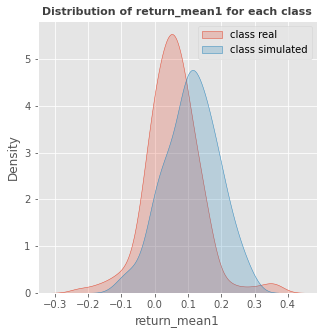

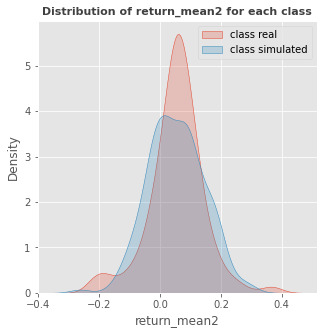

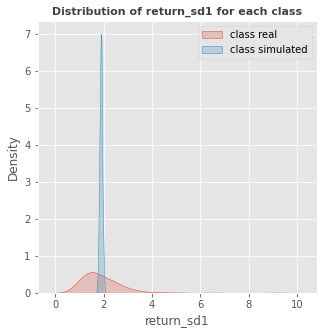

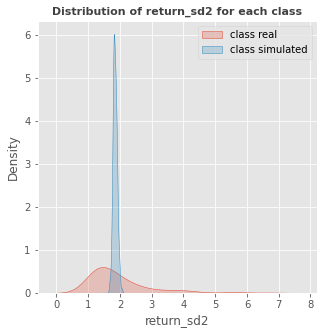

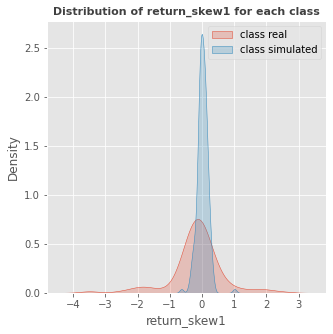

...

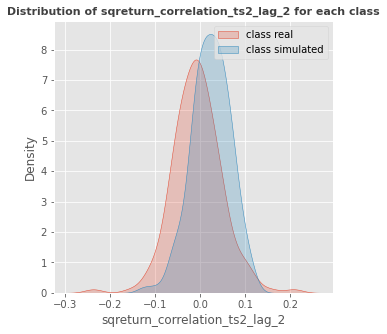

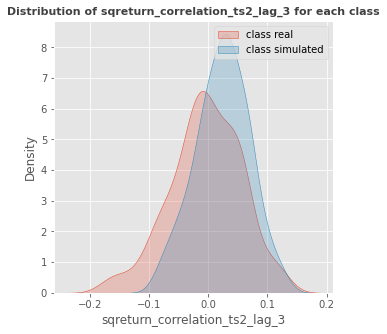

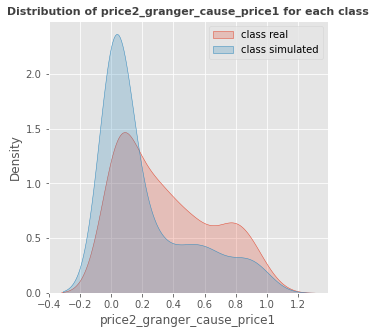

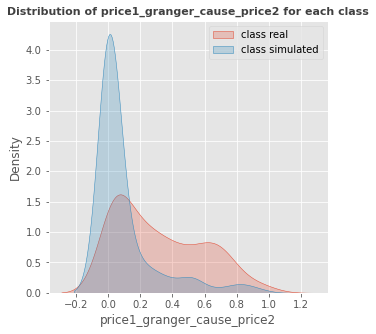

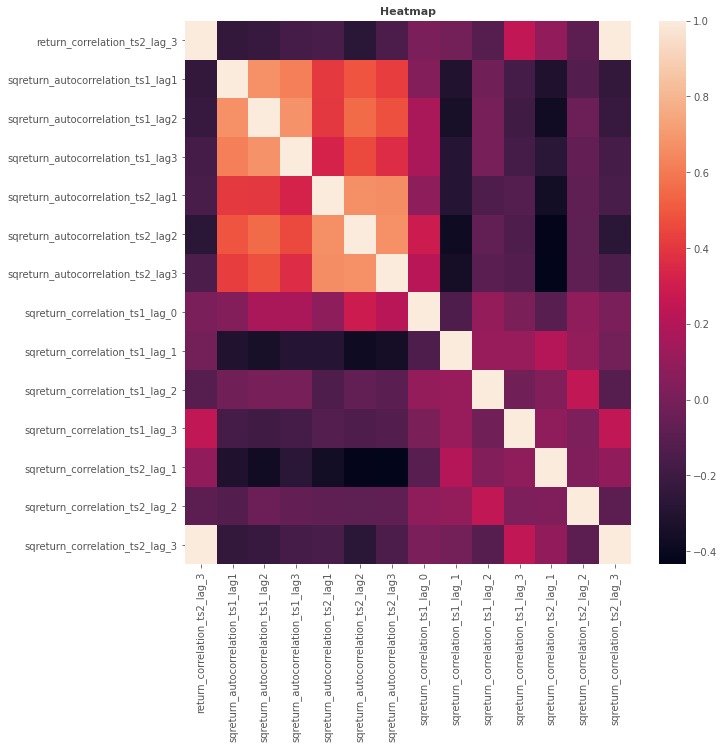

In [14]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")

In [15]:
random_seed = 9868
real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")

n_sim_jumpou_log_prices = n_jumpou_simulation(
    random_seed=random_seed, num_sim=248,
    mu11=params[0], mu12=params[1], 
    mu21=params[2], mu22=params[3], 
    sigma11=params[4], sigma12=params[5], 
    sigma21=params[6], sigma22=params[7],
    j11=params[8], j12=params[9], 
    j21=params[10], j22=params[11],
    alpha=params[12], 
    beta1=beta1, beta2=beta2, 
    delta0=params[13], 
    mu1=params[14], mu2=params[15], 
    lambda11=params[16], lambda12=lambda12, 
    lambda21=lambda21, lambda22=1/params[16],
    xinit_vec=xinit_vec, T0=T0, T=T, length=length)

n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")


simulated_statistics = create_statistics(
    label="simulated", 
    rolling_window=20, 
    return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
    price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


dataset = pd.concat([real_statistics, simulated_statistics])
X = dataset.iloc[:, 0:36]
y = dataset.iloc[:, 36]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
automl = AutoML(eval_metric='accuracy')
automl.fit(X_train, y_train)
predictions = automl.predict(X_test)
accuracy_result = accuracy_score(y_test, predictions)

print(f"Accuracy of predictions:  {accuracy_result:.3f}")


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4071  , p=0.2399  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.2815  , p=0.2326  , df=3
likelihood ratio test: chi2=4.2632  , p=0.2344  , df=3
parameter F test:         F=1.4071  , p=0.2399  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6382  , p=0.1796  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.9850  , p=0.1729  , df=3
likelihood ratio test: chi2=4.9601  , p=0.1747  , df=3
parameter F test:         F=1.6382  , p=0.1796  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7299  , p=0.4825  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.4746  , p=0.4784  , df=2
likelihood ratio test: chi2=1.4724  , p=0.4789  , df=2
parameter F test:         F=0.7299  , p=0.4825  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6513  , p=0.5218  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8855  , p=0.3471  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8909  , p=0.3452  , df=1
likelihood ratio test: chi2=0.8901  , p=0.3455  , df=1
parameter F test:         F=0.8855  , p=0.3471  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7701  , p=0.3806  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7748  , p=0.3787  , df=1
likelihood ratio test: chi2=0.7742  , p=0.3789  , df=1
parameter F test:         F=0.7701  , p=0.3806  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3677  , p=0.8317  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=1.4978  , p=0.8270  , df=4
likelihood ratio test: chi2=1.4956  , p=0.8274  , df=4
parameter F test:         F=0.3677  , p=0.8317  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.8695  , p=0.1146  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5593  , p=0.5720  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1299  , p=0.5684  , df=2
likelihood ratio test: chi2=1.1286  , p=0.5688  , df=2
parameter F test:         F=0.5593  , p=0.5720  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3638  , p=0.6952  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.7349  , p=0.6925  , df=2
likelihood ratio test: chi2=0.7344  , p=0.6927  , df=2
parameter F test:         F=0.3638  , p=0.6952  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0002  , p=0.9886  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0002  , p=0.9885  , df=1
likelihood ratio test: chi2=0.0002  , p=0.9885  , df=1
parameter F test:         F=0.0002  , p=0.9886  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2422  , p=0.6228  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0699 , p=0.0016  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=10.1308 , p=0.0015  , df=1
likelihood ratio test: chi2=10.0293 , p=0.0015  , df=1
parameter F test:         F=10.0699 , p=0.0016  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1132  , p=0.7366  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1139  , p=0.7357  , df=1
likelihood ratio test: chi2=0.1139  , p=0.7357  , df=1
parameter F test:         F=0.1132  , p=0.7366  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3763  , p=0.0131  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.8414  , p=0.0120  , df=2
likelihood ratio test: chi2=8.7639  , p=0.0125  , df=2
parameter F test:         F=4.3763  , p=0.0131  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6758  , p=0.0260  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3529  , p=0.5527  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3551  , p=0.5513  , df=1
likelihood ratio test: chi2=0.3549  , p=0.5513  , df=1
parameter F test:         F=0.3529  , p=0.5527  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6498  , p=0.4206  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6538  , p=0.4188  , df=1
likelihood ratio test: chi2=0.6533  , p=0.4189  , df=1
parameter F test:         F=0.6498  , p=0.4206  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=11.6676 , p=0.0086  , df=3
likelihood ratio test: chi2=11.5328 , p=0.0092  , df=3
parameter F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1800  , p=0.3168  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3409  , p=0.0137  , df_denom=472, df_num=9
ssr based chi2 test:   chi2=21.9160 , p=0.0091  , df=9
likelihood ratio test: chi2=21.4410 , p=0.0108  , df=9
parameter F test:         F=2.3409  , p=0.0137  , df_denom=472, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7654  , p=0.6486  , df_denom=472, df_num=9
ssr based chi2 test:   chi2=7.1660  , p=0.6198  , df=9
likelihood ratio test: chi2=7.1142  , p=0.6252  , df=9
parameter F test:         F=0.7654  , p=0.6486  , df_denom=472, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.6094  , p=0.4472  , df=2
likelihood ratio test: chi2=1.6068  , p=0.4478  , df=2
parameter F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0710  , p=0.0176  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1081  , p=0.5746  , df=2
likelihood ratio test: chi2=1.1068  , p=0.5750  , df=2
parameter F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.7103  , p=0.0094  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=9.5161  , p=0.0086  , df=2
likelihood ratio test: chi2=9.4263  , p=0.0090  , df=2
parameter F test:         F=4.7103  , p=0.0094  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6434  , p=0.0269  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.3607  , p=0.0252  , df=2
likelihood ratio test: chi2=7.3068  , p=0.0259  , df=2
parameter F test:         F=3.6434  , p=0.0269  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2685  , p=0.0389  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=3.8699  , p=0.7946  , df=7
likelihood ratio test: chi2=3.8547  , p=0.7963  , df=7
parameter F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=16.0565 , p=0.0246  , df=7
likelihood ratio test: chi2=15.8005 , p=0.0270  , df=7
parameter F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7863  , p=0.3752  , df=1
likelihood ratio test: chi2=0.7856  , p=0.3754  , df=1
parameter F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1180  , p=0.1462  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=14.1450 , p=0.0781  , df=8
likelihood ratio test: chi2=13.9455 , p=0.0832  , df=8
parameter F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6345  , p=0.1125  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=13.5437 , p=0.0945  , df=8
likelihood ratio test: chi2=13.3606 , p=0.1000  , df=8
parameter F test:         F=1.6345  , p=0.1125  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5123  , p=0.5994  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.0350  , p=0.5960  , df=2
likelihood ratio test: chi2=1.0339  , p=0.5963  , df=2
parameter F test:         F=0.5123  , p=0.5994  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1450  , p=0.0164  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.8352  , p=0.1755  , df=1
likelihood ratio test: chi2=1.8318  , p=0.1759  , df=1
parameter F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3090  , p=0.5785  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3109  , p=0.5771  , df=1
likelihood ratio test: chi2=0.3108  , p=0.5772  , df=1
parameter F test:         F=0.3090  , p=0.5785  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4018  , p=0.2370  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4103  , p=0.2350  , df=1
likelihood ratio test: chi2=1.4083  , p=0.2353  , df=1
parameter F test:         F=1.4018  , p=0.2370  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7914  , p=0.3741  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6655  , p=0.1975  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.6756  , p=0.1955  , df=1
likelihood ratio test: chi2=1.6728  , p=0.1959  , df=1
parameter F test:         F=1.6655  , p=0.1975  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1818  , p=0.2775  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.1890  , p=0.2755  , df=1
likelihood ratio test: chi2=1.1876  , p=0.2758  , df=1
parameter F test:         F=1.1818  , p=0.2775  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0367  , p=0.0253  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=5.0672  , p=0.0244  , df=1
likelihood ratio test: chi2=5.0416  , p=0.0247  , df=1
parameter F test:         F=5.0367  , p=0.0253  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0169  , p=0.8968  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5144  , p=0.4732  , df=1
likelihood ratio test: chi2=0.5141  , p=0.4733  , df=1
parameter F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1756  , p=0.6752  , df=1
likelihood ratio test: chi2=0.1756  , p=0.6752  , df=1
parameter F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8579  , p=0.3543  , df=1
likelihood ratio test: chi2=0.8571  , p=0.3545  , df=1
parameter F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1165  , p=0.7330  

ssr based F test:         F=0.3113  , p=0.5771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3132  , p=0.5757  , df=1
likelihood ratio test: chi2=0.3131  , p=0.5758  , df=1
parameter F test:         F=0.3113  , p=0.5771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4801  , p=0.2243  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4891  , p=0.2224  , df=1
likelihood ratio test: chi2=1.4869  , p=0.2227  , df=1
parameter F test:         F=1.4801  , p=0.2243  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3129  , p=0.5759  , df=1
likelihood ratio test: chi2=0.3128  , p=0.5759  , df=1
parameter F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5424  , p=0.1115  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.5578  , p=0.1098  , df=1
likelihood ratio test: chi2=2.5512  , p=0.1102  , df=1
parameter F test:         F=2.5424  , p=0.1115  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1897  , p=0.6634  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1908  , p=0.6622  , df=1
likelihood ratio test: chi2=0.1908  , p=0.6622  , df=1
parameter F test:         F=0.1897  , p=0.6634  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7344  , p=0.1885  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.7449  , p=0.1865  , df=1
likelihood ratio test: chi2=1.7418  , p=0.1869  , df=1
parameter F test:         F=1.7344  , p=0.1885  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5370  , p=0.4640  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.9437  , p=0.2676  , df=3
likelihood ratio test: chi2=3.9281  , p=0.2693  , df=3
parameter F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=2.5160  , p=0.4724  , df=3
likelihood ratio test: chi2=2.5096  , p=0.4736  , df=3
parameter F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=7.1806  , p=0.4103  , df=7
likelihood ratio test: chi2=7.1288  , p=0.4156  , df=7
parameter F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0907  , p=0.3679  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6220  , p=0.1834  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.9355  , p=0.1766  , df=3
likelihood ratio test: chi2=4.9111  , p=0.1784  , df=3
parameter F test:         F=1.6220  , p=0.1834  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8312  , p=0.0379  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=8.6149  , p=0.0349  , df=3
likelihood ratio test: chi2=8.5411  , p=0.0361  , df=3
parameter F test:         F=2.8312  , p=0.0379  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0978  , p=0.2947  , df=1
likelihood ratio test: chi2=1.0966  , p=0.2950  , df=1
parameter F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6270  , p=0.1057  

likelihood ratio test: chi2=5.7506  , p=0.0564  , df=2
parameter F test:         F=2.8630  , p=0.0580  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.3806  , p=0.0096  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=13.7719 , p=0.0081  , df=4
likelihood ratio test: chi2=13.5846 , p=0.0087  , df=4
parameter F test:         F=3.3806  , p=0.0096  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3756  , p=0.8261  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.5301  , p=0.8213  , df=4
likelihood ratio test: chi2=1.5277  , p=0.8217  , df=4
parameter F test:         F=0.3756  , p=0.8261  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6354  , p=0.0727  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.3242  , p=0.0698  , df=2
likelihood ratio test: chi2=5.2960  , p=0.0708  , df=2
parameter F test:         F=2.6354  , p


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.0768 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.1436 , p=0.0008  , df=1
likelihood ratio test: chi2=11.0213 , p=0.0009  , df=1
parameter F test:         F=11.0768 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2433  , p=0.6220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2448  , p=0.6208  , df=1
likelihood ratio test: chi2=0.2447  , p=0.6208  , df=1
parameter F test:         F=0.2433  , p=0.6220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6710  , p=0.6123  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.7337  , p=0.6033  , df=4
likelihood ratio test: chi2=2.7262  , p=0.6046  , df=4
parameter F test:         F=0.6710  , p=0.6123  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0805  , p=0.0822  

likelihood ratio test: chi2=26.3683 , p=0.0009  , df=8
parameter F test:         F=3.2690  , p=0.0012  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.5159  , p=0.0000  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=37.4175 , p=0.0000  , df=8
likelihood ratio test: chi2=36.0655 , p=0.0000  , df=8
parameter F test:         F=4.5159  , p=0.0000  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1868  , p=0.8296  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3775  , p=0.8280  , df=2
likelihood ratio test: chi2=0.3773  , p=0.8281  , df=2
parameter F test:         F=0.1868  , p=0.8296  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9657  , p=0.0196  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0116  , p=0.0182  , df=2
likelihood ratio test: chi2=7.9480  , p=0.0188  , df=2
parameter F test:         F=3.9657  , p


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.1608  , p=0.0004  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.7460 , p=0.0003  , df=3
likelihood ratio test: chi2=18.4018 , p=0.0004  , df=3
parameter F test:         F=6.1608  , p=0.0004  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.5206 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=38.0972 , p=0.0000  , df=3
likelihood ratio test: chi2=36.7103 , p=0.0000  , df=3
parameter F test:         F=12.5206 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5959  , p=0.0105  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.6358  , p=0.0100  , df=1
likelihood ratio test: chi2=6.5921  , p=0.0102  , df=1
parameter F test:         F=6.5959  , p=0.0105  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6367  , p=0.4253  

ssr based F test:         F=2.6965  , p=0.1012  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7128  , p=0.0995  , df=1
likelihood ratio test: chi2=2.7055  , p=0.1000  , df=1
parameter F test:         F=2.6965  , p=0.1012  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9379 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.0221 , p=0.0002  , df=1
likelihood ratio test: chi2=13.8290 , p=0.0002  , df=1
parameter F test:         F=13.9379 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0002  , p=0.9876  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0002  , p=0.9875  , df=1
likelihood ratio test: chi2=0.0002  , p=0.9875  , df=1
parameter F test:         F=0.0002  , p=0.9876  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1767  , p=0.3195  , df_denom=485, df_num=5
ssr based chi2 test: 

parameter F test:         F=5.9896  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1613  , p=0.6881  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1623  , p=0.6871  , df=1
likelihood ratio test: chi2=0.1623  , p=0.6871  , df=1
parameter F test:         F=0.1613  , p=0.6881  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2353  , p=0.0043  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2850  , p=0.0040  , df=1
likelihood ratio test: chi2=8.2171  , p=0.0041  , df=1
parameter F test:         F=8.2353  , p=0.0043  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5598  , p=0.7309  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=2.8624  , p=0.7212  , df=5
likelihood ratio test: chi2=2.8542  , p=0.7225  , df=5
parameter F test:         F=0.5598  , p=0.7309  , df_denom=485, df_num=5

Granger Causality
nu


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2657  , p=0.2829  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5571  , p=0.2784  , df=2
likelihood ratio test: chi2=2.5505  , p=0.2794  , df=2
parameter F test:         F=1.2657  , p=0.2829  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.7127  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.6220 , p=0.0001  , df=2
likelihood ratio test: chi2=19.2460 , p=0.0001  , df=2
parameter F test:         F=9.7127  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8852  , p=0.3472  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8905  , p=0.3453  , df=1
likelihood ratio test: chi2=0.8897  , p=0.3455  , df=1
parameter F test:         F=0.8852  , p=0.3472  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.8237 , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0992 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.1964 , p=0.0001  , df=1
likelihood ratio test: chi2=15.9396 , p=0.0001  , df=1
parameter F test:         F=16.0992 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3411  , p=0.5595  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3431  , p=0.5580  , df=1
likelihood ratio test: chi2=0.3430  , p=0.5581  , df=1
parameter F test:         F=0.3411  , p=0.5595  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7315  , p=0.1781  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4980  , p=0.1739  , df=2
likelihood ratio test: chi2=3.4858  , p=0.1750  , df=2
parameter F test:         F=1.7315  , p=0.1781  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1444  , p=0.3193  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0776  , p=0.3718  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.5104  , p=0.3568  , df=5
likelihood ratio test: chi2=5.4800  , p=0.3601  , df=5
parameter F test:         F=1.0776  , p=0.3718  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.8190  , p=0.0021  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.5278 , p=0.0015  , df=5
likelihood ratio test: chi2=19.1532 , p=0.0018  , df=5
parameter F test:         F=3.8190  , p=0.0021  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2543  , p=0.2633  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2619  , p=0.2613  , df=1
likelihood ratio test: chi2=1.2603  , p=0.2616  , df=1
parameter F test:         F=1.2543  , p=0.2633  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3496 , p=0.0000  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.5514  , p=0.0005  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=29.4257 , p=0.0003  , df=8
likelihood ratio test: chi2=28.5810 , p=0.0004  , df=8
parameter F test:         F=3.5514  , p=0.0005  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.2553  , p=0.0001  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=35.2581 , p=0.0000  , df=8
likelihood ratio test: chi2=34.0544 , p=0.0000  , df=8
parameter F test:         F=4.2553  , p=0.0001  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3849  , p=0.0210  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=17.2174 , p=0.0160  , df=7
likelihood ratio test: chi2=16.9242 , p=0.0179  , df=7
parameter F test:         F=2.3849  , p=0.0210  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2920  , p=0.0264  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1103  , p=0.7399  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1110  , p=0.7390  , df=1
likelihood ratio test: chi2=0.1110  , p=0.7390  , df=1
parameter F test:         F=0.1103  , p=0.7399  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.2545 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.3285 , p=0.0004  , df=1
likelihood ratio test: chi2=12.1790 , p=0.0005  , df=1
parameter F test:         F=12.2545 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.6662  , p=0.0032  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.1981 , p=0.0026  , df=3
likelihood ratio test: chi2=13.9995 , p=0.0029  , df=3
parameter F test:         F=4.6662  , p=0.0032  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3601  , p=0.0001  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5307  , p=0.6614  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.6147  , p=0.6561  , df=3
likelihood ratio test: chi2=1.6121  , p=0.6567  , df=3
parameter F test:         F=0.5307  , p=0.6614  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.0281  , p=0.0019  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=15.2994 , p=0.0016  , df=3
likelihood ratio test: chi2=15.0691 , p=0.0018  , df=3
parameter F test:         F=5.0281  , p=0.0019  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1531  , p=0.0241  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.1561 , p=0.0170  , df=9
likelihood ratio test: chi2=19.7542 , p=0.0195  , df=9
parameter F test:         F=2.1531  , p=0.0241  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.1472  , p=0.0011  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1646  , p=0.6851  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1656  , p=0.6840  , df=1
likelihood ratio test: chi2=0.1656  , p=0.6841  , df=1
parameter F test:         F=0.1646  , p=0.6851  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8224  , p=0.1776  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8334  , p=0.1757  , df=1
likelihood ratio test: chi2=1.8300  , p=0.1761  , df=1
parameter F test:         F=1.8224  , p=0.1776  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=10.7846 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=43.9339 , p=0.0000  , df=4
likelihood ratio test: chi2=42.0994 , p=0.0000  , df=4
parameter F test:         F=10.7846 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.0962  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3289  , p=0.0041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3792  , p=0.0038  , df=1
likelihood ratio test: chi2=8.3097  , p=0.0039  , df=1
parameter F test:         F=8.3289  , p=0.0041  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4061  , p=0.5242  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4086  , p=0.5227  , df=1
likelihood ratio test: chi2=0.4084  , p=0.5228  , df=1
parameter F test:         F=0.4061  , p=0.5242  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1457  , p=0.7028  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1466  , p=0.7018  , df=1
likelihood ratio test: chi2=0.1466  , p=0.7018  , df=1
parameter F test:         F=0.1457  , p=0.7028  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.9840 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5659  , p=0.2099  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.1634  , p=0.2056  , df=2
likelihood ratio test: chi2=3.1534  , p=0.2067  , df=2
parameter F test:         F=1.5659  , p=0.2099  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.4295  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=17.0297 , p=0.0002  , df=2
likelihood ratio test: chi2=16.7455 , p=0.0002  , df=2
parameter F test:         F=8.4295  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4725  , p=0.0038  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.5237  , p=0.0035  , df=1
likelihood ratio test: chi2=8.4518  , p=0.0036  , df=1
parameter F test:         F=8.4725  , p=0.0038  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5335  , p=0.0063  

AutoML directory: AutoML_62
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 34.89 seconds
2_DecisionTree accuracy 0.931034 trained in 10.84 seconds
3_Linear accuracy 0.977011 trained in 3.09 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 3.41 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 1.59 seconds
6_Default_RandomForest accuracy 0.988506 trained in 6.54 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.17 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 70.57 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.919


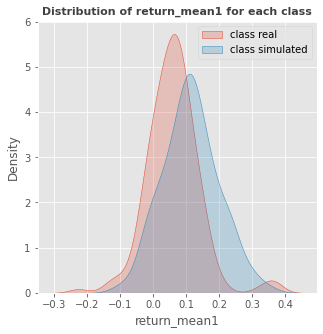

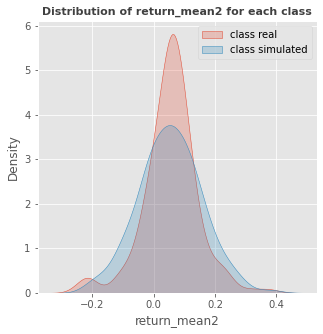

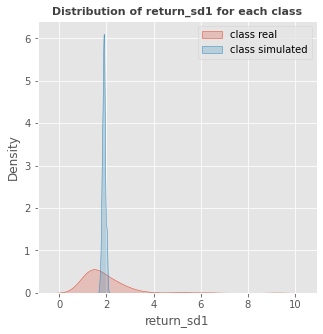

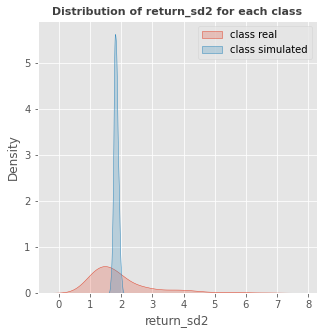

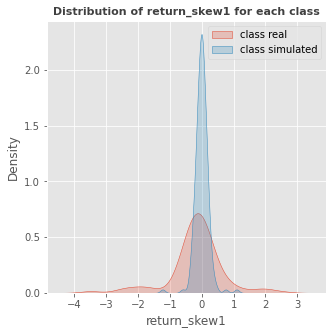

...

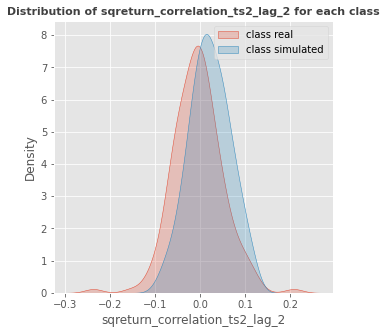

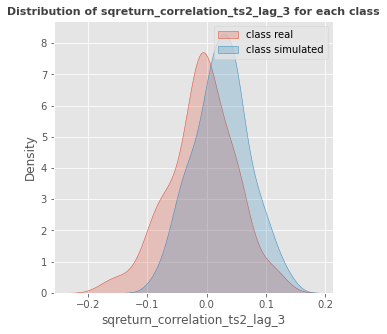

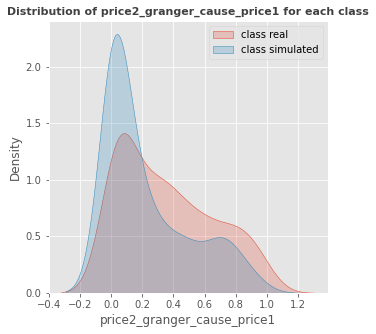

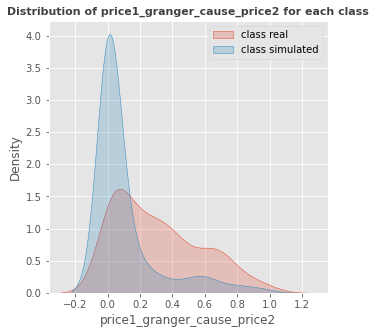

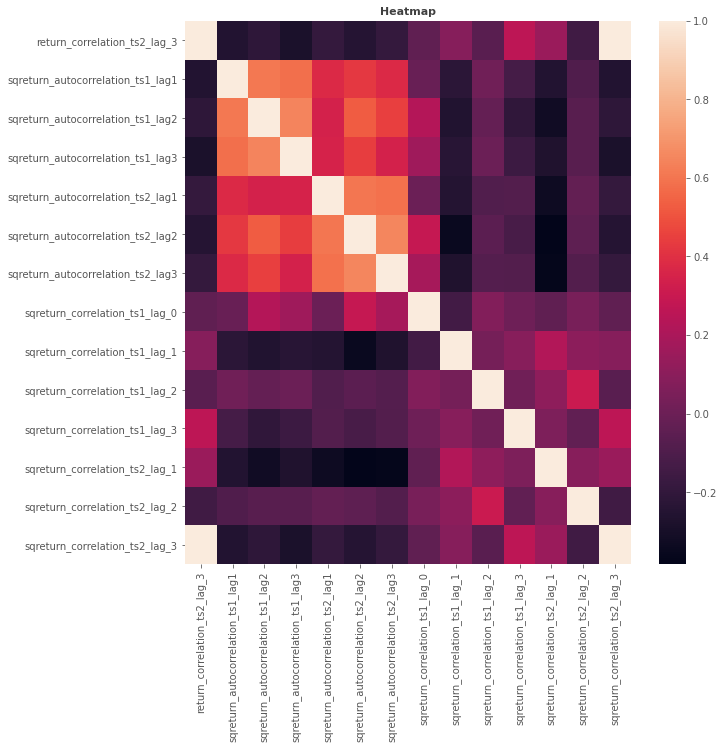

In [16]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump_2")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump_2")